In [ ]:
!pip install pybedtools
!pip install Bio

In [ ]:
from Bio import SeqIO
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt
import pybedtools
import matplotlib.pyplot as plt
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.parallel
import torch.utils.data
from torchsummary import summary
import logging
from torch import autograd
from torch import optim
import pprint
from sklearn.neighbors import KDTree
from sklearn.neighbors import NearestNeighbors
import editdistance
import argparse
import json
import datetime
import pickle as pk
from sklearn import metrics
from torch.utils.data import TensorDataset, DataLoader

In [ ]:
codes = {
 'A': [1., 0., 0., 0., 0.],
 'T': [0., 1., 0., 0., 0.],
 'G': [0., 0., 1., 0., 0.],
 'C': [0., 0., 0., 1., 0.],
 'N': [0., 0., 0., 0., 1.],
 }

In [ ]:
def KL_divergence(real: pd.Series, generated: pd.Series) -> torch.Tensor:
    """
    This function encapsulates the logic of evaluating the KL divergence metric
    between two sequences.
    Returns
    -------
    kl_divergence: Float
      The KL divergence between the input and output (generated)
      sequences' distribution
    """

    kl_pq = rel_entr(real, generated)
    return np.sum(kl_pq)

In [ ]:
def diversity(
    generated, real, scoring_metric=KL_divergence, plot_motif_probs=False
):
    """
    This function encapsulates the logic of evaluating the difference between the distribution
    of frequencies between generated (diffusion/df_motifs_a) and the input (training/df_motifs_b) for an arbitrary metric ("motif_scoring_metric")

    Please note that some metrics, like KL_divergence, are not metrics in official sense. Reason
    for that is that they dont satisfy certain properties, such as in KL case, the simmetry property.
    Hence it makes a big difference what are the positions of input.
    """
    set_all_data = set(generated.index.values.tolist() + real.index.values.tolist())
    create_new_matrix = []
    for x in set_all_data:
        list_in = []
        list_in.append(x)  # adding the name
        if x in generated.index:
            list_in.append(generated.loc[x][0])
        else:
            list_in.append(1)

        if x in real.index:
            list_in.append(real.loc[x][0])
        else:
            list_in.append(1)

        create_new_matrix.append(list_in)

    df_kl = pd.DataFrame(create_new_matrix, columns=['Flipon', 'generated', 'real'])

    df_kl['Generated_seqs'] = df_kl['generated'] / df_kl['generated'].sum()
    df_kl['Training_seqs'] = df_kl['real'] / df_kl['real'].sum()
    plt.rcParams["figure.figsize"] = (3, 3)
    sns.regplot(x='Generated_seqs', y='Training_seqs', data=df_kl)
    plt.xlabel('Generated_seqs')
    plt.ylabel('Training Seqs')
    plt.title('Motifs Probs')
    plt.show()

    return scoring_metric(df_kl['Genereated_seqs'].values, df_kl['Training_seqs'].values)

In [ ]:
def one_hot_encoding(sequence, target_length):
    """Convert DNA sequence to one-hot encoding."""
    nucleotides = {'A': 0, 'C': 1, 'G': 2, 'T': 3}
    one_hot_seq = np.zeros((target_length, len(nucleotides)))

    for i, nucleotide in enumerate(sequence[:target_length]):
        if nucleotide in nucleotides:
            one_hot_seq[i, nucleotides[nucleotide]] = 1

    # Flatten the one-hot encoding to a 1D vector
    one_hot_flat = one_hot_seq.flatten()

    return one_hot_flat

def preprocess_sequences(sequences, target_length):
    """Pad or truncate sequences to the target length."""
    return [seq.ljust(target_length, 'N')[:target_length] for seq in sequences]

def calculate_diversity_optimized_one_hot(dataset, target_length):
    """Calculate diversity within a single dataset using KDTree and one-hot encoding."""
    diversity = 0.0
    total_pairs = 0

    sequences = preprocess_sequences(dataset, target_length)

    sequences_one_hot = [one_hot_encoding(seq, target_length) for seq in sequences]

    kdtree = KDTree(sequences_one_hot)

    for i, seq_i in enumerate(sequences_one_hot):
        for j, seq_j in enumerate(sequences_one_hot):
            if i != j:

                edit_dist_ij = editdistance.eval(seq_i, seq_j)
                diversity += edit_dist_ij
                total_pairs += 1

    if total_pairs > 0:
        diversity /= total_pairs

    return diversity

In [ ]:
def one_hot_encoding(sequence, target_length):
    """Convert DNA sequence to one-hot encoding."""
    nucleotides = {'A': 0, 'C': 1, 'G': 2, 'T': 3}
    one_hot_seq = np.zeros((target_length, len(nucleotides)))

    for i, nucleotide in enumerate(sequence[:target_length]):
        if nucleotide in nucleotides:
            one_hot_seq[i, nucleotides[nucleotide]] = 1

    # Flatten the one-hot encoding to a 1D vector
    one_hot_flat = one_hot_seq.flatten()

    return one_hot_flat

def preprocess_sequences(sequences, target_length):
    """Pad or truncate sequences to the target length."""
    return [seq.ljust(target_length, 'N')[:target_length] for seq in sequences]

def calculate_novelty_optimized_one_hot(generated_sequences, initial_sequences, target_length):
    """Calculate novelty of the generated sequences using KDTree and one-hot encoding."""
    novelty = 0.0
    total_pairs = 0

    initial_sequences = preprocess_sequences(initial_sequences, target_length)
    generated_sequences = preprocess_sequences(generated_sequences, target_length)

    initial_sequences_one_hot = [one_hot_encoding(seq, target_length) for seq in initial_sequences]
    generated_sequences_one_hot = [one_hot_encoding(seq, target_length) for seq in generated_sequences]

    kdtree = KDTree(initial_sequences_one_hot)

    for gen_seq_one_hot in generated_sequences_one_hot:

        distance, _ = kdtree.query(gen_seq_one_hot)
        novelty += distance
        total_pairs += 1

    if total_pairs > 0:
        novelty /= total_pairs

    return novelty

# Model

In [ ]:
class ResBlock(nn.Module):
    def __init__(self, model_size):
        super(ResBlock, self).__init__()
        self.res_block = nn.Sequential(nn.ReLU(True),
                                       nn.Conv1d(model_size, model_size, 5, padding=2),
                                       nn.ReLU(True), nn.Conv1d(model_size, model_size, 5, padding=2))

    def forward(self, input):
        output = self.res_block(input)
        return input + 0.3 * output


class WGANGenerator(nn.Module):
    def __init__(
            self,
            model_size,
            seq_len,
            onehot_len,
            last_channel_is_prob=False,
    ):
        super(WGANGenerator, self).__init__()

        self.model_size = model_size
        self.seq_len = 512
        self.onehot_len = onehot_len
        self.last_channel_is_prob = last_channel_is_prob
        self.fc1 = nn.Linear(128, self.model_size * self.seq_len)
        self.block = nn.Sequential(ResBlock(self.model_size),
                                   ResBlock(self.model_size),
                                   ResBlock(self.model_size),
                                   ResBlock(self.model_size),
                                   ResBlock(self.model_size))
        self.conv1 = nn.Conv1d(self.model_size, self.onehot_len, 1)
        self.softmax = nn.Softmax(dim=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, noise):
        output = self.fc1(noise)
        output = output.view(-1, self.model_size, self.seq_len)
        output = self.block(output)
        output = self.conv1(output)
        output = output.transpose(1, 2)
        shape = output.size()
        output = output.contiguous()
        output = output.view(noise.shape[0] * self.seq_len, -1)
        prob_channel = output.shape[-1]
        if self.last_channel_is_prob:
            prob_channel = -1
            output1 = self.softmax(output[:, :prob_channel])
            output2 = self.sigmoid(output[:, prob_channel]).view(output.shape[0], 1)
            output = torch.cat((output1, output2), 1)
        else:
            output = self.softmax(output)
        return output.view(shape)


class WGANDiscriminator(nn.Module):
    def __init__(
            self,
            model_size,
            seq_len,
            onehot_len,
    ):
        super(WGANDiscriminator, self).__init__()
        self.model_size = model_size
        self.seq_len = 512
        self.onehot_len = onehot_len
        self.block = nn.Sequential(ResBlock(self.model_size),
                                   ResBlock(self.model_size),
                                   ResBlock(self.model_size),
                                   ResBlock(self.model_size),
                                   ResBlock(self.model_size))
        self.conv1d = nn.Conv1d(self.onehot_len, self.model_size, 1)
        self.linear = nn.Linear(self.seq_len * self.model_size, 1)

    def forward(self, input):
        output = input.transpose(1, 2)
        output = self.conv1d(output)
        output = self.block(output)
        output = output.view(-1, self.seq_len * self.model_size)
        output = self.linear(output)
        return output


def load_wgan_generator(
    filepath,
    model_size=64,
    num_channels=6,
    latent_dim=100,
    post_proc_filt_len=512,
    upsample=True,
    last_channel_is_prob=True,
    **kwargs
):
    model = WGANGenerator(
        model_size=model_size,
        seq_len=post_proc_filt_len,
        onehot_len=num_channels,
        last_channel_is_prob=last_channel_is_prob,
    )
    model.load_state_dict(torch.load(filepath))
    return model


def load_wgan_discriminator(
        filepath,
        model_size=64,
        ngpus=1,
        num_channels=6,
        shift_factor=2,
        alpha=0.2,
        **kwargs
):
    model = WGANDiscriminator(model_size=model_size, ngpus=ngpus, num_channels=num_channels,
                               shift_factor=shift_factor, alpha=alpha)
    model.load_state_dict(torch.load(filepath))
    return model


# Save samles method
def save_samples(
        epoch_samples,
        epoch,
        output_dir,
        model_gen,
        model_dis,
        last_channel_is_prob=True,
):
    """
 Save output samples to disk
 """
    sample_dir = output_dir
    if not os.path.exists(sample_dir):
        os.makedirs(sample_dir)
    samples = np.array(epoch_samples)
    if last_channel_is_prob:
        labels = np.take(samples, -1, axis=2)
        samples = np.delete(samples, -1, axis=2)
    seq = np.argmax(samples, axis=2)
    df = pd.DataFrame(np.take(np.array(list(codes.keys())),
                              indices=seq))
    res = []
    for i in range(len(seq)):
        res.append(np.array(df.iloc[i]))
        if last_channel_is_prob:
            res.append(labels[i])
    res_df = pd.DataFrame(res)
    print(res_df)
    res_path = os.path.join(sample_dir, '{}.csv'.format(epoch))
    res_df.to_csv(res_path, index=False)
    # save model
    model_gen_output_path = os.path.join(sample_dir,
                                         'model_gen_last.pkl')
    model_dis_output_path = os.path.join(sample_dir,
                                         'model_dis_last.pkl')
    torch.save(model_gen.state_dict(), model_gen_output_path,
               pickle_protocol=pk.HIGHEST_PROTOCOL)
    torch.save(model_dis.state_dict(), model_dis_output_path,
               pickle_protocol=pk.HIGHEST_PROTOCOL)


# Wasserstain training process
LOGGER = logging.getLogger('g4gan')
LOGGER.setLevel(logging.DEBUG)


def compute_discr_loss_terms(
        model_dis,
        model_gen,
        real_data_v,
        noise_v,
        batch_size,
        latent_dim,
        lmbda,
        use_cuda,
        use_binary_mask,
        mask_v,
        p_mask,
        compute_grads=False,
        last_channel_is_prob=True,
):
    # Convenient values for
    one = torch.tensor(1, dtype=torch.float)
    neg_one = one * -1
    if use_cuda:
        one = one.cuda()
        neg_one = neg_one.cuda()
    # Reset gradients
    model_dis.zero_grad()
    # Apply binary mask to real data
    if use_binary_mask:
        real_data_v = real_data_v  *  mask_v * (1 / p_mask)
        if use_cuda:
            real_data_v = real_data_v.cuda()
        real_data_v = autograd.Variable(real_data_v)
    # a) Compute loss contribution from real training data and backprop
    # (negative of the empirical mean, w.r.t. the data distribution, of the discr.output)
    D_real = model_dis(real_data_v)
    D_real = D_real.mean()
    # Negate since we want to _maximize_ this quantity
    if compute_grads:
        D_real.backward(neg_one)
    # b) Compute loss contribution from generated data and backprop
    # (empirical mean, w.r.t. the generator distribution, of the discr. output)
    # Generate noise in latent space
    # Generate data by passing noise through the generator
    fake = autograd.Variable(model_gen(noise_v).data)
    inputv = fake
    # Apply binary mask to fake data
    if use_binary_mask:
        inputv = inputv *  mask_v * (1 / p_mask)
        if use_cuda:
            inputv = inputv.cuda()
        inputv = autograd.Variable(inputv)
    D_fake = model_dis(inputv)
    D_fake = D_fake.mean()
    if compute_grads:
        D_fake.backward(one)
    # c) Compute gradient penalty and backprop
    gradient_penalty = calc_gradient_penalty(model_dis,
                                             real_data_v.data,
                                             fake.data,
                                             batch_size,
                                             lmbda,
                                             use_cuda=use_cuda,
                                             )
    if compute_grads:
        gradient_penalty.backward(one)
    # Compute metrics and record in batch history
    D_cost = D_fake - D_real + gradient_penalty
    Wasserstein_D = D_real - D_fake
    return (D_cost, Wasserstein_D)


def compute_gener_loss_terms(
        model_dis,
        model_gen,
        batch_size,
        latent_dim,
        use_cuda,
        use_binary_mask,
        mask_v,
        p_mask,
        compute_grads=False,
        last_channel_is_prob=True,
):
    # Convenient values for
    one = torch.tensor(1, dtype=torch.float)
    neg_one = one * -1
    if use_cuda:
        one = one.cuda()
        neg_one = neg_one.cuda()
    # Reset generator gradients
    model_gen.zero_grad()
    # Sample from the generator
    noise = torch.Tensor(batch_size, latent_dim).uniform_(-1, 1)
    if use_cuda:
        noise = noise.cuda()
    noise_v = autograd.Variable(noise)
    fake = model_gen(noise_v)
    # Apply binary mask to fake data
    if use_binary_mask:
        fake = fake  * mask_v * (1 / p_mask)
    if use_cuda:
        fake = fake.cuda()
    # Compute generator loss and backprop
    # (negative of empirical mean (w.r.t generator distribution) of discriminator
    G = model_dis(fake)
    G = G.mean()

    if compute_grads:
        G.backward(neg_one)
    G_cost = -G
    return G_cost


def np_to_input_var(data, use_cuda):
    data = torch.Tensor(data)
    if use_cuda:
        data = data.cuda()
    return autograd.Variable(data)


# Adapted from https://github.com/caogang/wgan-gp/blob/master/gan_toy.py
def calc_gradient_penalty(
        model_dis,
        real_data,
        fake_data,
        batch_size,
        lmbda,
        use_cuda=True,
):
    # Compute interpolation factors
    alpha = torch.rand(batch_size, 1, 1)
    alpha = alpha.expand(real_data.size())
    alpha = (alpha.cuda() if use_cuda else alpha)
    # Interpolate between real and fake data
    interpolates = alpha * real_data + (1 - alpha) * fake_data
    if use_cuda:
        interpolates = interpolates.cuda()
    interpolates = autograd.Variable(interpolates, requires_grad=True)
    # Evaluate discriminator
    disc_interpolates = model_dis(interpolates)
    # Obtain gradients of the discriminator with respect to the inputs
    gradients = autograd.grad(
        outputs=disc_interpolates,
        inputs=interpolates,
        grad_outputs=(torch.ones(disc_interpolates.size()).cuda() if use_cuda else
                      torch.ones(disc_interpolates.size())),
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    # Compute MSE between 1.0 and the gradient of the norm penalty to encourage

    # to be a 1-Lipschitz function
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean() \
                       * lmbda
    return gradient_penalty

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def train_wgan(
        model_gen,
        model_dis,
        train_gen,
        valid_gen,
        test_data,
        num_epochs,
        batches_per_epoch,
        batch_size,
        output_dir=None,
        lmbda=0.1,
        use_cuda=True,
        discriminator_updates=5,
        epochs_per_sample=10,
        sample_size=20,
        lr=1e-4,
        beta_1=0.5,
        beta_2=0.9,
        latent_dim=100,
        use_knn_score=False,
        knn_score_sample_size=1000,
        knn_score_real_data=None,
        use_binary_mask=False,
        start_p_mask=1,
        mask_end_epoch=100,
        last_channel_is_prob=True,
):
    if use_cuda:
        model_gen = model_gen.cuda()
        model_dis = model_dis.cuda()
    # Initialize optimizers for each model
    optimizer_gen = optim.Adam(model_gen.parameters(), lr=lr,
                               betas=(beta_1, beta_2))
    optimizer_dis = optim.Adam(model_dis.parameters(), lr=lr,
                               betas=(beta_1, beta_2))
    # Sample noise used for seeing the evolution of generated output samples

    sample_noise = torch.Tensor(sample_size, latent_dim).uniform_(-1, 1)
    if use_cuda:
        sample_noise = sample_noise.cuda()
    sample_noise_v = autograd.Variable(sample_noise)
    samples = {}
    history = []
    plot_history = []
    plot_knn_score_history = []
    train_iter = iter(train_gen)
    valid_iter = iter(valid_gen)
    test_data_v = np_to_input_var(test_data, use_cuda)
    # Sample noise for KNN
    if use_knn_score and knn_score_real_data is not None:
        LOGGER.info('Create KDTree')
        X = np.argmax(knn_score_real_data, 2)

        knn_tree = NearestNeighbors(n_neighbors=2, algorithm='auto',
                                    metric=lambda a, b: \
                                        editdistance.eval(a, b))
        knn_tree.fit(X)
        knn_sample_noise = torch.Tensor(knn_score_sample_size,
                                        latent_dim).uniform_(-1, 1)
        if use_cuda:
            knn_sample_noise = knn_sample_noise.cuda()
        knn_sample_noise_v = autograd.Variable(knn_sample_noise)
        # Score on train data
        (dist, ind) = knn_tree.kneighbors(X[:], 2)
        d_self = np.mean(np.take(dist, 1, axis=1))
        d_train = np.mean(np.take(dist, 0, axis=1))
        LOGGER.info('KNN score on train data:')
        LOGGER.info('D_self: {}'.format(d_self))
        LOGGER.info('D_train: {}'.format(d_train))
        Y = np.argmax(test_data, 2)
        knn_self_tree = NearestNeighbors(n_neighbors=2, algorithm='auto'
                                         , metric=lambda a, b: editdistance.eval(a, b))
        knn_self_tree.fit(Y)
        (dist, ind) = knn_self_tree.kneighbors(Y[:], 2)
        d_self = np.mean(np.take(dist, 1, axis=1))
        (dist, ind) = knn_tree.kneighbors(Y[:], 1)
        d_train = np.mean(np.take(dist, 0, axis=1))
        LOGGER.info('KNN score on test data:')
        LOGGER.info('D_self: {}'.format(d_self))
        LOGGER.info('D_train: {}'.format(d_train))
        best_self_knn_score = 0
    # Set p_mask
    p_mask = None
    mask_v = 0.1
    if use_binary_mask:
        p_mask = start_p_mask
        LOGGER.info('Setup p_mask: {}'.format(p_mask))


    # Loop over the dataset multiple times
    for epoch in range(num_epochs):
        LOGGER.info('Epoch: {}/{}'.format(epoch + 1, num_epochs))
        epoch_history = []
        for batch_idx in range(batches_per_epoch):
            # Set model parameters to require gradients to be computed and stored
            for p in model_dis.parameters():
                p.requires_grad = True
            # Initialize the metrics for this batch
            batch_history = {'discriminator': [], 'generator': {}}
            # Discriminator Training Phase:

            # -> Train discriminator k times
            for iter_d in range(discriminator_updates):
                # Get real examples
                real_data_v = np_to_input_var(next(train_iter),
                                              use_cuda)
                # Get valid examples
                valid_data_v = np_to_input_var(next(valid_iter),
                                               use_cuda)
                # Get noise
                noise = torch.Tensor(batch_size, latent_dim).uniform_(-1, 1)
                if use_cuda:
                    noise = noise.cuda()
                noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
    # Get new batch of real training data
                (D_cost_train, D_wass_train) = compute_discr_loss_terms(
                    model_dis,
                    model_gen,
                    real_data_v,
                    noise_v,
                    batch_size,
                    latent_dim,
                    lmbda,
                    use_cuda,
                    use_binary_mask,
                    mask_v,
                    p_mask,
                    compute_grads=True,
                    last_channel_is_prob=last_channel_is_prob,
                )
                # Update the discriminator
                optimizer_dis.step()
                (D_cost_valid, D_wass_valid) = compute_discr_loss_terms(
                    model_dis,
                    model_gen,
                    valid_data_v,
                    noise_v,
                    batch_size,
                    latent_dim,
                    lmbda,
                    use_cuda,
                    use_binary_mask,
                    mask_v,
                    p_mask,
                    compute_grads=False,
                    last_channel_is_prob=last_channel_is_prob,
                )
                if use_cuda:
                    D_cost_train = D_cost_train.cpu()
                    D_cost_valid = D_cost_valid.cpu()
                    D_wass_train = D_wass_train.cpu()
                    D_wass_valid = D_wass_valid.cpu()

                batch_history['discriminator'].append({
                    'cost': float(D_cost_train.data.numpy()),
                    'wasserstein_cost':
                        float(D_wass_train.data.numpy()),
                    'cost_validation':
                        float(D_cost_valid.data.numpy()),
                    'wasserstein_cost_validation':
                        float(D_wass_valid.data.numpy()),
                })
            # ###########################
            # (2) Update G network
            # ##########################
            # Prevent discriminator from computing gradients, since
            # we are only updating the generator
            for p in model_dis.parameters():
                p.requires_grad = False
            G_cost = compute_gener_loss_terms(
                model_dis,
                model_gen,
                batch_size,
                latent_dim,
                use_cuda,
                use_binary_mask,
                mask_v,
                p_mask,
                compute_grads=True,
                last_channel_is_prob=last_channel_is_prob,
            )
            # Update generator
            optimizer_gen.step()
            if use_cuda:
                G_cost = G_cost.cpu()
            # Record generator loss
            batch_history['generator']['cost'] = \
                float(G_cost.data.numpy())
            # Record batch metrics
            epoch_history.append(batch_history)
      # Update binary mask
        if use_binary_mask:
            next_epoch = epoch + 1
            p_mask = (1 - start_p_mask) / mask_end_epoch * next_epoch \
                    + start_p_mask

            if next_epoch == mask_end_epoch or p_mask > 1.:
                p_mask = 1.
            LOGGER.info('Update p_mask: {}'.format(p_mask))
        # Record epoch metrics
        history.append(epoch_history)
        LOGGER.info(pprint.pformat(epoch_history[-1]))
        # Plot
        plot_history.append(epoch_history[-1]['discriminator'][-1])
        plot_history[-1]['gen_cost'] = epoch_history[-1]['generator'
        ]['cost']
        pd.DataFrame(plot_history).plot()
        plt.show()
    # Calc KNN score
        if use_knn_score and knn_tree is not None:
            LOGGER.info('Calculate KNN score...')
            # Self KNN score (D_self)
            knn_samp_output = model_gen(knn_sample_noise_v)
            if use_cuda:
                knn_samp_output = knn_samp_output.cpu()
            # One hot
            prob_channel = knn_samp_output.shape[2]
            if last_channel_is_prob:
                prob_channel = -1
            (values, indices) = knn_samp_output[:, :, :
                                                      prob_channel].max(2)
            knn_samp_output[:, :, :prob_channel] = 0
            indices = indices.view(indices.shape[0], indices.shape[1],
                                  1)
            knn_samp_output = knn_samp_output.scatter_(2, indices, 1)
            knn_samp_output = knn_samp_output.data.numpy()
            Y = np.argmax(knn_samp_output, 2)
            knn_self_tree = NearestNeighbors(n_neighbors=2,
                                            algorithm='auto', metric=lambda a, b: \
                    editdistance.eval(a, b))
            knn_self_tree.fit(Y)
            (dist, ind) = knn_self_tree.kneighbors(Y[:], 2)
            d_self = np.mean(np.take(dist, 1, axis=1))
            # Train KNN score
            (dist, ind) = knn_tree.kneighbors(Y[:], 1)
            d_train = np.mean(np.take(dist, 0, axis=1))
            # History and plot
            LOGGER.info('D_self: {}'.format(d_self))
            LOGGER.info('D_train: {}'.format(d_train))
            plot_knn_score_history.append({'d_self': d_self,
                                          'd_train': d_train})
            pd.DataFrame(plot_knn_score_history).plot()

            plt.show()
            # Save best knn self score model
            if output_dir and d_self > best_self_knn_score:
                best_self_knn_score = d_self
                # save model
                model_gen_output_path = os.path.join(output_dir,

                                                    'model_gen_best_knn_self_{}.pkl'.format(int(best_self_knn_score)))
                model_dis_output_path = os.path.join(output_dir,

                                                    'model_dis_best_knn_self_{}.pkl'.format(int(best_self_knn_score)))
                torch.save(model_gen.state_dict(),
                          model_gen_output_path,
                          pickle_protocol=pk.HIGHEST_PROTOCOL)
                torch.save(model_dis.state_dict(),
                          model_dis_output_path,
                          pickle_protocol=pk.HIGHEST_PROTOCOL)
        if (epoch + 1) % epochs_per_sample == 0:
            # Generate outputs for fixed latent samples
            LOGGER.info('Generating samples...')
            samp_output = model_gen(sample_noise_v)
            if use_cuda:
                samp_output = samp_output.cpu()
            samples[epoch + 1] = samp_output.data.numpy()
            if output_dir:
                LOGGER.info('Saving samples...')
                save_samples(
                    samples[epoch + 1],
                    epoch + 1,
                    output_dir,
                    model_gen,
                    model_dis,
                    last_channel_is_prob=last_channel_is_prob,
                )
    # # Get final discriminator loss
    # Get noise
    noise = torch.Tensor(batch_size, latent_dim).uniform_(-1, 1)
    if use_cuda:
        noise = noise.cuda()
    noise_v = autograd.Variable(noise, volatile=True)  # totally freeze generator
    final_discr_metrics = {
        'cost_validation': 0,
        'wasserstein_cost_validation': 0,
        'cost_test': 0,
        'wasserstein_cost_test': 0,
    }
    return model_gen, model_dis, history, final_discr_metrics, samples


# Batch generator

def batch_generator(data, batch_size, shuffle_each_epoch=True):
    indices = np.arange(data.shape[0])
    batch = []
    while True:
        if shuffle_each_epoch:
            np.random.shuffle(indices)
        for i in indices:
            batch.append(i)
            if len(batch) == batch_size:
                yield data[batch]
                batch = []


def create_data_split(
        g4_np_dataset_path,
        valid_ratio,
        test_ratio,
        train_batch_size,
        shuffle_each_epoch=True,
        train_subset_size=100,
):
    data = np.load(g4_np_dataset_path)
    num_g4 = data.shape[0]
    num_valid = int(np.ceil(num_g4 * valid_ratio))
    num_test = int(np.ceil(num_g4 * test_ratio))
    num_train = num_g4 - num_valid - num_test
    assert num_valid > 0
    assert num_test > 0
    assert num_train > 0
    indices = np.arange(num_g4)
    np.random.shuffle(indices)
    train_data_indices = indices[:num_train]
    valid_data_indices = indices[num_train:num_train + num_valid]
    test_data_indices = indices[num_train + num_valid:]
    train_data = data[train_data_indices]
    valid_data = data[valid_data_indices]
    test_data = data[test_data_indices]
    train_gen = batch_generator(train_data, train_batch_size,
                                shuffle_each_epoch)
    valid_gen = batch_generator(valid_data, train_batch_size,
                                shuffle_each_epoch)
    train_subset = None
    if train_subset_size > 0:
        train_subset = train_data[:train_subset_size]
    return (train_gen, valid_gen, test_data, train_subset)


# Log
def init_console_logger(logger, verbose=False):
    # Log to stderr also
    stream_handler = logging.StreamHandler()
    if verbose:
        stream_handler.setLevel(logging.DEBUG)
    else:
        stream_handler.setLevel(logging.INFO)
    formatter = \
        logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s'
                          )
    stream_handler.setFormatter(formatter)
    logger.addHandler(stream_handler)

# Data

In [ ]:
import numpy as np

In [ ]:
class DataPrep:
    """
    This class encapsulates the preprocessing of raw bed files and fasta files. Raw bed files contain of initial positions of
    experimentaly detected secondary structures: Z-DNA, H-DNA, G-quads. Raw fasta files contain sequences with respect to
    positions. Columns ['chrom', 'chromStart', 'chromEnd'] illustrate the positions.
    Then raw fasta files are aligned to the same length and new bed files are generated and saved the positions.
    New fasta files are encoded and saved as numpy arrays.

    """
    def __init__(self, bed_file, fasta_file):
        self.bed_file = bed_file
        self.fasta_file = fasta_file

    def process_file(self, bed_file, fasta_file):
        # Existing code for processing a single file
        pos_df = pd.read_csv(f'{bed_file}.bed', sep='\t', comment='t', header=None)
        header = ['chrom', 'chromStart', 'chromEnd']
        pos_df.columns = header[:len(pos_df.columns)]
        pos_df['len'] = pos_df.chromEnd - pos_df.chromStart
        plt.figure(figsize=(16,8))
        plt.hist(pos_df.chrom, bins=len(pos_df.chrom.unique()))
        pos_df.len.quantile(0.5)
        pos_df.len[pos_df.len > 512].count()
        pos_df.len[pos_df.len <= 512].count() / pos_df.len.count()
        quad_len = 512
        pos_df_filter = pos_df[pos_df.len
        <= quad_len].copy().reset_index(drop=True)
        pos_df_filter.len.max()
        pos_df_filter['add_len'] = quad_len - pos_df_filter.len
        pos_df_filter['left_add_len'] = (pos_df_filter.add_len
        / 2).astype('int64')
        pos_df_filter['right_add_len'] = pos_df_filter.add_len \
        - pos_df_filter.left_add_len
        pos_df_filter['new_chromStart'] = pos_df_filter.chromStart.astype('int64') \
        - pos_df_filter.left_add_len.astype('int64')
        pos_df_filter['new_chromEnd'] = pos_df_filter.chromEnd.astype('int64') \
        + pos_df_filter.right_add_len.astype('int64')
        pos_df_filter['new_len'] = pos_df_filter.new_chromEnd.astype('int64') \
        - pos_df_filter.new_chromStart.astype('int64')


        # Example: Save processed data to a new file
        pos_df_filter[['chrom', 'new_chromStart', 'new_chromEnd']].to_csv(
            f'{bed_file}_filter_norm_to_512.bed', sep='\t', header=None, index=None
        )
        pos_df_filter[['chrom', 'chromStart', 'chromEnd']].to_csv(
            f'{bed_file}_filter_512.bed', sep='\t', header=None, index=None
        )
        pos_df_filter.to_csv(f'{bed_file}_positions.csv')

        # Example: Process sequences and save as numpy array
        one_hot_quads = []
        line_num = 0
        with open(f'{fasta_file}_filter-norm_to_512.fasta', 'r') as f:
            for line in f:
                if line[0] != '>' and len(line) == quad_len + 1:
                    one_hot = []
                    for s in line.upper():
                        if s != '\n':
                            one_hot.append(codes[s])
                    one_hot_quads.append(one_hot)
                    line_num += 1
        one_hot_quads_np = np.array(one_hot_quads)
        np.save(f'{fasta_file}_norm_quad_labeled.npy', one_hot_quads_np)

        # Normalisation + labeling (example)
        one_hot_quads = []
        line_num = 0
        with open(f'{fasta_file}_filter-norm_to_512.fasta', 'r') as f:
            for line in f:
                if line[0] != '>' and len(line) == quad_len + 1:
                    left = pos_df_filter.iloc[line_num].left_add_len
                    right = left + pos_df_filter.iloc[line_num].len
                    one_hot = []
                    for (i, s) in enumerate(line.upper()):
                        pos = 0.
                        if left <= i and i < right:
                            pos = 1.
                        if s != '\n':
                            one_hot.append(codes[s] + [pos])
                    one_hot_quads.append(np.array(one_hot))
                    line_num += 1
        one_hot_quads_np = np.array(one_hot_quads)
        np.save(f'{fasta_file}_norm_quad_labeled.npy', one_hot_quads_np)

    def process_all_files(self):
        for file1, file2 in zip(self.bed_file, self.fasta_file):
            self.process_file(file1, file2)

In [ ]:
beds_to_process = ['/content/drive/My Drive/data_for_gans/data/hg19_zdna/raw/WuKou16',
                   '/content/drive/My Drive/data_for_gans/data/hg19_zdna/raw/zdna2016'
                    ]
fastas_to_process = ['/content/drive/My Drive/data_for_gans/preprocessed_fastas/WuKou2016',
                     '/content/drive/My Drive/data_for_gans/preprocessed_fastas/zdna2016'
                    ]

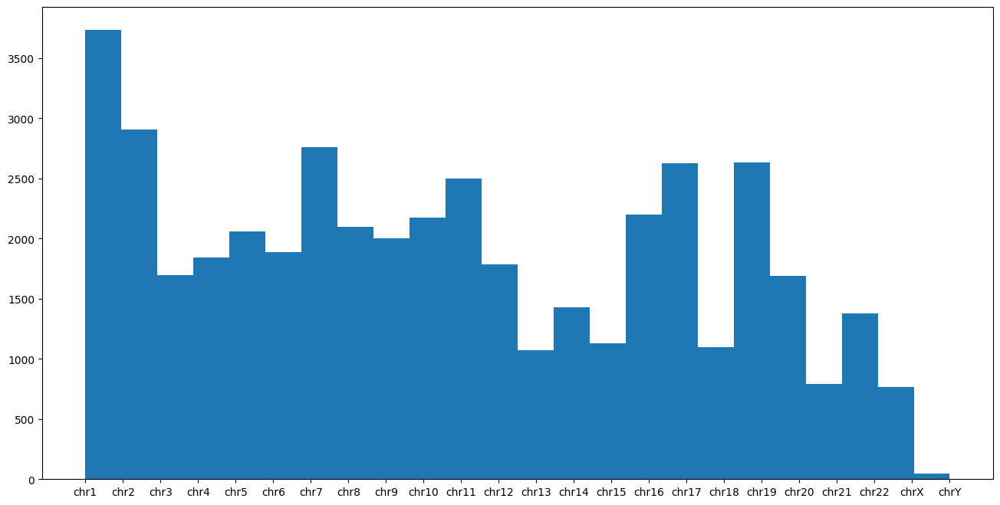

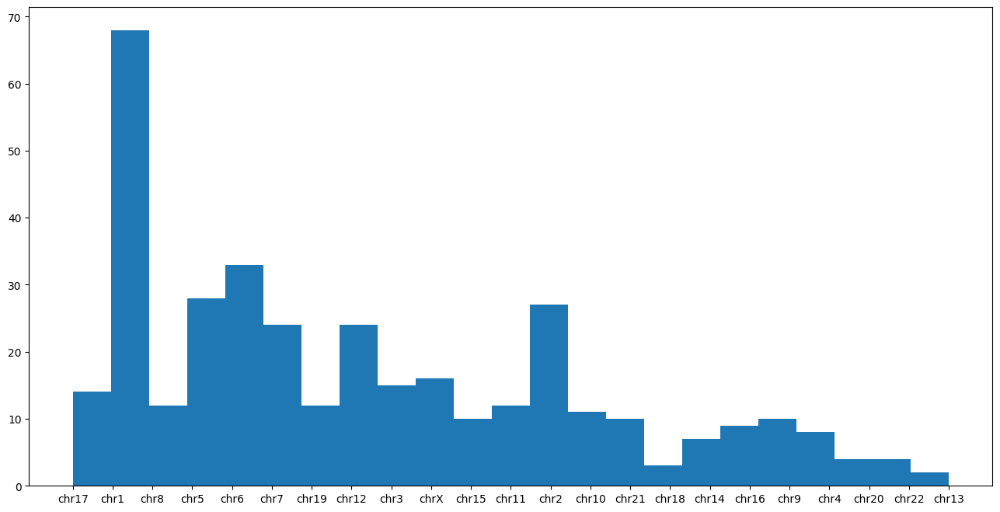

In [ ]:
data_preprocessor = DataPrep(beds_to_process, fastas_to_process)
data_preprocessor.process_all_files()

In [ ]:
types = ["Z-DNA", "G-quad", "H-DNA"]

In [ ]:
sequences = []
ss_type = []
chromosomes = []
fasta_files = [
    '/content/drive/My Drive/data_for_gans/preprocessed_fastas/WuKou2016_filter-norm_to_512.fasta',
    '/content/drive/My Drive/data_for_gans/preprocessed_fastas/zdna2016_filter-norm_to_512.fasta'
]
for fasta_file in fasta_files:
  for record in SeqIO.parse(fasta_file, "fasta"):
    sequences.append(str(record.seq).upper())
    sequence = str(record.seq).upper()
    chrom_info = record.id.split('_')[0]
    chromosome = chrom_info if chrom_info.startswith("chr") else "chr" + chrom_info
    chromosomes.append(chromosome)

for seq in sequences:
    ss_type.append(types[0])
raw_dataset = pd.DataFrame({"chromosome": chromosomes, "raw_sequence": sequences, "type": ss_type, "label": 1})
raw_dataset.head()

,chromosome,raw_sequence,type,label
0,chr1:845296-845808,GCTATCTTCCAGGCCGGGAGGAAGGACCGAGGGTGGGCCCGGCGCG...,Z-DNA,1
1,chr1:845379-845891,CTGGTCCTGGCGCTGGGACCCGCAGCTGCGCCCTCTGCCTGAGCAG...,Z-DNA,1
2,chr1:845802-846314,CAGTCACCGGGGGCGGGGAGACTGGTCGACCACCCCTGAGGGCCCG...,Z-DNA,1
3,chr1:845896-846408,TCCTGGTTGAGCAGCTAGGGGGGTGTCTGGTAACCAGCCGGGCCCC...,Z-DNA,1
4,chr1:848188-848700,GCACTCCACAGCAGGAAGAAGGGCAGTGTGAACTGCTCACCACTGT...,Z-DNA,1


In [ ]:
sequences = []
ss_type = []
chromosomes = []
fasta_files = [
    '/content/drive/My Drive/data_for_gans/G4_Chip_seq_quadruplex_norm_to_500.fa'
]
for fasta_file in fasta_files:
  for record in SeqIO.parse(fasta_file, "fasta"):
    sequences.append(str(record.seq).upper())
    sequence = str(record.seq).upper()
    chrom_info = record.id.split('_')[0]
    chromosome = chrom_info if chrom_info.startswith("chr") else "chr" + chrom_info
    chromosomes.append(chromosome)

for seq in sequences:
    ss_type.append(types[1])
g_dataset = pd.DataFrame({"chromosome": chromosomes, "raw_sequence": sequences, "type": ss_type, "label": 0})
g_dataset.head()

,chromosome,raw_sequence,type,label
0,chr1:713888-714400,CCCTTCTTCAGCCGGCAACACACAGAACCTGGCGGGGAGGTCACTC...,G-quad,0
1,chr1:762660-763172,GACGGAACCGGACACAGACGCAGATCTGGCAGCTGAGCGACAGGCT...,G-quad,0
2,chr1:839885-840397,CTCCGAACGTGGCCTCCTCCGAACGCGGCCGCCTCCTCCTCCGAAC...,G-quad,0
3,chr1:894460-894972,CCTGCGGGTCACGCAGGAGTCACAGCTGCCCGCACGCCCAGCTCGC...,G-quad,0
4,chr1:935301-935813,GCGCTCCTGCCATCGGCGAGGCGCTCGGTTTCCCCGGCGTGTCTGC...,G-quad,0


In [ ]:
raw_dataset = pd.concat([raw_dataset, g_dataset]).sample(frac=1).reset_index(drop=True)

In [ ]:
# raw_dataset.to_csv("/content/drive/My Drive/Zdna.csv", index=False)

In [ ]:
val_chromosomes = ['chr3', 'chr8', 'chr15', 'chr17', 'chr20', 'chrX']

raw_dataset['short_chrom'] = raw_dataset['chromosome'].apply(lambda x: x.split(':')[0])

val_set = raw_dataset[raw_dataset['short_chrom'].isin(val_chromosomes)]
train_set = raw_dataset[~raw_dataset['short_chrom'].isin(val_chromosomes)]

val_set = val_set.drop(columns=['short_chrom'])
train_set = train_set.drop(columns=['short_chrom'])

In [ ]:
data1 = np.load("/content/WuKou2016_filter-norm_to_512.npy")
data2 = np.load("/content/zdna2016_filter-norm_to_512.npy")
data = np.concatenate((data1, data2), axis=0)
dataq = np.load("/content/drive/My Drive/data_for_gans/G4_Chip_seq_quadruplex_norm.npy")
data = np.concatenate((data, dataq), axis=0)

In [ ]:
np.save("/content/WuKou_zdna2016_filter-norm_to_512.npy", data)

2023-12-30 13:21:02,960 - g4gan - INFO - Initialized logger.
INFO:g4gan:Initialized logger.
2023-12-30 13:21:02,970 - g4gan - INFO - Saving configurations...
INFO:g4gan:Saving configurations...
2023-12-30 13:21:02,976 - g4gan - INFO - Loading G4 data...
INFO:g4gan:Loading G4 data...
2023-12-30 13:21:05,149 - g4gan - INFO - Creating models...
INFO:g4gan:Creating models...
2023-12-30 13:21:05,262 - g4gan - INFO - WGANGenerator(
  (fc1): Linear(in_features=128, out_features=16384, bias=True)
  (block): Sequential(
    (0): ResBlock(
      (res_block): Sequential(
        (0): ReLU(inplace=True)
        (1): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
        (2): ReLU(inplace=True)
        (3): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
      )
    )
    (1): ResBlock(
      (res_block): Sequential(
        (0): ReLU(inplace=True)
        (1): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
        (2): ReLU(inplace=True)
        (3): Conv1d(32

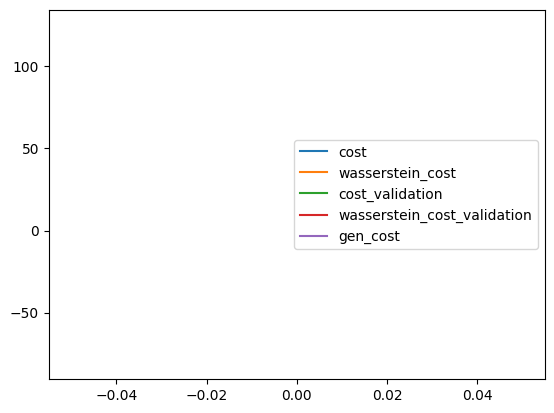

2023-12-30 14:20:46,580 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:20:48,632 - g4gan - INFO - D_self: 0.31
INFO:g4gan:D_self: 0.31
2023-12-30 14:20:48,637 - g4gan - INFO - D_train: 214.91
INFO:g4gan:D_train: 214.91


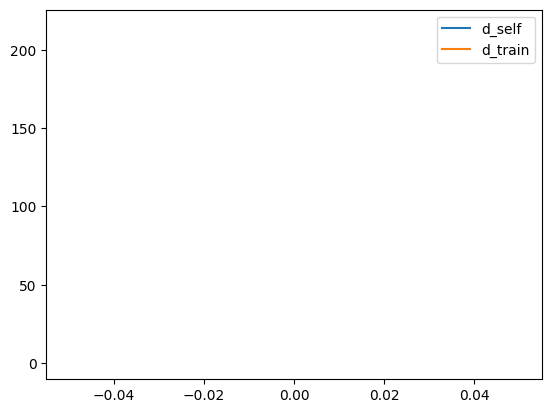

2023-12-30 14:20:48,847 - g4gan - INFO - Epoch: 2/200
INFO:g4gan:Epoch: 2/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:21:17,653 - g4gan - INFO - {'discriminator': [{'cost': -81.62216186523438,
                    'cost_validation': -84.4571304321289,
                    'wasserstein_cost': 129.2050323486328,
                    'wasserstein_cost_validation': 126.64423370361328},
                   {'cost': -81.34930419921875,
                    'cost_validation': -83.94656372070312,
                    'wasserstein_cost': 126.22036743164062,
                    'wasserstein_cost_validation': 127.1490249633789},
                   {'cost': -85.41505432128906,
                    'cost_validation': -76.88726043701172,
                    'wasserstein_cost': 126.7464828491211,
                    'wasserst

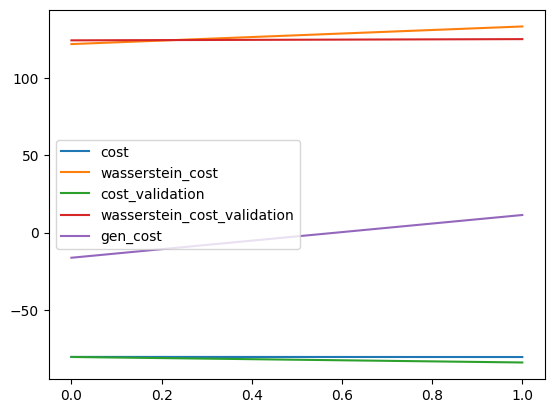

2023-12-30 14:21:17,891 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:21:19,906 - g4gan - INFO - D_self: 138.9
INFO:g4gan:D_self: 138.9
2023-12-30 14:21:19,911 - g4gan - INFO - D_train: 280.51
INFO:g4gan:D_train: 280.51


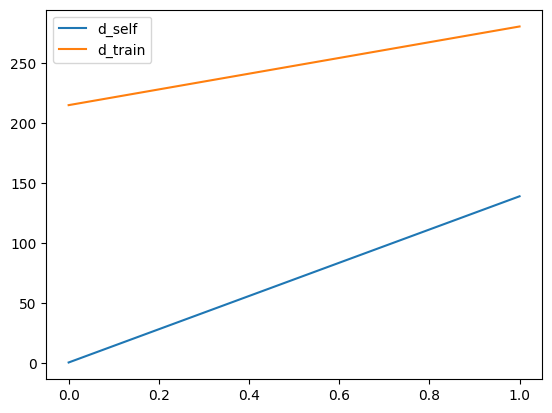

2023-12-30 14:21:20,347 - g4gan - INFO - Epoch: 3/200
INFO:g4gan:Epoch: 3/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:21:49,123 - g4gan - INFO - {'discriminator': [{'cost': -78.58436584472656,
                    'cost_validation': -77.22650909423828,
                    'wasserstein_cost': 122.43902587890625,
                    'wasserstein_cost_validation': 121.59027099609375},
                   {'cost': -82.2451171875,
                    'cost_validation': -77.38089752197266,
                    'wasserstein_cost': 122.03943634033203,
                    'wasserstein_cost_validation': 125.343505859375},
                   {'cost': -74.80560302734375,
                    'cost_validation': -75.87580871582031,
                    'wasserstein_cost': 125.81369018554688,
                    'wasserstei

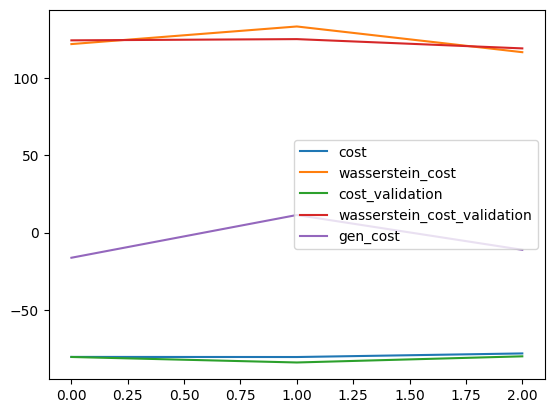

2023-12-30 14:21:49,355 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:21:51,136 - g4gan - INFO - D_self: 4.58
INFO:g4gan:D_self: 4.58
2023-12-30 14:21:51,140 - g4gan - INFO - D_train: 214.66
INFO:g4gan:D_train: 214.66


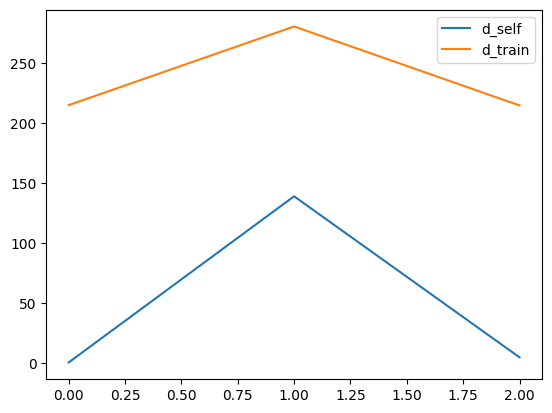

2023-12-30 14:21:51,350 - g4gan - INFO - Epoch: 4/200
INFO:g4gan:Epoch: 4/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:22:20,208 - g4gan - INFO - {'discriminator': [{'cost': -73.07588195800781,
                    'cost_validation': -76.60433197021484,
                    'wasserstein_cost': 113.68978118896484,
                    'wasserstein_cost_validation': 112.45301818847656},
                   {'cost': -74.91686248779297,
                    'cost_validation': -73.5220947265625,
                    'wasserstein_cost': 112.71775817871094,
                    'wasserstein_cost_validation': 114.39671325683594},
                   {'cost': -73.77932739257812,
                    'cost_validation': -74.14338684082031,
                    'wasserstein_cost': 115.42556762695312,
                    'wasse

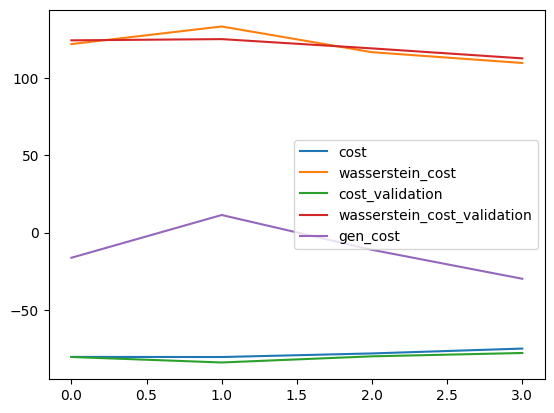

2023-12-30 14:22:20,444 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:22:22,452 - g4gan - INFO - D_self: 133.54
INFO:g4gan:D_self: 133.54
2023-12-30 14:22:22,457 - g4gan - INFO - D_train: 208.84
INFO:g4gan:D_train: 208.84


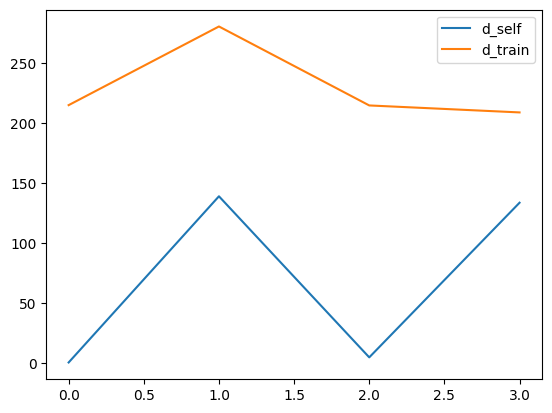

2023-12-30 14:22:22,666 - g4gan - INFO - Epoch: 5/200
INFO:g4gan:Epoch: 5/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:22:51,680 - g4gan - INFO - {'discriminator': [{'cost': -62.660560607910156,
                    'cost_validation': -65.22926330566406,
                    'wasserstein_cost': 95.82552337646484,
                    'wasserstein_cost_validation': 97.48018646240234},
                   {'cost': -62.94741439819336,
                    'cost_validation': -63.65361022949219,
                    'wasserstein_cost': 95.3209228515625,
                    'wasserstein_cost_validation': 94.06904602050781},
                   {'cost': -63.80461502075195,
                    'cost_validation': -62.79806900024414,
                    'wasserstein_cost': 92.91355895996094,
                    'wasserste

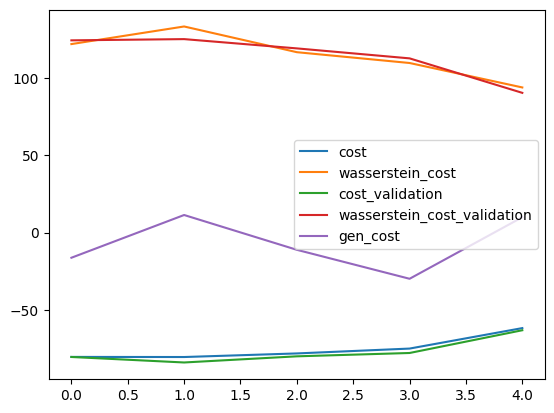

2023-12-30 14:22:51,925 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:22:54,074 - g4gan - INFO - D_self: 200.22
INFO:g4gan:D_self: 200.22
2023-12-30 14:22:54,080 - g4gan - INFO - D_train: 235.84
INFO:g4gan:D_train: 235.84


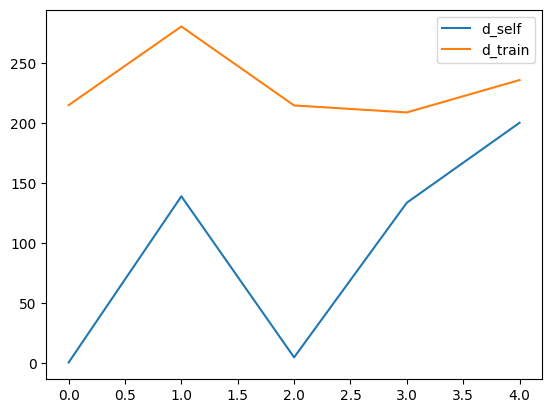

2023-12-30 14:22:54,453 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:22:54,467 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:22:54,549 - g4gan - INFO - Epoch: 6/200
INFO:g4gan:Epoch: 6/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    G   A   G   G   G   A   G   G   G   A  ...   C   G   C   A   G   C   C   
1    G   G   G   A   G   G   G   G   G   G  ...   C   A   C   C   C   G   C   
2    G   G   G   A   G   G   G   G   G   G  ...   A   A   C   G   G   C   A   
3    G   G   G   A   A   G   C   C   C   C  ...   A   C   C   C   A   A   A   
4    G   A   A   G   G   G   G   G   G   G  ...   G   A   G   G   G   C   A   
5    A   G   G   G   G   G   G   A   G   C  ...   C   A   C   C   C   C   A   
6    G   G   G   G   G   G   G   G   C   A  ...   G   G   C   A   C   C   C   
7    A   G   G   G   G   C   G   A   C   C  ...   C   C   G   C   G   A   C   
8    G   G   G   G   A   C   G   G   G   C  ...   A   G   G   G   C   A   A   
9    G   G   G   G   G   A   G   G   G   G  ...   G   G   A   G   C   C   C   
10   G   G   G   G   G   G   G   G   C   A  ...   A   C   G   A   A   C   C   
11   G   G   G   G   A   A   G   G   C   A  ...   G 

2023-12-30 14:23:23,526 - g4gan - INFO - {'discriminator': [{'cost': -51.345794677734375,
                    'cost_validation': -52.11077880859375,
                    'wasserstein_cost': 76.63277435302734,
                    'wasserstein_cost_validation': 75.1222152709961},
                   {'cost': -52.02149200439453,
                    'cost_validation': -50.99748229980469,
                    'wasserstein_cost': 74.89820098876953,
                    'wasserstein_cost_validation': 74.03642272949219},
                   {'cost': -52.39419174194336,
                    'cost_validation': -50.8458137512207,
                    'wasserstein_cost': 75.01243591308594,
                    'wasserstein_cost_validation': 78.2835693359375},
                   {'cost': -51.989830017089844,
                    'cost_validation': -51.03975296020508,
                    'wasserstein_cost': 78.87291717529297,
                    'wasserstein_cost_validation': 76.33444213867188},
            

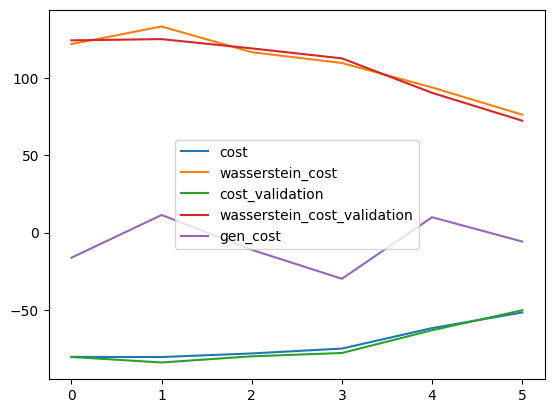

2023-12-30 14:23:23,864 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:23:27,628 - g4gan - INFO - D_self: 207.61
INFO:g4gan:D_self: 207.61
2023-12-30 14:23:27,635 - g4gan - INFO - D_train: 255.31
INFO:g4gan:D_train: 255.31


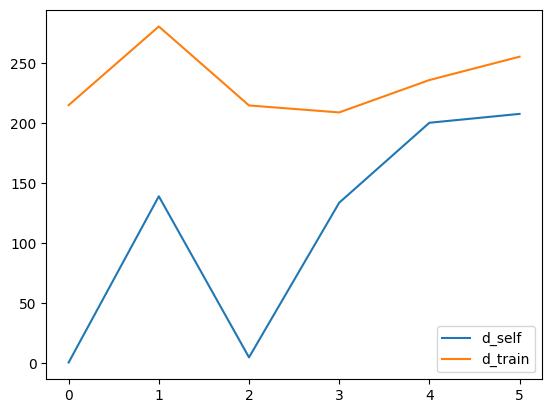

2023-12-30 14:23:27,950 - g4gan - INFO - Epoch: 7/200
INFO:g4gan:Epoch: 7/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:23:56,905 - g4gan - INFO - {'discriminator': [{'cost': -34.74879455566406,
                    'cost_validation': -34.56959533691406,
                    'wasserstein_cost': 48.921539306640625,
                    'wasserstein_cost_validation': 50.33348083496094},
                   {'cost': -35.50099563598633,
                    'cost_validation': -35.474918365478516,
                    'wasserstein_cost': 51.228187561035156,
                    'wasserstein_cost_validation': 49.50102615356445},
                   {'cost': -34.96199035644531,
                    'cost_validation': -35.731971740722656,
                    'wasserstein_cost': 49.191009521484375,
                    'wass

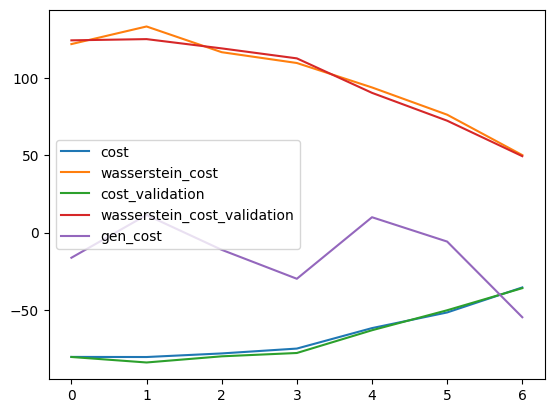

2023-12-30 14:23:57,281 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:23:59,730 - g4gan - INFO - D_self: 227.91
INFO:g4gan:D_self: 227.91
2023-12-30 14:23:59,734 - g4gan - INFO - D_train: 260.46
INFO:g4gan:D_train: 260.46


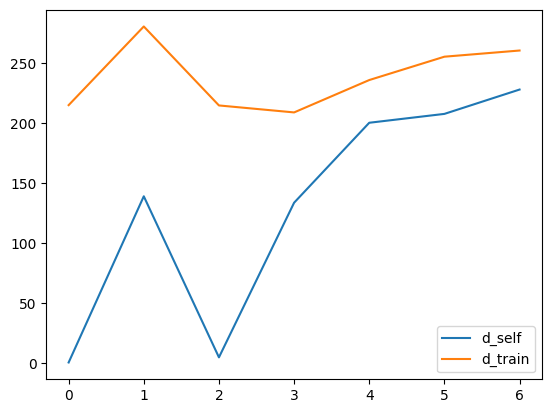

2023-12-30 14:23:59,985 - g4gan - INFO - Epoch: 8/200
INFO:g4gan:Epoch: 8/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:24:29,100 - g4gan - INFO - {'discriminator': [{'cost': -27.513656616210938,
                    'cost_validation': -28.792129516601562,
                    'wasserstein_cost': 37.546470642089844,
                    'wasserstein_cost_validation': 37.7136344909668},
                   {'cost': -28.28156852722168,
                    'cost_validation': -28.82741928100586,
                    'wasserstein_cost': 37.24327087402344,
                    'wasserstein_cost_validation': 38.480464935302734},
                   {'cost': -28.93702507019043,
                    'cost_validation': -28.39053726196289,
                    'wasserstein_cost': 38.94157028198242,
                    'wasser

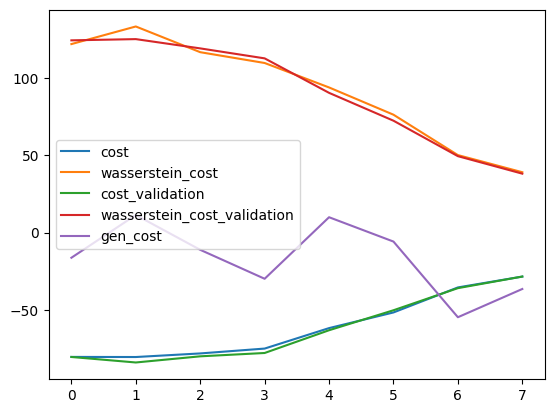

2023-12-30 14:24:29,335 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:24:31,447 - g4gan - INFO - D_self: 219.11
INFO:g4gan:D_self: 219.11
2023-12-30 14:24:31,451 - g4gan - INFO - D_train: 251.55
INFO:g4gan:D_train: 251.55


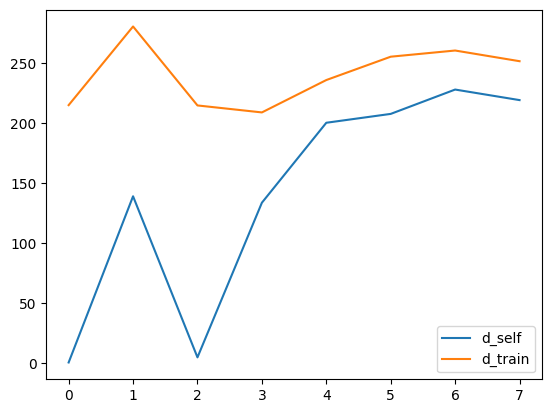

2023-12-30 14:24:31,672 - g4gan - INFO - Epoch: 9/200
INFO:g4gan:Epoch: 9/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:25:00,691 - g4gan - INFO - {'discriminator': [{'cost': -26.958282470703125,
                    'cost_validation': -27.831497192382812,
                    'wasserstein_cost': 36.204986572265625,
                    'wasserstein_cost_validation': 36.235477447509766},
                   {'cost': -26.590900421142578,
                    'cost_validation': -27.691471099853516,
                    'wasserstein_cost': 35.371055603027344,
                    'wasserstein_cost_validation': 37.282752990722656},
                   {'cost': -26.952293395996094,
                    'cost_validation': -27.29873275756836,
                    'wasserstein_cost': 36.42624282836914,
                    '

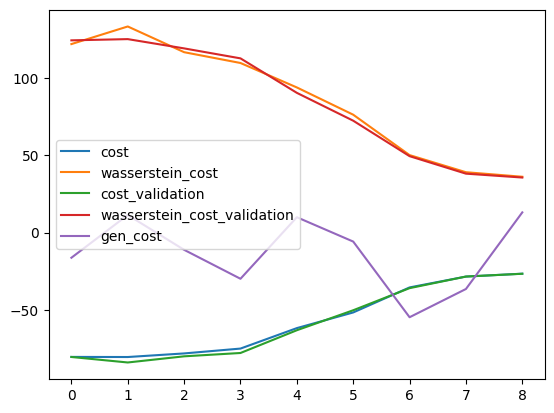

2023-12-30 14:25:00,945 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:25:03,101 - g4gan - INFO - D_self: 228.65
INFO:g4gan:D_self: 228.65
2023-12-30 14:25:03,105 - g4gan - INFO - D_train: 256.73
INFO:g4gan:D_train: 256.73


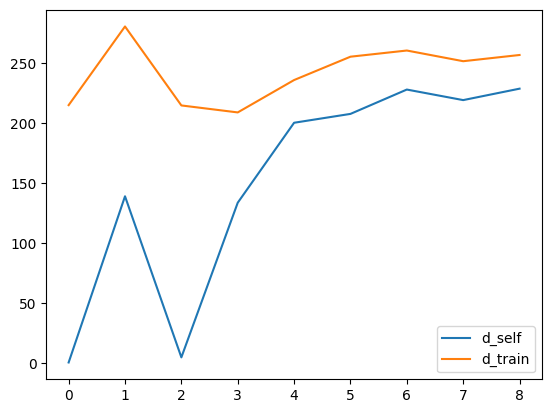

2023-12-30 14:25:03,371 - g4gan - INFO - Epoch: 10/200
INFO:g4gan:Epoch: 10/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:25:32,437 - g4gan - INFO - {'discriminator': [{'cost': -25.18583106994629,
                    'cost_validation': -25.16242790222168,
                    'wasserstein_cost': 33.792198181152344,
                    'wasserstein_cost_validation': 33.36856460571289},
                   {'cost': -25.290298461914062,
                    'cost_validation': -24.226259231567383,
                    'wasserstein_cost': 33.76389694213867,
                    'wasserstein_cost_validation': 32.918190002441406},
                   {'cost': -24.98788833618164,
                    'cost_validation': -24.65798568725586,
                    'wasserstein_cost': 33.89496994018555,
                    'was

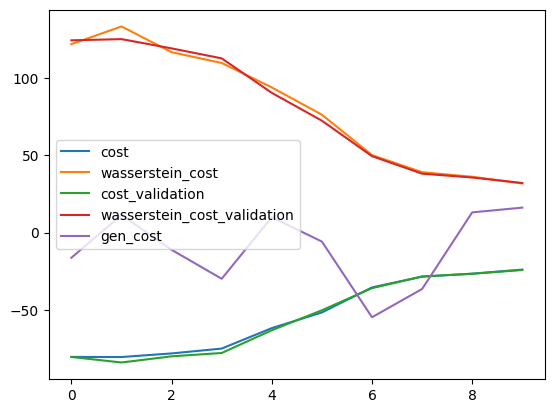

2023-12-30 14:25:32,662 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:25:34,807 - g4gan - INFO - D_self: 227.69
INFO:g4gan:D_self: 227.69
2023-12-30 14:25:34,812 - g4gan - INFO - D_train: 253.53
INFO:g4gan:D_train: 253.53


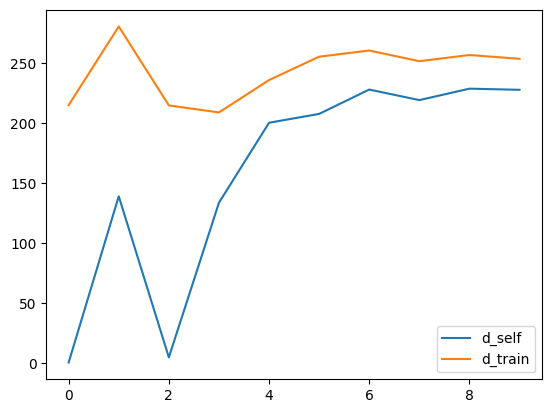

2023-12-30 14:25:35,024 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:25:35,032 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:25:35,128 - g4gan - INFO - Epoch: 11/200
INFO:g4gan:Epoch: 11/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    T   A   A   G   G   A   G   C   T   A  ...   T   T   C   A   G   C   C   
1    T   G   A   A   G   C   T   A   G   G  ...   C   T   C   C   T   C   C   
2    A   G   G   A   G   G   T   G   T   G  ...   A   G   G   A   G   C   A   
3    A   G   G   G   A   G   C   C   C   C  ...   A   G   C   T   A   G   G   
4    T   A   A   G   C   A   G   G   T   G  ...   A   G   G   T   G   G   A   
5    A   A   G   G   C   T   C   A   G   C  ...   G   A   G   C   C   A   A   
6    A   G   G   G   G   G   G   G   C   A  ...   G   G   T   T   G   C   C   
7    A   G   G   C   C   C   C   T   T   C  ...   T   T   G   C   C   A   G   
8    A   A   G   G   G   G   T   T   C   C  ...   A   G   T   G   C   A   G   
9    A   G   G   G   G   A   G   G   G   A  ...   G   G   G   G   C   C   C   
10   A   A   G   G   G   G   G   C   C   A  ...   A   T   C   A   A   G   C   
11   A   G   G   G   C   A   G   C   C   A  ...   T 

2023-12-30 14:26:05,012 - g4gan - INFO - {'discriminator': [{'cost': -23.087905883789062,
                    'cost_validation': -23.77623176574707,
                    'wasserstein_cost': 30.793659210205078,
                    'wasserstein_cost_validation': 30.730985641479492},
                   {'cost': -24.133665084838867,
                    'cost_validation': -23.76050567626953,
                    'wasserstein_cost': 31.07157325744629,
                    'wasserstein_cost_validation': 31.480497360229492},
                   {'cost': -23.870525360107422,
                    'cost_validation': -23.938404083251953,
                    'wasserstein_cost': 31.64138412475586,
                    'wasserstein_cost_validation': 31.456382751464844},
                   {'cost': -23.22753143310547,
                    'cost_validation': -24.115306854248047,
                    'wasserstein_cost': 30.92807388305664,
                    'wasserstein_cost_validation': 31.794076919555664},
 

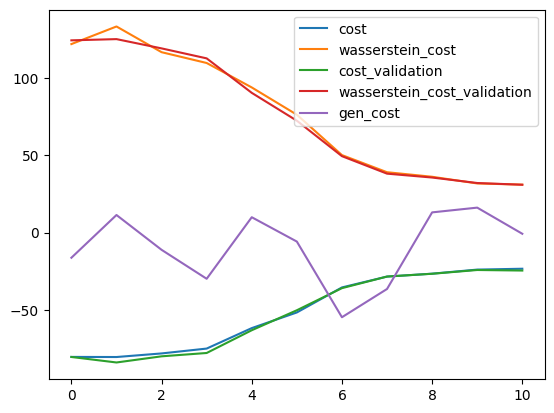

2023-12-30 14:26:05,258 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:26:08,969 - g4gan - INFO - D_self: 222.27
INFO:g4gan:D_self: 222.27
2023-12-30 14:26:08,976 - g4gan - INFO - D_train: 245.73
INFO:g4gan:D_train: 245.73


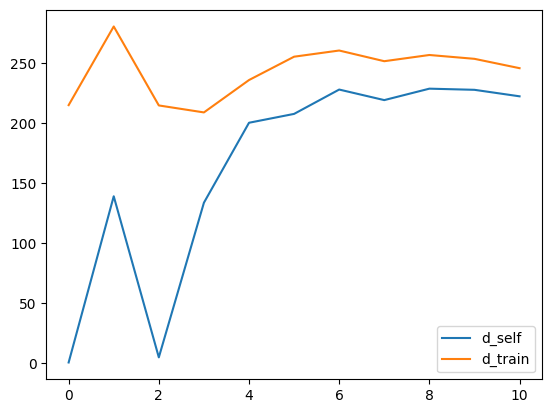

2023-12-30 14:26:09,265 - g4gan - INFO - Epoch: 12/200
INFO:g4gan:Epoch: 12/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:26:38,192 - g4gan - INFO - {'discriminator': [{'cost': -22.150287628173828,
                    'cost_validation': -21.819644927978516,
                    'wasserstein_cost': 28.73366355895996,
                    'wasserstein_cost_validation': 29.90141487121582},
                   {'cost': -21.07312774658203,
                    'cost_validation': -21.41776466369629,
                    'wasserstein_cost': 28.84918212890625,
                    'wasserstein_cost_validation': 28.76868438720703},
                   {'cost': -22.592987060546875,
                    'cost_validation': -22.491043090820312,
                    'wasserstein_cost': 29.60503578186035,
                    'was

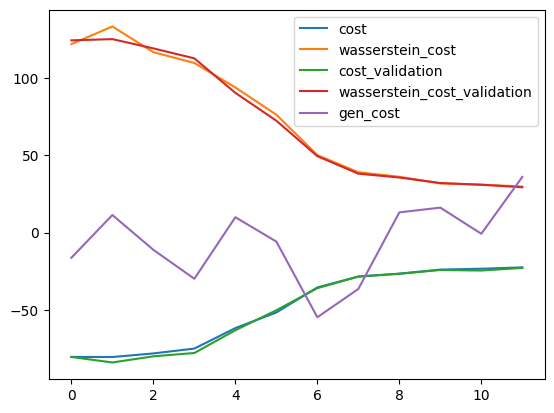

2023-12-30 14:26:38,507 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:26:41,406 - g4gan - INFO - D_self: 228.59
INFO:g4gan:D_self: 228.59
2023-12-30 14:26:41,411 - g4gan - INFO - D_train: 247.15
INFO:g4gan:D_train: 247.15


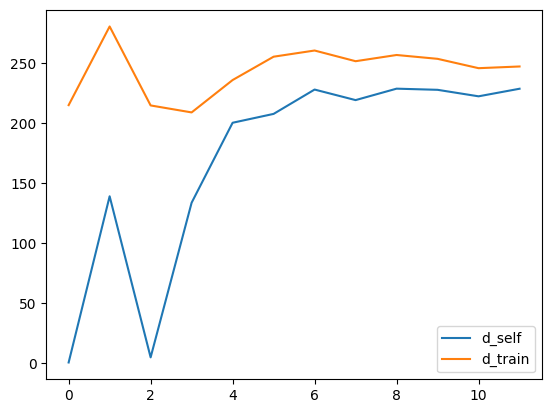

2023-12-30 14:26:41,650 - g4gan - INFO - Epoch: 13/200
INFO:g4gan:Epoch: 13/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:27:10,614 - g4gan - INFO - {'discriminator': [{'cost': -19.473190307617188,
                    'cost_validation': -18.837799072265625,
                    'wasserstein_cost': 25.361186981201172,
                    'wasserstein_cost_validation': 24.988677978515625},
                   {'cost': -19.317562103271484,
                    'cost_validation': -19.698104858398438,
                    'wasserstein_cost': 25.65143394470215,
                    'wasserstein_cost_validation': 25.32282066345215},
                   {'cost': -18.562423706054688,
                    'cost_validation': -18.701465606689453,
                    'wasserstein_cost': 23.810985565185547,
                   

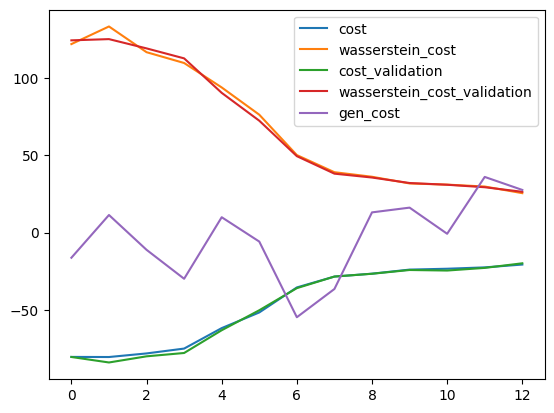

2023-12-30 14:27:10,833 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:27:12,939 - g4gan - INFO - D_self: 230.24
INFO:g4gan:D_self: 230.24
2023-12-30 14:27:12,947 - g4gan - INFO - D_train: 244.74
INFO:g4gan:D_train: 244.74


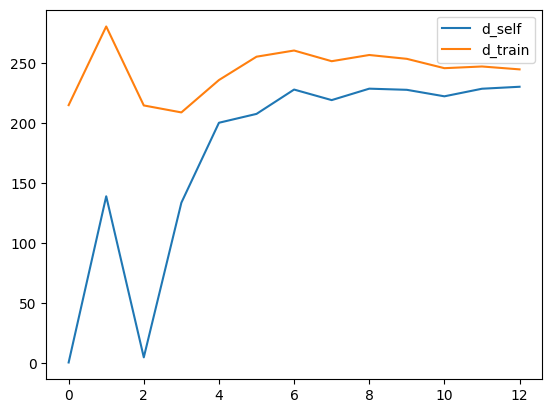

2023-12-30 14:27:13,198 - g4gan - INFO - Epoch: 14/200
INFO:g4gan:Epoch: 14/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:27:42,001 - g4gan - INFO - {'discriminator': [{'cost': -17.81448745727539,
                    'cost_validation': -18.099929809570312,
                    'wasserstein_cost': 22.523574829101562,
                    'wasserstein_cost_validation': 22.50853157043457},
                   {'cost': -18.1527099609375,
                    'cost_validation': -17.06973648071289,
                    'wasserstein_cost': 22.63882064819336,
                    'wasserstein_cost_validation': 22.271682739257812},
                   {'cost': -17.022754669189453,
                    'cost_validation': -17.372217178344727,
                    'wasserstein_cost': 22.235816955566406,
                    'wa

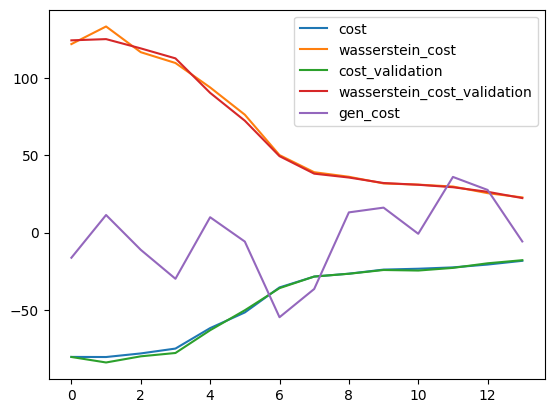

2023-12-30 14:27:42,233 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:27:44,359 - g4gan - INFO - D_self: 237.74
INFO:g4gan:D_self: 237.74
2023-12-30 14:27:44,363 - g4gan - INFO - D_train: 247.37
INFO:g4gan:D_train: 247.37


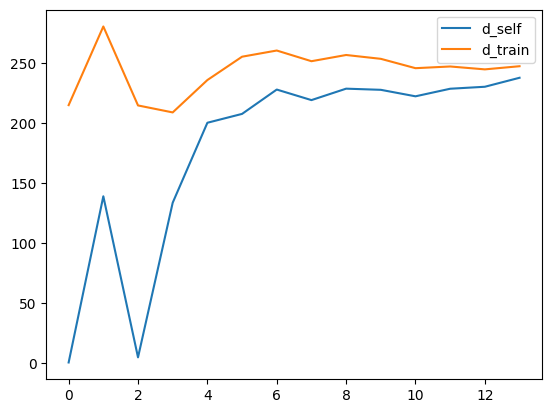

2023-12-30 14:27:44,616 - g4gan - INFO - Epoch: 15/200
INFO:g4gan:Epoch: 15/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:28:13,490 - g4gan - INFO - {'discriminator': [{'cost': -12.235214233398438,
                    'cost_validation': -12.657204627990723,
                    'wasserstein_cost': 15.344303131103516,
                    'wasserstein_cost_validation': 15.829299926757812},
                   {'cost': -12.709776878356934,
                    'cost_validation': -12.387688636779785,
                    'wasserstein_cost': 16.118484497070312,
                    'wasserstein_cost_validation': 15.51651382446289},
                   {'cost': -12.408665657043457,
                    'cost_validation': -12.707338333129883,
                    'wasserstein_cost': 15.50351333618164,
                   

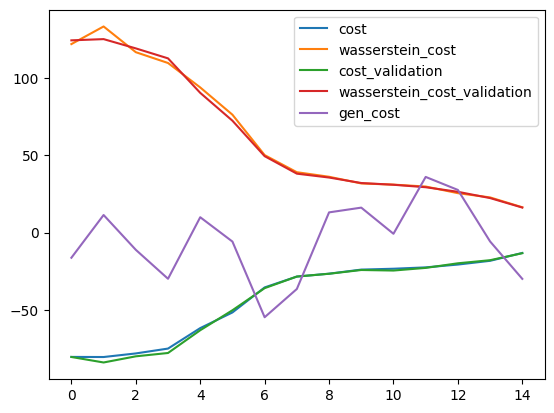

2023-12-30 14:28:13,725 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:28:15,880 - g4gan - INFO - D_self: 239.91
INFO:g4gan:D_self: 239.91
2023-12-30 14:28:15,884 - g4gan - INFO - D_train: 246.28
INFO:g4gan:D_train: 246.28


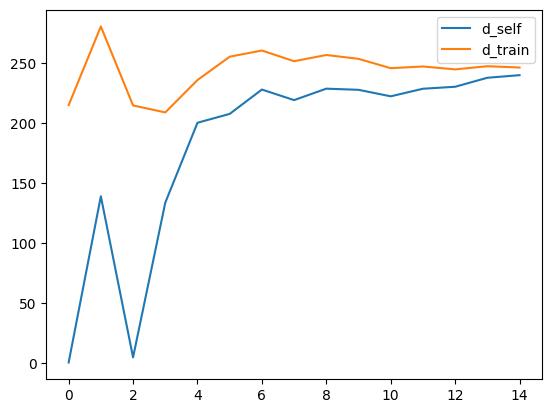

2023-12-30 14:28:16,158 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:28:16,166 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:28:16,248 - g4gan - INFO - Epoch: 16/200
INFO:g4gan:Epoch: 16/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    A   A   A   A   C   A   T   C   A   A  ...   C   G   C   T   G   C   C   
1    A   A   A   A   G   C   G   A   A   G  ...   C   T   C   G   C   G   C   
2    A   A   C   A   T   T   G   T   A   A  ...   A   A   G   G   T   C   A   
3    A   A   G   C   A   G   C   C   C   C  ...   A   C   G   C   A   G   T   
4    A   A   A   T   C   A   A   G   T   G  ...   A   A   C   T   C   T   A   
5    A   A   T   G   C   A   G   A   G   C  ...   C   T   G   C   C   C   A   
6    A   A   G   A   A   A   T   C   C   T  ...   G   C   C   T   C   G   G   
7    A   A   G   C   C   T   G   C   G   C  ...   G   G   G   C   G   T   G   
8    A   A   G   A   T   T   G   G   C   T  ...   A   G   G   C   G   A   T   
9    A   A   C   A   C   A   A   G   G   A  ...   T   C   G   G   C   G   C   
10   A   A   G   C   A   C   T   C   T   A  ...   G   T   C   G   A   C   C   
11   A   A   G   C   C   A   G   C   C   A  ...   T 

2023-12-30 14:28:45,141 - g4gan - INFO - {'discriminator': [{'cost': -9.784010887145996,
                    'cost_validation': -10.017434120178223,
                    'wasserstein_cost': 12.43528938293457,
                    'wasserstein_cost_validation': 12.204527854919434},
                   {'cost': -9.300053596496582,
                    'cost_validation': -10.515851020812988,
                    'wasserstein_cost': 11.386802673339844,
                    'wasserstein_cost_validation': 12.470300674438477},
                   {'cost': -11.021076202392578,
                    'cost_validation': -10.998577117919922,
                    'wasserstein_cost': 13.538347244262695,
                    'wasserstein_cost_validation': 13.017309188842773},
                   {'cost': -9.632364273071289,
                    'cost_validation': -9.810219764709473,
                    'wasserstein_cost': 11.749603271484375,
                    'wasserstein_cost_validation': 12.15198040008545},
 

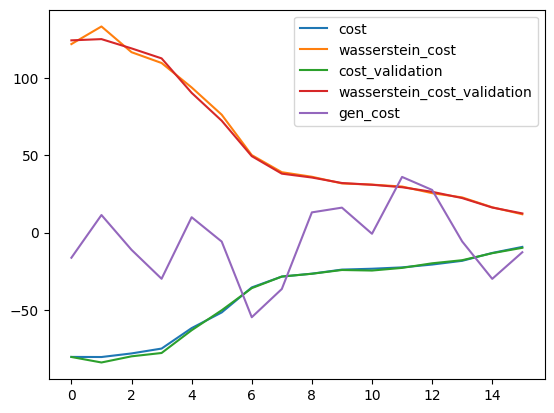

2023-12-30 14:28:45,368 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:28:47,955 - g4gan - INFO - D_self: 245.08
INFO:g4gan:D_self: 245.08
2023-12-30 14:28:47,964 - g4gan - INFO - D_train: 247.98
INFO:g4gan:D_train: 247.98


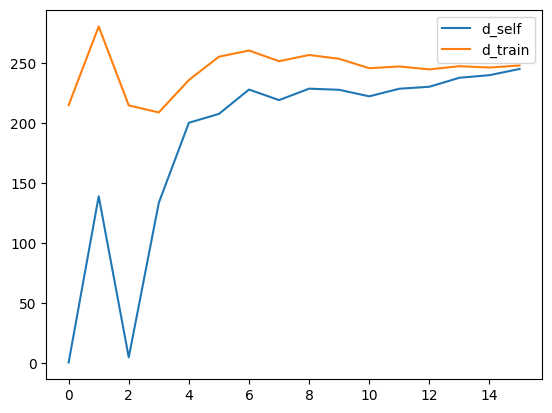

2023-12-30 14:28:48,324 - g4gan - INFO - Epoch: 17/200
INFO:g4gan:Epoch: 17/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:29:17,141 - g4gan - INFO - {'discriminator': [{'cost': -9.171160697937012,
                    'cost_validation': -10.133342742919922,
                    'wasserstein_cost': 11.237031936645508,
                    'wasserstein_cost_validation': 12.228349685668945},
                   {'cost': -10.064332008361816,
                    'cost_validation': -9.837763786315918,
                    'wasserstein_cost': 12.443521499633789,
                    'wasserstein_cost_validation': 11.762954711914062},
                   {'cost': -9.14756965637207,
                    'cost_validation': -9.965970039367676,
                    'wasserstein_cost': 11.209467887878418,
                    'w

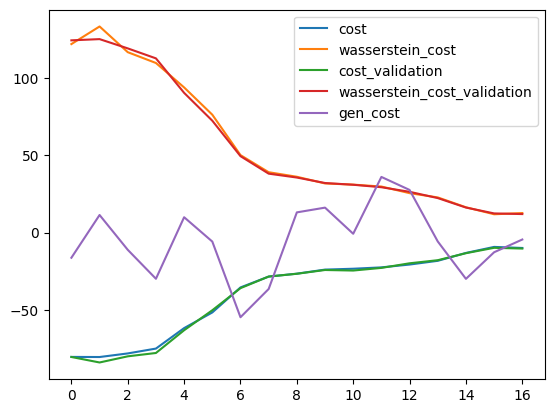

2023-12-30 14:29:17,482 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:29:21,275 - g4gan - INFO - D_self: 241.87
INFO:g4gan:D_self: 241.87
2023-12-30 14:29:21,282 - g4gan - INFO - D_train: 244.77
INFO:g4gan:D_train: 244.77


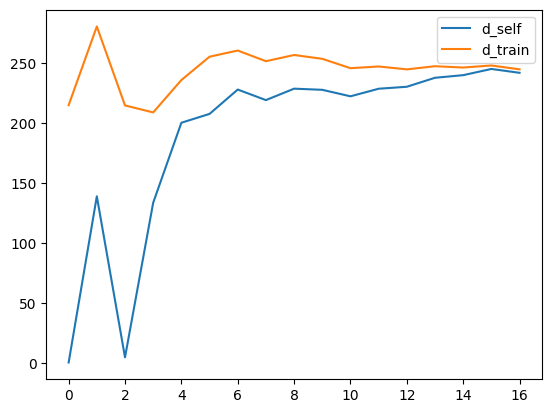

2023-12-30 14:29:21,608 - g4gan - INFO - Epoch: 18/200
INFO:g4gan:Epoch: 18/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:29:50,563 - g4gan - INFO - {'discriminator': [{'cost': -10.954161643981934,
                    'cost_validation': -10.775701522827148,
                    'wasserstein_cost': 12.729808807373047,
                    'wasserstein_cost_validation': 13.150163650512695},
                   {'cost': -10.89919376373291,
                    'cost_validation': -10.189931869506836,
                    'wasserstein_cost': 13.30271053314209,
                    'wasserstein_cost_validation': 12.766578674316406},
                   {'cost': -10.354660034179688,
                    'cost_validation': -10.184478759765625,
                    'wasserstein_cost': 12.90796947479248,
                    

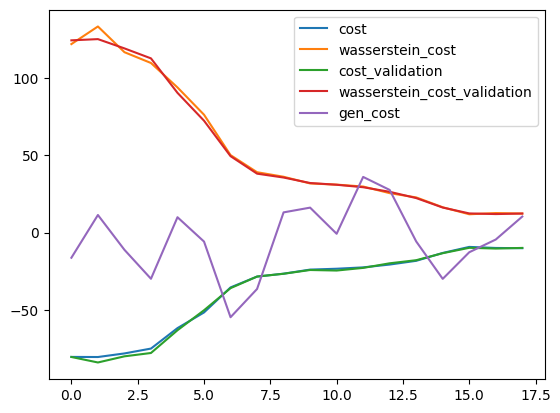

2023-12-30 14:29:50,877 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:29:53,280 - g4gan - INFO - D_self: 245.65
INFO:g4gan:D_self: 245.65
2023-12-30 14:29:53,284 - g4gan - INFO - D_train: 249.26
INFO:g4gan:D_train: 249.26


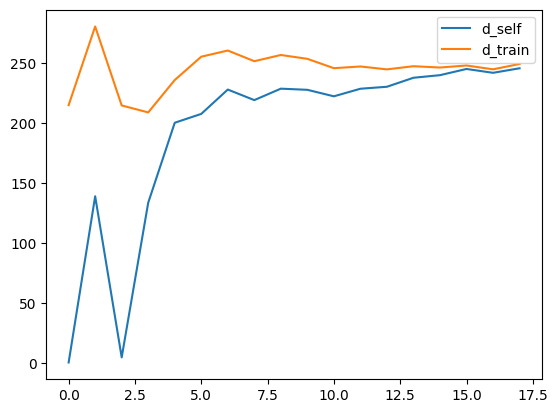

2023-12-30 14:29:53,584 - g4gan - INFO - Epoch: 19/200
INFO:g4gan:Epoch: 19/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:30:22,438 - g4gan - INFO - {'discriminator': [{'cost': -9.625486373901367,
                    'cost_validation': -9.343518257141113,
                    'wasserstein_cost': 12.149986267089844,
                    'wasserstein_cost_validation': 11.417912483215332},
                   {'cost': -10.171316146850586,
                    'cost_validation': -9.661086082458496,
                    'wasserstein_cost': 12.441003799438477,
                    'wasserstein_cost_validation': 11.773239135742188},
                   {'cost': -10.695236206054688,
                    'cost_validation': -10.209802627563477,
                    'wasserstein_cost': 13.348457336425781,
                    

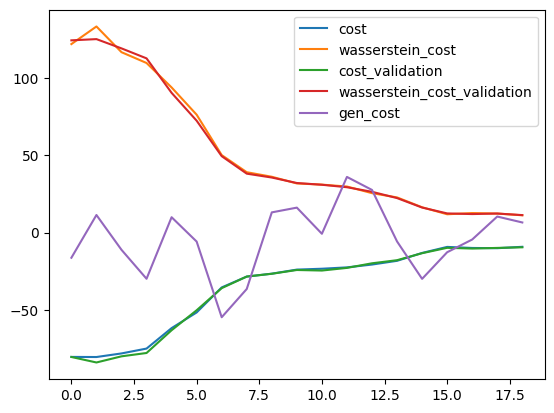

2023-12-30 14:30:22,666 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:30:24,794 - g4gan - INFO - D_self: 246.04
INFO:g4gan:D_self: 246.04
2023-12-30 14:30:24,798 - g4gan - INFO - D_train: 248.41
INFO:g4gan:D_train: 248.41


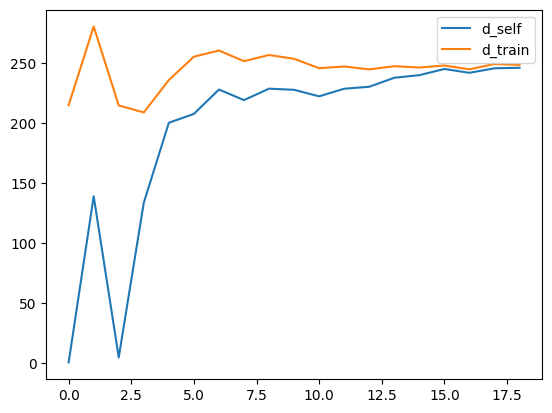

2023-12-30 14:30:25,065 - g4gan - INFO - Epoch: 20/200
INFO:g4gan:Epoch: 20/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:30:54,599 - g4gan - INFO - {'discriminator': [{'cost': -10.335931777954102,
                    'cost_validation': -10.367401123046875,
                    'wasserstein_cost': 13.091121673583984,
                    'wasserstein_cost_validation': 11.809341430664062},
                   {'cost': -9.706727981567383,
                    'cost_validation': -10.651008605957031,
                    'wasserstein_cost': 11.471933364868164,
                    'wasserstein_cost_validation': 12.77022647857666},
                   {'cost': -10.279420852661133,
                    'cost_validation': -9.973129272460938,
                    'wasserstein_cost': 12.137601852416992,
                    

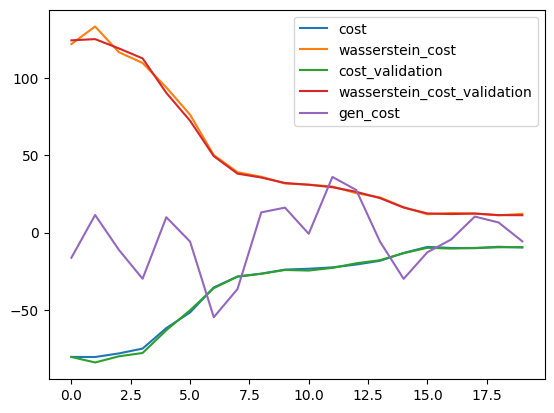

2023-12-30 14:30:55,087 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:30:57,212 - g4gan - INFO - D_self: 244.55
INFO:g4gan:D_self: 244.55
2023-12-30 14:30:57,219 - g4gan - INFO - D_train: 246.32
INFO:g4gan:D_train: 246.32


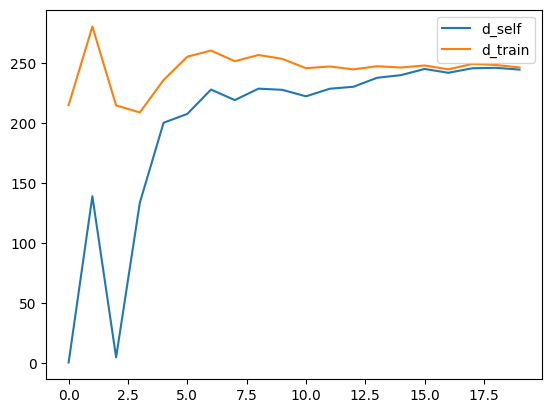

2023-12-30 14:30:57,452 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:30:57,459 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:30:57,546 - g4gan - INFO - Epoch: 21/200
INFO:g4gan:Epoch: 21/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    A   A   A   A   C   A   T   C   T   A  ...   C   G   C   T   G   C   C   
1    A   G   A   A   G   C   G   A   T   G  ...   C   A   C   C   C   G   C   
2    A   A   C   A   T   T   A   T   A   A  ...   A   T   G   G   T   G   A   
3    A   A   G   C   A   G   C   C   C   C  ...   A   C   G   C   A   G   T   
4    A   A   A   G   C   A   A   G   A   T  ...   A   A   G   T   G   G   A   
5    A   A   G   G   C   A   G   A   G   C  ...   C   T   G   C   C   G   A   
6    A   A   G   A   T   A   T   C   C   T  ...   G   C   C   T   C   G   G   
7    A   T   G   C   C   T   C   C   G   C  ...   G   G   G   C   G   G   G   
8    A   A   G   A   A   G   T   G   C   T  ...   A   G   G   C   G   T   T   
9    A   A   C   A   G   A   A   G   G   A  ...   T   C   G   C   C   C   C   
10   A   A   G   C   A   C   A   C   G   A  ...   T   T   C   C   A   C   C   
11   A   A   G   C   G   T   G   C   C   A  ...   T 

2023-12-30 14:31:26,431 - g4gan - INFO - {'discriminator': [{'cost': -9.40432071685791,
                    'cost_validation': -10.262487411499023,
                    'wasserstein_cost': 11.992088317871094,
                    'wasserstein_cost_validation': 12.241775512695312},
                   {'cost': -10.37095832824707,
                    'cost_validation': -9.522638320922852,
                    'wasserstein_cost': 12.421468734741211,
                    'wasserstein_cost_validation': 11.755748748779297},
                   {'cost': -8.982714653015137,
                    'cost_validation': -9.802133560180664,
                    'wasserstein_cost': 11.124561309814453,
                    'wasserstein_cost_validation': 11.73288631439209},
                   {'cost': -10.311713218688965,
                    'cost_validation': -10.509990692138672,
                    'wasserstein_cost': 12.371452331542969,
                    'wasserstein_cost_validation': 12.698663711547852},
  

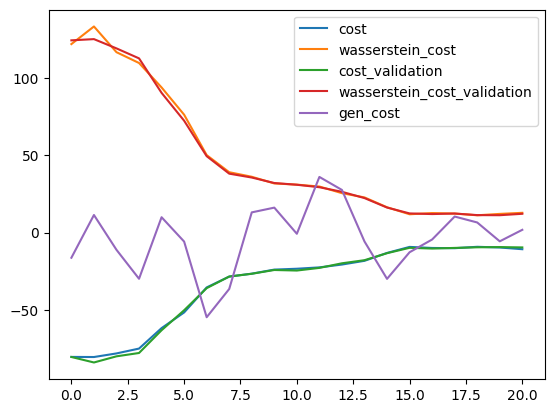

2023-12-30 14:31:26,672 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:31:28,822 - g4gan - INFO - D_self: 246.02
INFO:g4gan:D_self: 246.02
2023-12-30 14:31:28,826 - g4gan - INFO - D_train: 247.29
INFO:g4gan:D_train: 247.29


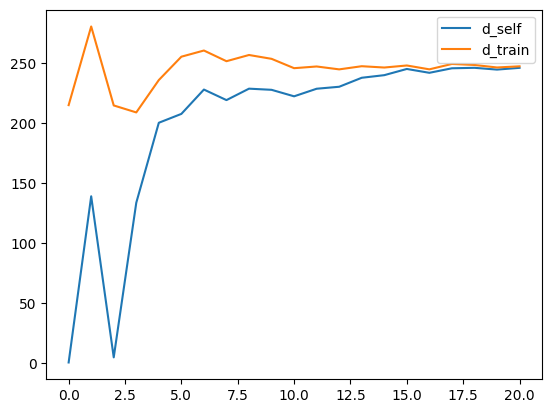

2023-12-30 14:31:29,087 - g4gan - INFO - Epoch: 22/200
INFO:g4gan:Epoch: 22/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:31:58,011 - g4gan - INFO - {'discriminator': [{'cost': -9.072765350341797,
                    'cost_validation': -11.14603042602539,
                    'wasserstein_cost': 11.503479957580566,
                    'wasserstein_cost_validation': 13.437461853027344},
                   {'cost': -10.969569206237793,
                    'cost_validation': -10.528291702270508,
                    'wasserstein_cost': 13.535459518432617,
                    'wasserstein_cost_validation': 13.324514389038086},
                   {'cost': -10.117654800415039,
                    'cost_validation': -8.909351348876953,
                    'wasserstein_cost': 12.602518081665039,
                    

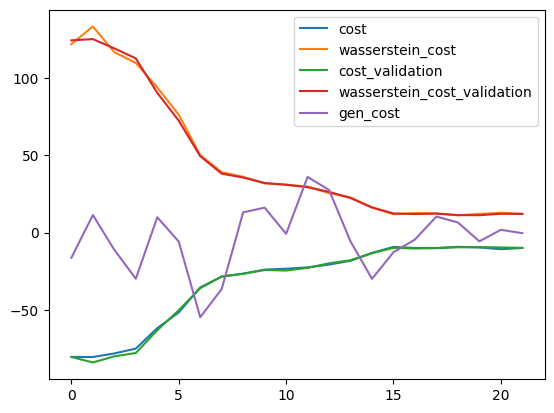

2023-12-30 14:31:58,242 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:32:01,865 - g4gan - INFO - D_self: 245.5
INFO:g4gan:D_self: 245.5
2023-12-30 14:32:01,868 - g4gan - INFO - D_train: 247.82
INFO:g4gan:D_train: 247.82


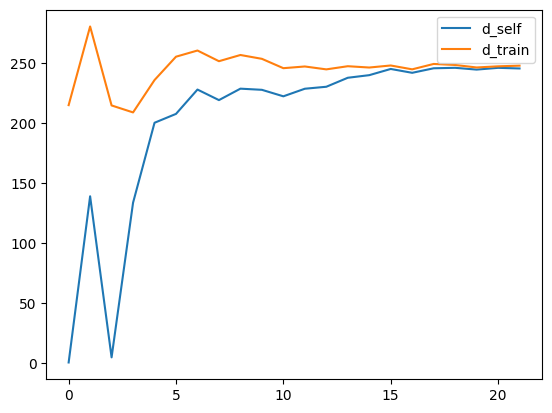

2023-12-30 14:32:02,175 - g4gan - INFO - Epoch: 23/200
INFO:g4gan:Epoch: 23/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:32:30,826 - g4gan - INFO - {'discriminator': [{'cost': -9.484909057617188,
                    'cost_validation': -9.809968948364258,
                    'wasserstein_cost': 11.178979873657227,
                    'wasserstein_cost_validation': 13.11086654663086},
                   {'cost': -10.223237037658691,
                    'cost_validation': -10.20508861541748,
                    'wasserstein_cost': 12.75576400756836,
                    'wasserstein_cost_validation': 12.729621887207031},
                   {'cost': -9.800382614135742,
                    'cost_validation': -10.176858901977539,
                    'wasserstein_cost': 12.279118537902832,
                    'wa

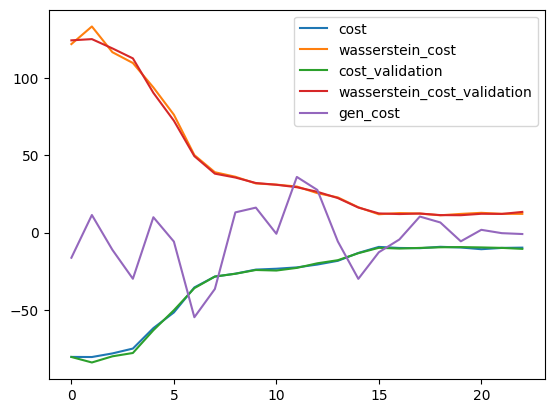

2023-12-30 14:32:31,134 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:32:34,152 - g4gan - INFO - D_self: 242.44
INFO:g4gan:D_self: 242.44
2023-12-30 14:32:34,158 - g4gan - INFO - D_train: 244.2
INFO:g4gan:D_train: 244.2


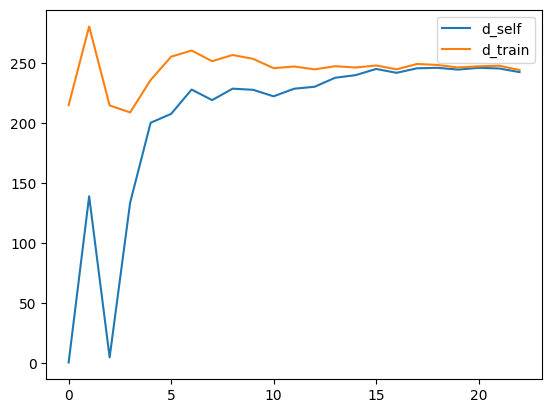

2023-12-30 14:32:34,397 - g4gan - INFO - Epoch: 24/200
INFO:g4gan:Epoch: 24/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:33:03,337 - g4gan - INFO - {'discriminator': [{'cost': -10.333513259887695,
                    'cost_validation': -10.37550163269043,
                    'wasserstein_cost': 12.155951499938965,
                    'wasserstein_cost_validation': 12.481460571289062},
                   {'cost': -10.336008071899414,
                    'cost_validation': -10.526540756225586,
                    'wasserstein_cost': 12.277660369873047,
                    'wasserstein_cost_validation': 12.600717544555664},
                   {'cost': -10.604802131652832,
                    'cost_validation': -9.32714557647705,
                    'wasserstein_cost': 12.817301750183105,
                    

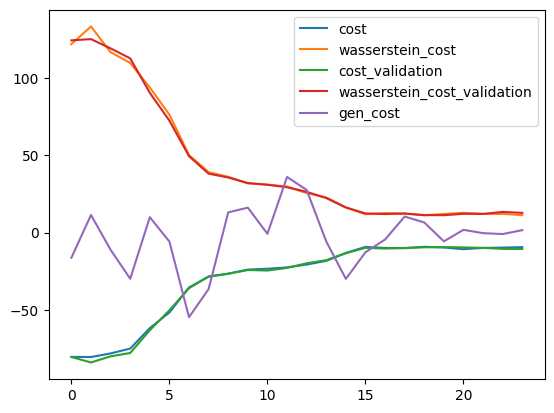

2023-12-30 14:33:03,575 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:33:05,699 - g4gan - INFO - D_self: 244.05
INFO:g4gan:D_self: 244.05
2023-12-30 14:33:05,703 - g4gan - INFO - D_train: 245.55
INFO:g4gan:D_train: 245.55


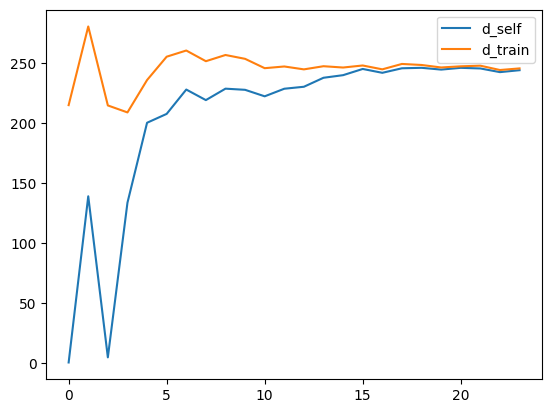

2023-12-30 14:33:05,917 - g4gan - INFO - Epoch: 25/200
INFO:g4gan:Epoch: 25/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:33:34,699 - g4gan - INFO - {'discriminator': [{'cost': -8.672823905944824,
                    'cost_validation': -9.357948303222656,
                    'wasserstein_cost': 11.670686721801758,
                    'wasserstein_cost_validation': 11.234793663024902},
                   {'cost': -10.105812072753906,
                    'cost_validation': -9.098073959350586,
                    'wasserstein_cost': 12.394984245300293,
                    'wasserstein_cost_validation': 11.398761749267578},
                   {'cost': -10.274642944335938,
                    'cost_validation': -10.241243362426758,
                    'wasserstein_cost': 13.312813758850098,
                    

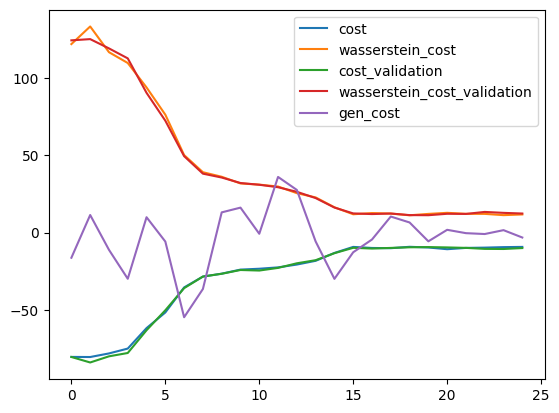

2023-12-30 14:33:34,940 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:33:37,061 - g4gan - INFO - D_self: 241.37
INFO:g4gan:D_self: 241.37
2023-12-30 14:33:37,065 - g4gan - INFO - D_train: 244.44
INFO:g4gan:D_train: 244.44


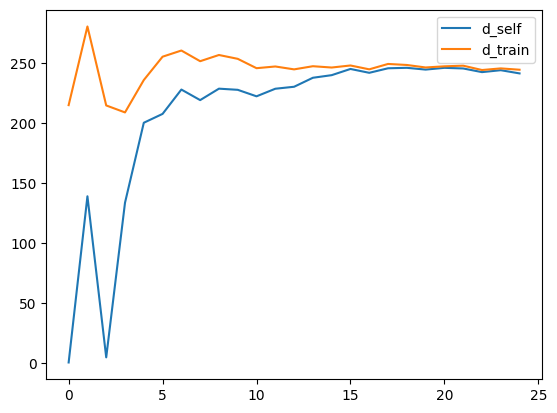

2023-12-30 14:33:37,278 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:33:37,285 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:33:37,371 - g4gan - INFO - Epoch: 26/200
INFO:g4gan:Epoch: 26/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    A   A   A   A   C   A   A   C   T   A  ...   C   G   C   T   G   C   C   
1    A   G   A   A   G   G   G   A   T   G  ...   C   A   C   G   C   G   C   
2    A   A   C   A   G   T   A   T   A   A  ...   A   T   G   T   T   C   A   
3    A   A   C   C   A   G   C   C   C   G  ...   A   C   G   C   A   G   T   
4    A   A   A   G   C   A   A   G   A   A  ...   A   A   G   T   G   G   A   
5    A   A   G   C   C   T   G   A   G   C  ...   C   T   G   C   C   G   A   
6    A   A   G   A   T   A   T   C   C   G  ...   G   C   C   T   C   C   G   
7    A   G   G   C   C   T   G   C   G   C  ...   G   G   G   C   C   G   G   
8    A   A   C   A   T   G   G   G   C   T  ...   A   G   G   C   G   T   T   
9    A   A   C   A   G   A   A   G   G   A  ...   G   C   G   C   C   C   C   
10   A   A   G   C   A   C   T   C   G   A  ...   G   T   C   C   A   C   C   
11   A   A   G   C   G   T   G   C   C   A  ...   T 

2023-12-30 14:34:06,259 - g4gan - INFO - {'discriminator': [{'cost': -10.940790176391602,
                    'cost_validation': -10.998550415039062,
                    'wasserstein_cost': 13.969559669494629,
                    'wasserstein_cost_validation': 13.974184036254883},
                   {'cost': -9.651618957519531,
                    'cost_validation': -11.406187057495117,
                    'wasserstein_cost': 12.621491432189941,
                    'wasserstein_cost_validation': 14.085291862487793},
                   {'cost': -10.225934982299805,
                    'cost_validation': -10.102008819580078,
                    'wasserstein_cost': 13.11526870727539,
                    'wasserstein_cost_validation': 12.95172119140625},
                   {'cost': -12.02585220336914,
                    'cost_validation': -10.773801803588867,
                    'wasserstein_cost': 15.126222610473633,
                    'wasserstein_cost_validation': 13.416276931762695},

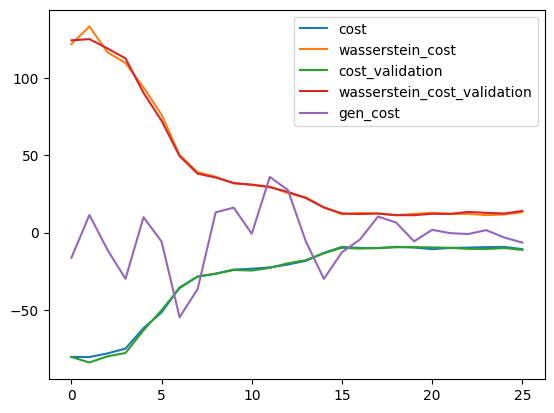

2023-12-30 14:34:06,498 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:34:08,599 - g4gan - INFO - D_self: 242.61
INFO:g4gan:D_self: 242.61
2023-12-30 14:34:08,603 - g4gan - INFO - D_train: 245.93
INFO:g4gan:D_train: 245.93


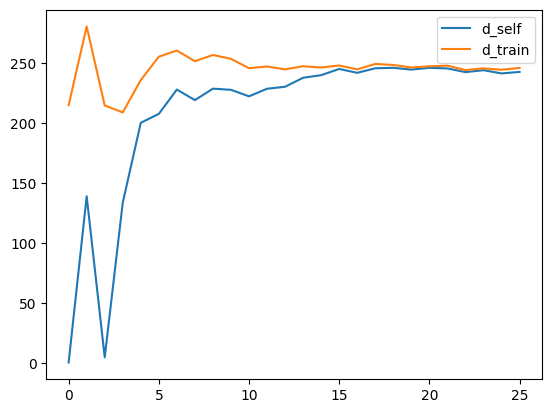

2023-12-30 14:34:08,826 - g4gan - INFO - Epoch: 27/200
INFO:g4gan:Epoch: 27/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:34:37,660 - g4gan - INFO - {'discriminator': [{'cost': -10.54025650024414,
                    'cost_validation': -10.195545196533203,
                    'wasserstein_cost': 13.215702056884766,
                    'wasserstein_cost_validation': 12.757429122924805},
                   {'cost': -9.860947608947754,
                    'cost_validation': -10.505135536193848,
                    'wasserstein_cost': 12.568599700927734,
                    'wasserstein_cost_validation': 12.840410232543945},
                   {'cost': -10.022367477416992,
                    'cost_validation': -10.906166076660156,
                    'wasserstein_cost': 12.185522079467773,
                   

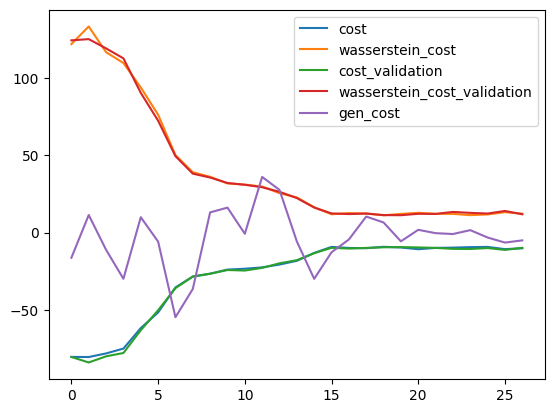

2023-12-30 14:34:37,885 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:34:40,354 - g4gan - INFO - D_self: 242.72
INFO:g4gan:D_self: 242.72
2023-12-30 14:34:40,361 - g4gan - INFO - D_train: 245.06
INFO:g4gan:D_train: 245.06


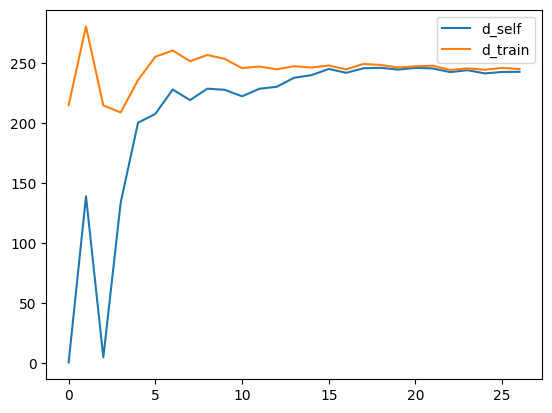

2023-12-30 14:34:40,679 - g4gan - INFO - Epoch: 28/200
INFO:g4gan:Epoch: 28/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:35:09,548 - g4gan - INFO - {'discriminator': [{'cost': -8.563474655151367,
                    'cost_validation': -9.866766929626465,
                    'wasserstein_cost': 11.447880744934082,
                    'wasserstein_cost_validation': 11.864815711975098},
                   {'cost': -11.014236450195312,
                    'cost_validation': -10.566781997680664,
                    'wasserstein_cost': 13.466958045959473,
                    'wasserstein_cost_validation': 13.279304504394531},
                   {'cost': -11.211204528808594,
                    'cost_validation': -8.055882453918457,
                    'wasserstein_cost': 14.096426010131836,
                    

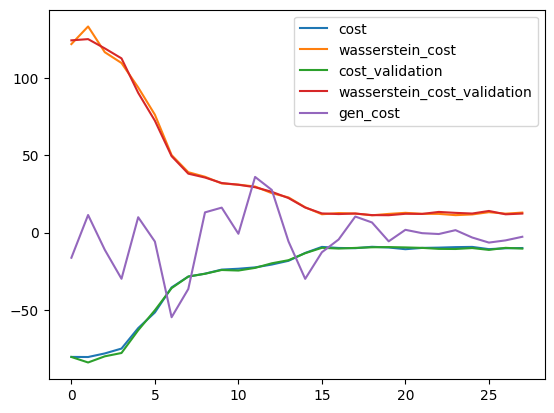

2023-12-30 14:35:09,880 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:35:13,650 - g4gan - INFO - D_self: 244.81
INFO:g4gan:D_self: 244.81
2023-12-30 14:35:13,654 - g4gan - INFO - D_train: 247.73
INFO:g4gan:D_train: 247.73


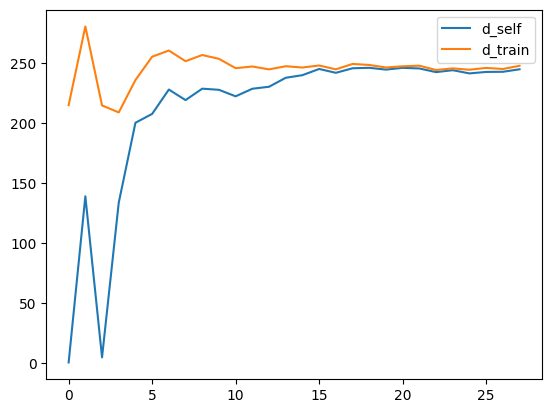

2023-12-30 14:35:13,956 - g4gan - INFO - Epoch: 29/200
INFO:g4gan:Epoch: 29/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:35:42,772 - g4gan - INFO - {'discriminator': [{'cost': -9.625123977661133,
                    'cost_validation': -11.995706558227539,
                    'wasserstein_cost': 11.946319580078125,
                    'wasserstein_cost_validation': 13.781902313232422},
                   {'cost': -10.473346710205078,
                    'cost_validation': -10.057361602783203,
                    'wasserstein_cost': 12.562607765197754,
                    'wasserstein_cost_validation': 12.991914749145508},
                   {'cost': -9.692476272583008,
                    'cost_validation': -10.41013240814209,
                    'wasserstein_cost': 12.373653411865234,
                    

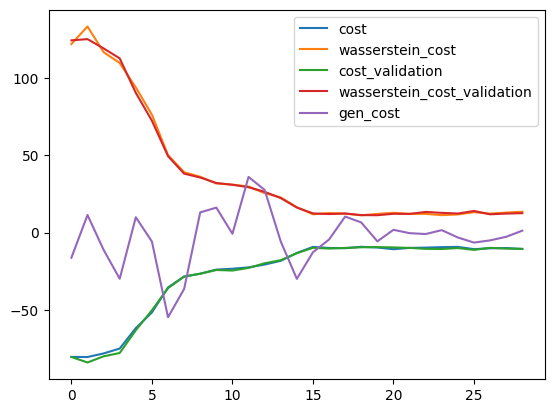

2023-12-30 14:35:43,103 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:35:45,584 - g4gan - INFO - D_self: 242.59
INFO:g4gan:D_self: 242.59
2023-12-30 14:35:45,588 - g4gan - INFO - D_train: 244.14
INFO:g4gan:D_train: 244.14


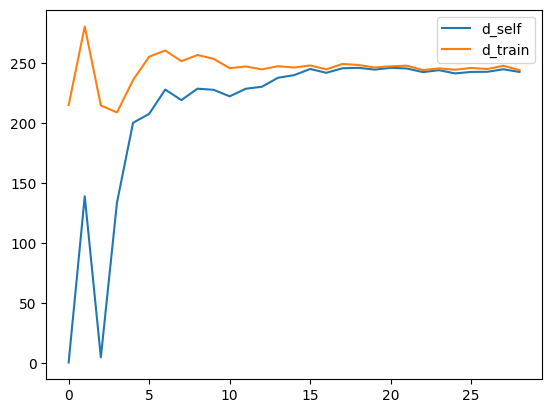

2023-12-30 14:35:45,833 - g4gan - INFO - Epoch: 30/200
INFO:g4gan:Epoch: 30/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:36:14,620 - g4gan - INFO - {'discriminator': [{'cost': -10.62797737121582,
                    'cost_validation': -11.304559707641602,
                    'wasserstein_cost': 13.702672958374023,
                    'wasserstein_cost_validation': 13.948932647705078},
                   {'cost': -10.835697174072266,
                    'cost_validation': -11.181008338928223,
                    'wasserstein_cost': 13.049947738647461,
                    'wasserstein_cost_validation': 13.465025901794434},
                   {'cost': -10.801847457885742,
                    'cost_validation': -9.969659805297852,
                    'wasserstein_cost': 13.11866569519043,
                    

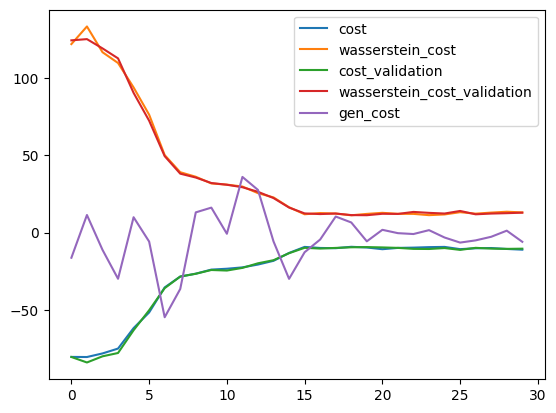

2023-12-30 14:36:14,868 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:36:16,985 - g4gan - INFO - D_self: 243.98
INFO:g4gan:D_self: 243.98
2023-12-30 14:36:16,991 - g4gan - INFO - D_train: 245.9
INFO:g4gan:D_train: 245.9


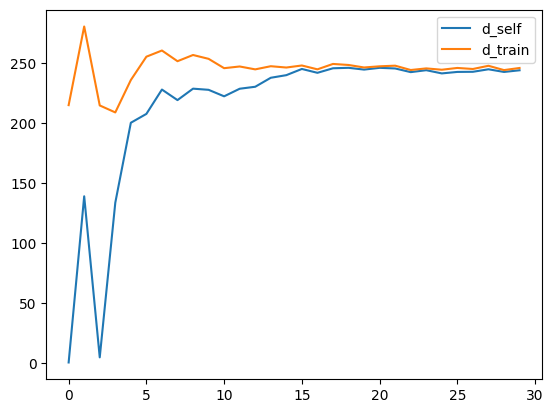

2023-12-30 14:36:17,209 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:36:17,217 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:36:17,305 - g4gan - INFO - Epoch: 31/200
INFO:g4gan:Epoch: 31/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    A   A   A   A   C   A   A   C   T   A  ...   G   G   C   T   G   C   C   
1    A   C   A   A   C   C   G   A   T   G  ...   C   T   C   G   C   C   C   
2    A   A   C   A   T   T   A   T   A   A  ...   A   T   G   T   T   C   A   
3    A   A   C   C   A   G   C   C   C   G  ...   A   C   G   C   A   G   T   
4    A   T   A   G   C   A   A   G   A   A  ...   A   A   G   T   G   G   A   
5    A   A   G   C   C   T   G   A   G   C  ...   C   T   G   C   C   G   A   
6    T   A   C   A   T   A   T   C   C   G  ...   G   C   C   T   C   C   G   
7    A   G   C   C   C   G   G   C   G   C  ...   G   G   G   C   C   T   G   
8    T   A   C   T   T   G   G   G   C   T  ...   A   G   G   C   G   T   T   
9    A   A   C   A   G   A   A   G   G   A  ...   G   C   G   C   C   C   C   
10   A   A   C   C   T   C   T   C   G   A  ...   G   T   C   C   A   C   C   
11   A   A   G   C   G   T   G   C   C   A  ...   T 

2023-12-30 14:36:46,083 - g4gan - INFO - {'discriminator': [{'cost': -10.601142883300781,
                    'cost_validation': -11.91157341003418,
                    'wasserstein_cost': 13.100667953491211,
                    'wasserstein_cost_validation': 13.894311904907227},
                   {'cost': -9.726311683654785,
                    'cost_validation': -10.805207252502441,
                    'wasserstein_cost': 11.952722549438477,
                    'wasserstein_cost_validation': 12.677078247070312},
                   {'cost': -10.52656078338623,
                    'cost_validation': -9.866935729980469,
                    'wasserstein_cost': 13.077110290527344,
                    'wasserstein_cost_validation': 12.889852523803711},
                   {'cost': -9.467979431152344,
                    'cost_validation': -10.822479248046875,
                    'wasserstein_cost': 11.858896255493164,
                    'wasserstein_cost_validation': 13.83047866821289},
 

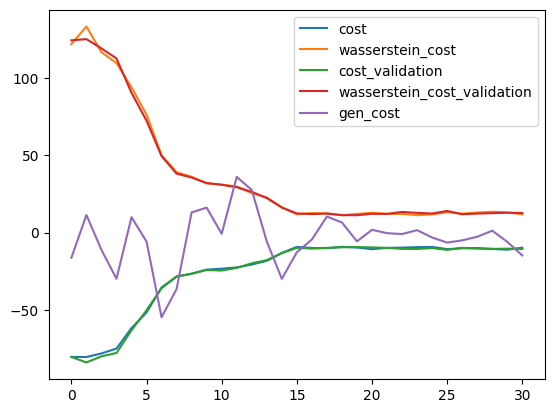

2023-12-30 14:36:46,327 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:36:48,466 - g4gan - INFO - D_self: 241.25
INFO:g4gan:D_self: 241.25
2023-12-30 14:36:48,469 - g4gan - INFO - D_train: 244.07
INFO:g4gan:D_train: 244.07


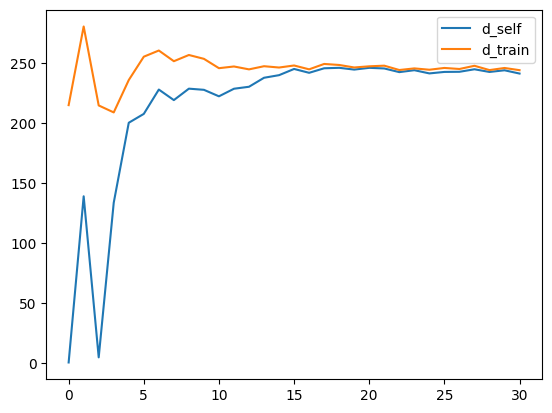

2023-12-30 14:36:48,727 - g4gan - INFO - Epoch: 32/200
INFO:g4gan:Epoch: 32/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:37:17,513 - g4gan - INFO - {'discriminator': [{'cost': -10.206991195678711,
                    'cost_validation': -9.747933387756348,
                    'wasserstein_cost': 12.516603469848633,
                    'wasserstein_cost_validation': 12.086320877075195},
                   {'cost': -9.497772216796875,
                    'cost_validation': -11.38849925994873,
                    'wasserstein_cost': 11.770820617675781,
                    'wasserstein_cost_validation': 14.349937438964844},
                   {'cost': -11.075546264648438,
                    'cost_validation': -10.599796295166016,
                    'wasserstein_cost': 13.567943572998047,
                    

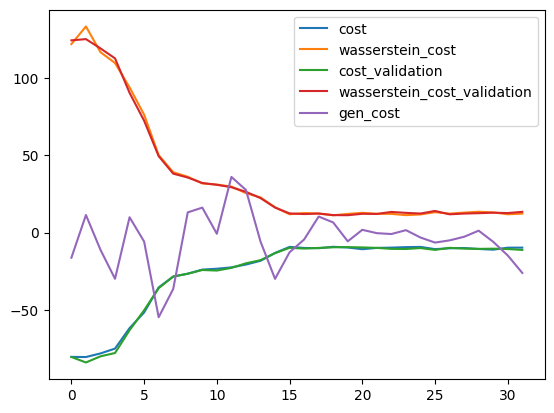

2023-12-30 14:37:17,778 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:37:19,944 - g4gan - INFO - D_self: 244.42
INFO:g4gan:D_self: 244.42
2023-12-30 14:37:19,948 - g4gan - INFO - D_train: 247.05
INFO:g4gan:D_train: 247.05


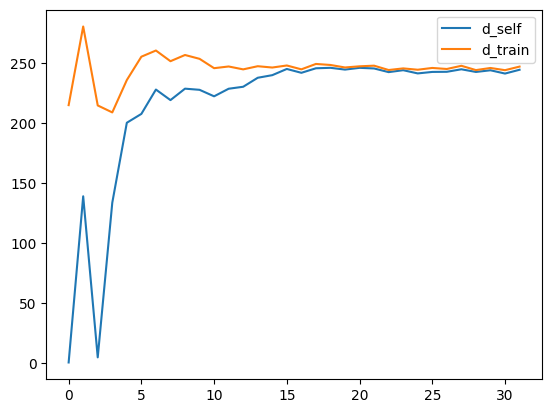

2023-12-30 14:37:20,192 - g4gan - INFO - Epoch: 33/200
INFO:g4gan:Epoch: 33/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:37:48,904 - g4gan - INFO - {'discriminator': [{'cost': -9.79890251159668,
                    'cost_validation': -10.70410442352295,
                    'wasserstein_cost': 12.208826065063477,
                    'wasserstein_cost_validation': 13.15910816192627},
                   {'cost': -11.854236602783203,
                    'cost_validation': -10.682538986206055,
                    'wasserstein_cost': 14.88166618347168,
                    'wasserstein_cost_validation': 14.149089813232422},
                   {'cost': -9.445058822631836,
                    'cost_validation': -11.027490615844727,
                    'wasserstein_cost': 12.263553619384766,
                    'wa

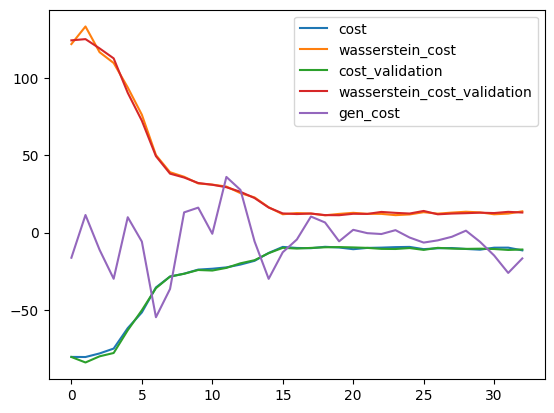

2023-12-30 14:37:49,156 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:37:52,130 - g4gan - INFO - D_self: 244.39
INFO:g4gan:D_self: 244.39
2023-12-30 14:37:52,134 - g4gan - INFO - D_train: 246.69
INFO:g4gan:D_train: 246.69


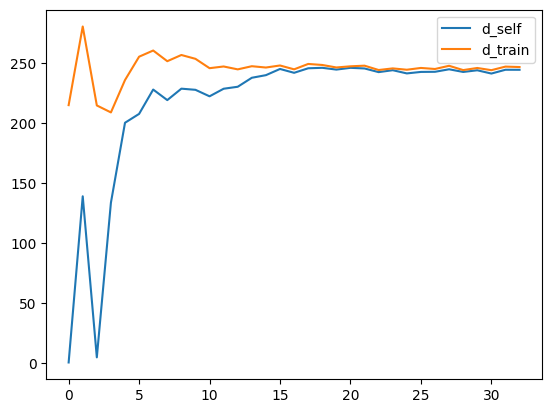

2023-12-30 14:37:52,431 - g4gan - INFO - Epoch: 34/200
INFO:g4gan:Epoch: 34/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:38:21,164 - g4gan - INFO - {'discriminator': [{'cost': -9.429360389709473,
                    'cost_validation': -9.494300842285156,
                    'wasserstein_cost': 12.56381607055664,
                    'wasserstein_cost_validation': 11.745792388916016},
                   {'cost': -11.089983940124512,
                    'cost_validation': -11.625024795532227,
                    'wasserstein_cost': 13.979572296142578,
                    'wasserstein_cost_validation': 14.08121109008789},
                   {'cost': -12.231504440307617,
                    'cost_validation': -10.68124771118164,
                    'wasserstein_cost': 15.008060455322266,
                    'w

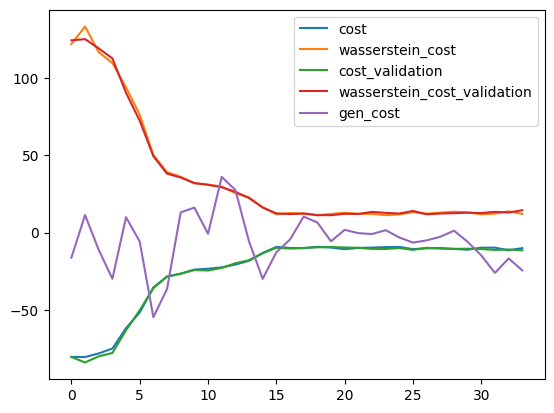

2023-12-30 14:38:21,505 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:38:25,192 - g4gan - INFO - D_self: 243.09
INFO:g4gan:D_self: 243.09
2023-12-30 14:38:25,197 - g4gan - INFO - D_train: 245.97
INFO:g4gan:D_train: 245.97


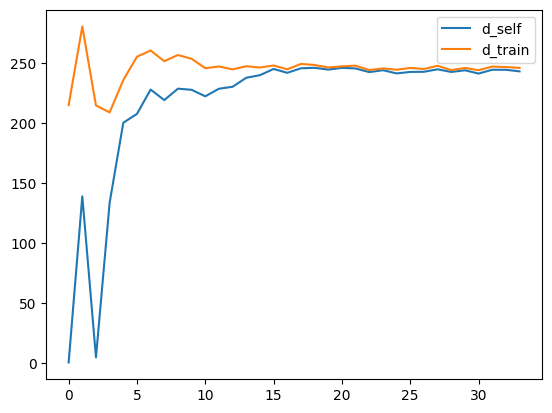

2023-12-30 14:38:25,445 - g4gan - INFO - Epoch: 35/200
INFO:g4gan:Epoch: 35/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:38:54,762 - g4gan - INFO - {'discriminator': [{'cost': -9.26758861541748,
                    'cost_validation': -9.519893646240234,
                    'wasserstein_cost': 13.533315658569336,
                    'wasserstein_cost_validation': 12.013973236083984},
                   {'cost': -10.549442291259766,
                    'cost_validation': -11.789871215820312,
                    'wasserstein_cost': 13.459123611450195,
                    'wasserstein_cost_validation': 14.26457405090332},
                   {'cost': -11.338961601257324,
                    'cost_validation': -12.810211181640625,
                    'wasserstein_cost': 13.363889694213867,
                    '

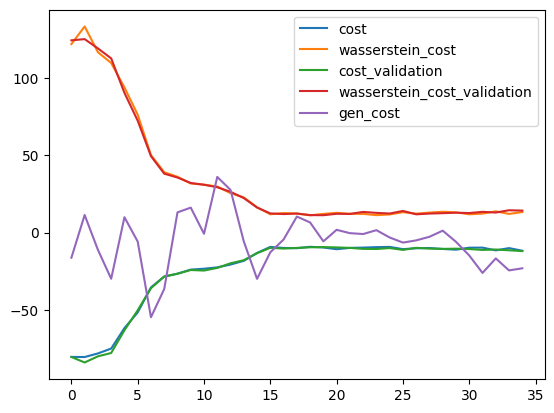

2023-12-30 14:38:55,161 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:38:59,128 - g4gan - INFO - D_self: 244.66
INFO:g4gan:D_self: 244.66
2023-12-30 14:38:59,132 - g4gan - INFO - D_train: 247.08
INFO:g4gan:D_train: 247.08


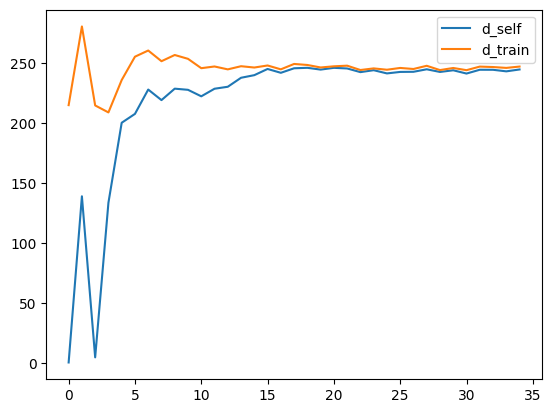

2023-12-30 14:38:59,498 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:38:59,505 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:38:59,590 - g4gan - INFO - Epoch: 36/200
INFO:g4gan:Epoch: 36/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    A   A   A   A   C   A   A   C   A   A  ...   G   T   C   T   G   C   C   
1    A   C   A   A   C   C   C   A   T   G  ...   C   A   C   G   C   C   C   
2    A   A   C   A   T   T   A   T   A   A  ...   A   T   G   T   T   G   A   
3    A   A   C   C   A   G   C   C   C   G  ...   A   C   G   C   A   G   T   
4    A   A   A   T   C   A   A   G   A   A  ...   A   A   G   T   G   G   A   
5    A   A   G   C   C   T   G   A   G   C  ...   C   T   G   C   C   G   A   
6    T   A   C   A   G   T   T   C   C   T  ...   G   C   C   T   C   C   G   
7    A   G   C   C   C   G   G   C   G   C  ...   G   G   G   C   C   T   C   
8    T   A   C   T   T   G   G   G   C   T  ...   A   G   G   C   T   T   A   
9    A   A   C   A   G   A   A   G   G   A  ...   G   C   C   C   C   C   C   
10   A   A   C   C   T   C   T   C   G   A  ...   T   T   C   C   A   C   C   
11   A   A   C   C   G   T   G   C   C   A  ...   T 

2023-12-30 14:39:28,723 - g4gan - INFO - {'discriminator': [{'cost': -10.61111068725586,
                    'cost_validation': -10.843759536743164,
                    'wasserstein_cost': 13.05612564086914,
                    'wasserstein_cost_validation': 13.121742248535156},
                   {'cost': -10.338350296020508,
                    'cost_validation': -9.847050666809082,
                    'wasserstein_cost': 12.917695999145508,
                    'wasserstein_cost_validation': 11.822053909301758},
                   {'cost': -10.31050968170166,
                    'cost_validation': -9.862944602966309,
                    'wasserstein_cost': 12.325626373291016,
                    'wasserstein_cost_validation': 11.864776611328125},
                   {'cost': -10.224160194396973,
                    'cost_validation': -12.28713607788086,
                    'wasserstein_cost': 12.00480842590332,
                    'wasserstein_cost_validation': 14.307289123535156},
  

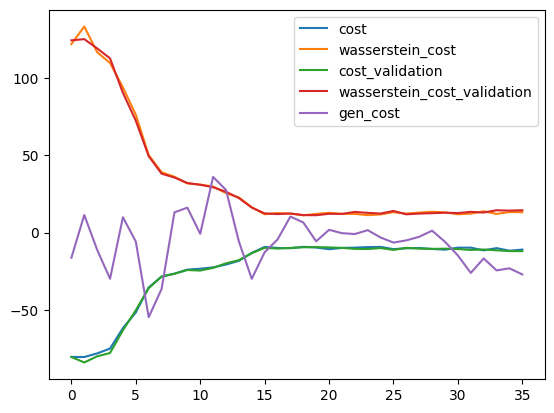

2023-12-30 14:39:28,959 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:39:31,070 - g4gan - INFO - D_self: 246.88
INFO:g4gan:D_self: 246.88
2023-12-30 14:39:31,075 - g4gan - INFO - D_train: 249.2
INFO:g4gan:D_train: 249.2


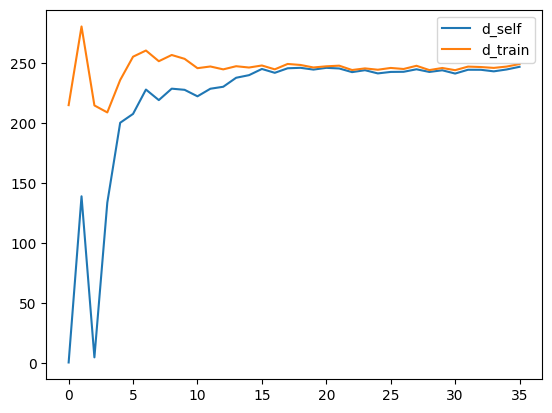

2023-12-30 14:39:31,383 - g4gan - INFO - Epoch: 37/200
INFO:g4gan:Epoch: 37/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:40:00,098 - g4gan - INFO - {'discriminator': [{'cost': -10.264387130737305,
                    'cost_validation': -11.554778099060059,
                    'wasserstein_cost': 13.958168029785156,
                    'wasserstein_cost_validation': 14.847358703613281},
                   {'cost': -12.645444869995117,
                    'cost_validation': -11.340812683105469,
                    'wasserstein_cost': 15.477981567382812,
                    'wasserstein_cost_validation': 14.428836822509766},
                   {'cost': -11.723087310791016,
                    'cost_validation': -10.7977876663208,
                    'wasserstein_cost': 14.509090423583984,
                   

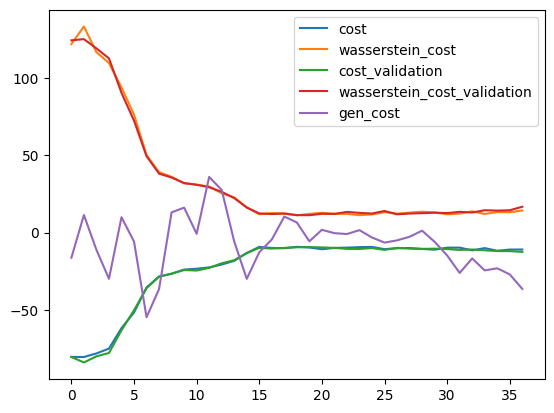

2023-12-30 14:40:00,360 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:40:02,521 - g4gan - INFO - D_self: 242.52
INFO:g4gan:D_self: 242.52
2023-12-30 14:40:02,528 - g4gan - INFO - D_train: 244.8
INFO:g4gan:D_train: 244.8


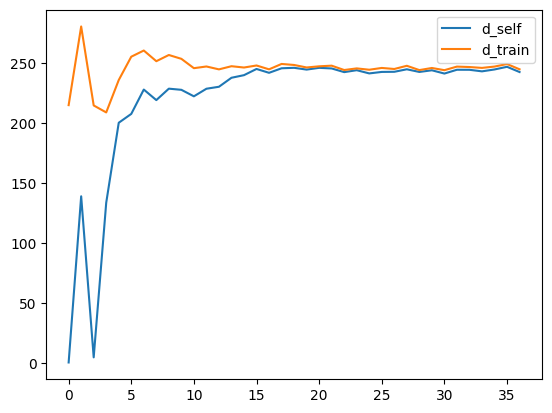

2023-12-30 14:40:02,808 - g4gan - INFO - Epoch: 38/200
INFO:g4gan:Epoch: 38/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:40:31,680 - g4gan - INFO - {'discriminator': [{'cost': -9.502305030822754,
                    'cost_validation': -10.669536590576172,
                    'wasserstein_cost': 12.655057907104492,
                    'wasserstein_cost_validation': 13.313034057617188},
                   {'cost': -10.755213737487793,
                    'cost_validation': -9.83094596862793,
                    'wasserstein_cost': 13.792028427124023,
                    'wasserstein_cost_validation': 12.632022857666016},
                   {'cost': -9.808074951171875,
                    'cost_validation': -11.336344718933105,
                    'wasserstein_cost': 12.741689682006836,
                    '

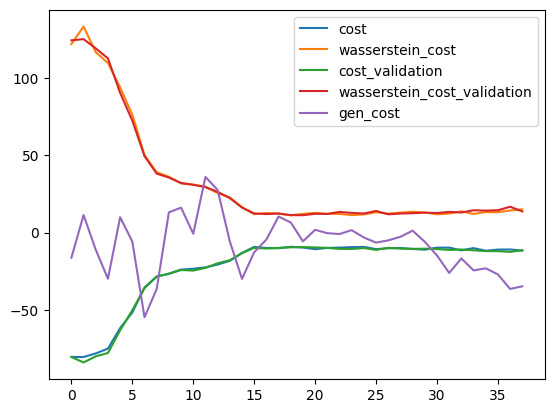

2023-12-30 14:40:31,940 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:40:34,058 - g4gan - INFO - D_self: 242.75
INFO:g4gan:D_self: 242.75
2023-12-30 14:40:34,063 - g4gan - INFO - D_train: 247.33
INFO:g4gan:D_train: 247.33


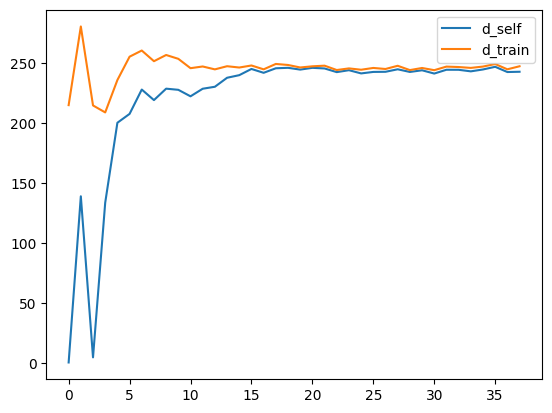

2023-12-30 14:40:34,315 - g4gan - INFO - Epoch: 39/200
INFO:g4gan:Epoch: 39/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:41:03,166 - g4gan - INFO - {'discriminator': [{'cost': -10.861956596374512,
                    'cost_validation': -10.726325988769531,
                    'wasserstein_cost': 13.063278198242188,
                    'wasserstein_cost_validation': 12.682064056396484},
                   {'cost': -12.595515251159668,
                    'cost_validation': -11.570354461669922,
                    'wasserstein_cost': 15.691642761230469,
                    'wasserstein_cost_validation': 14.063758850097656},
                   {'cost': -10.992663383483887,
                    'cost_validation': -11.165175437927246,
                    'wasserstein_cost': 12.965982437133789,
                 

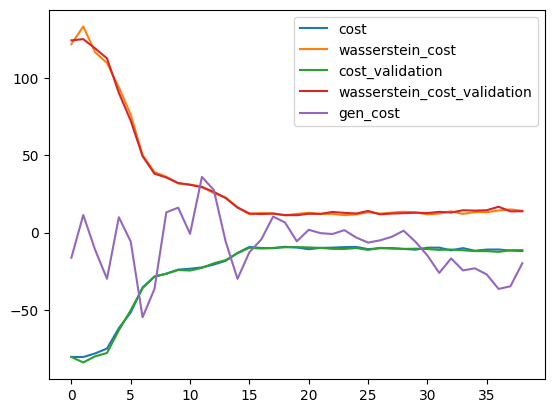

2023-12-30 14:41:03,432 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:41:05,780 - g4gan - INFO - D_self: 246.28
INFO:g4gan:D_self: 246.28
2023-12-30 14:41:05,788 - g4gan - INFO - D_train: 249.07
INFO:g4gan:D_train: 249.07


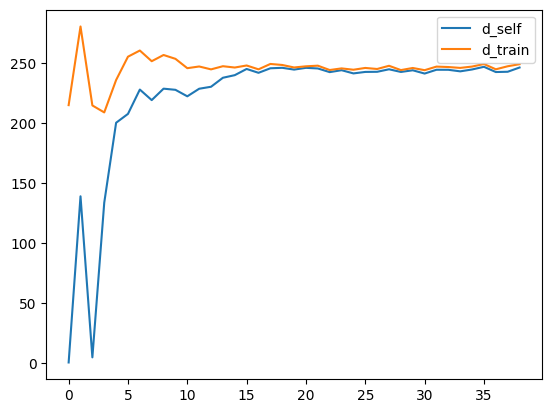

2023-12-30 14:41:06,124 - g4gan - INFO - Epoch: 40/200
INFO:g4gan:Epoch: 40/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:41:35,025 - g4gan - INFO - {'discriminator': [{'cost': -10.323712348937988,
                    'cost_validation': -11.702312469482422,
                    'wasserstein_cost': 13.663997650146484,
                    'wasserstein_cost_validation': 16.34516143798828},
                   {'cost': -11.236620903015137,
                    'cost_validation': -10.09998893737793,
                    'wasserstein_cost': 14.551006317138672,
                    'wasserstein_cost_validation': 14.556137084960938},
                   {'cost': -11.156145095825195,
                    'cost_validation': -9.369441032409668,
                    'wasserstein_cost': 16.164432525634766,
                    

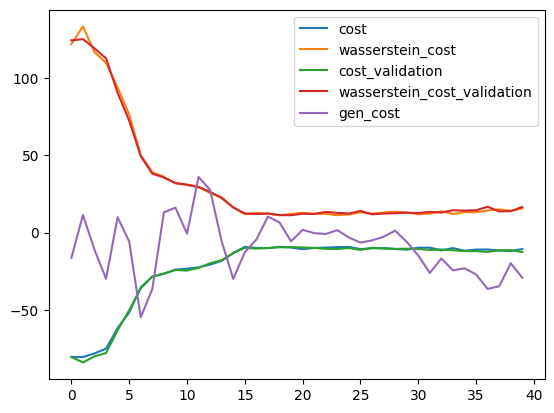

2023-12-30 14:41:35,677 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:41:39,467 - g4gan - INFO - D_self: 244.35
INFO:g4gan:D_self: 244.35
2023-12-30 14:41:39,475 - g4gan - INFO - D_train: 245.9
INFO:g4gan:D_train: 245.9


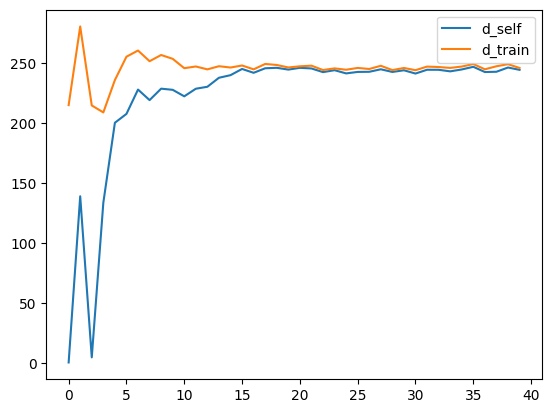

2023-12-30 14:41:39,787 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:41:39,798 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:41:39,897 - g4gan - INFO - Epoch: 41/200
INFO:g4gan:Epoch: 41/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    A   A   A   A   C   A   A   C   A   A  ...   G   T   C   T   G   C   C   
1    A   C   A   A   C   C   C   A   G   G  ...   C   A   C   G   C   C   C   
2    A   A   C   A   T   A   A   A   A   A  ...   A   A   G   T   T   G   A   
3    T   A   C   C   A   G   C   C   C   G  ...   A   C   G   C   A   G   G   
4    A   A   A   T   C   A   A   G   A   A  ...   A   A   G   T   G   G   A   
5    A   A   G   C   C   T   G   A   G   C  ...   C   T   G   C   C   G   A   
6    T   A   C   A   G   T   T   C   C   G  ...   G   C   C   T   C   G   G   
7    A   G   C   C   C   T   G   C   G   C  ...   G   G   G   C   C   T   G   
8    T   A   C   T   T   G   G   G   C   T  ...   A   G   G   C   T   T   A   
9    A   A   C   A   G   A   A   G   G   A  ...   T   C   G   C   C   C   C   
10   A   A   C   C   T   C   T   C   G   A  ...   G   T   C   C   A   C   C   
11   A   A   C   C   G   T   G   C   C   A  ...   T 

2023-12-30 14:42:08,927 - g4gan - INFO - {'discriminator': [{'cost': -11.367521286010742,
                    'cost_validation': -12.022406578063965,
                    'wasserstein_cost': 13.149137496948242,
                    'wasserstein_cost_validation': 14.648651123046875},
                   {'cost': -10.5164794921875,
                    'cost_validation': -10.502372741699219,
                    'wasserstein_cost': 12.568492889404297,
                    'wasserstein_cost_validation': 12.832576751708984},
                   {'cost': -12.685956001281738,
                    'cost_validation': -11.792655944824219,
                    'wasserstein_cost': 15.110071182250977,
                    'wasserstein_cost_validation': 13.883321762084961},
                   {'cost': -10.135010719299316,
                    'cost_validation': -11.505620956420898,
                    'wasserstein_cost': 12.229011535644531,
                    'wasserstein_cost_validation': 14.176599502563477

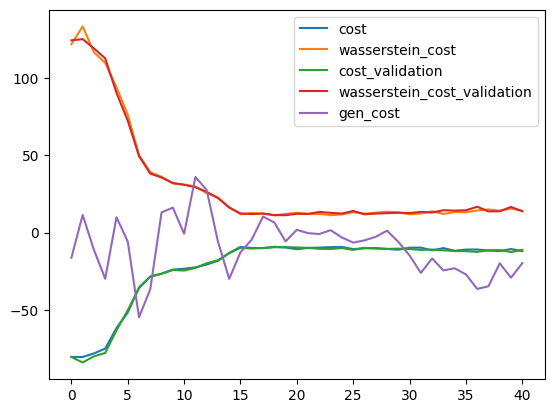

2023-12-30 14:42:09,312 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:42:11,819 - g4gan - INFO - D_self: 245.74
INFO:g4gan:D_self: 245.74
2023-12-30 14:42:11,823 - g4gan - INFO - D_train: 247.28
INFO:g4gan:D_train: 247.28


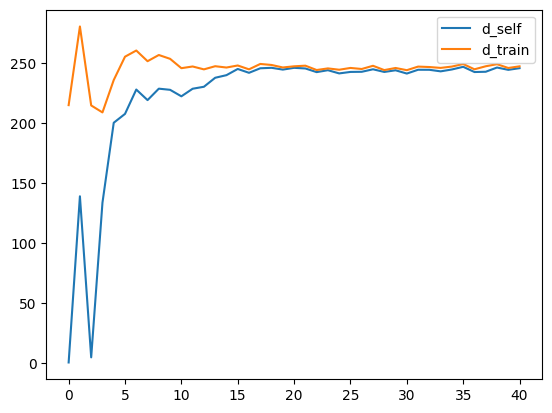

2023-12-30 14:42:12,079 - g4gan - INFO - Epoch: 42/200
INFO:g4gan:Epoch: 42/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:42:40,923 - g4gan - INFO - {'discriminator': [{'cost': -9.492862701416016,
                    'cost_validation': -11.70651626586914,
                    'wasserstein_cost': 12.470130920410156,
                    'wasserstein_cost_validation': 14.227787017822266},
                   {'cost': -11.729933738708496,
                    'cost_validation': -10.920465469360352,
                    'wasserstein_cost': 13.727022171020508,
                    'wasserstein_cost_validation': 13.712366104125977},
                   {'cost': -10.186946868896484,
                    'cost_validation': -9.803739547729492,
                    'wasserstein_cost': 13.005399703979492,
                    

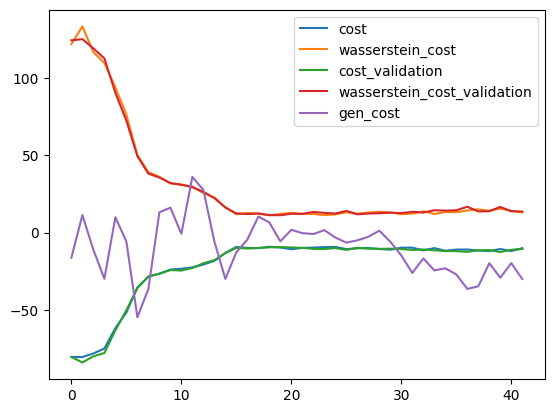

2023-12-30 14:42:41,175 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:42:43,334 - g4gan - INFO - D_self: 245.64
INFO:g4gan:D_self: 245.64
2023-12-30 14:42:43,339 - g4gan - INFO - D_train: 248.29
INFO:g4gan:D_train: 248.29


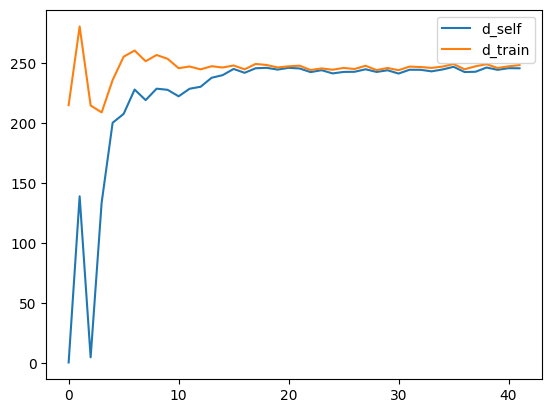

2023-12-30 14:42:43,631 - g4gan - INFO - Epoch: 43/200
INFO:g4gan:Epoch: 43/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:43:12,443 - g4gan - INFO - {'discriminator': [{'cost': -9.025642395019531,
                    'cost_validation': -9.34814739227295,
                    'wasserstein_cost': 11.718994140625,
                    'wasserstein_cost_validation': 12.033308029174805},
                   {'cost': -9.209891319274902,
                    'cost_validation': -11.849845886230469,
                    'wasserstein_cost': 11.901847839355469,
                    'wasserstein_cost_validation': 14.709653854370117},
                   {'cost': -11.710419654846191,
                    'cost_validation': -13.274835586547852,
                    'wasserstein_cost': 14.429288864135742,
                    'was

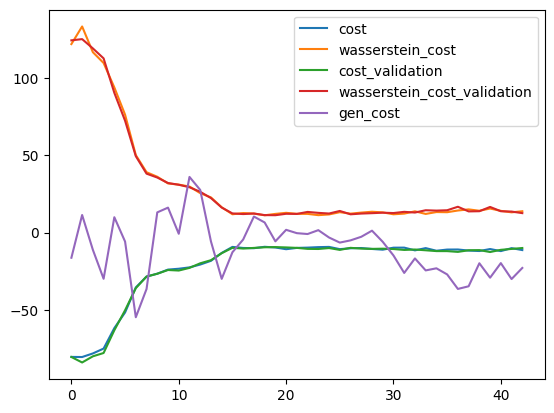

2023-12-30 14:43:12,692 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:43:14,874 - g4gan - INFO - D_self: 243.36
INFO:g4gan:D_self: 243.36
2023-12-30 14:43:14,879 - g4gan - INFO - D_train: 245.41
INFO:g4gan:D_train: 245.41


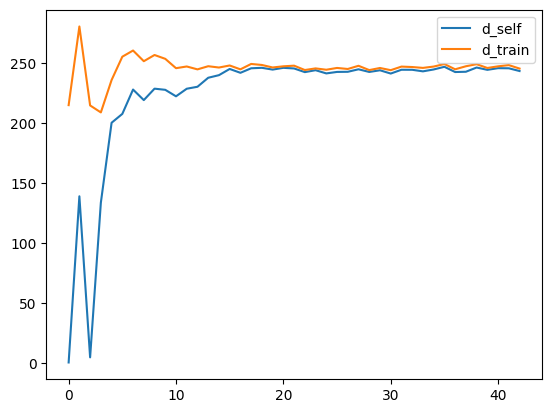

2023-12-30 14:43:15,145 - g4gan - INFO - Epoch: 44/200
INFO:g4gan:Epoch: 44/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:43:44,101 - g4gan - INFO - {'discriminator': [{'cost': -10.124080657958984,
                    'cost_validation': -9.867964744567871,
                    'wasserstein_cost': 12.906082153320312,
                    'wasserstein_cost_validation': 12.539443969726562},
                   {'cost': -10.599172592163086,
                    'cost_validation': -10.995820045471191,
                    'wasserstein_cost': 13.42723274230957,
                    'wasserstein_cost_validation': 13.699575424194336},
                   {'cost': -10.154324531555176,
                    'cost_validation': -10.481922149658203,
                    'wasserstein_cost': 12.492645263671875,
                   

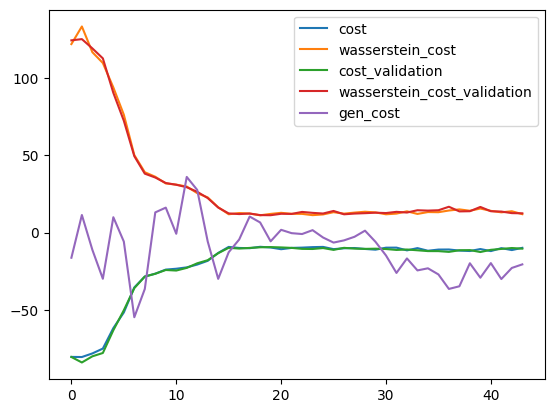

2023-12-30 14:43:44,348 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:43:46,562 - g4gan - INFO - D_self: 245.68
INFO:g4gan:D_self: 245.68
2023-12-30 14:43:46,566 - g4gan - INFO - D_train: 246.91
INFO:g4gan:D_train: 246.91


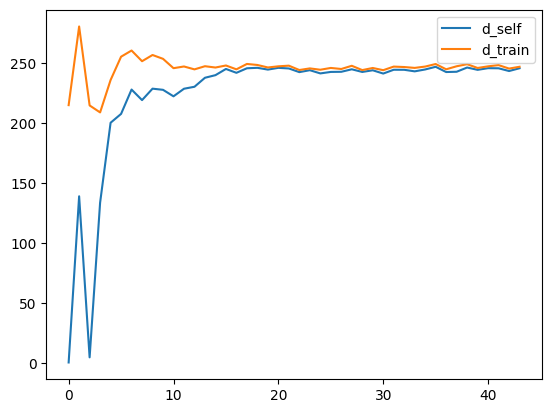

2023-12-30 14:43:46,812 - g4gan - INFO - Epoch: 45/200
INFO:g4gan:Epoch: 45/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:44:15,805 - g4gan - INFO - {'discriminator': [{'cost': -9.458841323852539,
                    'cost_validation': -10.664825439453125,
                    'wasserstein_cost': 11.655073165893555,
                    'wasserstein_cost_validation': 13.372749328613281},
                   {'cost': -10.807544708251953,
                    'cost_validation': -8.809202194213867,
                    'wasserstein_cost': 13.407470703125,
                    'wasserstein_cost_validation': 11.366106033325195},
                   {'cost': -9.737334251403809,
                    'cost_validation': -9.43170166015625,
                    'wasserstein_cost': 12.199798583984375,
                    'wass

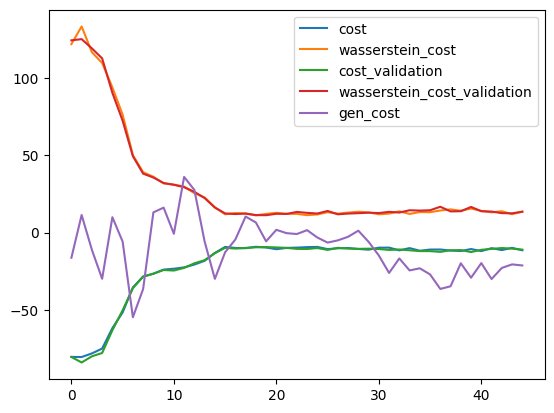

2023-12-30 14:44:16,051 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:44:19,325 - g4gan - INFO - D_self: 246.2
INFO:g4gan:D_self: 246.2
2023-12-30 14:44:19,329 - g4gan - INFO - D_train: 247.48
INFO:g4gan:D_train: 247.48


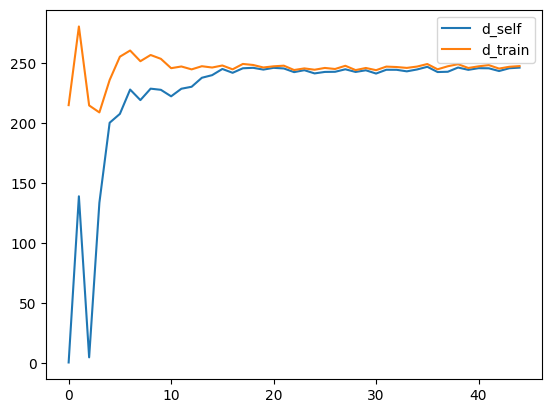

2023-12-30 14:44:19,639 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:44:19,646 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:44:19,738 - g4gan - INFO - Epoch: 46/200
INFO:g4gan:Epoch: 46/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    A   A   A   A   C   A   A   C   A   A  ...   G   T   C   T   G   C   C   
1    A   C   A   A   C   C   C   T   G   G  ...   C   A   C   C   C   C   C   
2    A   A   C   A   G   A   A   T   A   A  ...   A   A   G   T   T   G   A   
3    T   A   C   C   T   G   C   C   C   G  ...   A   C   G   C   A   G   T   
4    A   A   A   T   C   A   A   G   A   T  ...   T   A   G   T   G   C   A   
5    A   A   C   C   C   T   G   A   G   C  ...   C   T   G   C   C   G   A   
6    G   A   C   A   G   T   T   C   C   T  ...   G   C   C   T   C   G   G   
7    A   G   C   C   C   G   G   C   G   C  ...   G   G   G   C   C   T   C   
8    G   A   C   T   T   G   G   G   C   T  ...   A   C   G   C   T   T   A   
9    A   A   C   A   G   A   A   G   G   T  ...   T   C   C   C   C   C   C   
10   A   A   C   C   T   C   T   C   C   A  ...   T   T   C   C   A   C   C   
11   A   A   C   C   G   G   G   C   C   A  ...   T 

2023-12-30 14:44:48,622 - g4gan - INFO - {'discriminator': [{'cost': -9.437532424926758,
                    'cost_validation': -10.54876708984375,
                    'wasserstein_cost': 12.282962799072266,
                    'wasserstein_cost_validation': 12.973037719726562},
                   {'cost': -9.365684509277344,
                    'cost_validation': -9.66862678527832,
                    'wasserstein_cost': 11.554298400878906,
                    'wasserstein_cost_validation': 11.773921966552734},
                   {'cost': -11.468561172485352,
                    'cost_validation': -10.416570663452148,
                    'wasserstein_cost': 14.05599594116211,
                    'wasserstein_cost_validation': 12.823127746582031},
                   {'cost': -11.728962898254395,
                    'cost_validation': -9.488405227661133,
                    'wasserstein_cost': 14.35201644897461,
                    'wasserstein_cost_validation': 11.792854309082031},
   

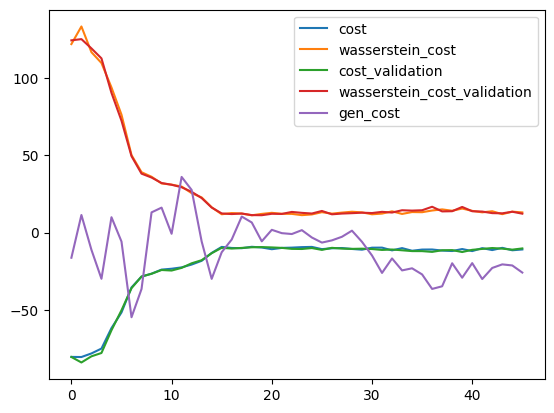

2023-12-30 14:44:48,946 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:44:52,660 - g4gan - INFO - D_self: 247.09
INFO:g4gan:D_self: 247.09
2023-12-30 14:44:52,663 - g4gan - INFO - D_train: 248.32
INFO:g4gan:D_train: 248.32


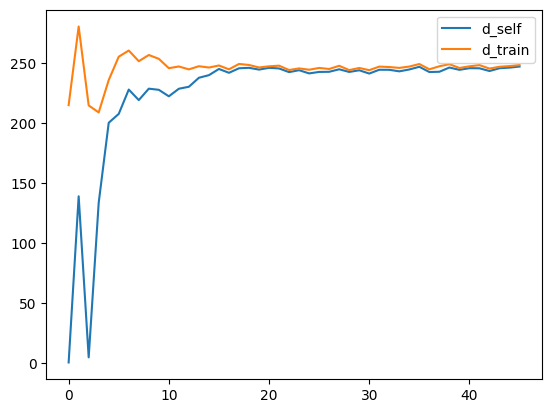

2023-12-30 14:44:52,955 - g4gan - INFO - Epoch: 47/200
INFO:g4gan:Epoch: 47/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:45:21,939 - g4gan - INFO - {'discriminator': [{'cost': -9.779521942138672,
                    'cost_validation': -10.951285362243652,
                    'wasserstein_cost': 13.252786636352539,
                    'wasserstein_cost_validation': 13.427921295166016},
                   {'cost': -10.984214782714844,
                    'cost_validation': -11.53988265991211,
                    'wasserstein_cost': 13.659067153930664,
                    'wasserstein_cost_validation': 14.048295974731445},
                   {'cost': -10.65943717956543,
                    'cost_validation': -11.67674446105957,
                    'wasserstein_cost': 13.190084457397461,
                    '

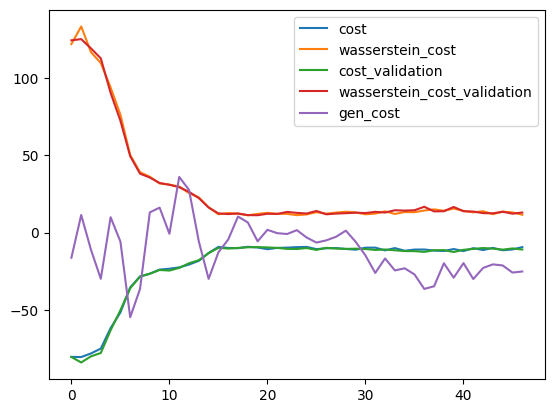

2023-12-30 14:45:22,204 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:45:24,376 - g4gan - INFO - D_self: 243.93
INFO:g4gan:D_self: 243.93
2023-12-30 14:45:24,380 - g4gan - INFO - D_train: 245.31
INFO:g4gan:D_train: 245.31


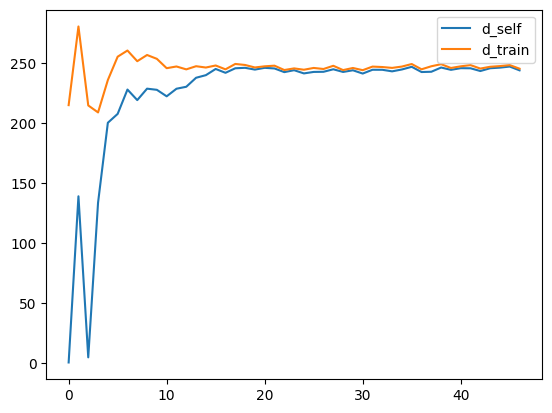

2023-12-30 14:45:24,618 - g4gan - INFO - Epoch: 48/200
INFO:g4gan:Epoch: 48/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:45:53,558 - g4gan - INFO - {'discriminator': [{'cost': -10.66282844543457,
                    'cost_validation': -9.700918197631836,
                    'wasserstein_cost': 12.91766357421875,
                    'wasserstein_cost_validation': 12.068378448486328},
                   {'cost': -10.536344528198242,
                    'cost_validation': -10.695406913757324,
                    'wasserstein_cost': 13.184099197387695,
                    'wasserstein_cost_validation': 13.925647735595703},
                   {'cost': -11.537338256835938,
                    'cost_validation': -10.187097549438477,
                    'wasserstein_cost': 14.867156982421875,
                    

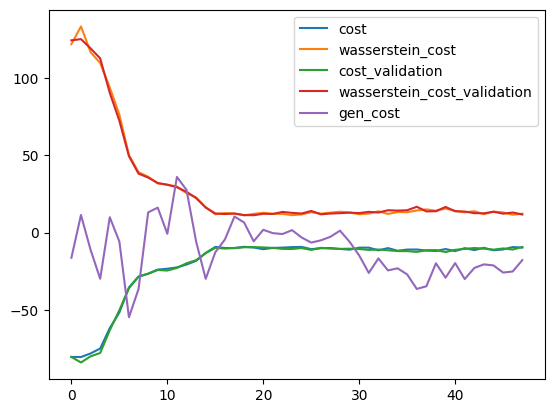

2023-12-30 14:45:53,810 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:45:56,010 - g4gan - INFO - D_self: 246.21
INFO:g4gan:D_self: 246.21
2023-12-30 14:45:56,014 - g4gan - INFO - D_train: 247.83
INFO:g4gan:D_train: 247.83


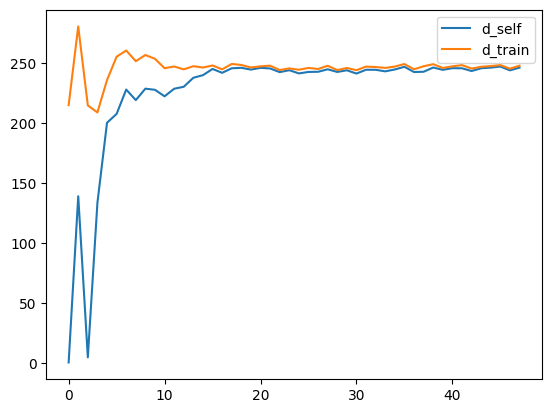

2023-12-30 14:45:56,311 - g4gan - INFO - Epoch: 49/200
INFO:g4gan:Epoch: 49/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:46:25,260 - g4gan - INFO - {'discriminator': [{'cost': -11.446297645568848,
                    'cost_validation': -11.489649772644043,
                    'wasserstein_cost': 13.419294357299805,
                    'wasserstein_cost_validation': 13.919269561767578},
                   {'cost': -11.085057258605957,
                    'cost_validation': -10.328376770019531,
                    'wasserstein_cost': 13.333812713623047,
                    'wasserstein_cost_validation': 12.802328109741211},
                   {'cost': -11.767538070678711,
                    'cost_validation': -10.740133285522461,
                    'wasserstein_cost': 14.252859115600586,
                 

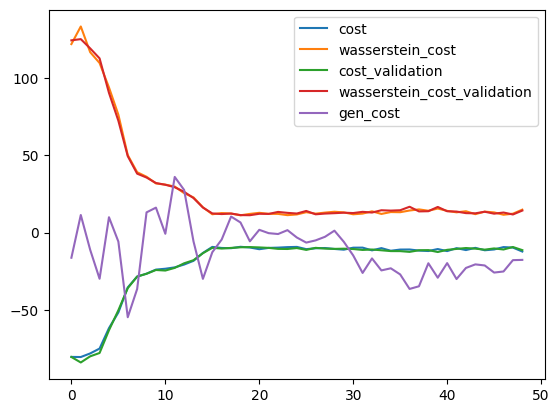

2023-12-30 14:46:25,527 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:46:27,704 - g4gan - INFO - D_self: 245.08
INFO:g4gan:D_self: 245.08
2023-12-30 14:46:27,709 - g4gan - INFO - D_train: 247.38
INFO:g4gan:D_train: 247.38


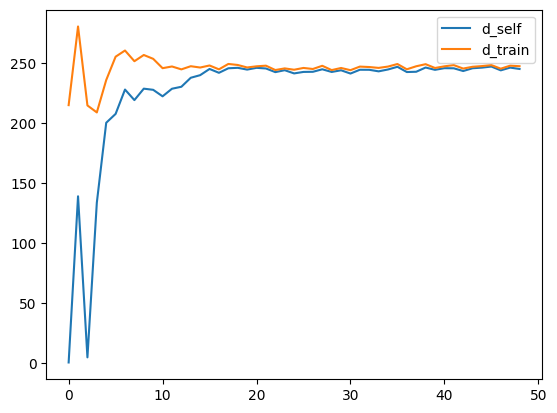

2023-12-30 14:46:27,951 - g4gan - INFO - Epoch: 50/200
INFO:g4gan:Epoch: 50/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:46:56,765 - g4gan - INFO - {'discriminator': [{'cost': -9.1991605758667,
                    'cost_validation': -10.538025856018066,
                    'wasserstein_cost': 12.608963012695312,
                    'wasserstein_cost_validation': 13.166646957397461},
                   {'cost': -10.161781311035156,
                    'cost_validation': -9.084787368774414,
                    'wasserstein_cost': 12.588737487792969,
                    'wasserstein_cost_validation': 11.240962982177734},
                   {'cost': -10.612607955932617,
                    'cost_validation': -10.317566871643066,
                    'wasserstein_cost': 12.567418098449707,
                    '

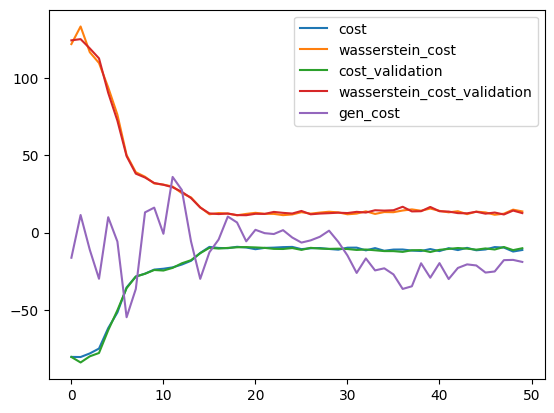

2023-12-30 14:46:57,026 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:46:59,301 - g4gan - INFO - D_self: 246.19
INFO:g4gan:D_self: 246.19
2023-12-30 14:46:59,305 - g4gan - INFO - D_train: 248.5
INFO:g4gan:D_train: 248.5


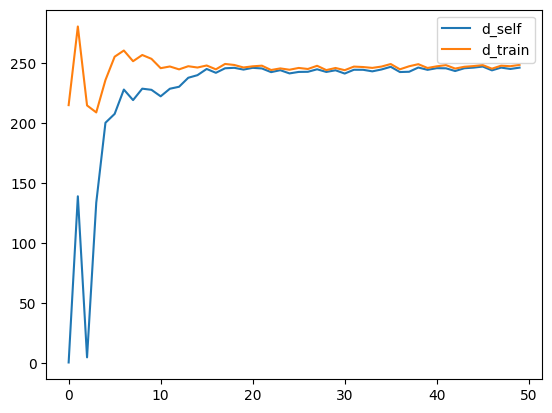

2023-12-30 14:46:59,646 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:46:59,657 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:46:59,752 - g4gan - INFO - Epoch: 51/200
INFO:g4gan:Epoch: 51/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    T   A   T   A   C   A   A   C   A   A  ...   G   T   C   T   G   C   G   
1    A   C   A   A   C   C   C   T   G   G  ...   C   A   C   G   C   G   C   
2    A   A   C   A   T   T   A   T   A   A  ...   A   A   G   T   A   G   A   
3    G   A   C   C   T   G   C   C   C   G  ...   A   C   G   G   A   G   G   
4    T   A   T   T   G   A   A   G   A   T  ...   T   A   G   T   G   C   A   
5    A   A   G   G   C   T   G   A   G   C  ...   C   T   G   G   C   G   A   
6    G   A   C   A   G   T   T   C   C   T  ...   G   C   C   T   C   G   G   
7    A   G   C   C   C   G   G   C   G   C  ...   G   G   G   G   C   T   C   
8    G   A   C   T   T   G   G   G   C   G  ...   A   C   G   C   T   T   A   
9    A   A   C   A   T   A   A   G   G   A  ...   T   C   C   G   C   C   C   
10   A   A   C   C   T   C   T   C   C   A  ...   G   A   C   C   A   C   C   
11   A   A   C   C   T   G   G   C   C   A  ...   T 

2023-12-30 14:47:28,720 - g4gan - INFO - {'discriminator': [{'cost': -10.139998435974121,
                    'cost_validation': -9.226420402526855,
                    'wasserstein_cost': 12.852922439575195,
                    'wasserstein_cost_validation': 11.535043716430664},
                   {'cost': -12.422112464904785,
                    'cost_validation': -11.024563789367676,
                    'wasserstein_cost': 15.083229064941406,
                    'wasserstein_cost_validation': 13.706010818481445},
                   {'cost': -10.33359146118164,
                    'cost_validation': -11.14796257019043,
                    'wasserstein_cost': 12.790115356445312,
                    'wasserstein_cost_validation': 14.464889526367188},
                   {'cost': -11.507593154907227,
                    'cost_validation': -9.652372360229492,
                    'wasserstein_cost': 14.996383666992188,
                    'wasserstein_cost_validation': 12.519020080566406},

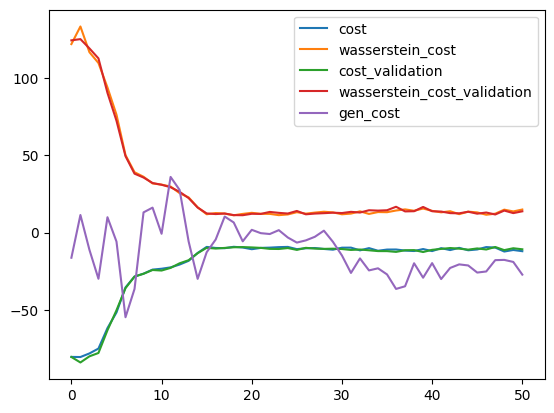

2023-12-30 14:47:28,975 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:47:32,827 - g4gan - INFO - D_self: 247.21
INFO:g4gan:D_self: 247.21
2023-12-30 14:47:32,831 - g4gan - INFO - D_train: 248.81
INFO:g4gan:D_train: 248.81


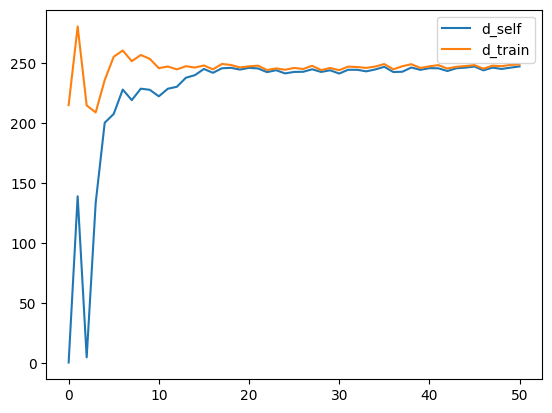

2023-12-30 14:47:33,235 - g4gan - INFO - Epoch: 52/200
INFO:g4gan:Epoch: 52/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:48:02,140 - g4gan - INFO - {'discriminator': [{'cost': -10.143939971923828,
                    'cost_validation': -9.697545051574707,
                    'wasserstein_cost': 12.302720069885254,
                    'wasserstein_cost_validation': 12.375743865966797},
                   {'cost': -10.128844261169434,
                    'cost_validation': -9.59753704071045,
                    'wasserstein_cost': 12.335041999816895,
                    'wasserstein_cost_validation': 12.119240760803223},
                   {'cost': -8.684797286987305,
                    'cost_validation': -10.754844665527344,
                    'wasserstein_cost': 10.794973373413086,
                    '

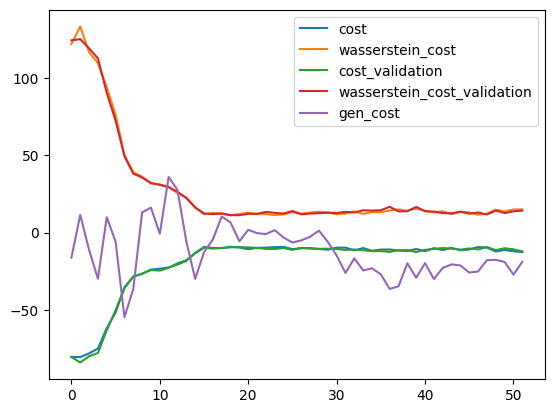

2023-12-30 14:48:02,489 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:48:05,550 - g4gan - INFO - D_self: 244.67
INFO:g4gan:D_self: 244.67
2023-12-30 14:48:05,558 - g4gan - INFO - D_train: 246.38
INFO:g4gan:D_train: 246.38


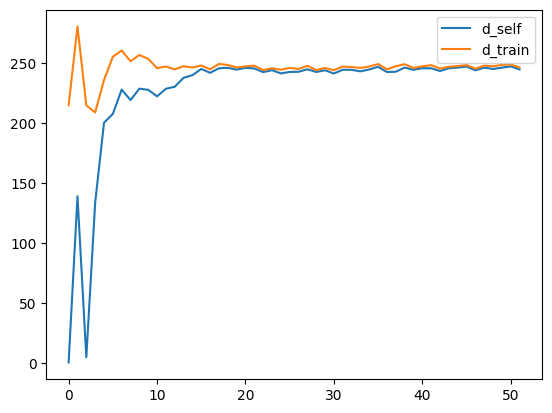

2023-12-30 14:48:05,798 - g4gan - INFO - Epoch: 53/200
INFO:g4gan:Epoch: 53/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:48:34,662 - g4gan - INFO - {'discriminator': [{'cost': -8.763968467712402,
                    'cost_validation': -9.532354354858398,
                    'wasserstein_cost': 11.624185562133789,
                    'wasserstein_cost_validation': 12.358393669128418},
                   {'cost': -9.701386451721191,
                    'cost_validation': -11.583402633666992,
                    'wasserstein_cost': 12.487141609191895,
                    'wasserstein_cost_validation': 14.246408462524414},
                   {'cost': -11.231775283813477,
                    'cost_validation': -9.661737442016602,
                    'wasserstein_cost': 13.850004196166992,
                    '

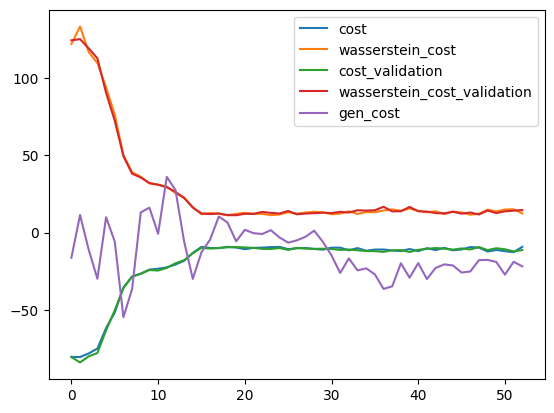

2023-12-30 14:48:34,932 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:48:37,158 - g4gan - INFO - D_self: 245.32
INFO:g4gan:D_self: 245.32
2023-12-30 14:48:37,164 - g4gan - INFO - D_train: 246.99
INFO:g4gan:D_train: 246.99


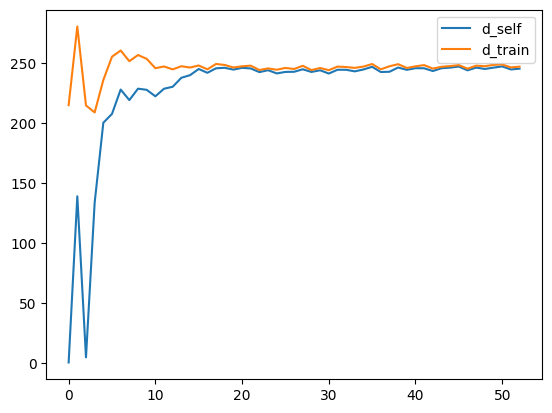

2023-12-30 14:48:37,450 - g4gan - INFO - Epoch: 54/200
INFO:g4gan:Epoch: 54/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:49:06,417 - g4gan - INFO - {'discriminator': [{'cost': -10.905073165893555,
                    'cost_validation': -9.778839111328125,
                    'wasserstein_cost': 13.6866455078125,
                    'wasserstein_cost_validation': 11.632453918457031},
                   {'cost': -10.438899040222168,
                    'cost_validation': -10.253613471984863,
                    'wasserstein_cost': 12.554004669189453,
                    'wasserstein_cost_validation': 12.744287490844727},
                   {'cost': -10.465591430664062,
                    'cost_validation': -10.068431854248047,
                    'wasserstein_cost': 12.382226943969727,
                    

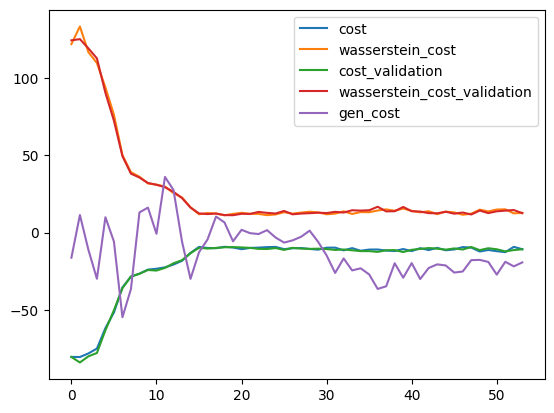

2023-12-30 14:49:06,684 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:49:08,916 - g4gan - INFO - D_self: 245.78
INFO:g4gan:D_self: 245.78
2023-12-30 14:49:08,920 - g4gan - INFO - D_train: 246.27
INFO:g4gan:D_train: 246.27


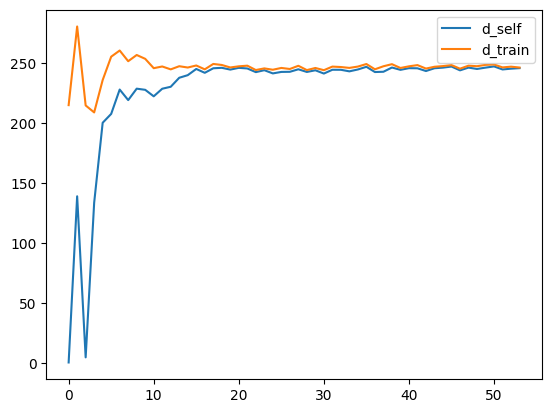

2023-12-30 14:49:09,220 - g4gan - INFO - Epoch: 55/200
INFO:g4gan:Epoch: 55/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:49:37,937 - g4gan - INFO - {'discriminator': [{'cost': -9.73971176147461,
                    'cost_validation': -9.088062286376953,
                    'wasserstein_cost': 12.551362991333008,
                    'wasserstein_cost_validation': 11.389642715454102},
                   {'cost': -9.738100051879883,
                    'cost_validation': -11.03741455078125,
                    'wasserstein_cost': 12.094855308532715,
                    'wasserstein_cost_validation': 12.889577865600586},
                   {'cost': -10.923972129821777,
                    'cost_validation': -10.03455924987793,
                    'wasserstein_cost': 12.830610275268555,
                    'wa

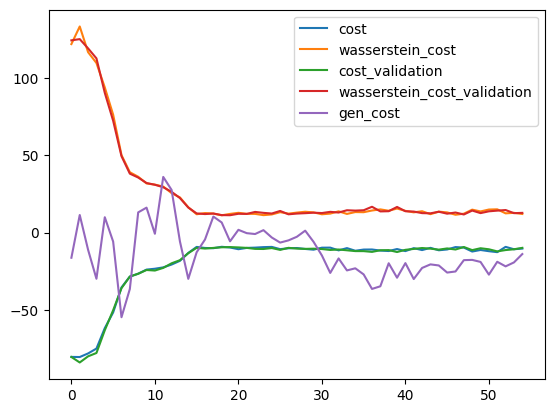

2023-12-30 14:49:38,174 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:49:40,358 - g4gan - INFO - D_self: 245.74
INFO:g4gan:D_self: 245.74
2023-12-30 14:49:40,365 - g4gan - INFO - D_train: 246.7
INFO:g4gan:D_train: 246.7


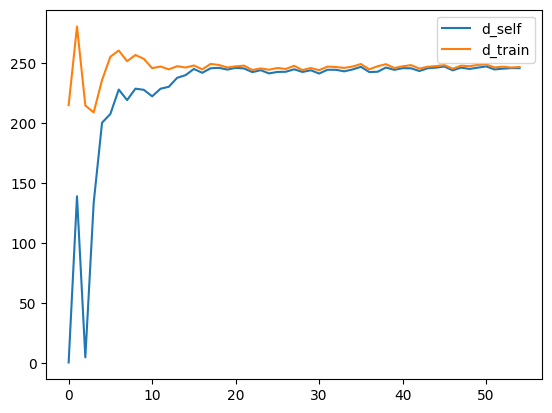

2023-12-30 14:49:40,650 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:49:40,657 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:49:40,744 - g4gan - INFO - Epoch: 56/200
INFO:g4gan:Epoch: 56/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    T   A   T   A   G   A   A   C   A   A  ...   G   T   C   T   G   C   G   
1    A   C   A   A   C   C   C   T   G   G  ...   C   A   C   C   C   G   C   
2    A   A   C   A   T   T   A   T   A   T  ...   A   A   G   T   T   G   A   
3    G   A   C   C   T   G   C   C   C   G  ...   A   C   G   G   A   T   T   
4    T   A   T   T   G   A   A   G   A   T  ...   T   A   C   T   G   C   A   
5    A   A   G   G   C   T   G   A   G   C  ...   C   T   G   G   C   G   A   
6    G   A   C   A   G   T   T   C   C   T  ...   G   C   C   T   C   G   G   
7    A   G   C   C   C   G   G   C   G   C  ...   G   G   G   G   C   T   C   
8    G   A   C   G   G   G   G   G   C   G  ...   T   C   G   C   T   T   A   
9    A   A   C   A   T   A   A   G   G   T  ...   T   C   C   G   C   G   C   
10   A   A   C   C   T   C   T   C   C   A  ...   G   T   C   C   A   C   C   
11   A   A   C   C   T   T   G   C   C   A  ...   T 

2023-12-30 14:50:09,617 - g4gan - INFO - {'discriminator': [{'cost': -10.191610336303711,
                    'cost_validation': -11.225611686706543,
                    'wasserstein_cost': 12.53564739227295,
                    'wasserstein_cost_validation': 13.853874206542969},
                   {'cost': -9.873056411743164,
                    'cost_validation': -11.147611618041992,
                    'wasserstein_cost': 11.965349197387695,
                    'wasserstein_cost_validation': 13.2114896774292},
                   {'cost': -10.145936965942383,
                    'cost_validation': -9.541354179382324,
                    'wasserstein_cost': 11.855560302734375,
                    'wasserstein_cost_validation': 11.724660873413086},
                   {'cost': -10.683361053466797,
                    'cost_validation': -11.27984619140625,
                    'wasserstein_cost': 12.495122909545898,
                    'wasserstein_cost_validation': 13.44985580444336},
  

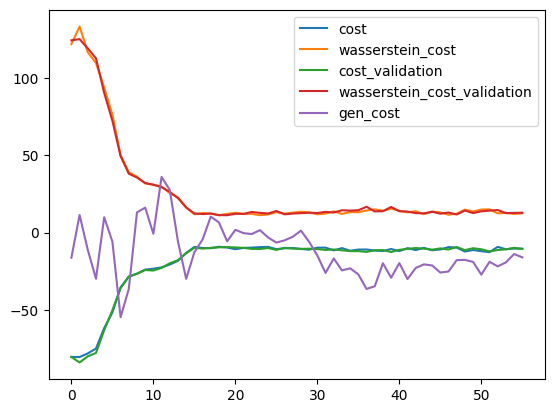

2023-12-30 14:50:09,870 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:50:12,979 - g4gan - INFO - D_self: 243.65
INFO:g4gan:D_self: 243.65
2023-12-30 14:50:12,983 - g4gan - INFO - D_train: 244.56
INFO:g4gan:D_train: 244.56


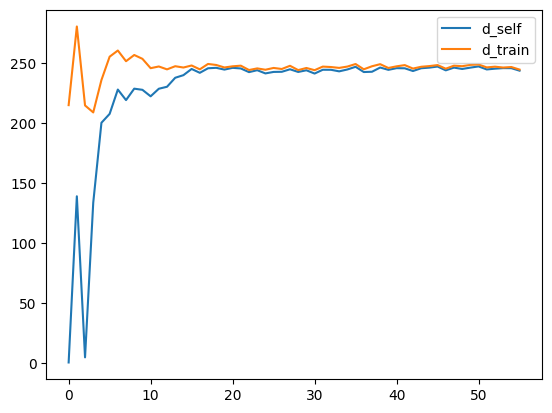

2023-12-30 14:50:13,293 - g4gan - INFO - Epoch: 57/200
INFO:g4gan:Epoch: 57/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:50:42,101 - g4gan - INFO - {'discriminator': [{'cost': -10.136029243469238,
                    'cost_validation': -10.670490264892578,
                    'wasserstein_cost': 12.090396881103516,
                    'wasserstein_cost_validation': 12.85185432434082},
                   {'cost': -10.840991973876953,
                    'cost_validation': -10.232732772827148,
                    'wasserstein_cost': 13.171686172485352,
                    'wasserstein_cost_validation': 12.195978164672852},
                   {'cost': -8.943653106689453,
                    'cost_validation': -10.150720596313477,
                    'wasserstein_cost': 11.282330513000488,
                   

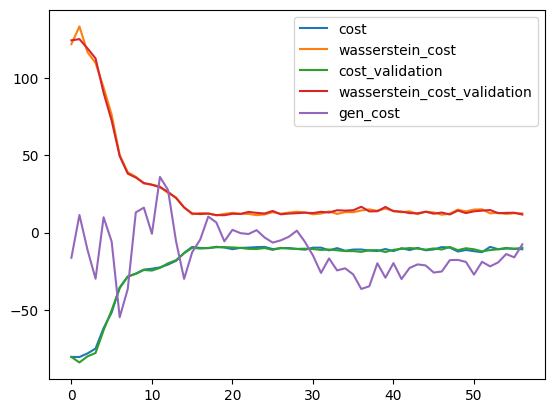

2023-12-30 14:50:42,440 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:50:46,221 - g4gan - INFO - D_self: 240.61
INFO:g4gan:D_self: 240.61
2023-12-30 14:50:46,225 - g4gan - INFO - D_train: 242.55
INFO:g4gan:D_train: 242.55


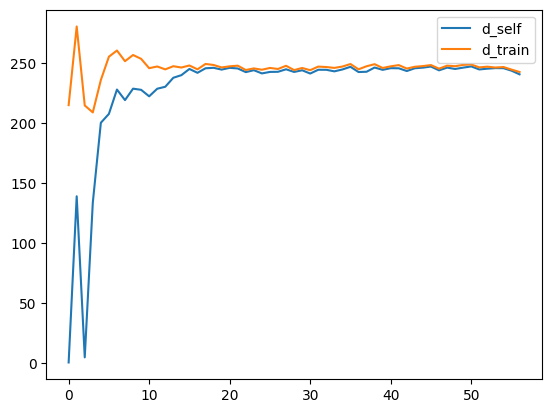

2023-12-30 14:50:46,518 - g4gan - INFO - Epoch: 58/200
INFO:g4gan:Epoch: 58/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:51:15,342 - g4gan - INFO - {'discriminator': [{'cost': -10.112789154052734,
                    'cost_validation': -9.591465950012207,
                    'wasserstein_cost': 12.721420288085938,
                    'wasserstein_cost_validation': 11.286931037902832},
                   {'cost': -10.16260814666748,
                    'cost_validation': -10.07761287689209,
                    'wasserstein_cost': 12.241902351379395,
                    'wasserstein_cost_validation': 12.219095230102539},
                   {'cost': -9.740056037902832,
                    'cost_validation': -9.9998779296875,
                    'wasserstein_cost': 11.865946769714355,
                    'was

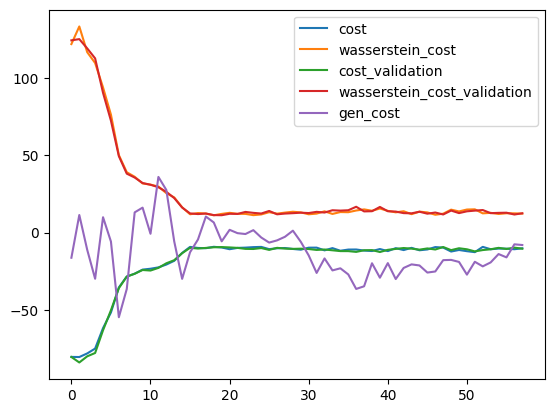

2023-12-30 14:51:15,599 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:51:17,810 - g4gan - INFO - D_self: 243.41
INFO:g4gan:D_self: 243.41
2023-12-30 14:51:17,815 - g4gan - INFO - D_train: 245.17
INFO:g4gan:D_train: 245.17


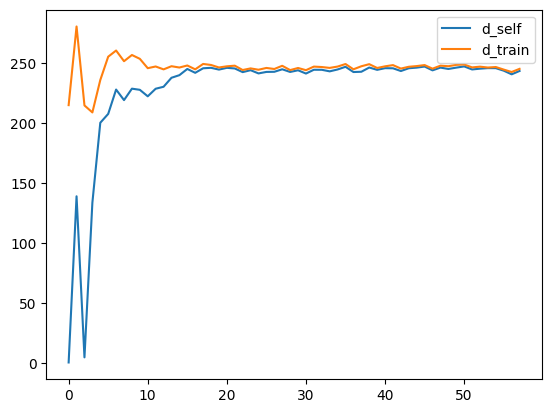

2023-12-30 14:51:18,114 - g4gan - INFO - Epoch: 59/200
INFO:g4gan:Epoch: 59/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:51:47,000 - g4gan - INFO - {'discriminator': [{'cost': -8.482965469360352,
                    'cost_validation': -8.767857551574707,
                    'wasserstein_cost': 10.966724395751953,
                    'wasserstein_cost_validation': 10.871211051940918},
                   {'cost': -10.204523086547852,
                    'cost_validation': -10.437917709350586,
                    'wasserstein_cost': 12.645357131958008,
                    'wasserstein_cost_validation': 12.591226577758789},
                   {'cost': -10.466291427612305,
                    'cost_validation': -10.039092063903809,
                    'wasserstein_cost': 12.409250259399414,
                   

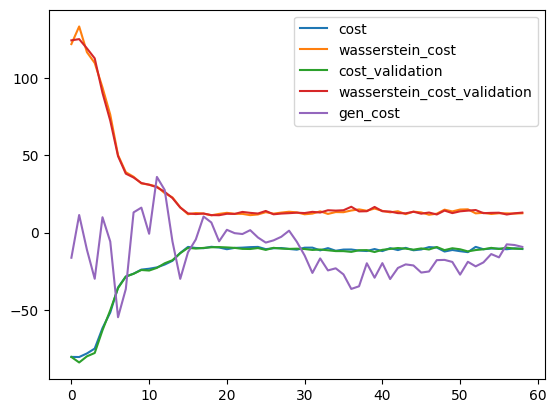

2023-12-30 14:51:47,270 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:51:49,464 - g4gan - INFO - D_self: 243.16
INFO:g4gan:D_self: 243.16
2023-12-30 14:51:49,467 - g4gan - INFO - D_train: 244.75
INFO:g4gan:D_train: 244.75


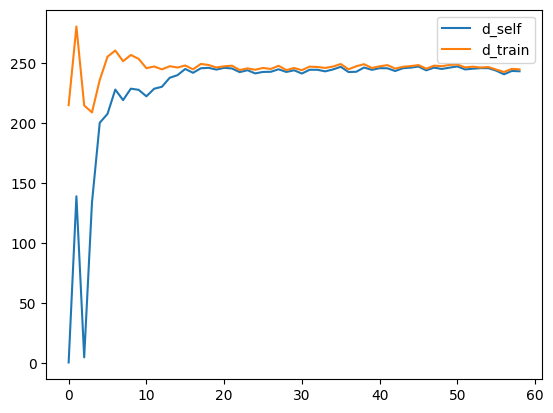

2023-12-30 14:51:49,776 - g4gan - INFO - Epoch: 60/200
INFO:g4gan:Epoch: 60/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:52:19,282 - g4gan - INFO - {'discriminator': [{'cost': -9.501559257507324,
                    'cost_validation': -10.350776672363281,
                    'wasserstein_cost': 11.373376846313477,
                    'wasserstein_cost_validation': 12.668777465820312},
                   {'cost': -10.202254295349121,
                    'cost_validation': -8.89494514465332,
                    'wasserstein_cost': 12.109549522399902,
                    'wasserstein_cost_validation': 11.065054893493652},
                   {'cost': -9.514416694641113,
                    'cost_validation': -10.810247421264648,
                    'wasserstein_cost': 11.746339797973633,
                    '

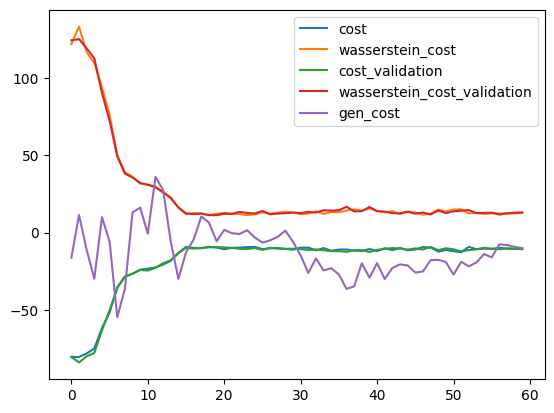

2023-12-30 14:52:19,615 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:52:22,752 - g4gan - INFO - D_self: 245.54
INFO:g4gan:D_self: 245.54
2023-12-30 14:52:22,757 - g4gan - INFO - D_train: 247.47
INFO:g4gan:D_train: 247.47


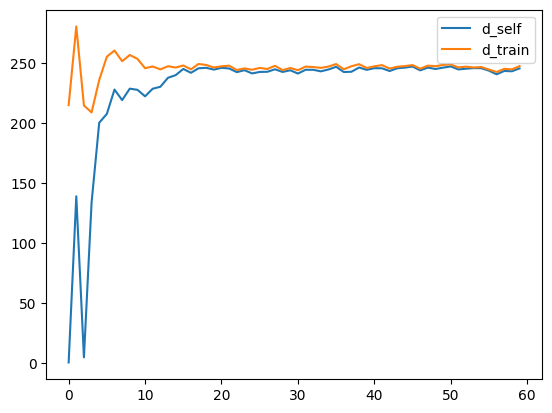

2023-12-30 14:52:23,012 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:52:23,027 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:52:23,130 - g4gan - INFO - Epoch: 61/200
INFO:g4gan:Epoch: 61/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    G   A   T   A   G   A   A   C   A   A  ...   G   T   C   T   G   C   G   
1    A   C   T   A   C   C   C   T   G   G  ...   C   A   C   C   G   G   C   
2    A   A   C   A   T   T   T   G   A   T  ...   A   A   G   T   T   G   A   
3    G   A   C   C   T   G   C   C   C   G  ...   T   C   G   G   A   G   T   
4    G   A   T   T   G   A   A   G   A   T  ...   T   A   C   T   G   C   A   
5    A   A   G   G   C   T   G   T   G   C  ...   C   T   G   C   C   G   A   
6    G   A   C   A   G   G   T   C   C   T  ...   G   C   C   T   C   G   G   
7    A   G   C   C   C   G   G   C   G   C  ...   G   G   G   G   C   G   C   
8    G   A   C   C   G   G   G   G   C   G  ...   T   C   G   C   T   T   A   
9    A   A   C   A   T   A   A   G   G   T  ...   T   C   G   G   C   G   C   
10   T   A   C   C   T   C   T   C   C   A  ...   G   A   C   C   A   C   C   
11   A   A   C   C   T   T   G   C   C   A  ...   T 

2023-12-30 14:52:52,060 - g4gan - INFO - {'discriminator': [{'cost': -9.678000450134277,
                    'cost_validation': -10.911602020263672,
                    'wasserstein_cost': 11.317863464355469,
                    'wasserstein_cost_validation': 13.063365936279297},
                   {'cost': -7.931293964385986,
                    'cost_validation': -9.532482147216797,
                    'wasserstein_cost': 9.682907104492188,
                    'wasserstein_cost_validation': 11.201690673828125},
                   {'cost': -10.484572410583496,
                    'cost_validation': -10.416459083557129,
                    'wasserstein_cost': 12.359414100646973,
                    'wasserstein_cost_validation': 12.541337013244629},
                   {'cost': -9.419412612915039,
                    'cost_validation': -11.071212768554688,
                    'wasserstein_cost': 11.314261436462402,
                    'wasserstein_cost_validation': 13.349260330200195},


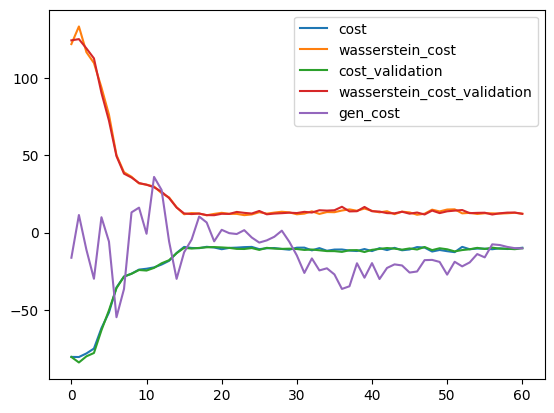

2023-12-30 14:52:52,360 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:52:55,927 - g4gan - INFO - D_self: 242.07
INFO:g4gan:D_self: 242.07
2023-12-30 14:52:55,931 - g4gan - INFO - D_train: 243.41
INFO:g4gan:D_train: 243.41


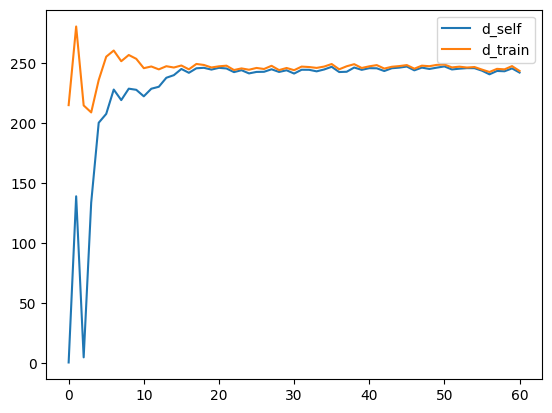

2023-12-30 14:52:56,282 - g4gan - INFO - Epoch: 62/200
INFO:g4gan:Epoch: 62/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:53:25,450 - g4gan - INFO - {'discriminator': [{'cost': -7.978115081787109,
                    'cost_validation': -8.340068817138672,
                    'wasserstein_cost': 9.854549407958984,
                    'wasserstein_cost_validation': 10.22392749786377},
                   {'cost': -9.714405059814453,
                    'cost_validation': -10.380317687988281,
                    'wasserstein_cost': 11.592763900756836,
                    'wasserstein_cost_validation': 12.214603424072266},
                   {'cost': -9.524223327636719,
                    'cost_validation': -9.98763370513916,
                    'wasserstein_cost': 11.28943157196045,
                    'wasse

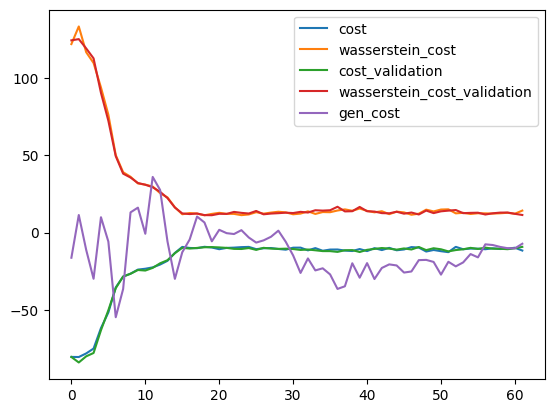

2023-12-30 14:53:25,832 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:53:29,048 - g4gan - INFO - D_self: 244.77
INFO:g4gan:D_self: 244.77
2023-12-30 14:53:29,055 - g4gan - INFO - D_train: 246.67
INFO:g4gan:D_train: 246.67


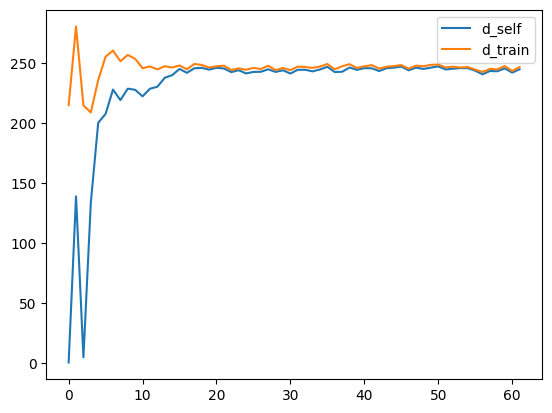

2023-12-30 14:53:29,312 - g4gan - INFO - Epoch: 63/200
INFO:g4gan:Epoch: 63/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:53:58,365 - g4gan - INFO - {'discriminator': [{'cost': -8.22083854675293,
                    'cost_validation': -9.30908203125,
                    'wasserstein_cost': 10.217667579650879,
                    'wasserstein_cost_validation': 10.91733455657959},
                   {'cost': -10.074064254760742,
                    'cost_validation': -9.36388111114502,
                    'wasserstein_cost': 12.372389793395996,
                    'wasserstein_cost_validation': 11.403215408325195},
                   {'cost': -9.81045913696289,
                    'cost_validation': -10.280704498291016,
                    'wasserstein_cost': 11.985563278198242,
                    'wasserst

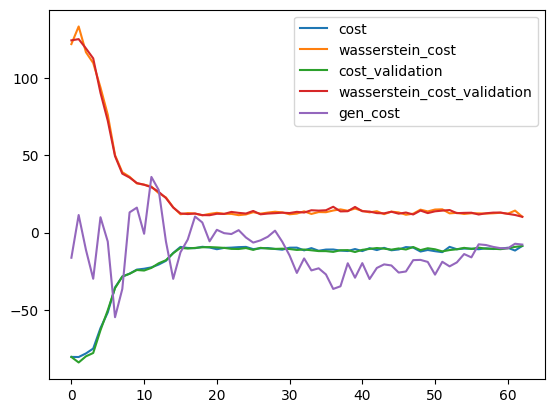

2023-12-30 14:53:58,664 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:54:00,923 - g4gan - INFO - D_self: 243.52
INFO:g4gan:D_self: 243.52
2023-12-30 14:54:00,927 - g4gan - INFO - D_train: 244.94
INFO:g4gan:D_train: 244.94


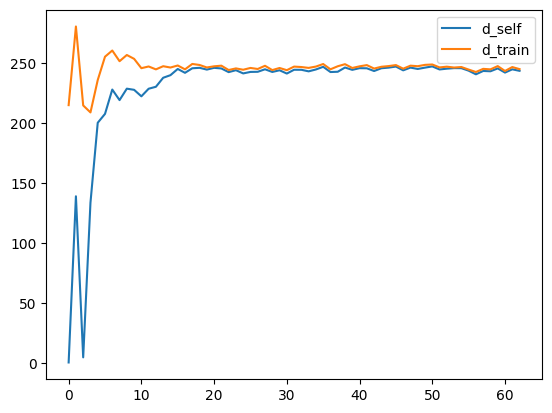

2023-12-30 14:54:01,234 - g4gan - INFO - Epoch: 64/200
INFO:g4gan:Epoch: 64/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:54:30,267 - g4gan - INFO - {'discriminator': [{'cost': -9.147985458374023,
                    'cost_validation': -7.918066501617432,
                    'wasserstein_cost': 10.76036548614502,
                    'wasserstein_cost_validation': 9.694507598876953},
                   {'cost': -8.369213104248047,
                    'cost_validation': -9.066587448120117,
                    'wasserstein_cost': 10.391443252563477,
                    'wasserstein_cost_validation': 10.926071166992188},
                   {'cost': -9.480088233947754,
                    'cost_validation': -10.270187377929688,
                    'wasserstein_cost': 11.49040412902832,
                    'wass

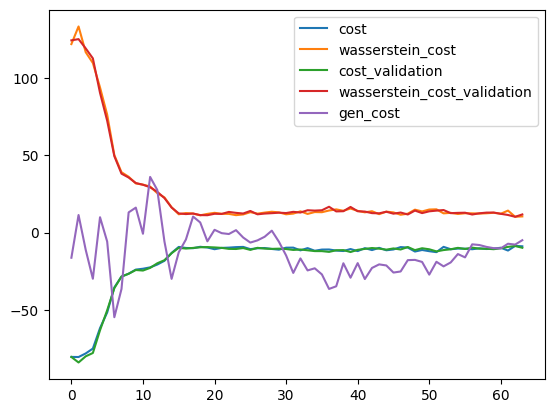

2023-12-30 14:54:30,562 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:54:32,776 - g4gan - INFO - D_self: 247.08
INFO:g4gan:D_self: 247.08
2023-12-30 14:54:32,780 - g4gan - INFO - D_train: 247.7
INFO:g4gan:D_train: 247.7


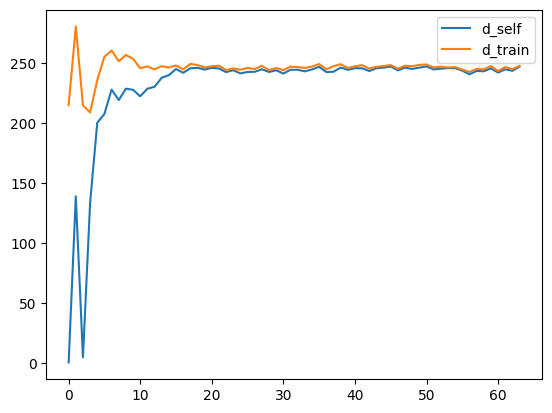

2023-12-30 14:54:33,075 - g4gan - INFO - Epoch: 65/200
INFO:g4gan:Epoch: 65/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:55:02,011 - g4gan - INFO - {'discriminator': [{'cost': -8.903900146484375,
                    'cost_validation': -9.403352737426758,
                    'wasserstein_cost': 11.29819107055664,
                    'wasserstein_cost_validation': 11.800854682922363},
                   {'cost': -8.727043151855469,
                    'cost_validation': -9.84320068359375,
                    'wasserstein_cost': 10.847091674804688,
                    'wasserstein_cost_validation': 11.57898998260498},
                   {'cost': -9.435975074768066,
                    'cost_validation': -9.732730865478516,
                    'wasserstein_cost': 11.444390296936035,
                    'wasse

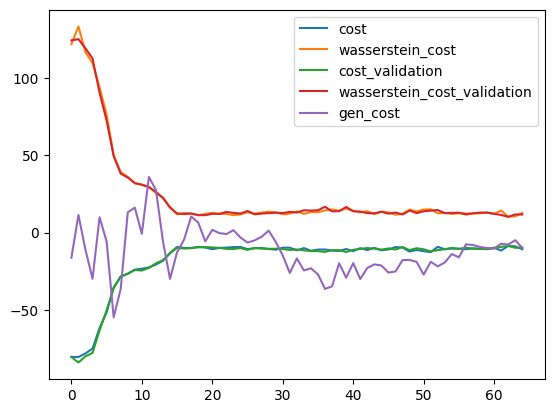

2023-12-30 14:55:02,278 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:55:04,501 - g4gan - INFO - D_self: 244.44
INFO:g4gan:D_self: 244.44
2023-12-30 14:55:04,506 - g4gan - INFO - D_train: 245.37
INFO:g4gan:D_train: 245.37


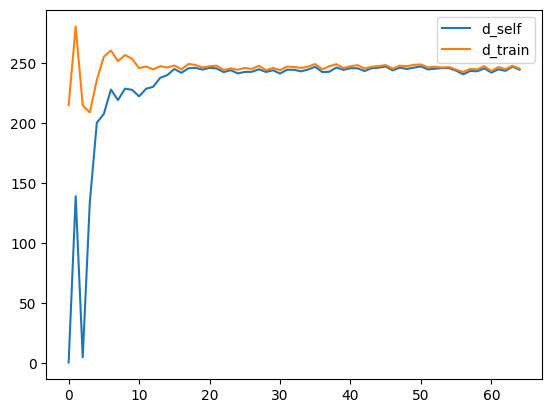

2023-12-30 14:55:04,797 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:55:04,804 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:55:04,888 - g4gan - INFO - Epoch: 66/200
INFO:g4gan:Epoch: 66/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    G   A   G   A   G   A   A   C   A   T  ...   G   A   C   T   G   C   G   
1    A   C   T   T   C   C   C   T   G   G  ...   C   A   C   C   G   G   C   
2    A   A   C   A   T   G   T   G   A   G  ...   A   A   G   T   T   C   A   
3    G   A   C   C   T   G   C   C   C   G  ...   A   C   G   G   A   G   T   
4    G   A   T   T   G   A   A   G   A   T  ...   T   A   C   T   C   C   A   
5    A   A   G   G   C   T   G   T   G   C  ...   C   T   G   C   C   G   A   
6    G   A   C   A   G   G   T   C   C   A  ...   G   C   C   T   C   G   G   
7    A   C   C   C   C   G   G   C   G   C  ...   G   G   G   G   C   G   C   
8    C   A   C   C   G   G   C   G   C   G  ...   T   C   G   C   T   T   A   
9    A   A   C   A   T   A   A   G   G   T  ...   T   C   G   G   C   G   C   
10   T   A   C   C   T   C   T   G   C   A  ...   T   A   C   C   A   C   C   
11   A   A   C   C   T   T   G   C   C   A  ...   T 

2023-12-30 14:55:33,969 - g4gan - INFO - {'discriminator': [{'cost': -8.21322250366211,
                    'cost_validation': -8.26994800567627,
                    'wasserstein_cost': 10.307007789611816,
                    'wasserstein_cost_validation': 10.171184539794922},
                   {'cost': -9.743066787719727,
                    'cost_validation': -9.954320907592773,
                    'wasserstein_cost': 12.202317237854004,
                    'wasserstein_cost_validation': 11.8115873336792},
                   {'cost': -8.937705993652344,
                    'cost_validation': -9.570114135742188,
                    'wasserstein_cost': 11.038370132446289,
                    'wasserstein_cost_validation': 11.871236801147461},
                   {'cost': -8.109709739685059,
                    'cost_validation': -8.969772338867188,
                    'wasserstein_cost': 10.259565353393555,
                    'wasserstein_cost_validation': 11.413783073425293},
       

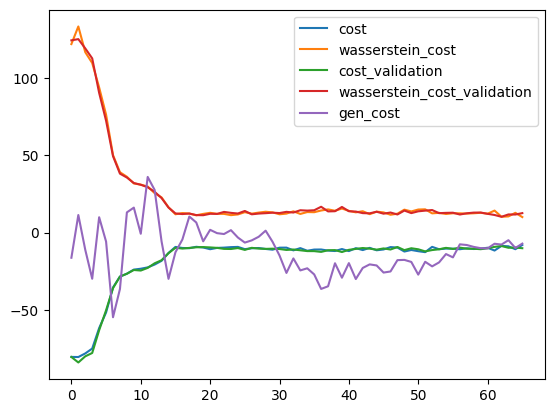

2023-12-30 14:55:34,247 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:55:39,573 - g4gan - INFO - D_self: 244.49
INFO:g4gan:D_self: 244.49
2023-12-30 14:55:39,577 - g4gan - INFO - D_train: 245.75
INFO:g4gan:D_train: 245.75


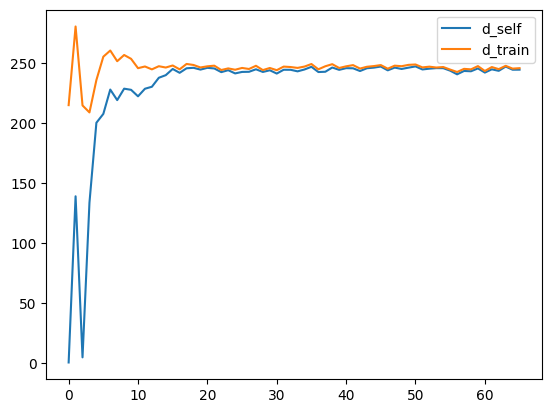

2023-12-30 14:55:39,901 - g4gan - INFO - Epoch: 67/200
INFO:g4gan:Epoch: 67/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:56:08,845 - g4gan - INFO - {'discriminator': [{'cost': -9.485998153686523,
                    'cost_validation': -8.718877792358398,
                    'wasserstein_cost': 11.538721084594727,
                    'wasserstein_cost_validation': 10.713683128356934},
                   {'cost': -9.025002479553223,
                    'cost_validation': -9.341683387756348,
                    'wasserstein_cost': 10.793168067932129,
                    'wasserstein_cost_validation': 11.06558609008789},
                   {'cost': -8.698756217956543,
                    'cost_validation': -8.437883377075195,
                    'wasserstein_cost': 10.381519317626953,
                    'was

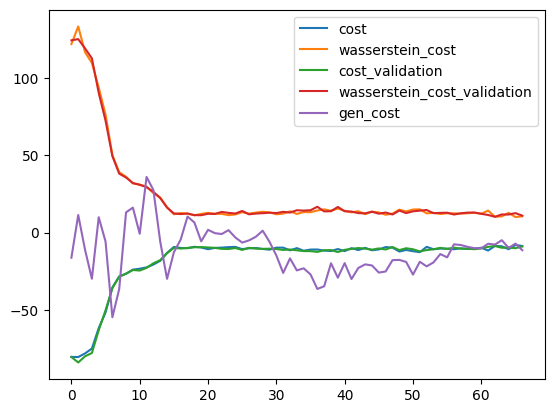

2023-12-30 14:56:09,205 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:56:12,005 - g4gan - INFO - D_self: 244.84
INFO:g4gan:D_self: 244.84
2023-12-30 14:56:12,010 - g4gan - INFO - D_train: 245.5
INFO:g4gan:D_train: 245.5


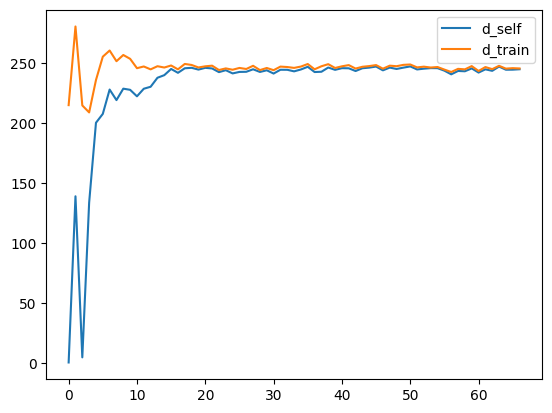

2023-12-30 14:56:12,283 - g4gan - INFO - Epoch: 68/200
INFO:g4gan:Epoch: 68/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:56:41,755 - g4gan - INFO - {'discriminator': [{'cost': -6.563482761383057,
                    'cost_validation': -8.190812110900879,
                    'wasserstein_cost': 8.91290283203125,
                    'wasserstein_cost_validation': 10.363037109375},
                   {'cost': -8.80726432800293,
                    'cost_validation': -8.662917137145996,
                    'wasserstein_cost': 10.729677200317383,
                    'wasserstein_cost_validation': 10.599224090576172},
                   {'cost': -8.350448608398438,
                    'cost_validation': -9.425179481506348,
                    'wasserstein_cost': 10.082286834716797,
                    'wasserst

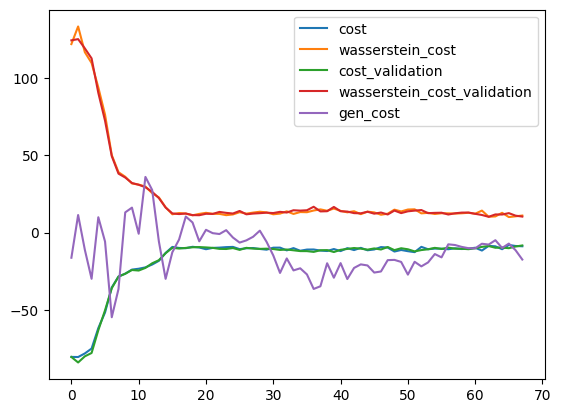

2023-12-30 14:56:42,019 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:56:44,235 - g4gan - INFO - D_self: 244.27
INFO:g4gan:D_self: 244.27
2023-12-30 14:56:44,240 - g4gan - INFO - D_train: 244.79
INFO:g4gan:D_train: 244.79


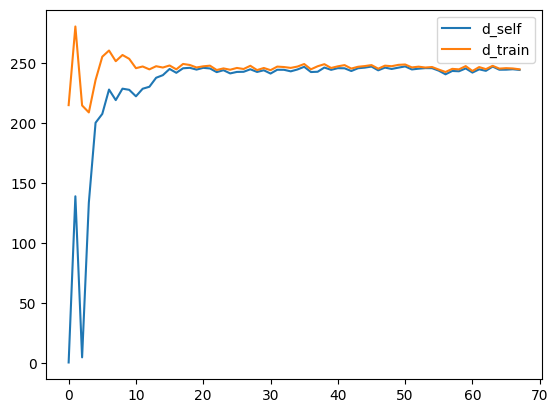

2023-12-30 14:56:44,519 - g4gan - INFO - Epoch: 69/200
INFO:g4gan:Epoch: 69/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:57:13,339 - g4gan - INFO - {'discriminator': [{'cost': -8.752510070800781,
                    'cost_validation': -8.896507263183594,
                    'wasserstein_cost': 10.79531478881836,
                    'wasserstein_cost_validation': 10.776252746582031},
                   {'cost': -8.035577774047852,
                    'cost_validation': -8.725770950317383,
                    'wasserstein_cost': 9.79693603515625,
                    'wasserstein_cost_validation': 10.789154052734375},
                   {'cost': -8.679791450500488,
                    'cost_validation': -9.476034164428711,
                    'wasserstein_cost': 10.320913314819336,
                    'wasse

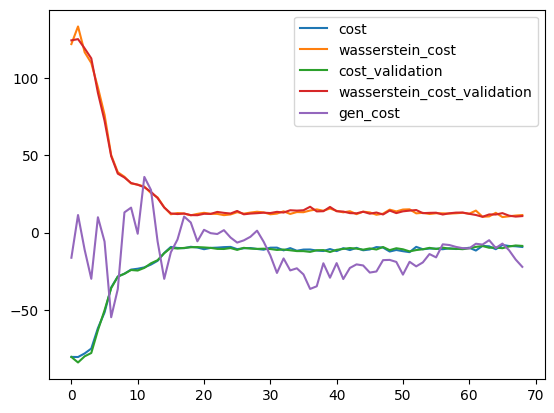

2023-12-30 14:57:13,641 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:57:15,867 - g4gan - INFO - D_self: 246.5
INFO:g4gan:D_self: 246.5
2023-12-30 14:57:15,871 - g4gan - INFO - D_train: 246.74
INFO:g4gan:D_train: 246.74


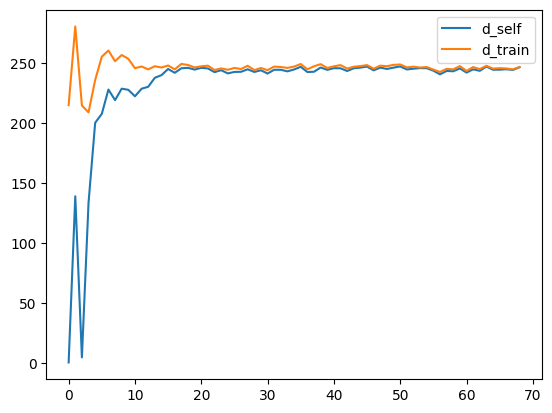

2023-12-30 14:57:16,169 - g4gan - INFO - Epoch: 70/200
INFO:g4gan:Epoch: 70/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:57:45,054 - g4gan - INFO - {'discriminator': [{'cost': -7.801614761352539,
                    'cost_validation': -8.807075500488281,
                    'wasserstein_cost': 9.553821563720703,
                    'wasserstein_cost_validation': 10.408823013305664},
                   {'cost': -8.30214786529541,
                    'cost_validation': -8.410904884338379,
                    'wasserstein_cost': 9.765174865722656,
                    'wasserstein_cost_validation': 9.997885704040527},
                   {'cost': -7.990474700927734,
                    'cost_validation': -8.343953132629395,
                    'wasserstein_cost': 9.550232887268066,
                    'wassers

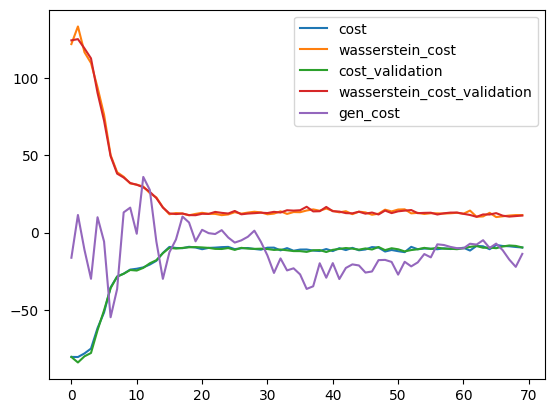

2023-12-30 14:57:45,338 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:57:47,531 - g4gan - INFO - D_self: 246.07
INFO:g4gan:D_self: 246.07
2023-12-30 14:57:47,535 - g4gan - INFO - D_train: 247.49
INFO:g4gan:D_train: 247.49


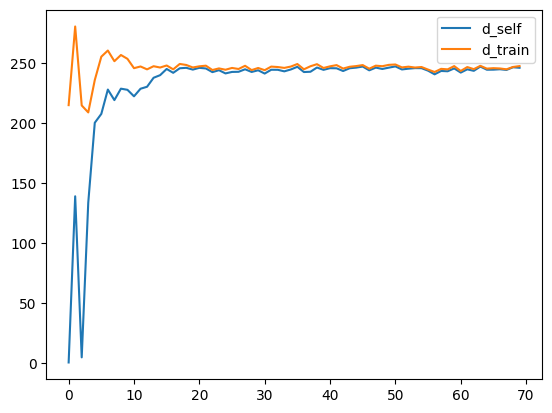

2023-12-30 14:57:47,834 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 14:57:47,841 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 14:57:47,927 - g4gan - INFO - Epoch: 71/200
INFO:g4gan:Epoch: 71/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    G   A   G   T   G   A   A   C   A   T  ...   G   A   C   T   G   C   G   
1    A   C   T   T   C   C   C   T   G   G  ...   C   A   C   C   G   G   C   
2    A   A   C   A   G   G   T   G   A   G  ...   A   A   G   G   T   C   A   
3    G   A   C   G   A   G   C   G   C   G  ...   T   C   G   G   A   G   T   
4    G   A   T   T   G   A   A   G   A   T  ...   T   A   C   T   C   C   A   
5    A   A   G   G   C   T   G   T   G   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   G   T   T   C   C   A  ...   G   C   C   T   C   G   T   
7    A   C   C   C   C   G   G   G   G   C  ...   G   G   G   G   C   G   C   
8    C   A   C   G   G   G   C   G   C   G  ...   T   C   T   C   T   T   A   
9    A   T   C   A   T   A   A   G   G   T  ...   A   G   G   G   C   G   G   
10   T   A   C   C   T   C   T   G   C   A  ...   T   A   C   C   A   C   C   
11   A   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 14:58:16,945 - g4gan - INFO - {'discriminator': [{'cost': -7.829152584075928,
                    'cost_validation': -7.807610511779785,
                    'wasserstein_cost': 9.650104522705078,
                    'wasserstein_cost_validation': 9.569448471069336},
                   {'cost': -8.275476455688477,
                    'cost_validation': -8.502284049987793,
                    'wasserstein_cost': 9.884500503540039,
                    'wasserstein_cost_validation': 9.998781204223633},
                   {'cost': -7.428882598876953,
                    'cost_validation': -9.394637107849121,
                    'wasserstein_cost': 9.186407089233398,
                    'wasserstein_cost_validation': 11.043821334838867},
                   {'cost': -7.309372901916504,
                    'cost_validation': -8.048256874084473,
                    'wasserstein_cost': 8.931049346923828,
                    'wasserstein_cost_validation': 9.417713165283203},
          

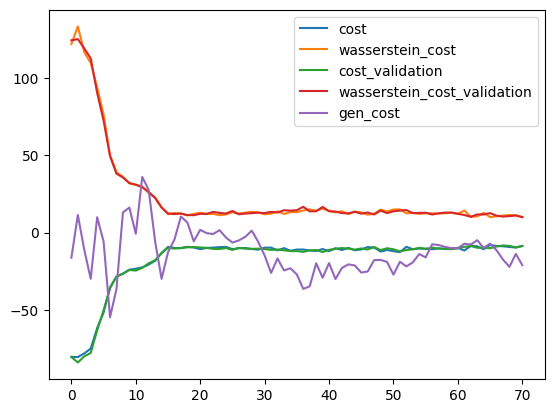

2023-12-30 14:58:17,213 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:58:20,623 - g4gan - INFO - D_self: 245.51
INFO:g4gan:D_self: 245.51
2023-12-30 14:58:20,627 - g4gan - INFO - D_train: 246.17
INFO:g4gan:D_train: 246.17


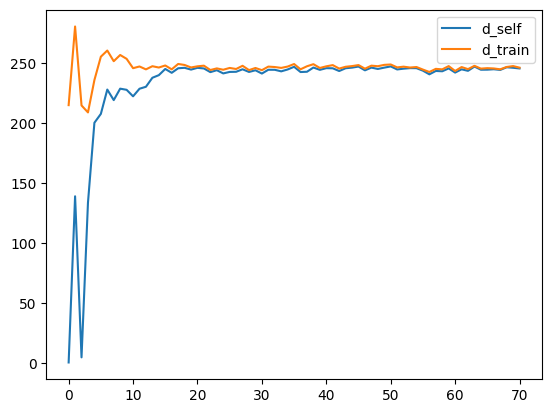

2023-12-30 14:58:20,917 - g4gan - INFO - Epoch: 72/200
INFO:g4gan:Epoch: 72/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:58:49,731 - g4gan - INFO - {'discriminator': [{'cost': -7.263456344604492,
                    'cost_validation': -8.38321304321289,
                    'wasserstein_cost': 10.310211181640625,
                    'wasserstein_cost_validation': 11.294876098632812},
                   {'cost': -7.50032901763916,
                    'cost_validation': -8.623114585876465,
                    'wasserstein_cost': 10.259378433227539,
                    'wasserstein_cost_validation': 10.501718521118164},
                   {'cost': -7.303167819976807,
                    'cost_validation': -7.588922500610352,
                    'wasserstein_cost': 8.973373413085938,
                    'wasse

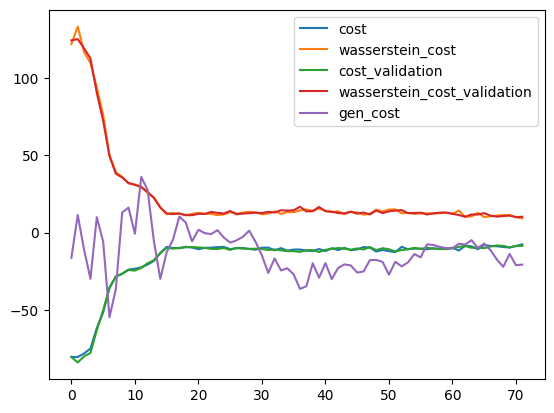

2023-12-30 14:58:50,113 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:58:53,769 - g4gan - INFO - D_self: 244.58
INFO:g4gan:D_self: 244.58
2023-12-30 14:58:53,775 - g4gan - INFO - D_train: 245.1
INFO:g4gan:D_train: 245.1


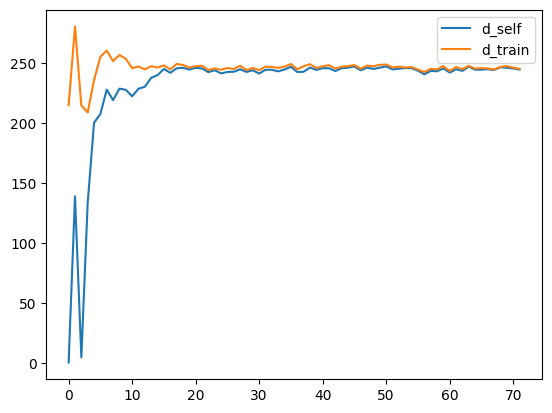

2023-12-30 14:58:54,031 - g4gan - INFO - Epoch: 73/200
INFO:g4gan:Epoch: 73/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:59:22,960 - g4gan - INFO - {'discriminator': [{'cost': -8.472147941589355,
                    'cost_validation': -8.872554779052734,
                    'wasserstein_cost': 10.400917053222656,
                    'wasserstein_cost_validation': 11.188161849975586},
                   {'cost': -7.7578864097595215,
                    'cost_validation': -8.057003021240234,
                    'wasserstein_cost': 9.768653869628906,
                    'wasserstein_cost_validation': 10.038383483886719},
                   {'cost': -8.822299003601074,
                    'cost_validation': -8.550614356994629,
                    'wasserstein_cost': 10.714794158935547,
                    'wa

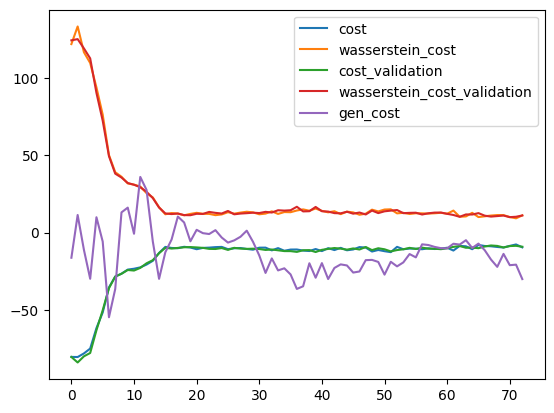

2023-12-30 14:59:23,277 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:59:25,497 - g4gan - INFO - D_self: 247.21
INFO:g4gan:D_self: 247.21
2023-12-30 14:59:25,501 - g4gan - INFO - D_train: 247.61
INFO:g4gan:D_train: 247.61


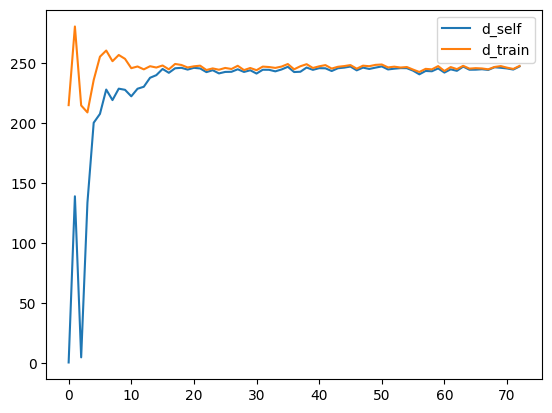

2023-12-30 14:59:25,800 - g4gan - INFO - Epoch: 74/200
INFO:g4gan:Epoch: 74/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 14:59:54,871 - g4gan - INFO - {'discriminator': [{'cost': -7.7191057205200195,
                    'cost_validation': -8.121448516845703,
                    'wasserstein_cost': 9.240562438964844,
                    'wasserstein_cost_validation': 9.752677917480469},
                   {'cost': -8.176628112792969,
                    'cost_validation': -8.947040557861328,
                    'wasserstein_cost': 9.995887756347656,
                    'wasserstein_cost_validation': 10.833402633666992},
                   {'cost': -7.696163654327393,
                    'cost_validation': -9.500299453735352,
                    'wasserstein_cost': 9.446348190307617,
                    'wasse

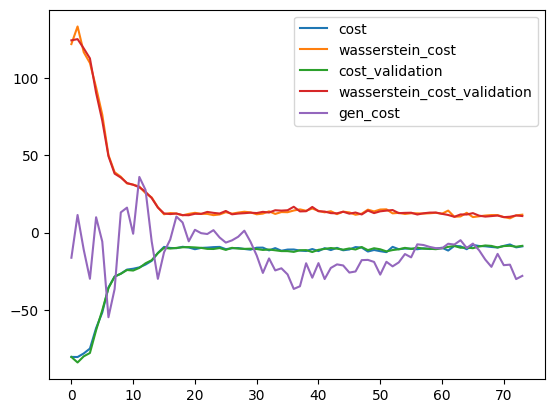

2023-12-30 14:59:55,153 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 14:59:57,396 - g4gan - INFO - D_self: 244.54
INFO:g4gan:D_self: 244.54
2023-12-30 14:59:57,401 - g4gan - INFO - D_train: 244.81
INFO:g4gan:D_train: 244.81


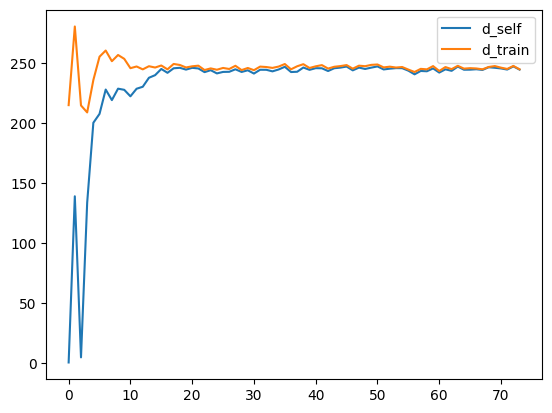

2023-12-30 14:59:57,729 - g4gan - INFO - Epoch: 75/200
INFO:g4gan:Epoch: 75/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:00:26,729 - g4gan - INFO - {'discriminator': [{'cost': -7.531169891357422,
                    'cost_validation': -8.449250221252441,
                    'wasserstein_cost': 9.025848388671875,
                    'wasserstein_cost_validation': 9.917402267456055},
                   {'cost': -8.001683235168457,
                    'cost_validation': -9.26832103729248,
                    'wasserstein_cost': 9.728042602539062,
                    'wasserstein_cost_validation': 10.874603271484375},
                   {'cost': -8.22354507446289,
                    'cost_validation': -8.203583717346191,
                    'wasserstein_cost': 9.805055618286133,
                    'wasserst

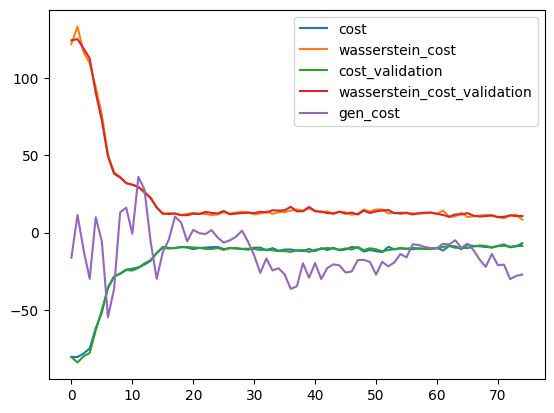

2023-12-30 15:00:27,020 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:00:29,264 - g4gan - INFO - D_self: 242.8
INFO:g4gan:D_self: 242.8
2023-12-30 15:00:29,269 - g4gan - INFO - D_train: 243.98
INFO:g4gan:D_train: 243.98


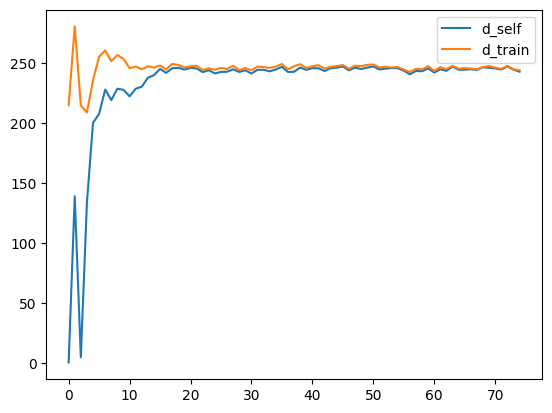

2023-12-30 15:00:29,571 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:00:29,579 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:00:29,662 - g4gan - INFO - Epoch: 76/200
INFO:g4gan:Epoch: 76/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   A   G   T   G   T   A   C   A   T  ...   G   T   C   T   G   C   T   
1    A   C   T   T   C   C   C   T   G   C  ...   C   A   C   C   G   G   C   
2    A   T   C   A   G   G   G   G   A   G  ...   A   T   G   G   T   C   A   
3    C   A   C   G   A   G   C   G   C   G  ...   T   C   C   G   A   G   T   
4    G   A   T   T   G   T   A   G   A   T  ...   T   A   C   T   C   C   T   
5    A   A   G   G   C   T   G   G   G   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   G   G   G   C   C   A  ...   G   C   C   T   C   G   T   
7    A   C   C   C   C   G   G   C   T   C  ...   G   G   C   G   C   G   C   
8    C   A   C   G   C   G   C   G   C   G  ...   T   C   T   C   T   T   A   
9    A   T   C   A   G   A   T   G   G   T  ...   A   G   G   T   C   T   G   
10   T   A   C   C   T   C   T   C   C   A  ...   T   T   C   C   A   C   C   
11   A   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 15:00:58,688 - g4gan - INFO - {'discriminator': [{'cost': -7.934882164001465,
                    'cost_validation': -7.964397430419922,
                    'wasserstein_cost': 9.915813446044922,
                    'wasserstein_cost_validation': 10.108402252197266},
                   {'cost': -8.246501922607422,
                    'cost_validation': -7.725188255310059,
                    'wasserstein_cost': 9.966835021972656,
                    'wasserstein_cost_validation': 9.376163482666016},
                   {'cost': -8.554645538330078,
                    'cost_validation': -8.52103328704834,
                    'wasserstein_cost': 10.431028366088867,
                    'wasserstein_cost_validation': 10.394609451293945},
                   {'cost': -8.90511417388916,
                    'cost_validation': -9.021038055419922,
                    'wasserstein_cost': 10.808086395263672,
                    'wasserstein_cost_validation': 10.980463027954102},
        

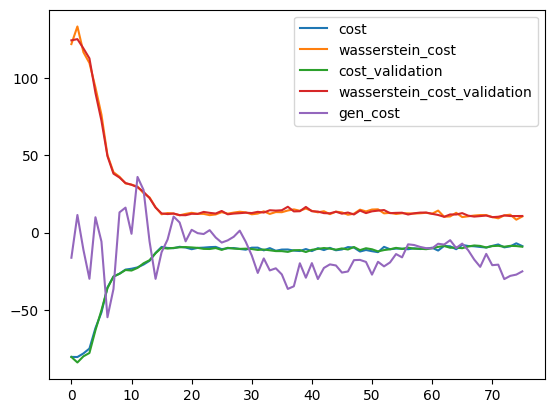

2023-12-30 15:00:58,978 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:01:01,950 - g4gan - INFO - D_self: 248.31
INFO:g4gan:D_self: 248.31
2023-12-30 15:01:01,958 - g4gan - INFO - D_train: 248.91
INFO:g4gan:D_train: 248.91


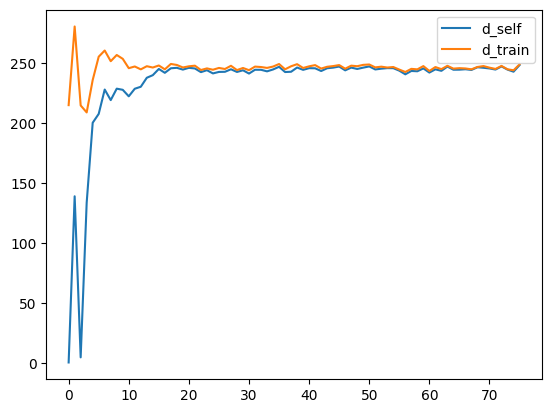

2023-12-30 15:01:02,298 - g4gan - INFO - Epoch: 77/200
INFO:g4gan:Epoch: 77/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:01:31,206 - g4gan - INFO - {'discriminator': [{'cost': -7.453641891479492,
                    'cost_validation': -7.983355522155762,
                    'wasserstein_cost': 9.03580093383789,
                    'wasserstein_cost_validation': 9.6107177734375},
                   {'cost': -7.7099151611328125,
                    'cost_validation': -7.123271942138672,
                    'wasserstein_cost': 9.4771728515625,
                    'wasserstein_cost_validation': 8.664087295532227},
                   {'cost': -7.786399841308594,
                    'cost_validation': -6.846639633178711,
                    'wasserstein_cost': 9.609626770019531,
                    'wasserstein

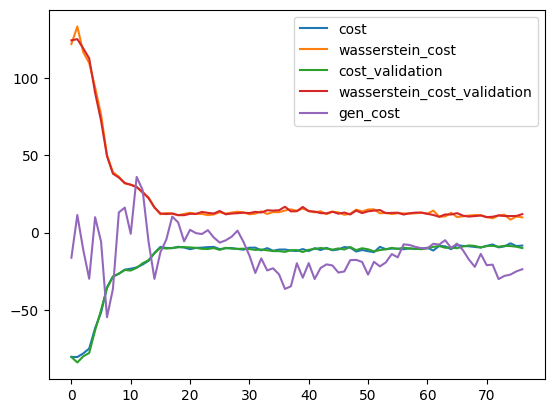

2023-12-30 15:01:31,595 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:01:35,497 - g4gan - INFO - D_self: 245.53
INFO:g4gan:D_self: 245.53
2023-12-30 15:01:35,505 - g4gan - INFO - D_train: 245.5
INFO:g4gan:D_train: 245.5


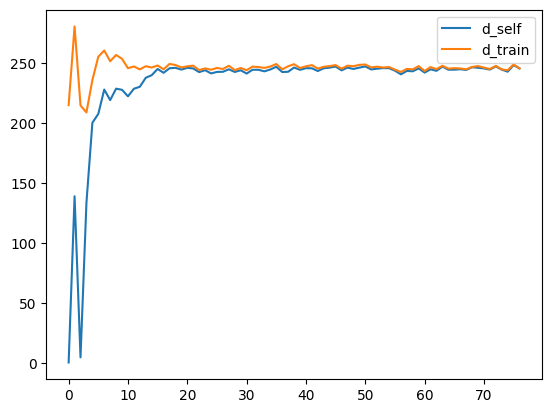

2023-12-30 15:01:35,811 - g4gan - INFO - Epoch: 78/200
INFO:g4gan:Epoch: 78/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:02:04,700 - g4gan - INFO - {'discriminator': [{'cost': -8.553425788879395,
                    'cost_validation': -7.2055745124816895,
                    'wasserstein_cost': 10.246639251708984,
                    'wasserstein_cost_validation': 8.592702865600586},
                   {'cost': -8.616787910461426,
                    'cost_validation': -9.014745712280273,
                    'wasserstein_cost': 10.372686386108398,
                    'wasserstein_cost_validation': 10.914213180541992},
                   {'cost': -8.765876770019531,
                    'cost_validation': -9.272054672241211,
                    'wasserstein_cost': 10.47317123413086,
                    'was

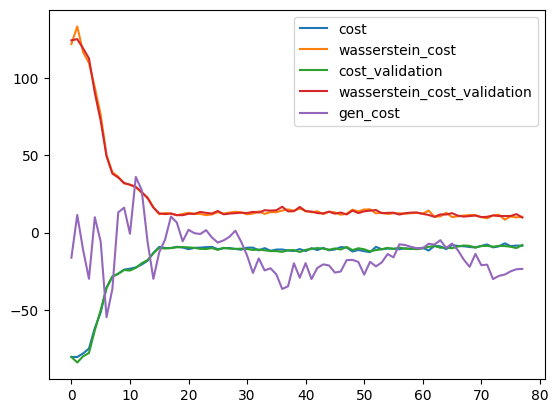

2023-12-30 15:02:05,087 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:02:07,574 - g4gan - INFO - D_self: 247.52
INFO:g4gan:D_self: 247.52
2023-12-30 15:02:07,578 - g4gan - INFO - D_train: 247.26
INFO:g4gan:D_train: 247.26


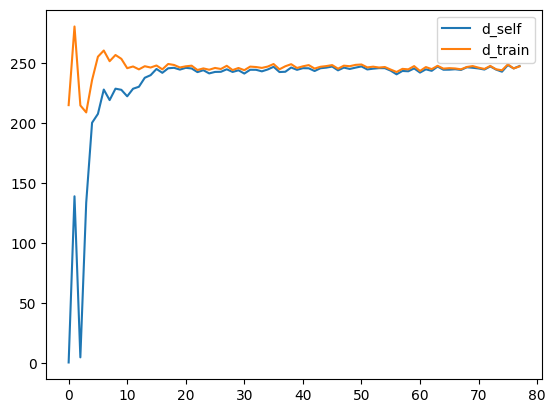

2023-12-30 15:02:07,879 - g4gan - INFO - Epoch: 79/200
INFO:g4gan:Epoch: 79/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:02:36,787 - g4gan - INFO - {'discriminator': [{'cost': -8.761329650878906,
                    'cost_validation': -8.441364288330078,
                    'wasserstein_cost': 10.225881576538086,
                    'wasserstein_cost_validation': 9.910160064697266},
                   {'cost': -9.166450500488281,
                    'cost_validation': -8.966931343078613,
                    'wasserstein_cost': 10.797002792358398,
                    'wasserstein_cost_validation': 10.945676803588867},
                   {'cost': -8.949209213256836,
                    'cost_validation': -9.15565299987793,
                    'wasserstein_cost': 10.67007064819336,
                    'wasse

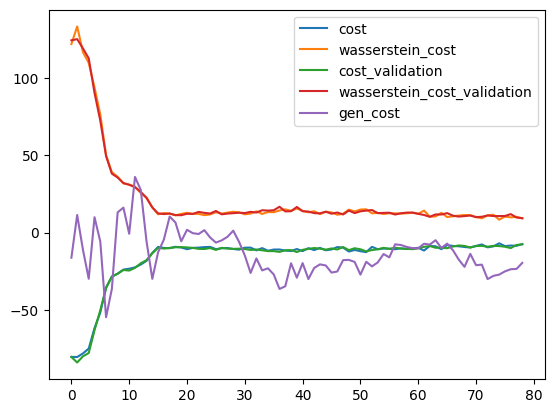

2023-12-30 15:02:37,101 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:02:39,327 - g4gan - INFO - D_self: 243.69
INFO:g4gan:D_self: 243.69
2023-12-30 15:02:39,332 - g4gan - INFO - D_train: 244.34
INFO:g4gan:D_train: 244.34


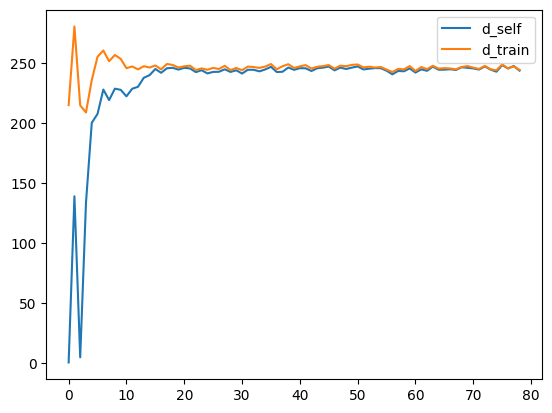

2023-12-30 15:02:39,642 - g4gan - INFO - Epoch: 80/200
INFO:g4gan:Epoch: 80/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:03:13,916 - g4gan - INFO - {'discriminator': [{'cost': -8.711395263671875,
                    'cost_validation': -8.312170028686523,
                    'wasserstein_cost': 10.462051391601562,
                    'wasserstein_cost_validation': 10.00889778137207},
                   {'cost': -8.340521812438965,
                    'cost_validation': -8.161249160766602,
                    'wasserstein_cost': 9.805217742919922,
                    'wasserstein_cost_validation': 9.613239288330078},
                   {'cost': -7.935790061950684,
                    'cost_validation': -7.685954570770264,
                    'wasserstein_cost': 9.607551574707031,
                    'wasser

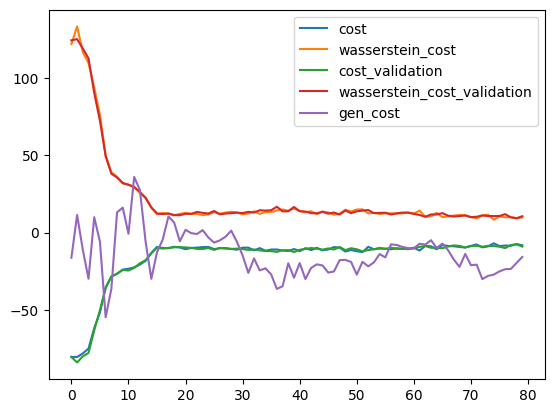

2023-12-30 15:03:14,212 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:03:17,237 - g4gan - INFO - D_self: 247.08
INFO:g4gan:D_self: 247.08
2023-12-30 15:03:17,245 - g4gan - INFO - D_train: 247.18
INFO:g4gan:D_train: 247.18


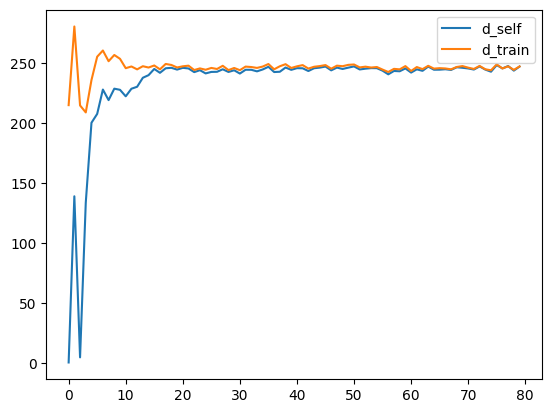

2023-12-30 15:03:17,601 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:03:17,611 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:03:17,712 - g4gan - INFO - Epoch: 81/200
INFO:g4gan:Epoch: 81/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    G   A   G   T   G   A   A   C   A   T  ...   T   T   C   T   G   C   T   
1    A   C   G   T   C   C   C   T   G   C  ...   C   A   C   G   G   G   C   
2    A   T   C   A   G   G   G   G   A   G  ...   A   A   G   G   T   C   A   
3    C   A   C   T   A   G   C   G   C   G  ...   T   C   G   G   A   G   T   
4    G   A   T   T   G   T   A   G   A   T  ...   T   A   C   T   C   C   T   
5    T   A   G   G   C   T   G   G   G   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   T   C   G   T   
7    A   C   C   C   C   G   T   G   T   C  ...   G   G   C   G   C   G   C   
8    C   A   C   G   G   G   C   G   C   G  ...   T   C   T   C   T   A   A   
9    A   T   C   A   G   A   A   G   G   A  ...   A   G   G   T   G   T   G   
10   T   A   C   C   A   C   T   C   C   A  ...   T   T   C   C   A   C   C   
11   T   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 15:03:46,623 - g4gan - INFO - {'discriminator': [{'cost': -8.524044036865234,
                    'cost_validation': -7.476927757263184,
                    'wasserstein_cost': 11.112737655639648,
                    'wasserstein_cost_validation': 9.352941513061523},
                   {'cost': -7.2874016761779785,
                    'cost_validation': -8.32080078125,
                    'wasserstein_cost': 9.429367065429688,
                    'wasserstein_cost_validation': 10.27920913696289},
                   {'cost': -7.64553689956665,
                    'cost_validation': -8.538679122924805,
                    'wasserstein_cost': 9.48031997680664,
                    'wasserstein_cost_validation': 10.15086555480957},
                   {'cost': -7.786139488220215,
                    'cost_validation': -7.839297771453857,
                    'wasserstein_cost': 9.287528991699219,
                    'wasserstein_cost_validation': 9.773160934448242},
               

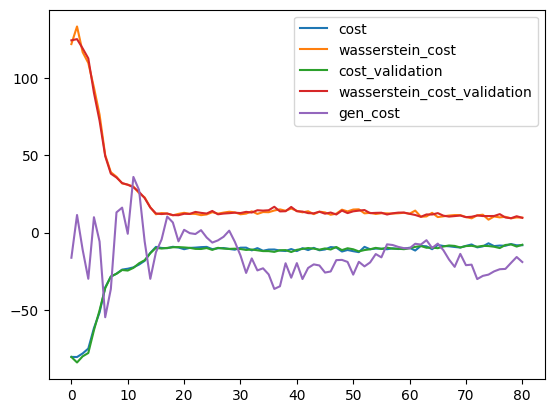

2023-12-30 15:03:47,017 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:03:50,910 - g4gan - INFO - D_self: 246.81
INFO:g4gan:D_self: 246.81
2023-12-30 15:03:50,918 - g4gan - INFO - D_train: 247.44
INFO:g4gan:D_train: 247.44


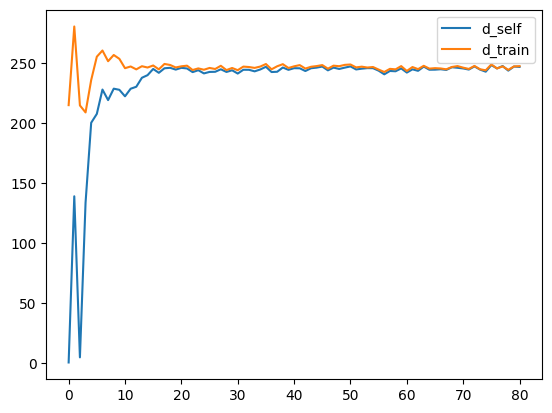

2023-12-30 15:03:51,255 - g4gan - INFO - Epoch: 82/200
INFO:g4gan:Epoch: 82/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:04:20,275 - g4gan - INFO - {'discriminator': [{'cost': -7.8181257247924805,
                    'cost_validation': -8.445467948913574,
                    'wasserstein_cost': 9.224554061889648,
                    'wasserstein_cost_validation': 9.904441833496094},
                   {'cost': -8.650341987609863,
                    'cost_validation': -8.758615493774414,
                    'wasserstein_cost': 10.122138977050781,
                    'wasserstein_cost_validation': 10.392784118652344},
                   {'cost': -7.937954902648926,
                    'cost_validation': -7.815582752227783,
                    'wasserstein_cost': 9.421865463256836,
                    'wass

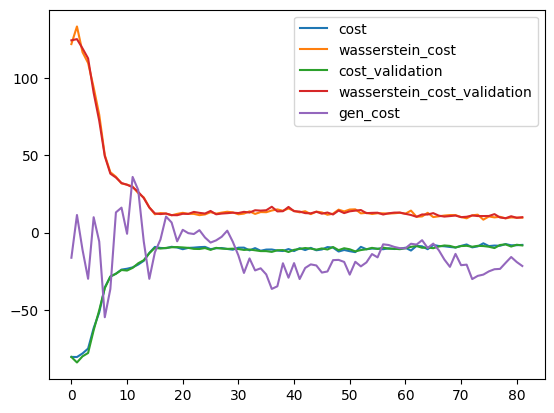

2023-12-30 15:04:20,618 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:04:23,339 - g4gan - INFO - D_self: 244.18
INFO:g4gan:D_self: 244.18
2023-12-30 15:04:23,343 - g4gan - INFO - D_train: 244.59
INFO:g4gan:D_train: 244.59


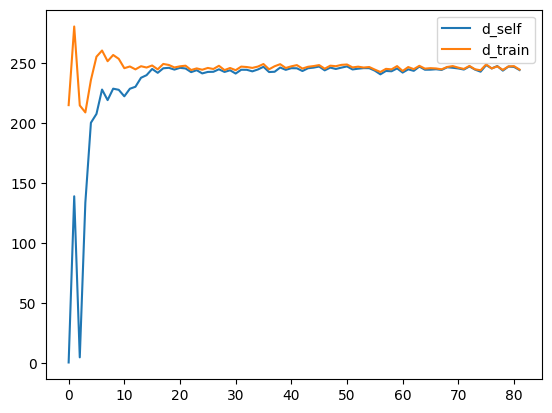

2023-12-30 15:04:23,664 - g4gan - INFO - Epoch: 83/200
INFO:g4gan:Epoch: 83/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:04:52,569 - g4gan - INFO - {'discriminator': [{'cost': -7.4978108406066895,
                    'cost_validation': -7.694003105163574,
                    'wasserstein_cost': 9.155876159667969,
                    'wasserstein_cost_validation': 9.704816818237305},
                   {'cost': -7.945738792419434,
                    'cost_validation': -8.650004386901855,
                    'wasserstein_cost': 9.585609436035156,
                    'wasserstein_cost_validation': 10.610340118408203},
                   {'cost': -8.758586883544922,
                    'cost_validation': -8.377840042114258,
                    'wasserstein_cost': 10.637481689453125,
                    'wass

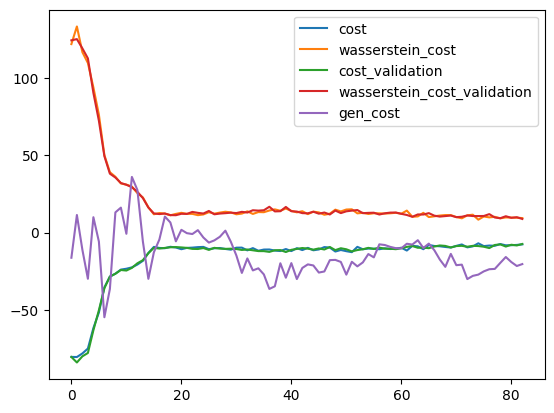

2023-12-30 15:04:52,843 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:04:55,100 - g4gan - INFO - D_self: 246.93
INFO:g4gan:D_self: 246.93
2023-12-30 15:04:55,104 - g4gan - INFO - D_train: 247.48
INFO:g4gan:D_train: 247.48


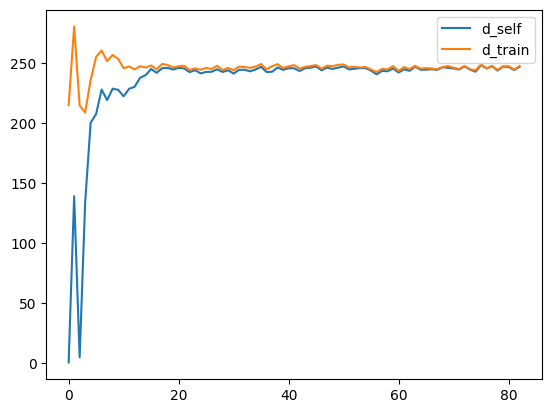

2023-12-30 15:04:55,664 - g4gan - INFO - Epoch: 84/200
INFO:g4gan:Epoch: 84/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:05:24,518 - g4gan - INFO - {'discriminator': [{'cost': -8.19990062713623,
                    'cost_validation': -8.147298812866211,
                    'wasserstein_cost': 9.942502975463867,
                    'wasserstein_cost_validation': 10.137115478515625},
                   {'cost': -8.437726974487305,
                    'cost_validation': -8.693077087402344,
                    'wasserstein_cost': 10.310100555419922,
                    'wasserstein_cost_validation': 10.192432403564453},
                   {'cost': -7.589786529541016,
                    'cost_validation': -7.7213263511657715,
                    'wasserstein_cost': 8.867713928222656,
                    'wass

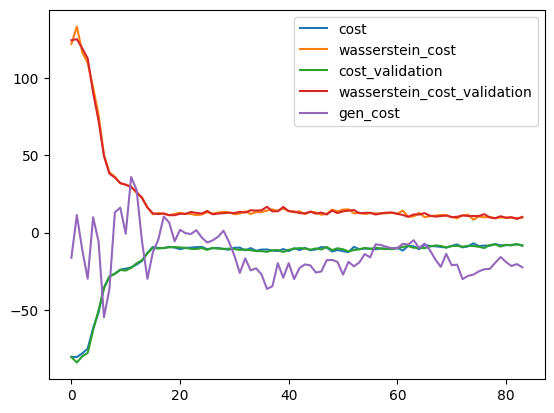

2023-12-30 15:05:24,790 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:05:26,982 - g4gan - INFO - D_self: 246.68
INFO:g4gan:D_self: 246.68
2023-12-30 15:05:26,986 - g4gan - INFO - D_train: 247.02
INFO:g4gan:D_train: 247.02


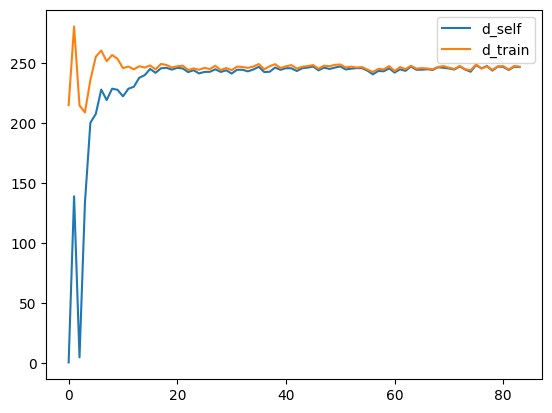

2023-12-30 15:05:27,216 - g4gan - INFO - Epoch: 85/200
INFO:g4gan:Epoch: 85/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:05:57,035 - g4gan - INFO - {'discriminator': [{'cost': -6.978630065917969,
                    'cost_validation': -7.426938533782959,
                    'wasserstein_cost': 8.314617156982422,
                    'wasserstein_cost_validation': 8.662460327148438},
                   {'cost': -8.141889572143555,
                    'cost_validation': -7.040184020996094,
                    'wasserstein_cost': 9.764339447021484,
                    'wasserstein_cost_validation': 8.465551376342773},
                   {'cost': -7.818902969360352,
                    'cost_validation': -9.106789588928223,
                    'wasserstein_cost': 9.038761138916016,
                    'wassers

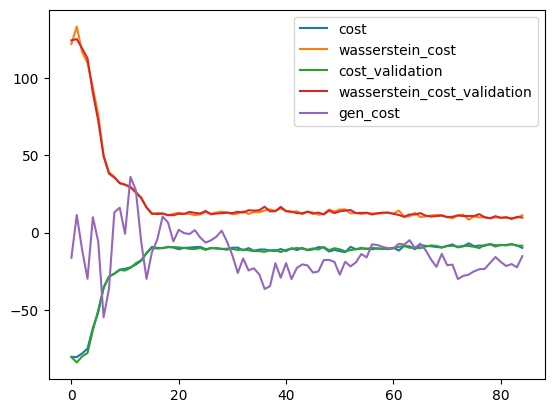

2023-12-30 15:05:57,320 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:05:59,606 - g4gan - INFO - D_self: 246.65
INFO:g4gan:D_self: 246.65
2023-12-30 15:05:59,610 - g4gan - INFO - D_train: 249.03
INFO:g4gan:D_train: 249.03


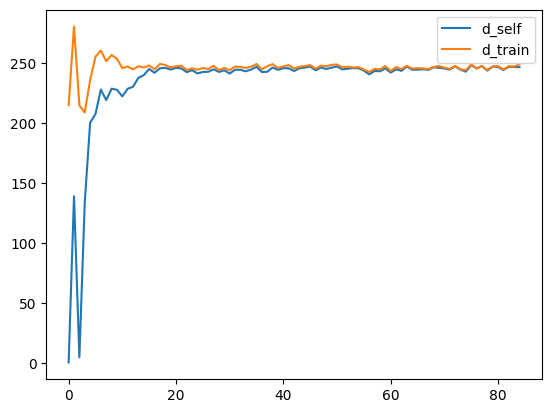

2023-12-30 15:05:59,867 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:05:59,874 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:05:59,955 - g4gan - INFO - Epoch: 86/200
INFO:g4gan:Epoch: 86/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    G   A   T   T   G   A   T   C   A   T  ...   T   A   C   T   G   C   T   
1    A   C   G   T   C   C   C   G   G   C  ...   C   A   C   G   G   G   C   
2    A   T   C   A   G   G   G   G   A   G  ...   A   A   G   G   T   C   A   
3    C   A   C   T   A   T   C   G   C   G  ...   T   C   G   G   A   G   A   
4    G   A   A   T   G   T   A   G   A   T  ...   T   A   C   T   C   C   T   
5    T   A   G   G   G   T   G   T   G   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   G   T   T   C   C   A  ...   G   C   C   T   C   G   T   
7    A   C   C   C   C   G   T   G   T   C  ...   G   G   C   G   C   G   C   
8    C   A   C   G   G   G   C   G   C   G  ...   A   C   T   C   A   A   A   
9    T   G   C   A   G   A   A   G   G   A  ...   A   G   T   T   G   A   G   
10   T   A   C   C   A   C   T   G   C   A  ...   T   A   C   C   A   C   C   
11   T   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 15:06:31,805 - g4gan - INFO - {'discriminator': [{'cost': -9.202346801757812,
                    'cost_validation': -8.490309715270996,
                    'wasserstein_cost': 10.57990837097168,
                    'wasserstein_cost_validation': 10.284915924072266},
                   {'cost': -8.698074340820312,
                    'cost_validation': -7.441775321960449,
                    'wasserstein_cost': 10.67308235168457,
                    'wasserstein_cost_validation': 9.039373397827148},
                   {'cost': -7.99236536026001,
                    'cost_validation': -8.953912734985352,
                    'wasserstein_cost': 9.437093734741211,
                    'wasserstein_cost_validation': 10.82784652709961},
                   {'cost': -8.179169654846191,
                    'cost_validation': -8.649375915527344,
                    'wasserstein_cost': 9.938621520996094,
                    'wasserstein_cost_validation': 10.2930908203125},
            

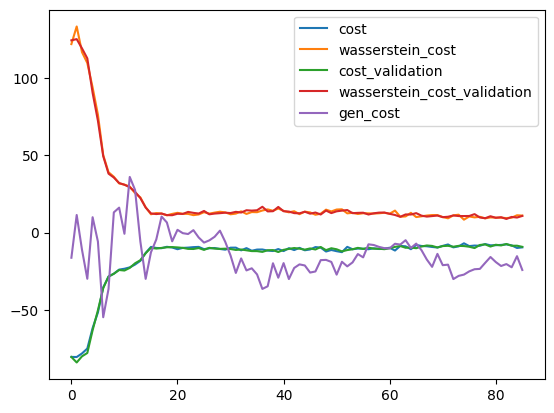

2023-12-30 15:06:32,140 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:06:36,067 - g4gan - INFO - D_self: 247.41
INFO:g4gan:D_self: 247.41
2023-12-30 15:06:36,076 - g4gan - INFO - D_train: 247.84
INFO:g4gan:D_train: 247.84


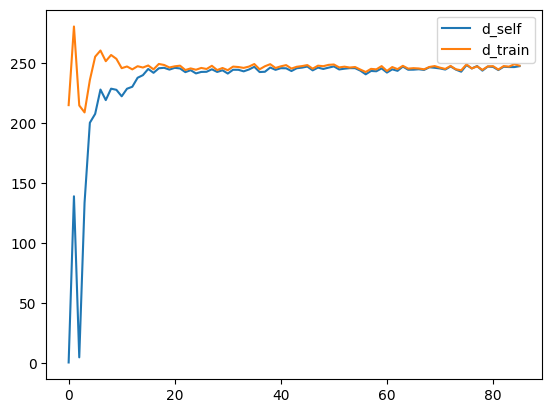

2023-12-30 15:06:36,388 - g4gan - INFO - Epoch: 87/200
INFO:g4gan:Epoch: 87/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:07:09,061 - g4gan - INFO - {'discriminator': [{'cost': -8.078699111938477,
                    'cost_validation': -7.767956256866455,
                    'wasserstein_cost': 9.722661972045898,
                    'wasserstein_cost_validation': 9.415403366088867},
                   {'cost': -7.771010875701904,
                    'cost_validation': -7.460027694702148,
                    'wasserstein_cost': 9.665767669677734,
                    'wasserstein_cost_validation': 9.219324111938477},
                   {'cost': -7.78557014465332,
                    'cost_validation': -8.462103843688965,
                    'wasserstein_cost': 9.499338150024414,
                    'wasserst

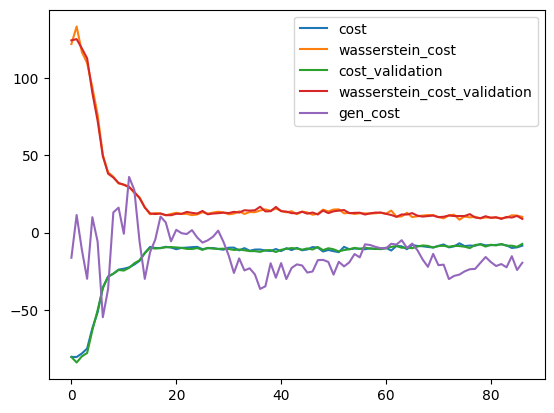

2023-12-30 15:07:09,355 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:07:11,599 - g4gan - INFO - D_self: 248.9
INFO:g4gan:D_self: 248.9
2023-12-30 15:07:11,602 - g4gan - INFO - D_train: 249.29
INFO:g4gan:D_train: 249.29


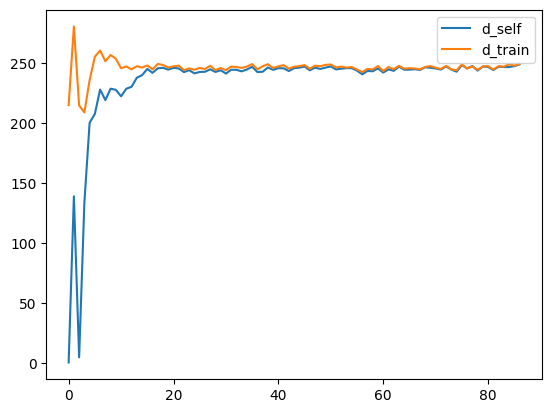

2023-12-30 15:07:11,931 - g4gan - INFO - Epoch: 88/200
INFO:g4gan:Epoch: 88/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:07:40,768 - g4gan - INFO - {'discriminator': [{'cost': -7.440333366394043,
                    'cost_validation': -8.71422004699707,
                    'wasserstein_cost': 9.47799301147461,
                    'wasserstein_cost_validation': 10.422889709472656},
                   {'cost': -8.117082595825195,
                    'cost_validation': -8.215304374694824,
                    'wasserstein_cost': 9.73537826538086,
                    'wasserstein_cost_validation': 10.691247940063477},
                   {'cost': -6.962268352508545,
                    'cost_validation': -7.907484531402588,
                    'wasserstein_cost': 8.602333068847656,
                    'wasserst

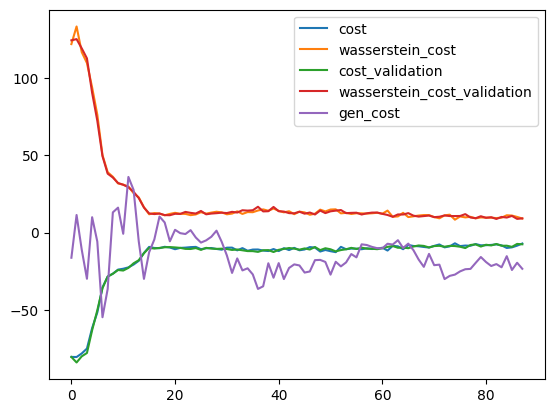

2023-12-30 15:07:41,062 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:07:43,321 - g4gan - INFO - D_self: 248.85
INFO:g4gan:D_self: 248.85
2023-12-30 15:07:43,325 - g4gan - INFO - D_train: 249.31
INFO:g4gan:D_train: 249.31


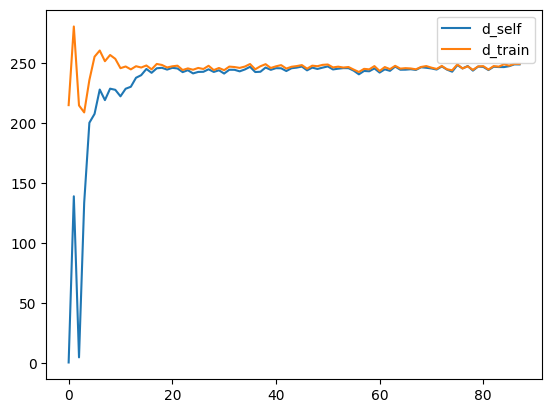

2023-12-30 15:07:43,613 - g4gan - INFO - Epoch: 89/200
INFO:g4gan:Epoch: 89/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:08:13,067 - g4gan - INFO - {'discriminator': [{'cost': -8.340300559997559,
                    'cost_validation': -8.933231353759766,
                    'wasserstein_cost': 9.629501342773438,
                    'wasserstein_cost_validation': 10.489768981933594},
                   {'cost': -8.311498641967773,
                    'cost_validation': -7.328392028808594,
                    'wasserstein_cost': 9.679794311523438,
                    'wasserstein_cost_validation': 8.73708724975586},
                   {'cost': -9.053672790527344,
                    'cost_validation': -8.938167572021484,
                    'wasserstein_cost': 10.898109436035156,
                    'wasser

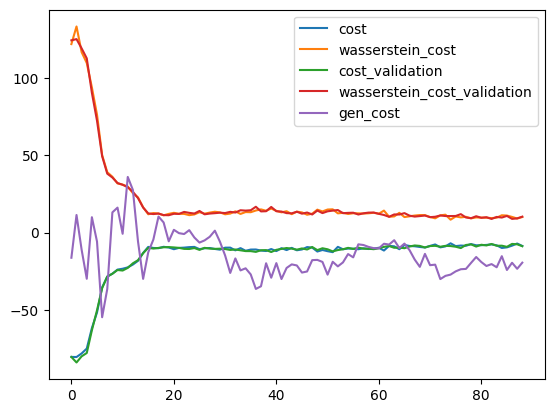

2023-12-30 15:08:13,362 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:08:15,593 - g4gan - INFO - D_self: 246.58
INFO:g4gan:D_self: 246.58
2023-12-30 15:08:15,598 - g4gan - INFO - D_train: 246.6
INFO:g4gan:D_train: 246.6


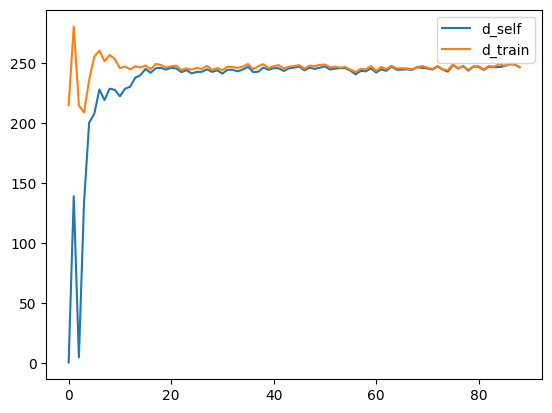

2023-12-30 15:08:15,860 - g4gan - INFO - Epoch: 90/200
INFO:g4gan:Epoch: 90/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:08:44,895 - g4gan - INFO - {'discriminator': [{'cost': -7.6428375244140625,
                    'cost_validation': -7.85249137878418,
                    'wasserstein_cost': 9.434120178222656,
                    'wasserstein_cost_validation': 9.447765350341797},
                   {'cost': -8.601797103881836,
                    'cost_validation': -8.315935134887695,
                    'wasserstein_cost': 9.955352783203125,
                    'wasserstein_cost_validation': 10.012985229492188},
                   {'cost': -7.979326248168945,
                    'cost_validation': -8.33390998840332,
                    'wasserstein_cost': 9.82229995727539,
                    'wasserst

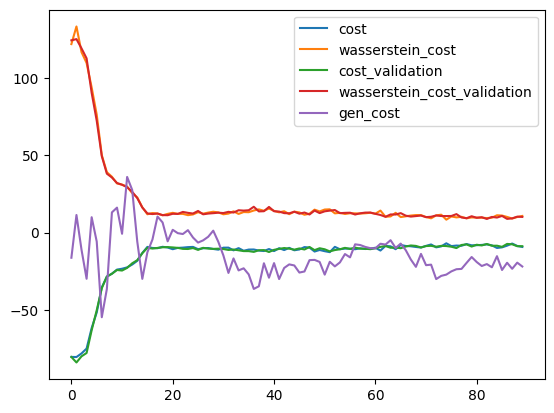

2023-12-30 15:08:45,199 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:08:48,774 - g4gan - INFO - D_self: 248.86
INFO:g4gan:D_self: 248.86
2023-12-30 15:08:48,778 - g4gan - INFO - D_train: 248.39
INFO:g4gan:D_train: 248.39


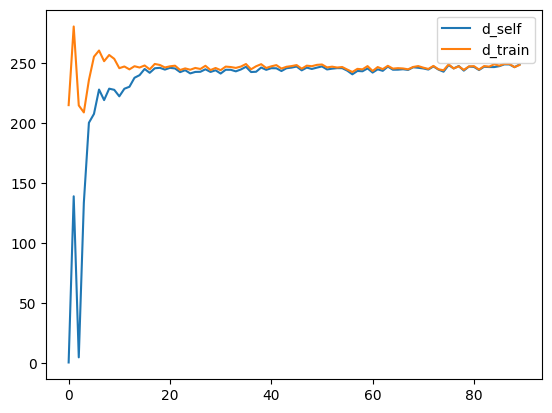

2023-12-30 15:08:49,085 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:08:49,094 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:08:49,221 - g4gan - INFO - Epoch: 91/200
INFO:g4gan:Epoch: 91/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    G   A   T   A   G   A   T   C   A   T  ...   T   A   C   T   G   C   T   
1    A   C   C   T   C   C   C   G   T   C  ...   C   A   C   G   G   G   C   
2    T   T   C   A   G   G   G   G   A   G  ...   A   A   T   G   T   C   A   
3    C   A   C   T   A   T   C   T   C   G  ...   T   C   G   G   A   G   A   
4    G   A   T   T   G   G   A   G   A   T  ...   T   A   C   T   C   C   T   
5    T   A   G   G   C   G   G   T   G   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   T   C   G   T   
7    A   C   C   C   C   G   T   G   T   C  ...   C   G   C   G   C   G   C   
8    C   A   C   G   C   G   C   G   C   T  ...   A   C   T   C   A   T   A   
9    T   G   C   A   G   A   A   G   G   A  ...   A   G   T   T   G   A   G   
10   T   T   C   C   T   C   T   G   C   A  ...   T   T   C   C   A   C   C   
11   T   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 15:09:18,509 - g4gan - INFO - {'discriminator': [{'cost': -8.952874183654785,
                    'cost_validation': -7.58402156829834,
                    'wasserstein_cost': 10.649154663085938,
                    'wasserstein_cost_validation': 9.628150939941406},
                   {'cost': -7.9506144523620605,
                    'cost_validation': -8.43941879272461,
                    'wasserstein_cost': 9.73507308959961,
                    'wasserstein_cost_validation': 10.381675720214844},
                   {'cost': -7.4143757820129395,
                    'cost_validation': -7.624238014221191,
                    'wasserstein_cost': 9.15127182006836,
                    'wasserstein_cost_validation': 9.456512451171875},
                   {'cost': -7.9933624267578125,
                    'cost_validation': -8.859417915344238,
                    'wasserstein_cost': 9.771139144897461,
                    'wasserstein_cost_validation': 10.800712585449219},
         

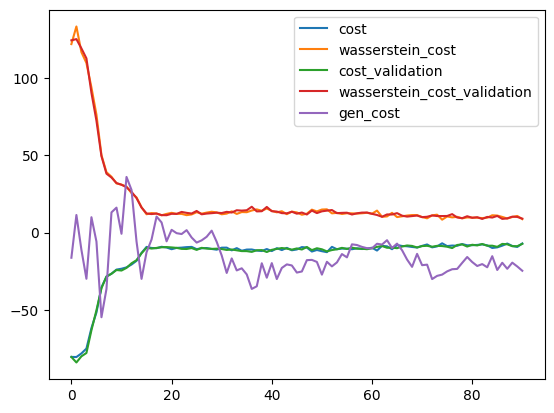

2023-12-30 15:09:18,835 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:09:22,596 - g4gan - INFO - D_self: 247.89
INFO:g4gan:D_self: 247.89
2023-12-30 15:09:22,601 - g4gan - INFO - D_train: 247.17
INFO:g4gan:D_train: 247.17


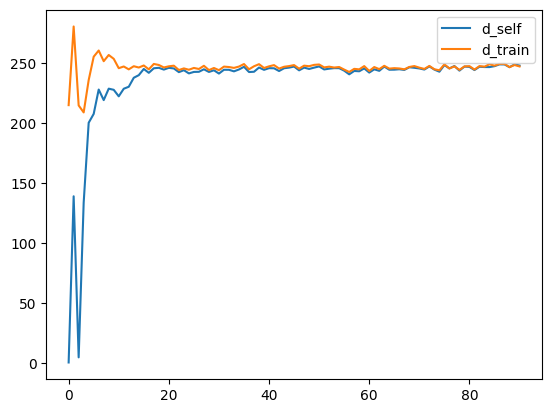

2023-12-30 15:09:22,883 - g4gan - INFO - Epoch: 92/200
INFO:g4gan:Epoch: 92/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:09:51,862 - g4gan - INFO - {'discriminator': [{'cost': -8.29888916015625,
                    'cost_validation': -7.684782981872559,
                    'wasserstein_cost': 9.89202880859375,
                    'wasserstein_cost_validation': 9.173196792602539},
                   {'cost': -8.626507759094238,
                    'cost_validation': -7.735706329345703,
                    'wasserstein_cost': 10.162254333496094,
                    'wasserstein_cost_validation': 9.262166976928711},
                   {'cost': -8.43873405456543,
                    'cost_validation': -8.737798690795898,
                    'wasserstein_cost': 9.732566833496094,
                    'wasserste

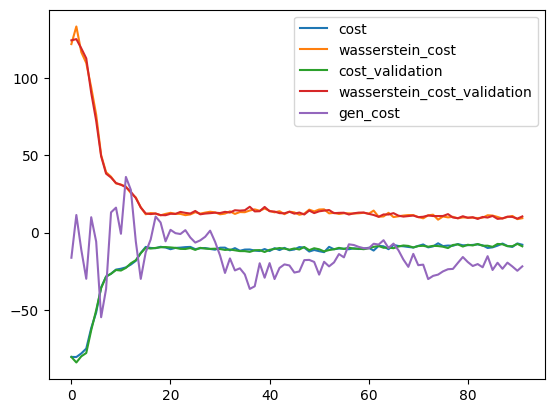

2023-12-30 15:09:52,187 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:09:54,464 - g4gan - INFO - D_self: 246.08
INFO:g4gan:D_self: 246.08
2023-12-30 15:09:54,468 - g4gan - INFO - D_train: 245.97
INFO:g4gan:D_train: 245.97


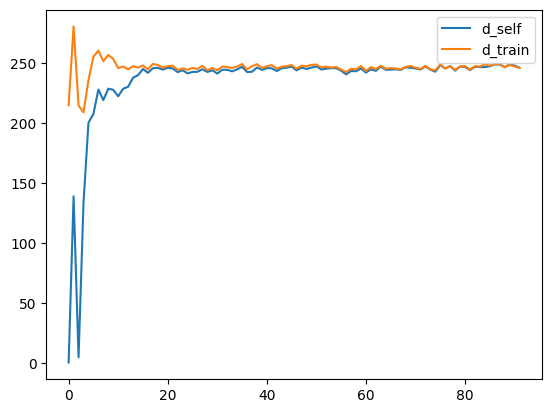

2023-12-30 15:09:54,754 - g4gan - INFO - Epoch: 93/200
INFO:g4gan:Epoch: 93/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:10:23,826 - g4gan - INFO - {'discriminator': [{'cost': -7.640383720397949,
                    'cost_validation': -7.007848739624023,
                    'wasserstein_cost': 9.948173522949219,
                    'wasserstein_cost_validation': 8.656759262084961},
                   {'cost': -8.696438789367676,
                    'cost_validation': -8.9656982421875,
                    'wasserstein_cost': 10.822578430175781,
                    'wasserstein_cost_validation': 10.838010787963867},
                   {'cost': -9.015220642089844,
                    'cost_validation': -8.523116111755371,
                    'wasserstein_cost': 10.536556243896484,
                    'wasser

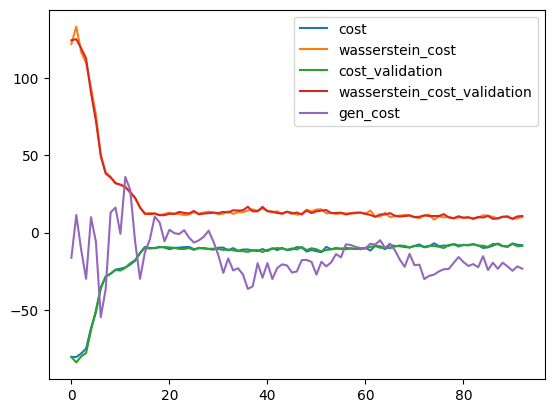

2023-12-30 15:10:24,077 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:10:26,341 - g4gan - INFO - D_self: 245.14
INFO:g4gan:D_self: 245.14
2023-12-30 15:10:26,345 - g4gan - INFO - D_train: 245.51
INFO:g4gan:D_train: 245.51


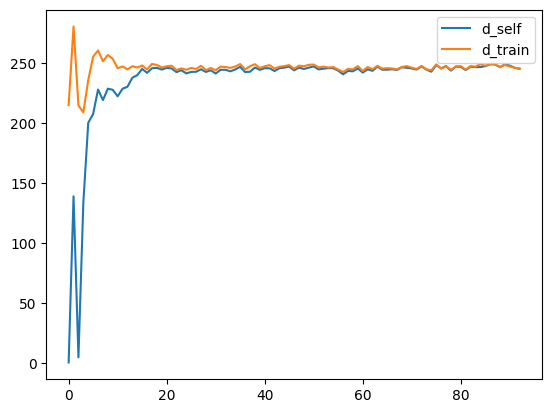

2023-12-30 15:10:26,638 - g4gan - INFO - Epoch: 94/200
INFO:g4gan:Epoch: 94/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:10:55,683 - g4gan - INFO - {'discriminator': [{'cost': -7.971385478973389,
                    'cost_validation': -6.593882083892822,
                    'wasserstein_cost': 10.04704475402832,
                    'wasserstein_cost_validation': 8.500505447387695},
                   {'cost': -7.772481918334961,
                    'cost_validation': -8.045654296875,
                    'wasserstein_cost': 9.955373764038086,
                    'wasserstein_cost_validation': 9.80147933959961},
                   {'cost': -7.555398941040039,
                    'cost_validation': -7.731473445892334,
                    'wasserstein_cost': 9.262622833251953,
                    'wasserstein

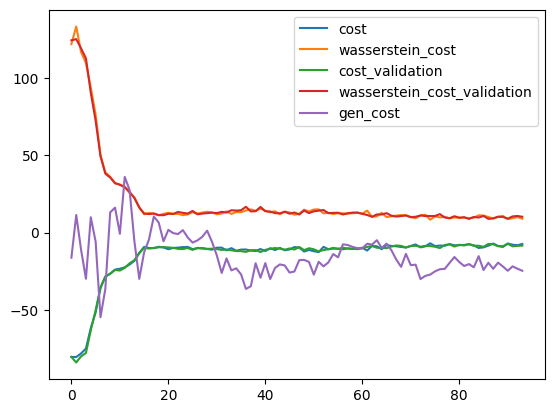

2023-12-30 15:10:55,994 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:10:58,294 - g4gan - INFO - D_self: 249.89
INFO:g4gan:D_self: 249.89
2023-12-30 15:10:58,300 - g4gan - INFO - D_train: 249.38
INFO:g4gan:D_train: 249.38


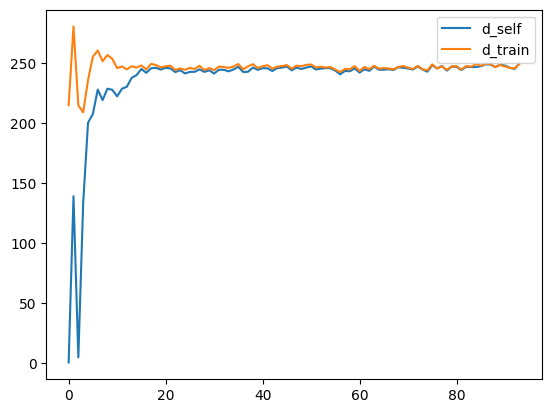

2023-12-30 15:10:58,610 - g4gan - INFO - Epoch: 95/200
INFO:g4gan:Epoch: 95/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:11:27,643 - g4gan - INFO - {'discriminator': [{'cost': -7.138479709625244,
                    'cost_validation': -7.84975004196167,
                    'wasserstein_cost': 8.990528106689453,
                    'wasserstein_cost_validation': 9.503318786621094},
                   {'cost': -7.013810157775879,
                    'cost_validation': -8.538222312927246,
                    'wasserstein_cost': 8.608865737915039,
                    'wasserstein_cost_validation': 9.864683151245117},
                   {'cost': -7.615903854370117,
                    'cost_validation': -8.935955047607422,
                    'wasserstein_cost': 9.142641067504883,
                    'wasserst

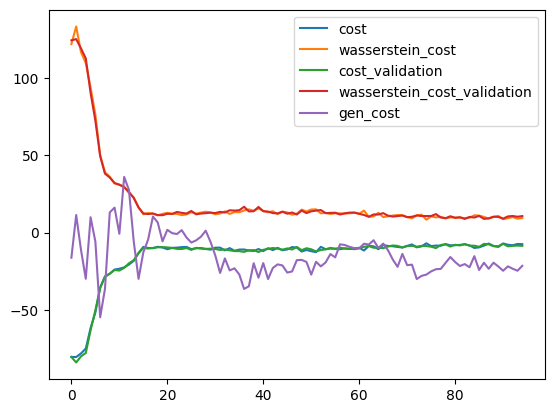

2023-12-30 15:11:27,954 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:11:31,073 - g4gan - INFO - D_self: 248.58
INFO:g4gan:D_self: 248.58
2023-12-30 15:11:31,077 - g4gan - INFO - D_train: 248.98
INFO:g4gan:D_train: 248.98


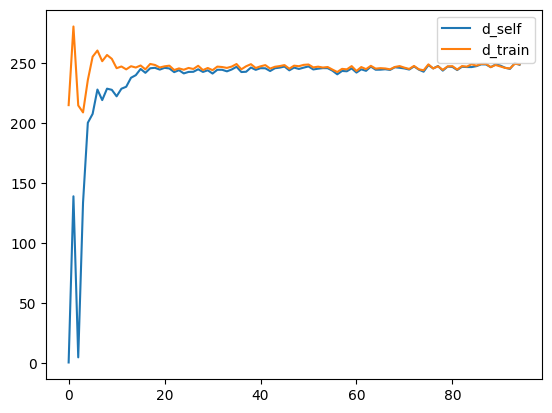

2023-12-30 15:11:31,400 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:11:31,408 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:11:31,524 - g4gan - INFO - Epoch: 96/200
INFO:g4gan:Epoch: 96/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    G   A   T   T   G   T   T   C   A   T  ...   T   A   C   T   G   C   T   
1    A   C   G   T   C   C   C   T   T   C  ...   C   A   C   T   G   G   C   
2    T   T   C   A   G   G   G   G   A   T  ...   A   A   T   G   A   C   T   
3    C   A   C   G   A   T   C   G   C   G  ...   T   C   G   G   A   G   A   
4    G   A   A   A   G   G   A   G   A   T  ...   T   A   C   T   C   C   T   
5    T   A   G   G   G   T   G   G   G   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   T   G   G   T   
7    A   G   C   C   C   G   T   G   T   C  ...   G   G   C   G   C   G   C   
8    C   A   C   G   G   G   C   G   C   T  ...   A   C   A   C   T   T   A   
9    T   G   C   A   G   A   A   G   G   A  ...   A   G   T   T   G   T   G   
10   G   A   G   C   T   C   T   G   C   A  ...   T   A   C   C   A   C   C   
11   T   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 15:12:00,661 - g4gan - INFO - {'discriminator': [{'cost': -8.184009552001953,
                    'cost_validation': -7.4635820388793945,
                    'wasserstein_cost': 9.850414276123047,
                    'wasserstein_cost_validation': 8.985309600830078},
                   {'cost': -8.528318405151367,
                    'cost_validation': -7.341700553894043,
                    'wasserstein_cost': 10.238861083984375,
                    'wasserstein_cost_validation': 8.72359848022461},
                   {'cost': -8.97838020324707,
                    'cost_validation': -9.50226879119873,
                    'wasserstein_cost': 10.110239028930664,
                    'wasserstein_cost_validation': 11.42579460144043},
                   {'cost': -8.753523826599121,
                    'cost_validation': -9.132292747497559,
                    'wasserstein_cost': 10.44839096069336,
                    'wasserstein_cost_validation': 11.099102020263672},
          

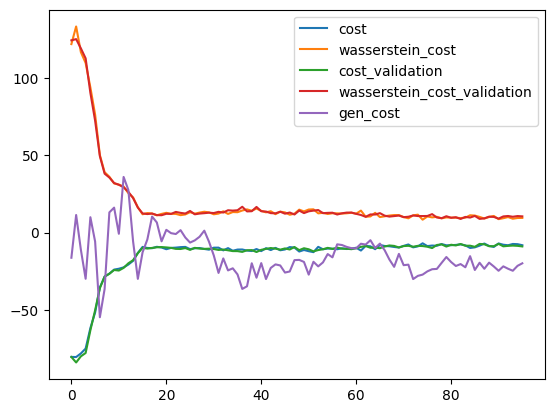

2023-12-30 15:12:01,041 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:12:05,046 - g4gan - INFO - D_self: 246.97
INFO:g4gan:D_self: 246.97
2023-12-30 15:12:05,051 - g4gan - INFO - D_train: 246.44
INFO:g4gan:D_train: 246.44


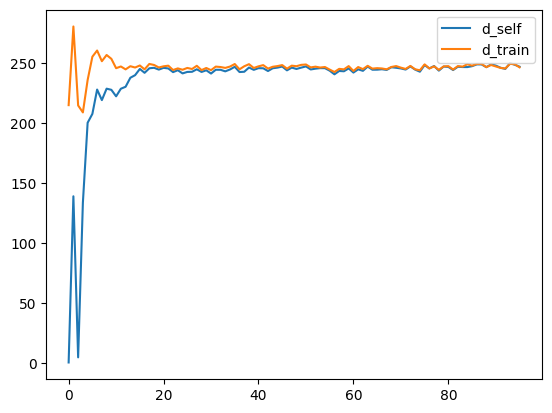

2023-12-30 15:12:05,386 - g4gan - INFO - Epoch: 97/200
INFO:g4gan:Epoch: 97/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:12:34,361 - g4gan - INFO - {'discriminator': [{'cost': -6.596374988555908,
                    'cost_validation': -6.165125846862793,
                    'wasserstein_cost': 8.045394897460938,
                    'wasserstein_cost_validation': 7.667652130126953},
                   {'cost': -8.174134254455566,
                    'cost_validation': -7.908473014831543,
                    'wasserstein_cost': 9.88587760925293,
                    'wasserstein_cost_validation': 9.582508087158203},
                   {'cost': -8.656271934509277,
                    'cost_validation': -8.840673446655273,
                    'wasserstein_cost': 10.114078521728516,
                    'wassers

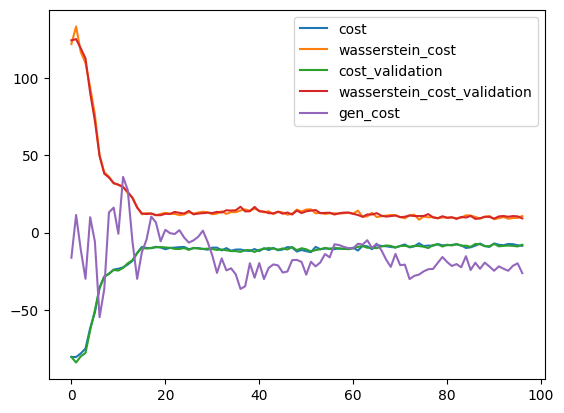

2023-12-30 15:12:34,707 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:12:37,327 - g4gan - INFO - D_self: 243.83
INFO:g4gan:D_self: 243.83
2023-12-30 15:12:37,334 - g4gan - INFO - D_train: 243.58
INFO:g4gan:D_train: 243.58


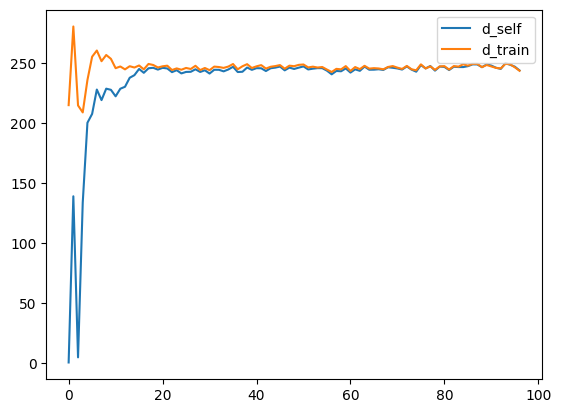

2023-12-30 15:12:37,629 - g4gan - INFO - Epoch: 98/200
INFO:g4gan:Epoch: 98/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:13:06,692 - g4gan - INFO - {'discriminator': [{'cost': -7.131110668182373,
                    'cost_validation': -7.719708442687988,
                    'wasserstein_cost': 8.807573318481445,
                    'wasserstein_cost_validation': 9.556568145751953},
                   {'cost': -9.04297924041748,
                    'cost_validation': -8.080942153930664,
                    'wasserstein_cost': 10.860191345214844,
                    'wasserstein_cost_validation': 9.858829498291016},
                   {'cost': -7.910218238830566,
                    'cost_validation': -7.9118852615356445,
                    'wasserstein_cost': 9.842525482177734,
                    'wasser

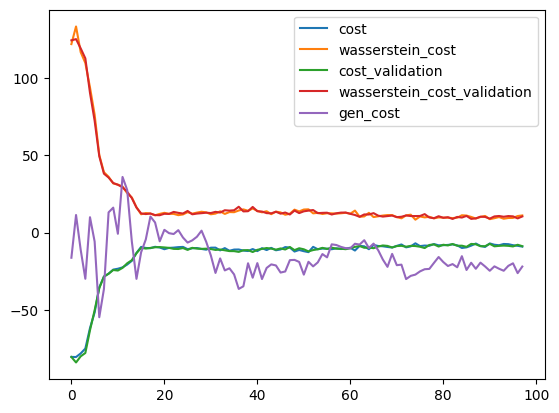

2023-12-30 15:13:06,945 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:13:09,228 - g4gan - INFO - D_self: 250.36
INFO:g4gan:D_self: 250.36
2023-12-30 15:13:09,234 - g4gan - INFO - D_train: 249.35
INFO:g4gan:D_train: 249.35


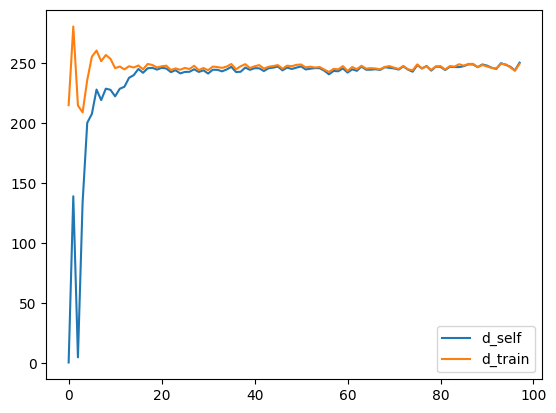

2023-12-30 15:13:09,567 - g4gan - INFO - Epoch: 99/200
INFO:g4gan:Epoch: 99/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:13:38,592 - g4gan - INFO - {'discriminator': [{'cost': -7.395855903625488,
                    'cost_validation': -6.895915508270264,
                    'wasserstein_cost': 9.149580001831055,
                    'wasserstein_cost_validation': 8.355710983276367},
                   {'cost': -7.524667263031006,
                    'cost_validation': -8.146589279174805,
                    'wasserstein_cost': 8.600095748901367,
                    'wasserstein_cost_validation': 9.36752700805664},
                   {'cost': -7.935633659362793,
                    'cost_validation': -7.996659755706787,
                    'wasserstein_cost': 9.228347778320312,
                    'wasserst

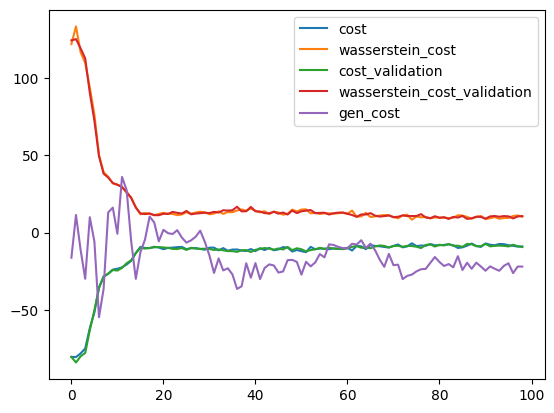

2023-12-30 15:13:38,871 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:13:41,139 - g4gan - INFO - D_self: 248.64
INFO:g4gan:D_self: 248.64
2023-12-30 15:13:41,143 - g4gan - INFO - D_train: 248.51
INFO:g4gan:D_train: 248.51


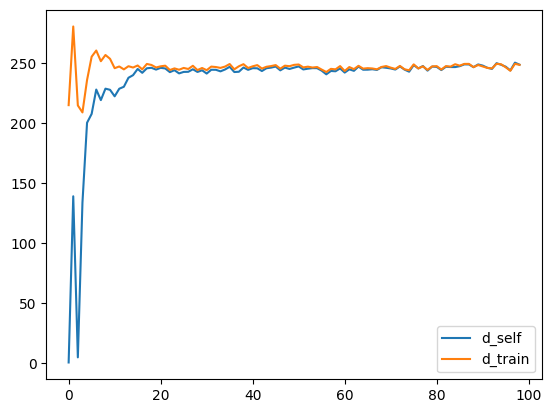

2023-12-30 15:13:41,395 - g4gan - INFO - Epoch: 100/200
INFO:g4gan:Epoch: 100/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:14:10,476 - g4gan - INFO - {'discriminator': [{'cost': -7.612392425537109,
                    'cost_validation': -8.491523742675781,
                    'wasserstein_cost': 9.392950057983398,
                    'wasserstein_cost_validation': 10.45517349243164},
                   {'cost': -7.505105018615723,
                    'cost_validation': -7.790139675140381,
                    'wasserstein_cost': 9.370515823364258,
                    'wasserstein_cost_validation': 9.847347259521484},
                   {'cost': -7.4665937423706055,
                    'cost_validation': -8.007294654846191,
                    'wasserstein_cost': 9.312616348266602,
                    'wass

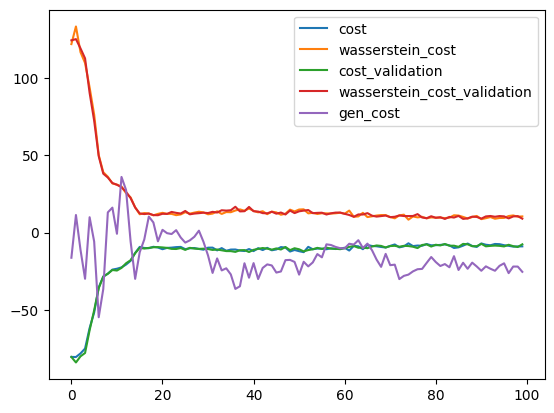

2023-12-30 15:14:10,755 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:14:13,015 - g4gan - INFO - D_self: 245.89
INFO:g4gan:D_self: 245.89
2023-12-30 15:14:13,019 - g4gan - INFO - D_train: 245.93
INFO:g4gan:D_train: 245.93


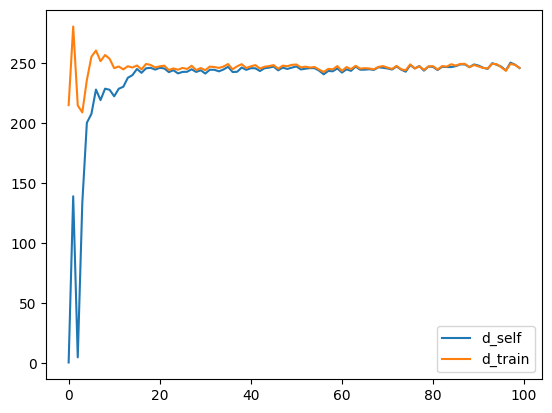

2023-12-30 15:14:13,345 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:14:13,354 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:14:13,460 - g4gan - INFO - Epoch: 101/200
INFO:g4gan:Epoch: 101/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   A   T   T   G   T   T   C   A   T  ...   T   A   C   T   G   C   T   
1    A   C   C   T   C   C   C   T   T   C  ...   C   A   C   G   G   G   C   
2    T   T   C   A   G   G   G   G   A   T  ...   A   A   G   G   T   C   T   
3    C   A   C   G   A   T   C   G   C   C  ...   T   C   G   G   A   G   T   
4    G   A   A   T   G   T   A   G   A   T  ...   G   A   C   T   C   C   T   
5    T   A   G   G   G   G   G   G   G   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   G   C   G   T   
7    T   G   C   C   C   G   T   G   T   C  ...   G   G   C   G   C   T   C   
8    C   A   C   G   G   G   C   G   C   T  ...   A   C   T   C   T   T   A   
9    T   G   C   T   G   A   T   G   G   A  ...   A   G   G   T   G   T   G   
10   G   T   G   C   T   C   G   G   C   A  ...   T   T   C   C   A   C   C   
11   G   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 15:14:42,723 - g4gan - INFO - {'discriminator': [{'cost': -9.02487564086914,
                    'cost_validation': -9.240781784057617,
                    'wasserstein_cost': 10.835203170776367,
                    'wasserstein_cost_validation': 11.7498779296875},
                   {'cost': -8.251705169677734,
                    'cost_validation': -8.242148399353027,
                    'wasserstein_cost': 10.145427703857422,
                    'wasserstein_cost_validation': 10.407238006591797},
                   {'cost': -9.373440742492676,
                    'cost_validation': -8.834981918334961,
                    'wasserstein_cost': 11.136905670166016,
                    'wasserstein_cost_validation': 10.996082305908203},
                   {'cost': -8.778385162353516,
                    'cost_validation': -8.175350189208984,
                    'wasserstein_cost': 10.419698715209961,
                    'wasserstein_cost_validation': 10.132097244262695},
      

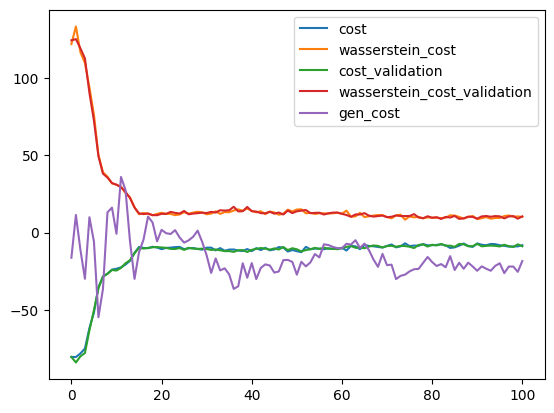

2023-12-30 15:14:43,022 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:14:46,802 - g4gan - INFO - D_self: 247.4
INFO:g4gan:D_self: 247.4
2023-12-30 15:14:46,806 - g4gan - INFO - D_train: 246.83
INFO:g4gan:D_train: 246.83


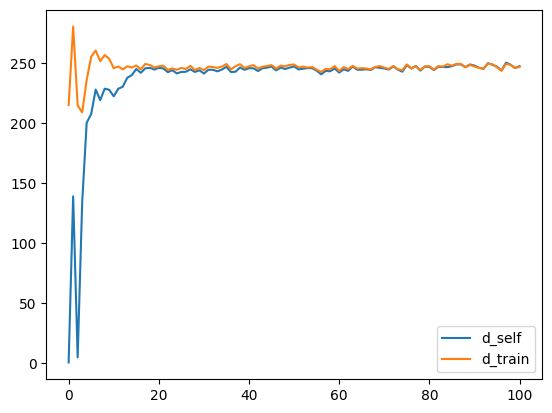

2023-12-30 15:14:47,159 - g4gan - INFO - Epoch: 102/200
INFO:g4gan:Epoch: 102/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:15:16,301 - g4gan - INFO - {'discriminator': [{'cost': -7.793344497680664,
                    'cost_validation': -8.693778991699219,
                    'wasserstein_cost': 9.889328002929688,
                    'wasserstein_cost_validation': 10.73568344116211},
                   {'cost': -9.190108299255371,
                    'cost_validation': -9.768954277038574,
                    'wasserstein_cost': 11.241661071777344,
                    'wasserstein_cost_validation': 12.23892593383789},
                   {'cost': -8.184050559997559,
                    'cost_validation': -7.393276691436768,
                    'wasserstein_cost': 10.38587760925293,
                    'wass

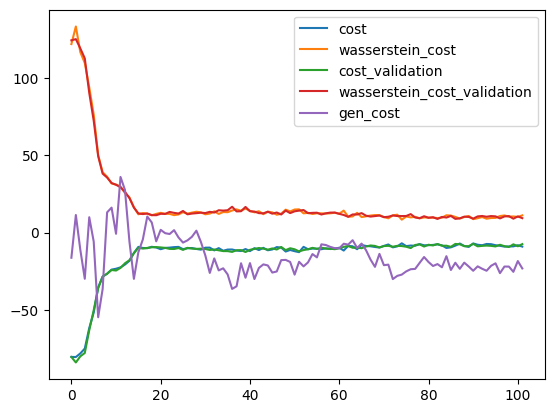

2023-12-30 15:15:16,690 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:15:20,095 - g4gan - INFO - D_self: 248.08
INFO:g4gan:D_self: 248.08
2023-12-30 15:15:20,099 - g4gan - INFO - D_train: 248.18
INFO:g4gan:D_train: 248.18


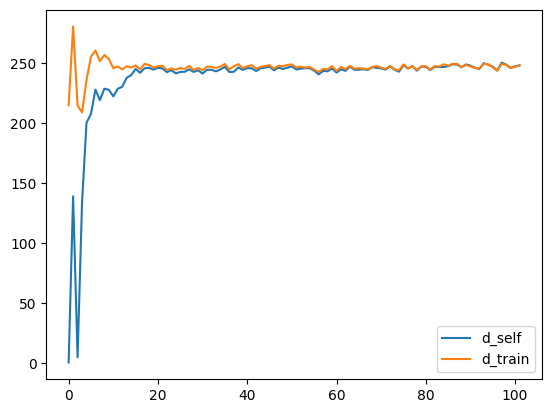

2023-12-30 15:15:20,410 - g4gan - INFO - Epoch: 103/200
INFO:g4gan:Epoch: 103/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:15:49,492 - g4gan - INFO - {'discriminator': [{'cost': -7.724431037902832,
                    'cost_validation': -8.750580787658691,
                    'wasserstein_cost': 9.186113357543945,
                    'wasserstein_cost_validation': 10.366006851196289},
                   {'cost': -7.793458938598633,
                    'cost_validation': -8.002275466918945,
                    'wasserstein_cost': 9.557350158691406,
                    'wasserstein_cost_validation': 9.81716537475586},
                   {'cost': -7.9688520431518555,
                    'cost_validation': -7.6659932136535645,
                    'wasserstein_cost': 9.563426971435547,
                    'was

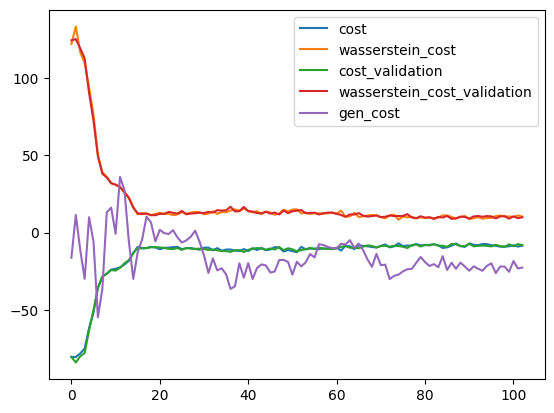

2023-12-30 15:15:49,787 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:15:52,033 - g4gan - INFO - D_self: 243.44
INFO:g4gan:D_self: 243.44
2023-12-30 15:15:52,037 - g4gan - INFO - D_train: 243.97
INFO:g4gan:D_train: 243.97


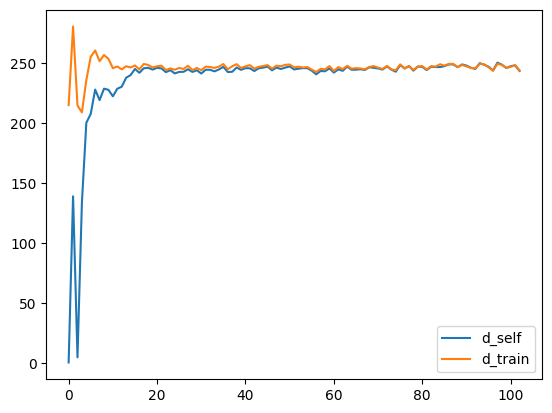

2023-12-30 15:15:52,364 - g4gan - INFO - Epoch: 104/200
INFO:g4gan:Epoch: 104/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:16:21,425 - g4gan - INFO - {'discriminator': [{'cost': -7.727214813232422,
                    'cost_validation': -7.5728960037231445,
                    'wasserstein_cost': 9.257020950317383,
                    'wasserstein_cost_validation': 9.25050163269043},
                   {'cost': -8.764230728149414,
                    'cost_validation': -9.159035682678223,
                    'wasserstein_cost': 10.300424575805664,
                    'wasserstein_cost_validation': 10.95261001586914},
                   {'cost': -7.732105731964111,
                    'cost_validation': -8.325071334838867,
                    'wasserstein_cost': 9.356796264648438,
                    'wass

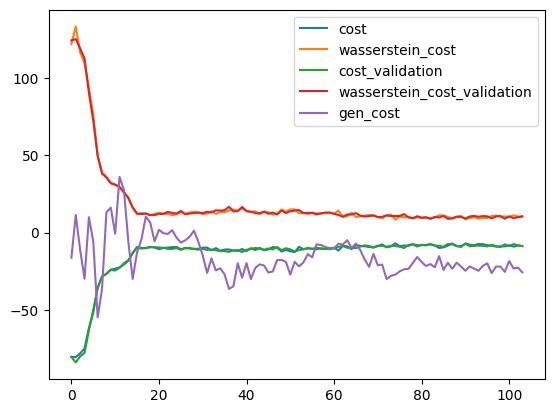

2023-12-30 15:16:21,987 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:16:24,273 - g4gan - INFO - D_self: 247.94
INFO:g4gan:D_self: 247.94
2023-12-30 15:16:24,278 - g4gan - INFO - D_train: 248.01
INFO:g4gan:D_train: 248.01


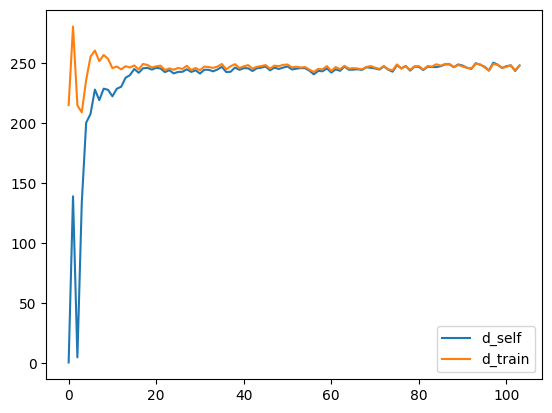

2023-12-30 15:16:24,576 - g4gan - INFO - Epoch: 105/200
INFO:g4gan:Epoch: 105/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:16:53,665 - g4gan - INFO - {'discriminator': [{'cost': -6.968653678894043,
                    'cost_validation': -8.246628761291504,
                    'wasserstein_cost': 8.452978134155273,
                    'wasserstein_cost_validation': 10.044221878051758},
                   {'cost': -7.454849720001221,
                    'cost_validation': -7.231500625610352,
                    'wasserstein_cost': 9.033103942871094,
                    'wasserstein_cost_validation': 8.73470687866211},
                   {'cost': -7.231966018676758,
                    'cost_validation': -7.712465763092041,
                    'wasserstein_cost': 8.622642517089844,
                    'wasse

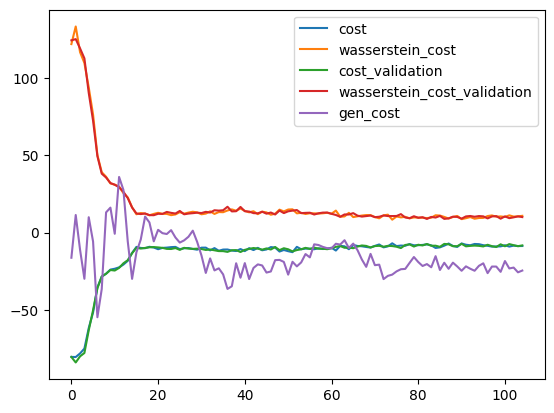

2023-12-30 15:16:53,970 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:16:56,267 - g4gan - INFO - D_self: 247.25
INFO:g4gan:D_self: 247.25
2023-12-30 15:16:56,271 - g4gan - INFO - D_train: 247.05
INFO:g4gan:D_train: 247.05


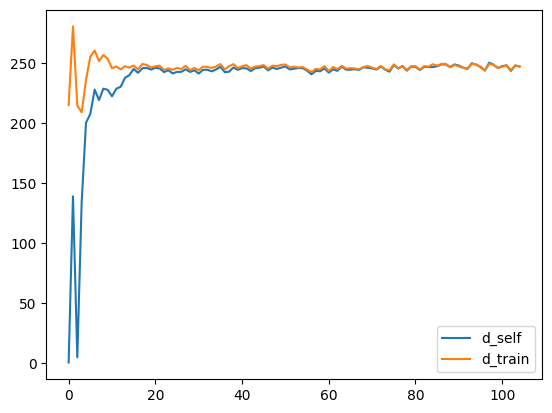

2023-12-30 15:16:56,589 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:16:56,597 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:16:56,679 - g4gan - INFO - Epoch: 106/200
INFO:g4gan:Epoch: 106/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   A   A   T   G   T   T   C   A   T  ...   A   A   C   T   G   C   T   
1    A   C   G   T   C   C   C   T   T   C  ...   C   A   C   T   G   G   C   
2    T   T   C   A   G   G   G   G   A   G  ...   A   A   G   G   A   C   T   
3    C   A   C   G   A   G   C   C   C   G  ...   T   C   G   G   A   G   T   
4    G   A   A   T   G   G   A   G   A   G  ...   G   A   C   T   C   C   T   
5    G   A   G   G   G   G   G   G   G   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   G   C   G   T   
7    T   G   C   C   C   G   T   G   T   C  ...   C   G   C   G   C   T   C   
8    C   A   C   G   G   G   C   G   C   T  ...   A   C   T   C   T   T   A   
9    G   G   C   T   G   A   A   G   G   A  ...   A   G   T   T   G   A   G   
10   G   T   G   C   T   C   G   C   C   A  ...   T   T   C   C   A   C   C   
11   G   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 15:17:26,008 - g4gan - INFO - {'discriminator': [{'cost': -5.809558391571045,
                    'cost_validation': -7.322474002838135,
                    'wasserstein_cost': 7.889581680297852,
                    'wasserstein_cost_validation': 8.731626510620117},
                   {'cost': -7.868214130401611,
                    'cost_validation': -6.519599914550781,
                    'wasserstein_cost': 9.450706481933594,
                    'wasserstein_cost_validation': 7.801111221313477},
                   {'cost': -8.26810073852539,
                    'cost_validation': -8.0693941116333,
                    'wasserstein_cost': 9.64040756225586,
                    'wasserstein_cost_validation': 9.538747787475586},
                   {'cost': -8.57152271270752,
                    'cost_validation': -7.79837703704834,
                    'wasserstein_cost': 9.940116882324219,
                    'wasserstein_cost_validation': 9.183685302734375},
                 

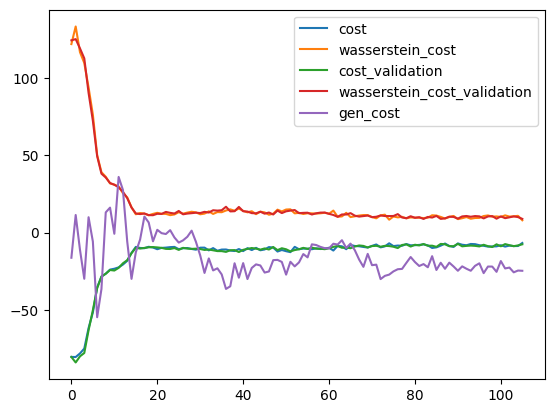

2023-12-30 15:17:26,313 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:17:29,848 - g4gan - INFO - D_self: 248.94
INFO:g4gan:D_self: 248.94
2023-12-30 15:17:29,853 - g4gan - INFO - D_train: 248.53
INFO:g4gan:D_train: 248.53


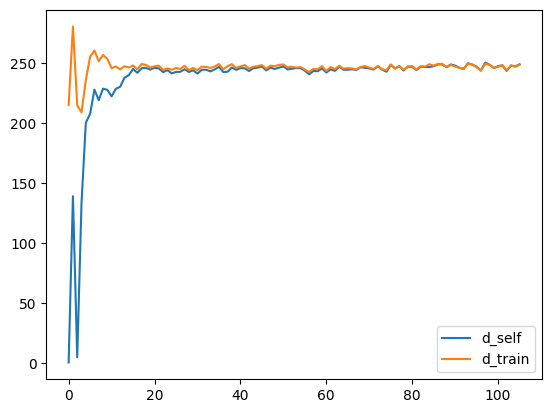

2023-12-30 15:17:30,163 - g4gan - INFO - Epoch: 107/200
INFO:g4gan:Epoch: 107/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:17:59,198 - g4gan - INFO - {'discriminator': [{'cost': -7.9891037940979,
                    'cost_validation': -7.201380729675293,
                    'wasserstein_cost': 9.231430053710938,
                    'wasserstein_cost_validation': 8.63032341003418},
                   {'cost': -7.875028610229492,
                    'cost_validation': -7.90610408782959,
                    'wasserstein_cost': 9.247657775878906,
                    'wasserstein_cost_validation': 9.849197387695312},
                   {'cost': -8.625658988952637,
                    'cost_validation': -7.565423011779785,
                    'wasserstein_cost': 10.061195373535156,
                    'wasserst

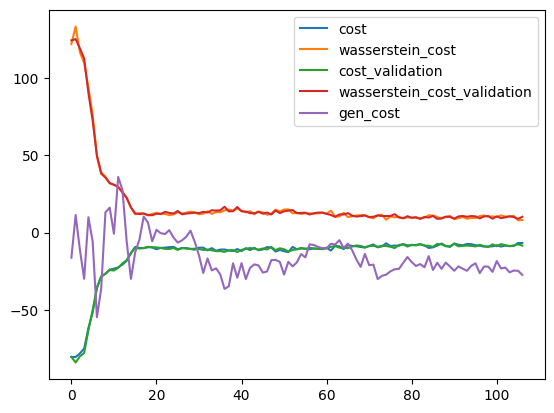

2023-12-30 15:17:59,506 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:18:03,422 - g4gan - INFO - D_self: 246.62
INFO:g4gan:D_self: 246.62
2023-12-30 15:18:03,427 - g4gan - INFO - D_train: 245.99
INFO:g4gan:D_train: 245.99


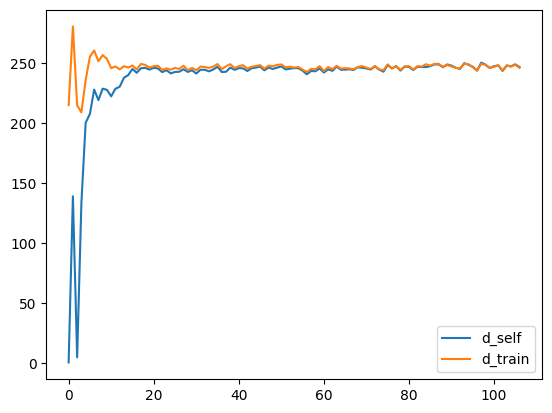

2023-12-30 15:18:03,727 - g4gan - INFO - Epoch: 108/200
INFO:g4gan:Epoch: 108/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:18:32,835 - g4gan - INFO - {'discriminator': [{'cost': -7.270862102508545,
                    'cost_validation': -7.420924186706543,
                    'wasserstein_cost': 8.674251556396484,
                    'wasserstein_cost_validation': 9.017547607421875},
                   {'cost': -6.9574480056762695,
                    'cost_validation': -5.917009353637695,
                    'wasserstein_cost': 8.72667121887207,
                    'wasserstein_cost_validation': 7.809455871582031},
                   {'cost': -7.77284574508667,
                    'cost_validation': -8.39447021484375,
                    'wasserstein_cost': 9.22592544555664,
                    'wasserst

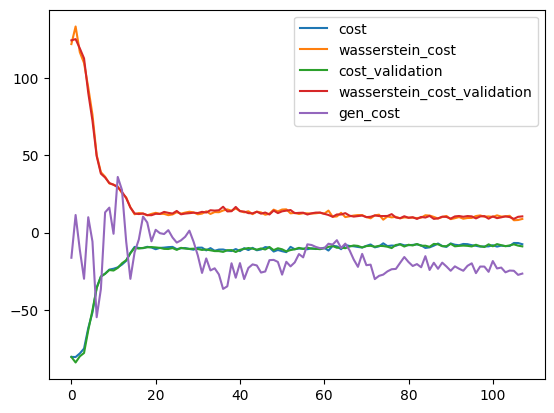

2023-12-30 15:18:33,126 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:18:35,693 - g4gan - INFO - D_self: 247.6
INFO:g4gan:D_self: 247.6
2023-12-30 15:18:35,700 - g4gan - INFO - D_train: 247.32
INFO:g4gan:D_train: 247.32


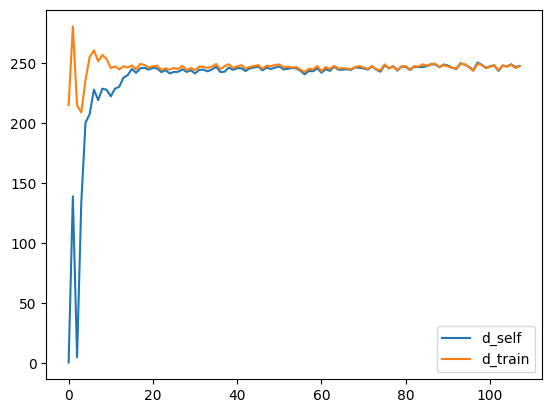

2023-12-30 15:18:36,032 - g4gan - INFO - Epoch: 109/200
INFO:g4gan:Epoch: 109/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:19:05,899 - g4gan - INFO - {'discriminator': [{'cost': -7.89875602722168,
                    'cost_validation': -8.215829849243164,
                    'wasserstein_cost': 9.559965133666992,
                    'wasserstein_cost_validation': 9.525447845458984},
                   {'cost': -7.072994232177734,
                    'cost_validation': -7.750095367431641,
                    'wasserstein_cost': 8.184843063354492,
                    'wasserstein_cost_validation': 9.276582717895508},
                   {'cost': -7.587558746337891,
                    'cost_validation': -8.227056503295898,
                    'wasserstein_cost': 8.851728439331055,
                    'wasser

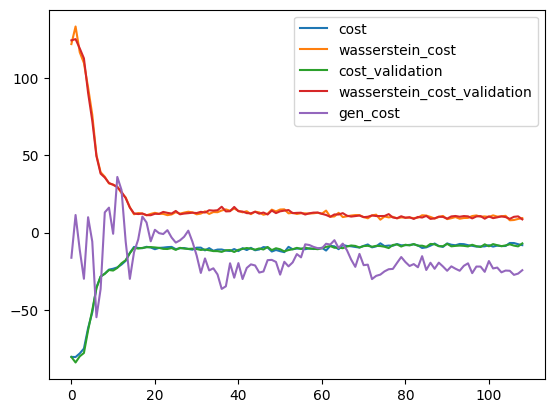

2023-12-30 15:19:06,169 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:19:08,495 - g4gan - INFO - D_self: 245.99
INFO:g4gan:D_self: 245.99
2023-12-30 15:19:08,499 - g4gan - INFO - D_train: 246.0
INFO:g4gan:D_train: 246.0


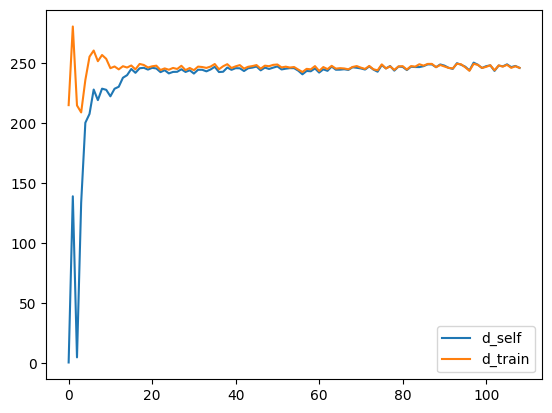

2023-12-30 15:19:08,761 - g4gan - INFO - Epoch: 110/200
INFO:g4gan:Epoch: 110/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:19:37,848 - g4gan - INFO - {'discriminator': [{'cost': -7.703912258148193,
                    'cost_validation': -7.516407012939453,
                    'wasserstein_cost': 9.27431869506836,
                    'wasserstein_cost_validation': 9.072546005249023},
                   {'cost': -8.223255157470703,
                    'cost_validation': -8.030961036682129,
                    'wasserstein_cost': 9.832160949707031,
                    'wasserstein_cost_validation': 9.793357849121094},
                   {'cost': -6.729362964630127,
                    'cost_validation': -6.491689205169678,
                    'wasserstein_cost': 8.467864990234375,
                    'wasser

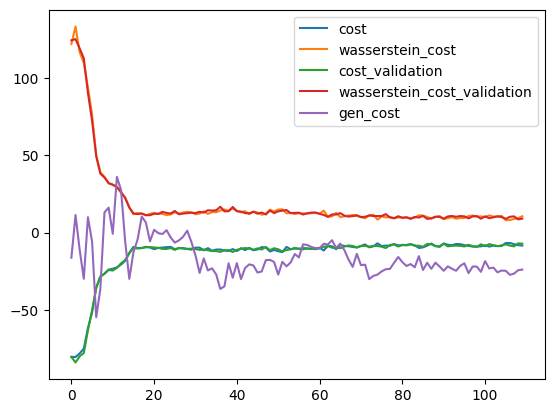

2023-12-30 15:19:38,164 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:19:40,452 - g4gan - INFO - D_self: 243.46
INFO:g4gan:D_self: 243.46
2023-12-30 15:19:40,456 - g4gan - INFO - D_train: 243.71
INFO:g4gan:D_train: 243.71


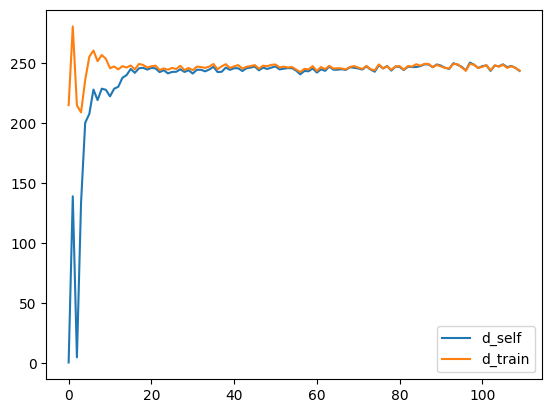

2023-12-30 15:19:40,737 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:19:40,743 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:19:40,837 - g4gan - INFO - Epoch: 111/200
INFO:g4gan:Epoch: 111/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   A   T   G   T   T   C   T   T  ...   T   A   C   T   G   C   G   
1    A   C   G   T   C   C   C   T   T   C  ...   C   A   C   G   G   G   C   
2    T   T   C   A   G   G   G   G   T   G  ...   A   A   G   G   T   C   T   
3    C   G   C   G   A   G   C   C   C   C  ...   T   C   C   G   A   G   T   
4    G   A   A   T   G   G   A   C   T   G  ...   G   A   C   T   C   C   T   
5    G   A   G   G   G   G   G   G   G   C  ...   C   T   G   C   C   C   A   
6    C   A   C   A   G   T   G   C   C   T  ...   G   C   C   G   C   G   G   
7    A   G   C   C   C   G   T   G   T   C  ...   C   G   C   G   C   T   C   
8    C   A   C   G   G   G   C   G   C   T  ...   T   C   T   C   T   T   A   
9    G   G   C   T   G   A   A   G   G   A  ...   A   G   T   T   G   A   G   
10   G   T   G   C   T   C   G   C   C   A  ...   T   T   C   C   A   C   C   
11   G   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 15:20:11,634 - g4gan - INFO - {'discriminator': [{'cost': -5.6294755935668945,
                    'cost_validation': -5.856112003326416,
                    'wasserstein_cost': 7.442047119140625,
                    'wasserstein_cost_validation': 7.563194274902344},
                   {'cost': -6.28312349319458,
                    'cost_validation': -6.738822937011719,
                    'wasserstein_cost': 7.916149139404297,
                    'wasserstein_cost_validation': 8.253673553466797},
                   {'cost': -6.420267581939697,
                    'cost_validation': -6.558147430419922,
                    'wasserstein_cost': 7.568574905395508,
                    'wasserstein_cost_validation': 7.661870956420898},
                   {'cost': -6.341305732727051,
                    'cost_validation': -7.2963056564331055,
                    'wasserstein_cost': 7.400455474853516,
                    'wasserstein_cost_validation': 8.476739883422852},
          

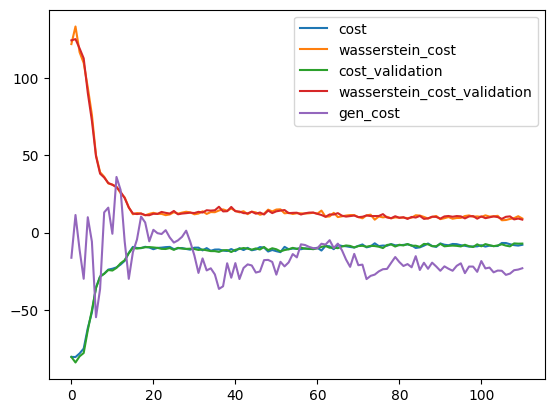

2023-12-30 15:20:11,986 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:20:15,762 - g4gan - INFO - D_self: 249.35
INFO:g4gan:D_self: 249.35
2023-12-30 15:20:15,769 - g4gan - INFO - D_train: 249.84
INFO:g4gan:D_train: 249.84


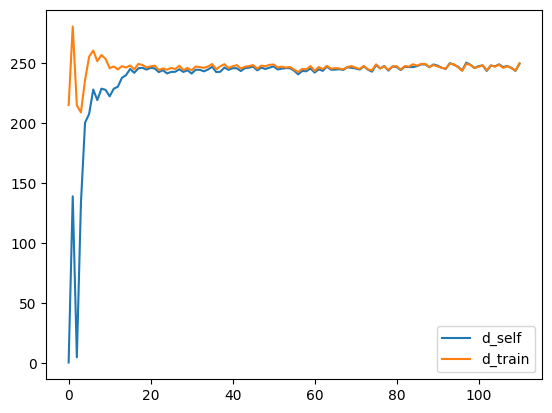

2023-12-30 15:20:16,093 - g4gan - INFO - Epoch: 112/200
INFO:g4gan:Epoch: 112/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:20:46,223 - g4gan - INFO - {'discriminator': [{'cost': -7.124048233032227,
                    'cost_validation': -7.776307582855225,
                    'wasserstein_cost': 8.348033905029297,
                    'wasserstein_cost_validation': 9.022647857666016},
                   {'cost': -8.729082107543945,
                    'cost_validation': -7.995027542114258,
                    'wasserstein_cost': 10.100440979003906,
                    'wasserstein_cost_validation': 9.251703262329102},
                   {'cost': -7.788719177246094,
                    'cost_validation': -8.238117218017578,
                    'wasserstein_cost': 8.935924530029297,
                    'wass

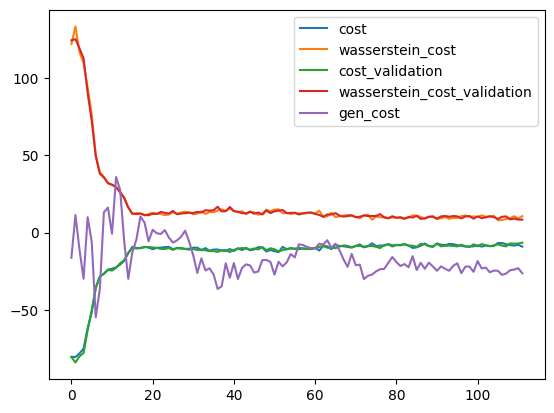

2023-12-30 15:20:46,622 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:20:50,635 - g4gan - INFO - D_self: 243.85
INFO:g4gan:D_self: 243.85
2023-12-30 15:20:50,645 - g4gan - INFO - D_train: 243.72
INFO:g4gan:D_train: 243.72


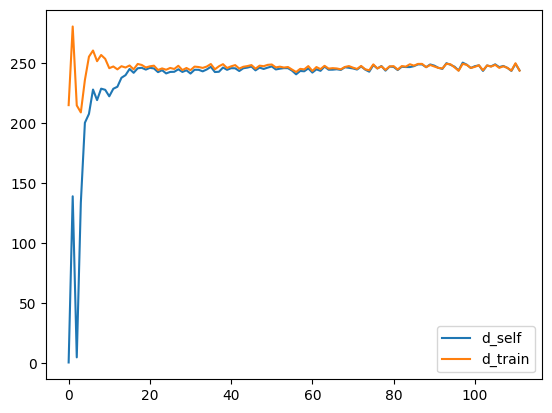

2023-12-30 15:20:51,013 - g4gan - INFO - Epoch: 113/200
INFO:g4gan:Epoch: 113/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:21:20,874 - g4gan - INFO - {'discriminator': [{'cost': -4.924066543579102,
                    'cost_validation': -7.1513776779174805,
                    'wasserstein_cost': 6.052072525024414,
                    'wasserstein_cost_validation': 8.246994018554688},
                   {'cost': -7.7876129150390625,
                    'cost_validation': -8.180394172668457,
                    'wasserstein_cost': 9.020305633544922,
                    'wasserstein_cost_validation': 9.381195068359375},
                   {'cost': -7.511052131652832,
                    'cost_validation': -9.259523391723633,
                    'wasserstein_cost': 8.800670623779297,
                    'was

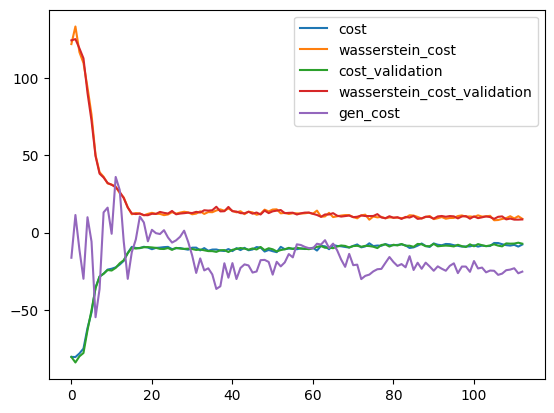

2023-12-30 15:21:21,260 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:21:24,585 - g4gan - INFO - D_self: 240.7
INFO:g4gan:D_self: 240.7
2023-12-30 15:21:24,595 - g4gan - INFO - D_train: 242.08
INFO:g4gan:D_train: 242.08


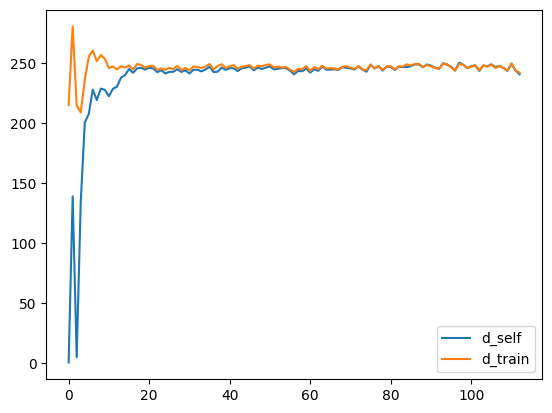

2023-12-30 15:21:24,940 - g4gan - INFO - Epoch: 114/200
INFO:g4gan:Epoch: 114/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:21:54,518 - g4gan - INFO - {'discriminator': [{'cost': -8.539966583251953,
                    'cost_validation': -7.248473644256592,
                    'wasserstein_cost': 9.813779830932617,
                    'wasserstein_cost_validation': 9.055326461791992},
                   {'cost': -7.902120590209961,
                    'cost_validation': -7.740914344787598,
                    'wasserstein_cost': 9.835792541503906,
                    'wasserstein_cost_validation': 9.513805389404297},
                   {'cost': -7.432949066162109,
                    'cost_validation': -8.559715270996094,
                    'wasserstein_cost': 9.243152618408203,
                    'wasse

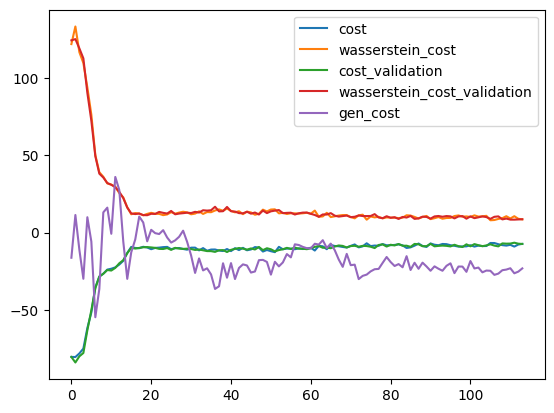

2023-12-30 15:21:54,803 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:21:57,304 - g4gan - INFO - D_self: 249.07
INFO:g4gan:D_self: 249.07
2023-12-30 15:21:57,308 - g4gan - INFO - D_train: 248.33
INFO:g4gan:D_train: 248.33


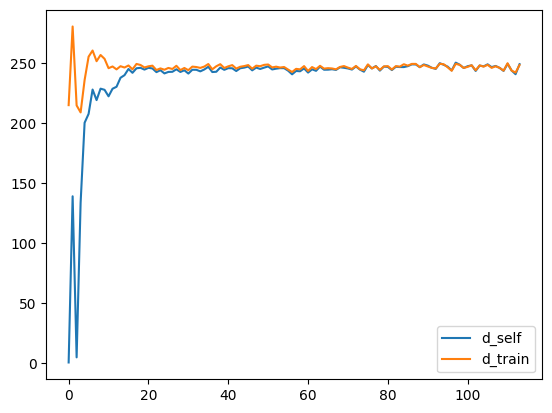

2023-12-30 15:21:57,631 - g4gan - INFO - Epoch: 115/200
INFO:g4gan:Epoch: 115/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:22:27,765 - g4gan - INFO - {'discriminator': [{'cost': -7.458497524261475,
                    'cost_validation': -6.059841156005859,
                    'wasserstein_cost': 9.13974380493164,
                    'wasserstein_cost_validation': 7.878776550292969},
                   {'cost': -6.341377258300781,
                    'cost_validation': -7.319577217102051,
                    'wasserstein_cost': 8.136272430419922,
                    'wasserstein_cost_validation': 9.211467742919922},
                   {'cost': -7.825252532958984,
                    'cost_validation': -5.476694107055664,
                    'wasserstein_cost': 9.706403732299805,
                    'wasser

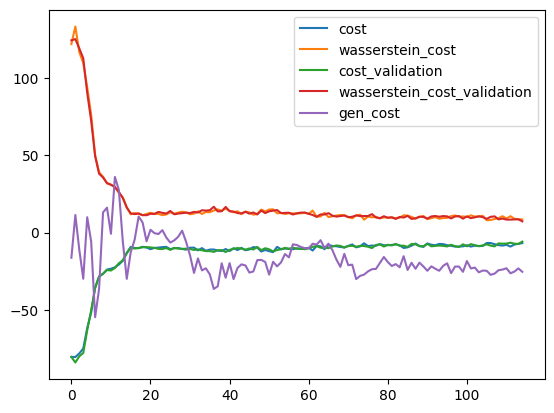

2023-12-30 15:22:28,052 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:22:30,574 - g4gan - INFO - D_self: 249.82
INFO:g4gan:D_self: 249.82
2023-12-30 15:22:30,583 - g4gan - INFO - D_train: 248.83
INFO:g4gan:D_train: 248.83


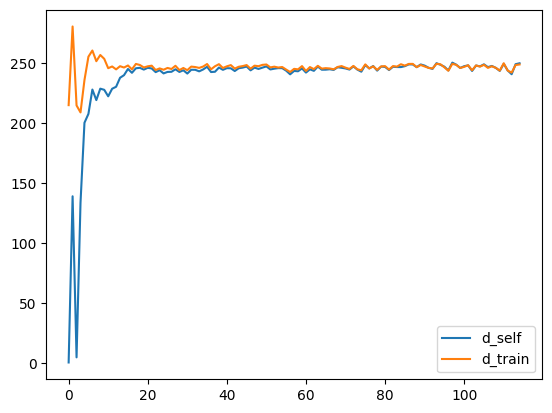

2023-12-30 15:22:30,911 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:22:30,920 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:22:31,004 - g4gan - INFO - Epoch: 116/200
INFO:g4gan:Epoch: 116/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   A   T   G   T   T   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   G   A   G   C   G   T   T   G  ...   C   A   C   T   G   T   C   
2    G   T   C   A   G   G   G   G   T   G  ...   A   A   G   G   A   C   T   
3    C   G   C   G   A   G   C   C   C   G  ...   T   C   G   G   A   G   A   
4    G   A   A   T   G   G   A   G   A   G  ...   G   A   C   T   C   C   T   
5    G   A   G   G   G   T   G   T   G   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   C   C   C   G   A   G   A   C  ...   G   G   G   G   C   T   C   
8    C   A   C   G   G   G   C   G   C   T  ...   A   C   T   C   T   T   A   
9    G   G   C   T   G   A   A   G   G   A  ...   A   G   T   T   G   A   G   
10   G   T   G   C   T   C   G   G   G   A  ...   T   T   C   C   A   C   C   
11   G   T   C   G   T   T   G   G   C   A  ...   A 

2023-12-30 15:23:00,899 - g4gan - INFO - {'discriminator': [{'cost': -7.087162017822266,
                    'cost_validation': -7.624311923980713,
                    'wasserstein_cost': 8.165008544921875,
                    'wasserstein_cost_validation': 8.82248306274414},
                   {'cost': -6.887598037719727,
                    'cost_validation': -6.977507591247559,
                    'wasserstein_cost': 8.154150009155273,
                    'wasserstein_cost_validation': 8.093643188476562},
                   {'cost': -7.696678638458252,
                    'cost_validation': -7.584349155426025,
                    'wasserstein_cost': 9.383150100708008,
                    'wasserstein_cost_validation': 9.16946029663086},
                   {'cost': -8.067602157592773,
                    'cost_validation': -8.200407981872559,
                    'wasserstein_cost': 9.233663558959961,
                    'wasserstein_cost_validation': 9.837024688720703},
             

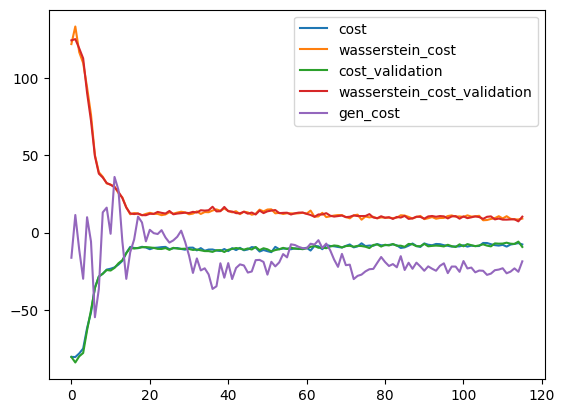

2023-12-30 15:23:01,240 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:23:03,982 - g4gan - INFO - D_self: 248.98
INFO:g4gan:D_self: 248.98
2023-12-30 15:23:03,986 - g4gan - INFO - D_train: 248.28
INFO:g4gan:D_train: 248.28


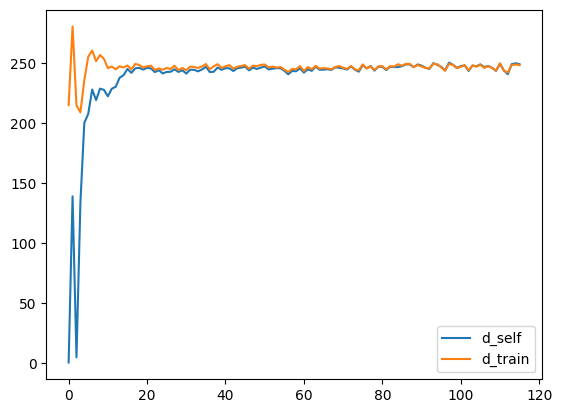

2023-12-30 15:23:04,329 - g4gan - INFO - Epoch: 117/200
INFO:g4gan:Epoch: 117/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:23:34,434 - g4gan - INFO - {'discriminator': [{'cost': -6.434178352355957,
                    'cost_validation': -7.229665279388428,
                    'wasserstein_cost': 7.952199935913086,
                    'wasserstein_cost_validation': 8.787111282348633},
                   {'cost': -7.6872382164001465,
                    'cost_validation': -7.5973358154296875,
                    'wasserstein_cost': 9.566558837890625,
                    'wasserstein_cost_validation': 9.081193923950195},
                   {'cost': -5.8904924392700195,
                    'cost_validation': -6.5545759201049805,
                    'wasserstein_cost': 6.99268913269043,
                    'wa

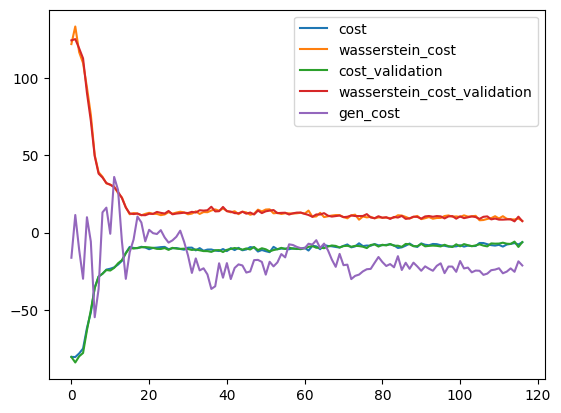

2023-12-30 15:23:34,842 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:23:38,972 - g4gan - INFO - D_self: 251.57
INFO:g4gan:D_self: 251.57
2023-12-30 15:23:38,981 - g4gan - INFO - D_train: 250.83
INFO:g4gan:D_train: 250.83


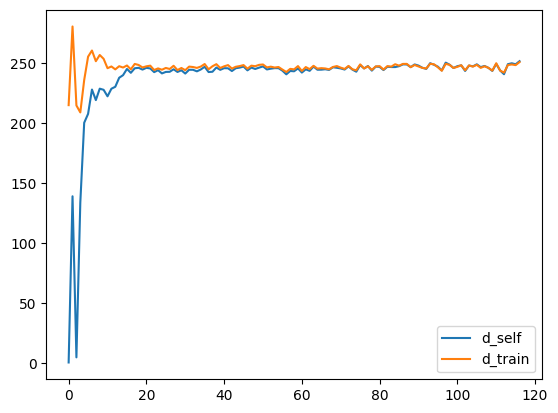

2023-12-30 15:23:39,345 - g4gan - INFO - Epoch: 118/200
INFO:g4gan:Epoch: 118/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:24:08,951 - g4gan - INFO - {'discriminator': [{'cost': -7.23518180847168,
                    'cost_validation': -8.055407524108887,
                    'wasserstein_cost': 8.370634078979492,
                    'wasserstein_cost_validation': 9.190473556518555},
                   {'cost': -7.187250137329102,
                    'cost_validation': -7.256904125213623,
                    'wasserstein_cost': 7.995038986206055,
                    'wasserstein_cost_validation': 8.29248046875},
                   {'cost': -6.760327339172363,
                    'cost_validation': -7.908054828643799,
                    'wasserstein_cost': 7.949672698974609,
                    'wasserstei

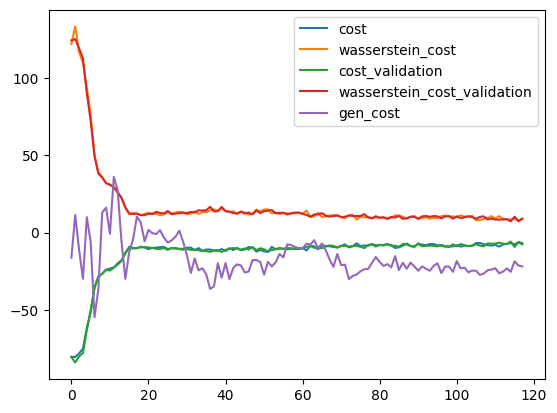

2023-12-30 15:24:09,297 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:24:12,893 - g4gan - INFO - D_self: 246.42
INFO:g4gan:D_self: 246.42
2023-12-30 15:24:12,897 - g4gan - INFO - D_train: 246.47
INFO:g4gan:D_train: 246.47


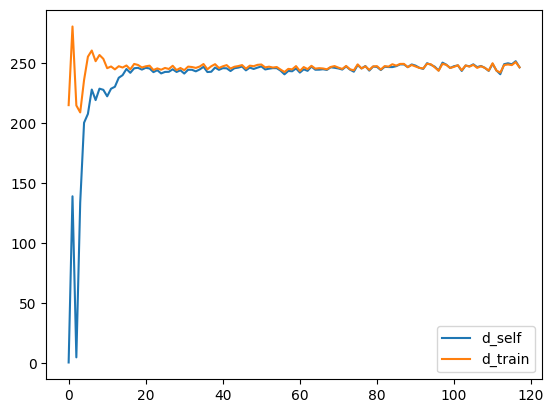

2023-12-30 15:24:13,194 - g4gan - INFO - Epoch: 119/200
INFO:g4gan:Epoch: 119/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:24:43,117 - g4gan - INFO - {'discriminator': [{'cost': -4.207014083862305,
                    'cost_validation': -6.312253952026367,
                    'wasserstein_cost': 5.96031379699707,
                    'wasserstein_cost_validation': 8.447158813476562},
                   {'cost': -4.98899507522583,
                    'cost_validation': -7.973996162414551,
                    'wasserstein_cost': 6.14959716796875,
                    'wasserstein_cost_validation': 9.194774627685547},
                   {'cost': -7.235149383544922,
                    'cost_validation': -7.234812259674072,
                    'wasserstein_cost': 8.338134765625,
                    'wasserstein

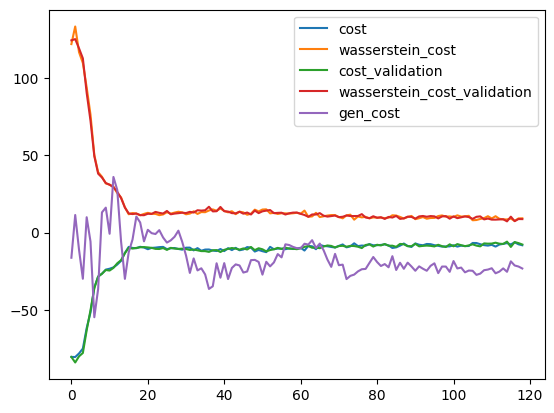

2023-12-30 15:24:43,462 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:24:45,820 - g4gan - INFO - D_self: 240.63
INFO:g4gan:D_self: 240.63
2023-12-30 15:24:45,827 - g4gan - INFO - D_train: 241.48
INFO:g4gan:D_train: 241.48


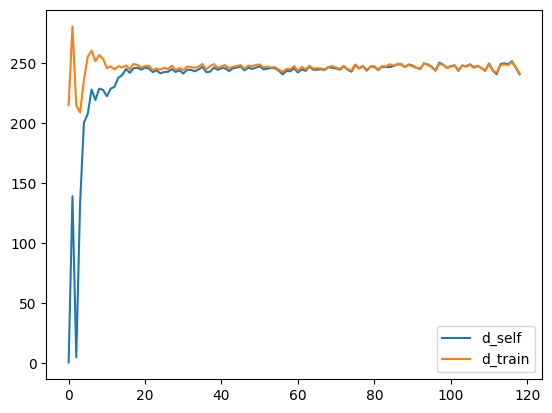

2023-12-30 15:24:46,141 - g4gan - INFO - Epoch: 120/200
INFO:g4gan:Epoch: 120/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:25:16,036 - g4gan - INFO - {'discriminator': [{'cost': -5.4773149490356445,
                    'cost_validation': -5.790835380554199,
                    'wasserstein_cost': 7.070924758911133,
                    'wasserstein_cost_validation': 7.340061187744141},
                   {'cost': -5.490969657897949,
                    'cost_validation': -5.808156490325928,
                    'wasserstein_cost': 7.003028869628906,
                    'wasserstein_cost_validation': 6.985103607177734},
                   {'cost': -6.3563385009765625,
                    'cost_validation': -5.727054595947266,
                    'wasserstein_cost': 7.916149139404297,
                    'was

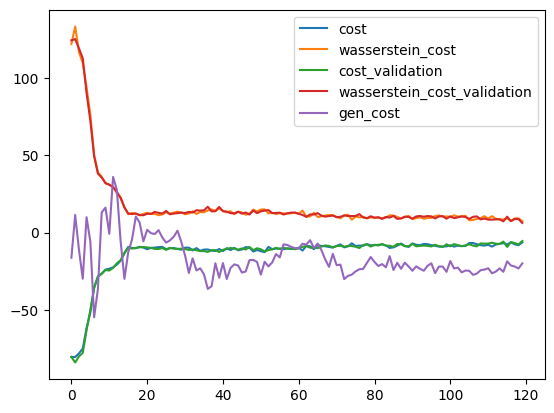

2023-12-30 15:25:16,378 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:25:18,760 - g4gan - INFO - D_self: 240.26
INFO:g4gan:D_self: 240.26
2023-12-30 15:25:18,765 - g4gan - INFO - D_train: 240.75
INFO:g4gan:D_train: 240.75


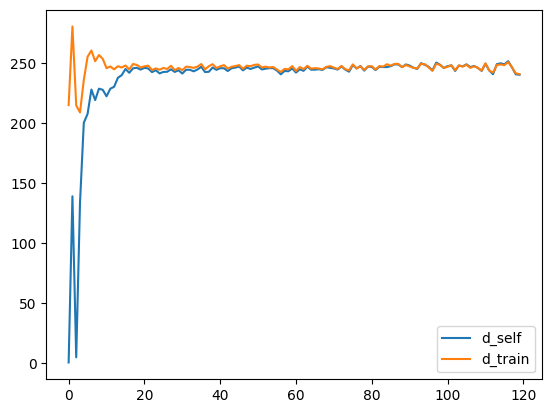

2023-12-30 15:25:19,068 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:25:19,078 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:25:19,173 - g4gan - INFO - Epoch: 121/200
INFO:g4gan:Epoch: 121/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   T   T   C   T   G   C   T   T  ...   A   A   G   G   G   C   G   
1    A   C   G   T   G   C   C   G   T   C  ...   C   A   C   G   C   G   C   
2    T   T   C   A   G   C   G   C   G   G  ...   A   A   G   G   T   C   T   
3    C   G   C   C   T   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   T   G   G   A   C   T   G  ...   G   A   C   T   C   C   T   
5    G   T   G   G   G   G   G   G   G   C  ...   C   T   C   C   C   C   A   
6    C   A   C   A   G   T   G   C   C   T  ...   G   C   C   G   C   G   G   
7    A   G   C   C   C   G   T   G   T   C  ...   C   G   G   G   C   T   C   
8    C   A   C   G   C   G   C   G   C   G  ...   T   C   T   C   T   T   A   
9    G   G   C   T   C   A   T   G   G   A  ...   A   G   T   T   G   T   G   
10   G   T   G   C   T   C   G   C   C   A  ...   T   T   C   C   A   C   C   
11   G   T   C   C   T   T   G   C   C   A  ...   A 

2023-12-30 15:25:49,638 - g4gan - INFO - {'discriminator': [{'cost': -5.782498359680176,
                    'cost_validation': -6.246896266937256,
                    'wasserstein_cost': 6.813880920410156,
                    'wasserstein_cost_validation': 7.58331298828125},
                   {'cost': -6.110745429992676,
                    'cost_validation': -6.304868698120117,
                    'wasserstein_cost': 7.22868537902832,
                    'wasserstein_cost_validation': 7.489288330078125},
                   {'cost': -6.248892784118652,
                    'cost_validation': -7.911704063415527,
                    'wasserstein_cost': 7.080930709838867,
                    'wasserstein_cost_validation': 8.860651016235352},
                   {'cost': -8.007682800292969,
                    'cost_validation': -6.494239807128906,
                    'wasserstein_cost': 8.835098266601562,
                    'wasserstein_cost_validation': 7.36236572265625},
              

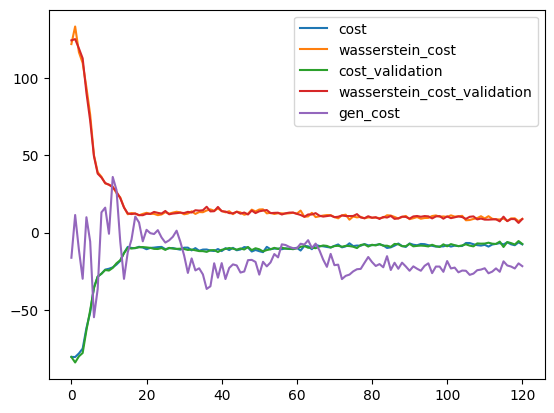

2023-12-30 15:25:49,935 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:25:52,343 - g4gan - INFO - D_self: 249.08
INFO:g4gan:D_self: 249.08
2023-12-30 15:25:52,347 - g4gan - INFO - D_train: 249.3
INFO:g4gan:D_train: 249.3


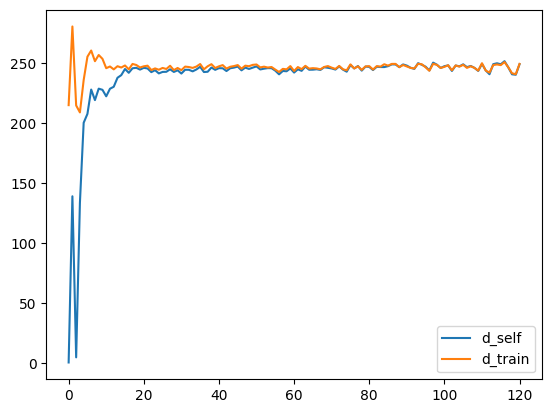

2023-12-30 15:25:52,601 - g4gan - INFO - Epoch: 122/200
INFO:g4gan:Epoch: 122/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:26:22,350 - g4gan - INFO - {'discriminator': [{'cost': -7.977020740509033,
                    'cost_validation': -7.2843546867370605,
                    'wasserstein_cost': 9.835411071777344,
                    'wasserstein_cost_validation': 9.242040634155273},
                   {'cost': -6.763611316680908,
                    'cost_validation': -5.772282600402832,
                    'wasserstein_cost': 8.93594741821289,
                    'wasserstein_cost_validation': 7.411031723022461},
                   {'cost': -7.126317501068115,
                    'cost_validation': -7.508152961730957,
                    'wasserstein_cost': 9.525733947753906,
                    'wasse

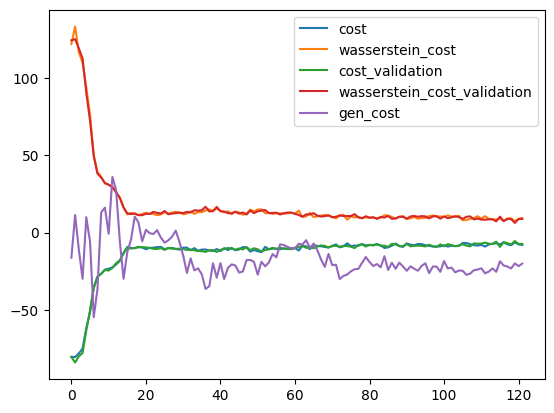

2023-12-30 15:26:22,686 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:26:26,229 - g4gan - INFO - D_self: 247.25
INFO:g4gan:D_self: 247.25
2023-12-30 15:26:26,233 - g4gan - INFO - D_train: 246.76
INFO:g4gan:D_train: 246.76


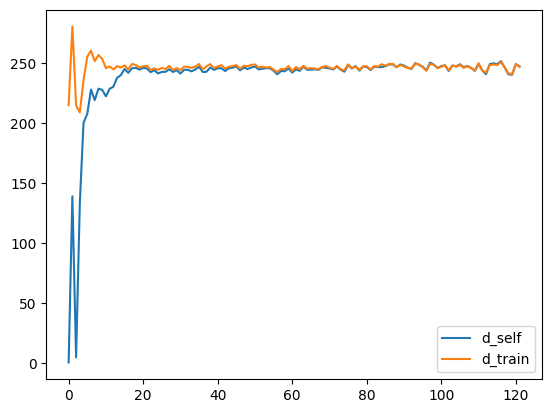

2023-12-30 15:26:26,568 - g4gan - INFO - Epoch: 123/200
INFO:g4gan:Epoch: 123/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:26:56,328 - g4gan - INFO - {'discriminator': [{'cost': -5.265993118286133,
                    'cost_validation': -6.7331342697143555,
                    'wasserstein_cost': 6.317377090454102,
                    'wasserstein_cost_validation': 8.08570671081543},
                   {'cost': -6.239462375640869,
                    'cost_validation': -5.53354549407959,
                    'wasserstein_cost': 7.459228515625,
                    'wasserstein_cost_validation': 6.4453277587890625},
                   {'cost': -7.5256500244140625,
                    'cost_validation': -5.906681060791016,
                    'wasserstein_cost': 8.920698165893555,
                    'wassers

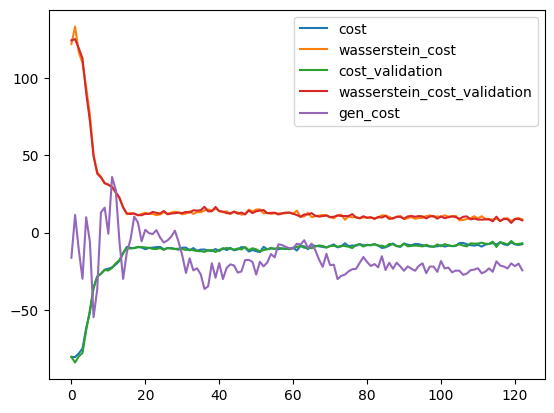

2023-12-30 15:26:56,680 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:27:00,839 - g4gan - INFO - D_self: 242.79
INFO:g4gan:D_self: 242.79
2023-12-30 15:27:00,844 - g4gan - INFO - D_train: 243.63
INFO:g4gan:D_train: 243.63


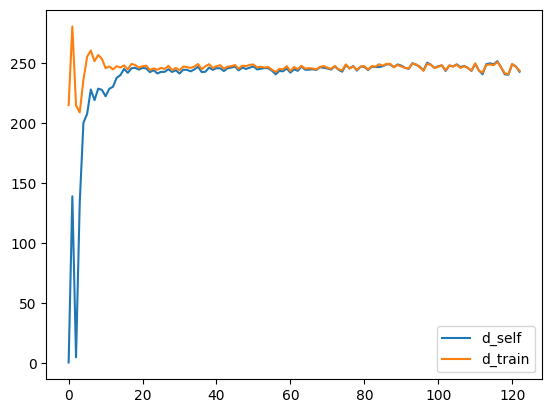

2023-12-30 15:27:01,200 - g4gan - INFO - Epoch: 124/200
INFO:g4gan:Epoch: 124/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:27:31,741 - g4gan - INFO - {'discriminator': [{'cost': -4.642149448394775,
                    'cost_validation': -5.054880619049072,
                    'wasserstein_cost': 6.655147552490234,
                    'wasserstein_cost_validation': 6.411426544189453},
                   {'cost': -5.44605827331543,
                    'cost_validation': -4.7608232498168945,
                    'wasserstein_cost': 6.803699493408203,
                    'wasserstein_cost_validation': 5.969259262084961},
                   {'cost': -5.38908052444458,
                    'cost_validation': -5.542781829833984,
                    'wasserstein_cost': 6.363201141357422,
                    'wasser

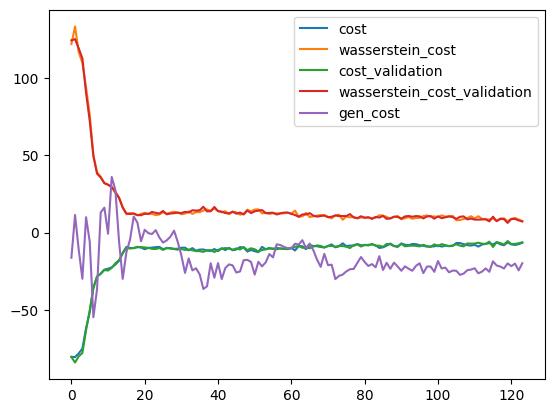

2023-12-30 15:27:32,160 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:27:34,971 - g4gan - INFO - D_self: 241.07
INFO:g4gan:D_self: 241.07
2023-12-30 15:27:34,975 - g4gan - INFO - D_train: 241.64
INFO:g4gan:D_train: 241.64


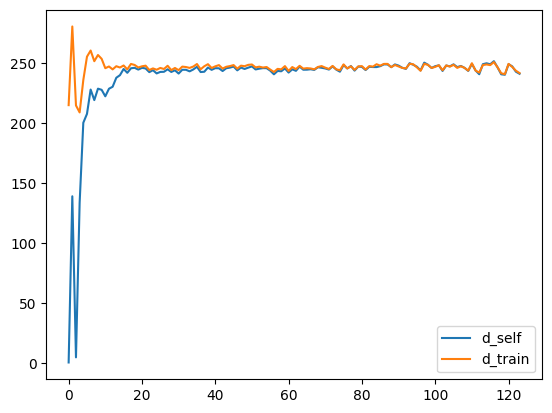

2023-12-30 15:27:35,690 - g4gan - INFO - Epoch: 125/200
INFO:g4gan:Epoch: 125/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:28:05,734 - g4gan - INFO - {'discriminator': [{'cost': -5.480280876159668,
                    'cost_validation': -5.963695526123047,
                    'wasserstein_cost': 7.170764923095703,
                    'wasserstein_cost_validation': 7.487676620483398},
                   {'cost': -7.145966529846191,
                    'cost_validation': -7.8388566970825195,
                    'wasserstein_cost': 8.83094596862793,
                    'wasserstein_cost_validation': 9.408941268920898},
                   {'cost': -7.1530303955078125,
                    'cost_validation': -6.723807334899902,
                    'wasserstein_cost': 8.799043655395508,
                    'wass

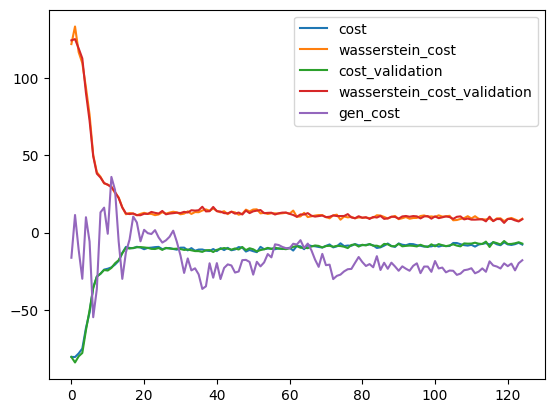

2023-12-30 15:28:06,056 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:28:08,407 - g4gan - INFO - D_self: 249.0
INFO:g4gan:D_self: 249.0
2023-12-30 15:28:08,413 - g4gan - INFO - D_train: 247.41
INFO:g4gan:D_train: 247.41


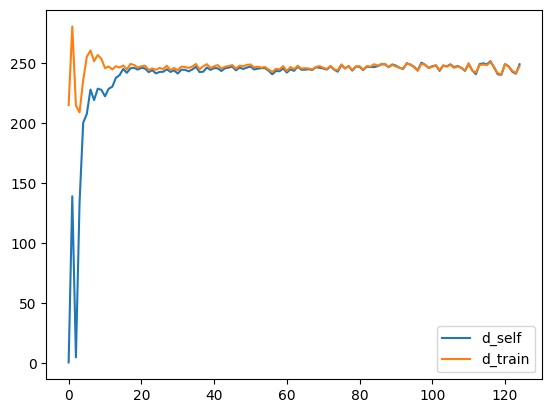

2023-12-30 15:28:08,725 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:28:08,735 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:28:08,822 - g4gan - INFO - Epoch: 126/200
INFO:g4gan:Epoch: 126/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   T   T   G   T   G   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   G   T   G   C   C   G   T   G  ...   C   A   C   G   C   T   C   
2    T   T   C   A   G   G   G   G   T   G  ...   A   A   G   G   A   C   T   
3    C   G   C   G   A   G   C   C   C   G  ...   A   C   G   G   A   G   T   
4    G   A   A   T   G   G   A   G   A   G  ...   G   A   C   T   C   C   T   
5    T   A   G   T   G   T   G   T   G   C  ...   C   T   C   C   C   C   A   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   C   C   C   G   T   G   T   C  ...   G   G   G   G   C   T   C   
8    C   A   C   G   C   G   C   G   C   T  ...   T   C   T   C   T   T   A   
9    G   G   C   T   G   A   A   G   G   A  ...   A   G   A   T   T   A   G   
10   G   T   G   C   T   C   G   G   G   A  ...   T   T   C   C   A   C   C   
11   G   T   C   C   T   T   G   G   C   A  ...   A 

2023-12-30 15:28:38,025 - g4gan - INFO - {'discriminator': [{'cost': -5.842101097106934,
                    'cost_validation': -6.192866325378418,
                    'wasserstein_cost': 7.027557373046875,
                    'wasserstein_cost_validation': 7.249025344848633},
                   {'cost': -6.483781814575195,
                    'cost_validation': -7.334168910980225,
                    'wasserstein_cost': 7.695440292358398,
                    'wasserstein_cost_validation': 8.272165298461914},
                   {'cost': -6.1568474769592285,
                    'cost_validation': -7.577513694763184,
                    'wasserstein_cost': 7.1910400390625,
                    'wasserstein_cost_validation': 8.87063217163086},
                   {'cost': -5.486504077911377,
                    'cost_validation': -6.273525238037109,
                    'wasserstein_cost': 6.304712295532227,
                    'wasserstein_cost_validation': 7.2524871826171875},
            

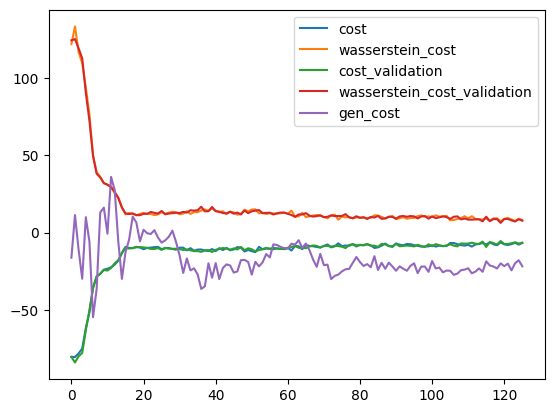

2023-12-30 15:28:38,327 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:28:40,710 - g4gan - INFO - D_self: 249.49
INFO:g4gan:D_self: 249.49
2023-12-30 15:28:40,717 - g4gan - INFO - D_train: 248.51
INFO:g4gan:D_train: 248.51


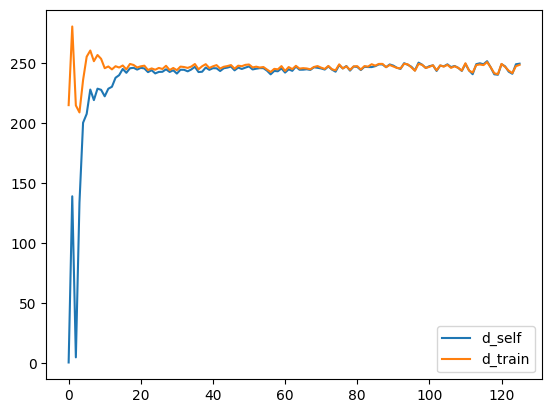

2023-12-30 15:28:40,973 - g4gan - INFO - Epoch: 127/200
INFO:g4gan:Epoch: 127/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:29:10,255 - g4gan - INFO - {'discriminator': [{'cost': -3.090606689453125,
                    'cost_validation': -6.897976398468018,
                    'wasserstein_cost': 4.028772354125977,
                    'wasserstein_cost_validation': 8.00377082824707},
                   {'cost': -5.931920051574707,
                    'cost_validation': -6.850401401519775,
                    'wasserstein_cost': 6.865762710571289,
                    'wasserstein_cost_validation': 8.371414184570312},
                   {'cost': -6.557208061218262,
                    'cost_validation': -5.38158655166626,
                    'wasserstein_cost': 7.874168395996094,
                    'wassers

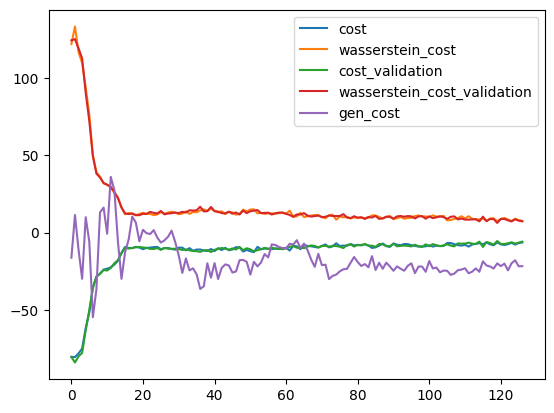

2023-12-30 15:29:10,578 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:29:14,178 - g4gan - INFO - D_self: 253.72
INFO:g4gan:D_self: 253.72
2023-12-30 15:29:14,182 - g4gan - INFO - D_train: 252.98
INFO:g4gan:D_train: 252.98


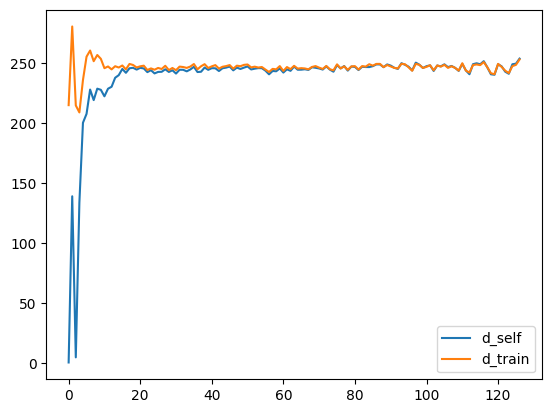

2023-12-30 15:29:14,571 - g4gan - INFO - Epoch: 128/200
INFO:g4gan:Epoch: 128/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:29:43,625 - g4gan - INFO - {'discriminator': [{'cost': -5.858464241027832,
                    'cost_validation': -6.348677635192871,
                    'wasserstein_cost': 7.394016265869141,
                    'wasserstein_cost_validation': 7.479768753051758},
                   {'cost': -5.775944709777832,
                    'cost_validation': -6.051918983459473,
                    'wasserstein_cost': 7.000616073608398,
                    'wasserstein_cost_validation': 7.051967620849609},
                   {'cost': -6.988518238067627,
                    'cost_validation': -5.995333194732666,
                    'wasserstein_cost': 8.086311340332031,
                    'wasse

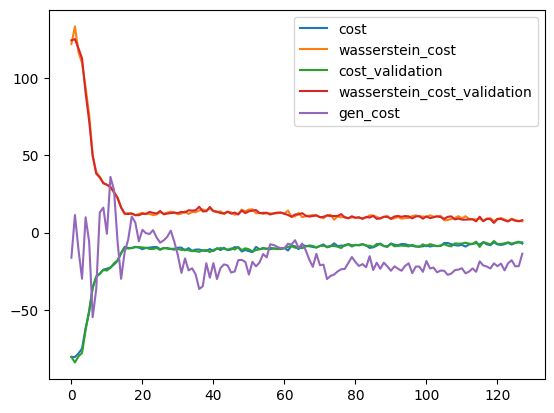

2023-12-30 15:29:44,037 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:29:48,015 - g4gan - INFO - D_self: 248.99
INFO:g4gan:D_self: 248.99
2023-12-30 15:29:48,023 - g4gan - INFO - D_train: 249.26
INFO:g4gan:D_train: 249.26


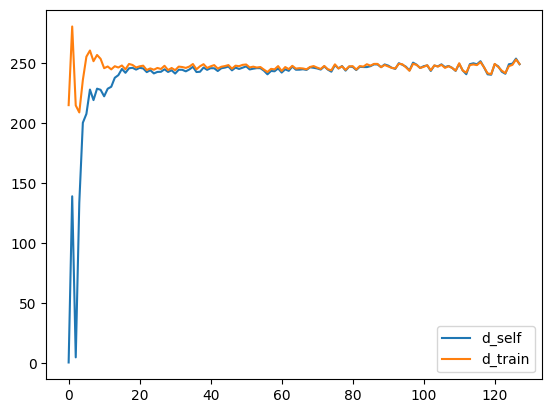

2023-12-30 15:29:48,346 - g4gan - INFO - Epoch: 129/200
INFO:g4gan:Epoch: 129/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:30:17,531 - g4gan - INFO - {'discriminator': [{'cost': -4.524789333343506,
                    'cost_validation': -7.104780197143555,
                    'wasserstein_cost': 5.391456604003906,
                    'wasserstein_cost_validation': 8.128561019897461},
                   {'cost': -6.0873494148254395,
                    'cost_validation': -7.347598075866699,
                    'wasserstein_cost': 6.960502624511719,
                    'wasserstein_cost_validation': 8.851242065429688},
                   {'cost': -5.872344970703125,
                    'cost_validation': -6.453832626342773,
                    'wasserstein_cost': 6.987071990966797,
                    'wass

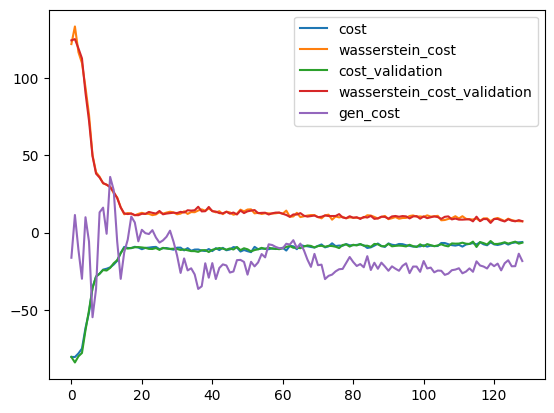

2023-12-30 15:30:17,874 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:30:20,197 - g4gan - INFO - D_self: 249.35
INFO:g4gan:D_self: 249.35
2023-12-30 15:30:20,205 - g4gan - INFO - D_train: 247.82
INFO:g4gan:D_train: 247.82


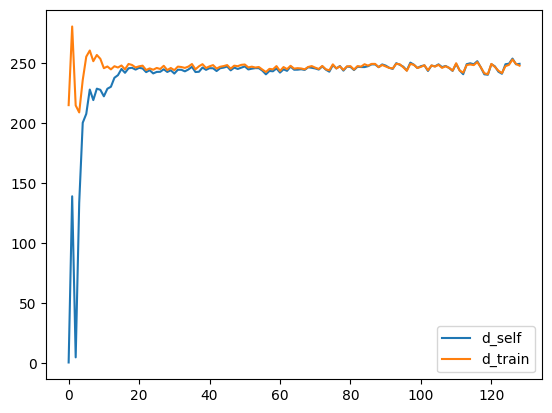

2023-12-30 15:30:20,517 - g4gan - INFO - Epoch: 130/200
INFO:g4gan:Epoch: 130/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:30:49,686 - g4gan - INFO - {'discriminator': [{'cost': -4.516165733337402,
                    'cost_validation': -6.072122573852539,
                    'wasserstein_cost': 5.617361068725586,
                    'wasserstein_cost_validation': 7.213558197021484},
                   {'cost': -4.96534538269043,
                    'cost_validation': -5.466261386871338,
                    'wasserstein_cost': 5.957342147827148,
                    'wasserstein_cost_validation': 6.304451942443848},
                   {'cost': -5.722397327423096,
                    'cost_validation': -5.781684398651123,
                    'wasserstein_cost': 6.602151870727539,
                    'wasser

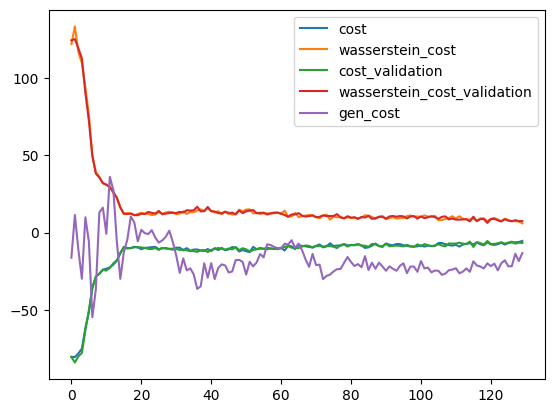

2023-12-30 15:30:49,957 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:30:52,359 - g4gan - INFO - D_self: 241.3
INFO:g4gan:D_self: 241.3
2023-12-30 15:30:52,364 - g4gan - INFO - D_train: 241.81
INFO:g4gan:D_train: 241.81


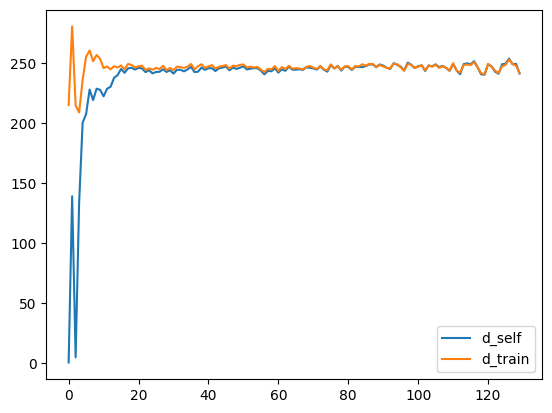

2023-12-30 15:30:52,671 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:30:52,679 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:30:52,764 - g4gan - INFO - Epoch: 131/200
INFO:g4gan:Epoch: 131/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   T   T   C   T   G   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   G   T   G   C   C   G   T   G  ...   C   A   C   G   C   T   C   
2    T   T   C   A   G   G   G   G   G   G  ...   A   A   G   G   T   C   T   
3    C   G   C   C   T   G   C   C   C   C  ...   A   C   C   C   A   G   T   
4    G   A   A   T   G   G   A   C   A   G  ...   G   A   C   T   C   C   T   
5    A   A   G   T   G   T   G   T   G   C  ...   C   T   C   C   C   C   A   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   C   C   C   G   T   G   T   C  ...   G   G   G   G   C   T   C   
8    C   T   C   G   C   G   C   G   C   T  ...   T   C   T   C   T   T   A   
9    G   G   C   T   C   A   A   G   G   A  ...   A   G   A   T   T   A   G   
10   G   T   G   C   T   C   G   C   G   A  ...   T   T   C   C   A   C   C   
11   G   T   C   C   T   T   G   G   C   A  ...   A 

2023-12-30 15:31:21,842 - g4gan - INFO - {'discriminator': [{'cost': -6.42812967300415,
                    'cost_validation': -6.94599723815918,
                    'wasserstein_cost': 7.810159683227539,
                    'wasserstein_cost_validation': 8.310193061828613},
                   {'cost': -6.52990198135376,
                    'cost_validation': -8.410035133361816,
                    'wasserstein_cost': 7.656120300292969,
                    'wasserstein_cost_validation': 9.922595024108887},
                   {'cost': -6.589609622955322,
                    'cost_validation': -5.899566650390625,
                    'wasserstein_cost': 7.939920425415039,
                    'wasserstein_cost_validation': 7.162192344665527},
                   {'cost': -6.9969563484191895,
                    'cost_validation': -8.108084678649902,
                    'wasserstein_cost': 8.36738109588623,
                    'wasserstein_cost_validation': 9.814372062683105},
              

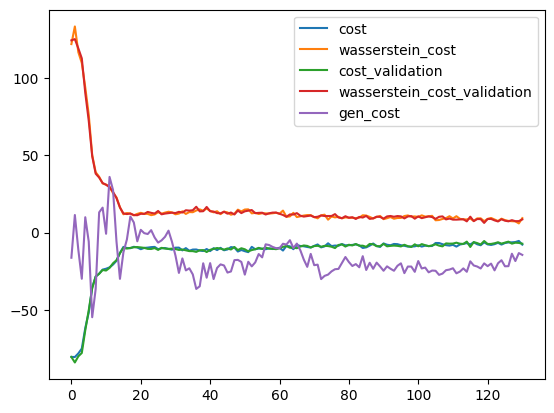

2023-12-30 15:31:22,186 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:31:24,569 - g4gan - INFO - D_self: 248.73
INFO:g4gan:D_self: 248.73
2023-12-30 15:31:24,574 - g4gan - INFO - D_train: 247.56
INFO:g4gan:D_train: 247.56


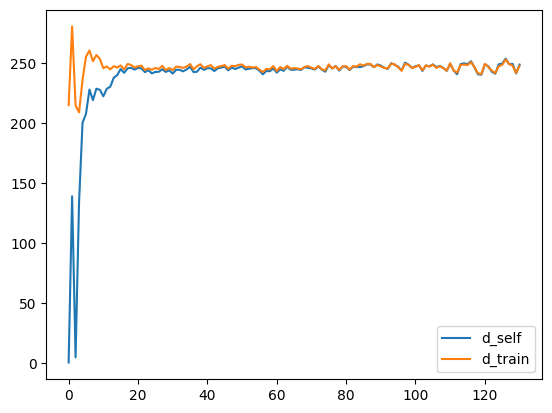

2023-12-30 15:31:24,887 - g4gan - INFO - Epoch: 132/200
INFO:g4gan:Epoch: 132/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:31:53,985 - g4gan - INFO - {'discriminator': [{'cost': -6.319342136383057,
                    'cost_validation': -5.339520454406738,
                    'wasserstein_cost': 8.191299438476562,
                    'wasserstein_cost_validation': 6.427848815917969},
                   {'cost': -5.8137712478637695,
                    'cost_validation': -5.924694061279297,
                    'wasserstein_cost': 7.120426177978516,
                    'wasserstein_cost_validation': 6.952423095703125},
                   {'cost': -4.915091514587402,
                    'cost_validation': -7.025409698486328,
                    'wasserstein_cost': 5.782662391662598,
                    'wass

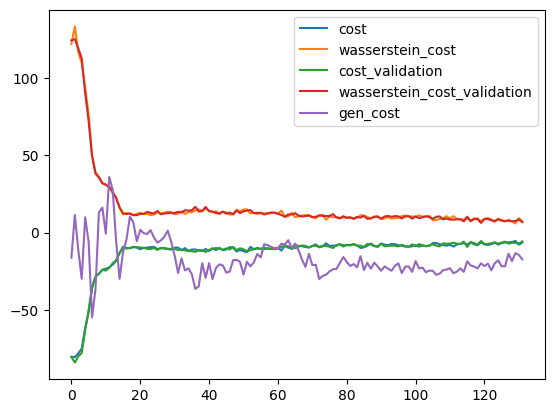

2023-12-30 15:31:54,267 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:31:57,847 - g4gan - INFO - D_self: 250.56
INFO:g4gan:D_self: 250.56
2023-12-30 15:31:57,856 - g4gan - INFO - D_train: 248.81
INFO:g4gan:D_train: 248.81


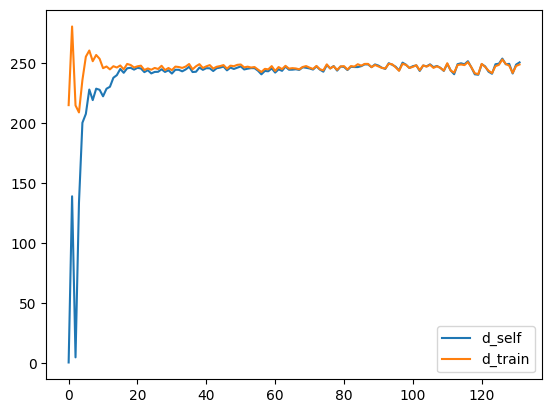

2023-12-30 15:31:58,185 - g4gan - INFO - Epoch: 133/200
INFO:g4gan:Epoch: 133/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:32:28,193 - g4gan - INFO - {'discriminator': [{'cost': -5.93229866027832,
                    'cost_validation': -5.816086769104004,
                    'wasserstein_cost': 7.41473388671875,
                    'wasserstein_cost_validation': 7.003414154052734},
                   {'cost': -5.008750915527344,
                    'cost_validation': -6.018312454223633,
                    'wasserstein_cost': 6.075433731079102,
                    'wasserstein_cost_validation': 7.002645492553711},
                   {'cost': -5.712186336517334,
                    'cost_validation': -4.789933681488037,
                    'wasserstein_cost': 6.927927017211914,
                    'wassers

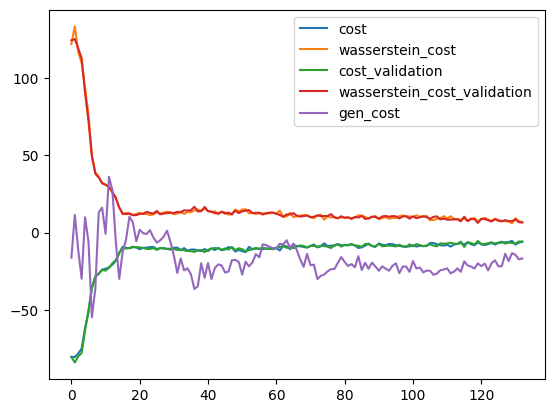

2023-12-30 15:32:28,538 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:32:32,377 - g4gan - INFO - D_self: 251.14
INFO:g4gan:D_self: 251.14
2023-12-30 15:32:32,382 - g4gan - INFO - D_train: 250.84
INFO:g4gan:D_train: 250.84


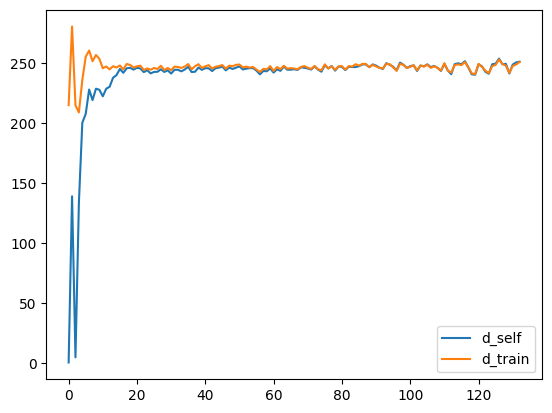

2023-12-30 15:32:32,683 - g4gan - INFO - Epoch: 134/200
INFO:g4gan:Epoch: 134/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:33:01,692 - g4gan - INFO - {'discriminator': [{'cost': -6.118408679962158,
                    'cost_validation': -6.363827705383301,
                    'wasserstein_cost': 7.974428176879883,
                    'wasserstein_cost_validation': 8.040033340454102},
                   {'cost': -5.593316078186035,
                    'cost_validation': -5.873693943023682,
                    'wasserstein_cost': 7.340604782104492,
                    'wasserstein_cost_validation': 7.311321258544922},
                   {'cost': -4.828986167907715,
                    'cost_validation': -5.585287094116211,
                    'wasserstein_cost': 6.427059173583984,
                    'wasse

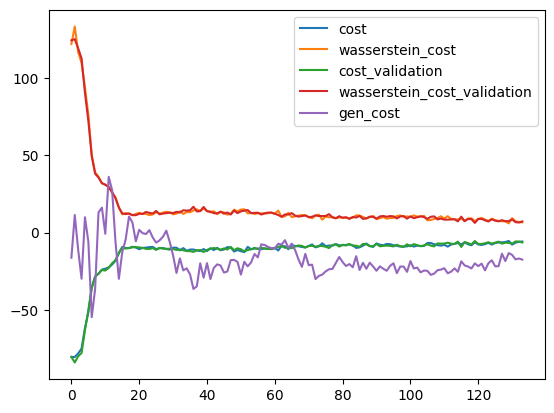

2023-12-30 15:33:01,970 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:33:04,409 - g4gan - INFO - D_self: 248.58
INFO:g4gan:D_self: 248.58
2023-12-30 15:33:04,414 - g4gan - INFO - D_train: 246.87
INFO:g4gan:D_train: 246.87


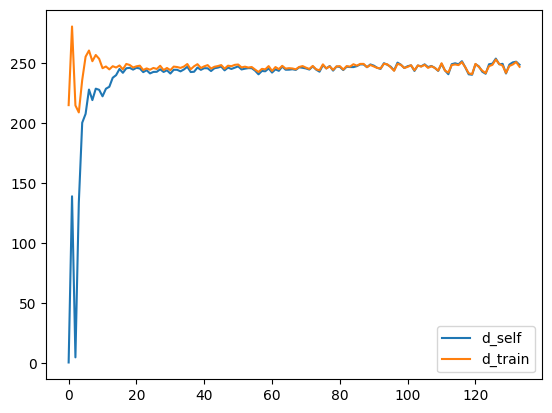

2023-12-30 15:33:04,713 - g4gan - INFO - Epoch: 135/200
INFO:g4gan:Epoch: 135/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:33:33,772 - g4gan - INFO - {'discriminator': [{'cost': -3.705538749694824,
                    'cost_validation': -4.655959129333496,
                    'wasserstein_cost': 5.37779426574707,
                    'wasserstein_cost_validation': 5.810186386108398},
                   {'cost': -4.300264835357666,
                    'cost_validation': -6.189608573913574,
                    'wasserstein_cost': 5.387866973876953,
                    'wasserstein_cost_validation': 7.712589263916016},
                   {'cost': -6.118152618408203,
                    'cost_validation': -6.448817729949951,
                    'wasserstein_cost': 6.942453384399414,
                    'wasser

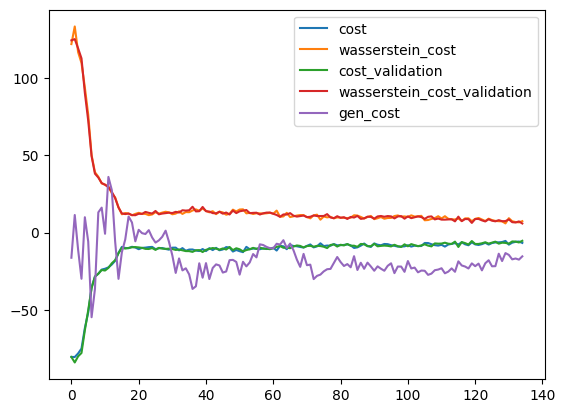

2023-12-30 15:33:34,084 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:33:36,470 - g4gan - INFO - D_self: 252.34
INFO:g4gan:D_self: 252.34
2023-12-30 15:33:36,474 - g4gan - INFO - D_train: 251.04
INFO:g4gan:D_train: 251.04


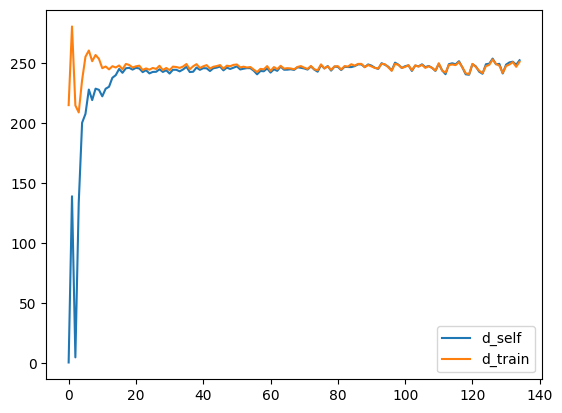

2023-12-30 15:33:36,795 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:33:36,801 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:33:36,895 - g4gan - INFO - Epoch: 136/200
INFO:g4gan:Epoch: 136/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   A   T   C   T   G   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   G   A   G   C   G   G   T   G  ...   C   A   C   G   G   T   C   
2    T   T   C   A   G   G   G   G   T   T  ...   A   A   G   G   A   C   T   
3    C   G   C   G   A   G   C   C   C   G  ...   A   C   C   G   A   G   T   
4    G   A   A   A   G   T   A   G   A   G  ...   A   A   C   T   G   G   T   
5    A   A   G   T   G   T   T   T   G   C  ...   C   T   C   C   C   G   A   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   T   G   G   T   
7    A   G   C   G   G   G   A   G   A   C  ...   G   G   G   G   C   T   C   
8    C   A   C   G   C   G   C   G   C   T  ...   T   C   T   C   A   T   A   
9    G   G   C   T   G   A   A   G   G   A  ...   A   G   A   T   T   A   G   
10   G   T   G   C   T   C   T   G   G   A  ...   T   T   C   C   A   C   C   
11   G   T   C   G   T   T   T   G   G   A  ...   A 

2023-12-30 15:34:06,268 - g4gan - INFO - {'discriminator': [{'cost': -5.429453372955322,
                    'cost_validation': -5.489861011505127,
                    'wasserstein_cost': 6.381366729736328,
                    'wasserstein_cost_validation': 6.656557083129883},
                   {'cost': -6.146533012390137,
                    'cost_validation': -6.427487373352051,
                    'wasserstein_cost': 7.285928726196289,
                    'wasserstein_cost_validation': 7.672128677368164},
                   {'cost': -6.340536117553711,
                    'cost_validation': -6.876993179321289,
                    'wasserstein_cost': 7.394338607788086,
                    'wasserstein_cost_validation': 7.918598175048828},
                   {'cost': -6.733164310455322,
                    'cost_validation': -6.622139930725098,
                    'wasserstein_cost': 8.037578582763672,
                    'wasserstein_cost_validation': 7.732738494873047},
           

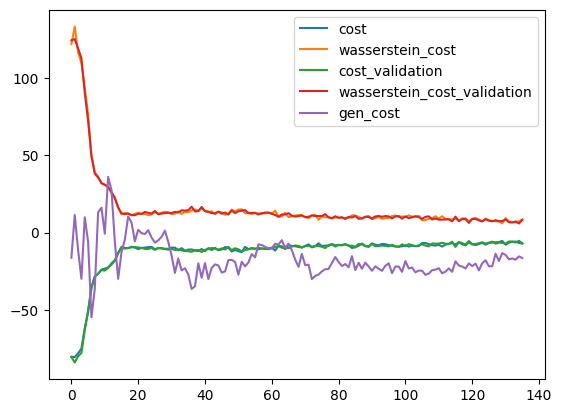

2023-12-30 15:34:06,566 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:34:08,990 - g4gan - INFO - D_self: 253.49
INFO:g4gan:D_self: 253.49
2023-12-30 15:34:08,994 - g4gan - INFO - D_train: 251.91
INFO:g4gan:D_train: 251.91


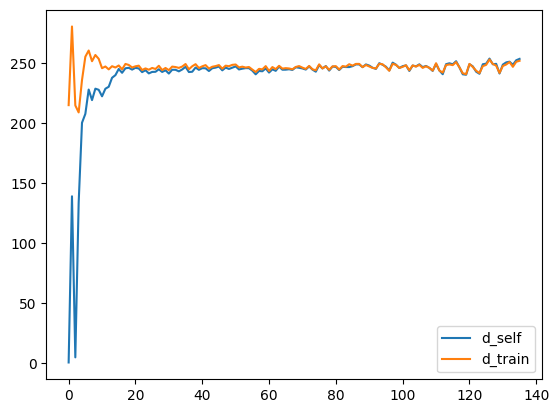

2023-12-30 15:34:09,294 - g4gan - INFO - Epoch: 137/200
INFO:g4gan:Epoch: 137/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:34:38,513 - g4gan - INFO - {'discriminator': [{'cost': -5.0472259521484375,
                    'cost_validation': -5.452057361602783,
                    'wasserstein_cost': 6.4489898681640625,
                    'wasserstein_cost_validation': 6.5912322998046875},
                   {'cost': -5.523922443389893,
                    'cost_validation': -5.76690149307251,
                    'wasserstein_cost': 6.673639297485352,
                    'wasserstein_cost_validation': 6.750724792480469},
                   {'cost': -4.810429573059082,
                    'cost_validation': -5.112476825714111,
                    'wasserstein_cost': 5.644191741943359,
                    'was

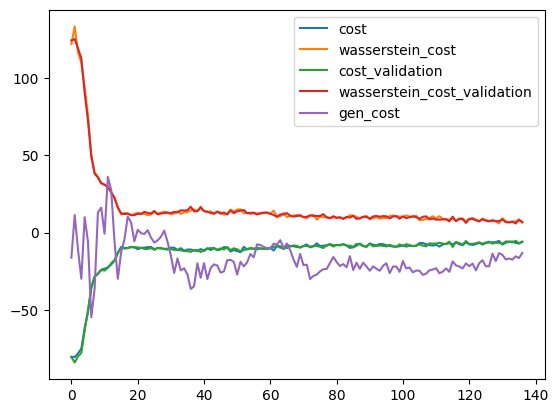

2023-12-30 15:34:38,851 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:34:42,467 - g4gan - INFO - D_self: 243.78
INFO:g4gan:D_self: 243.78
2023-12-30 15:34:42,472 - g4gan - INFO - D_train: 244.05
INFO:g4gan:D_train: 244.05


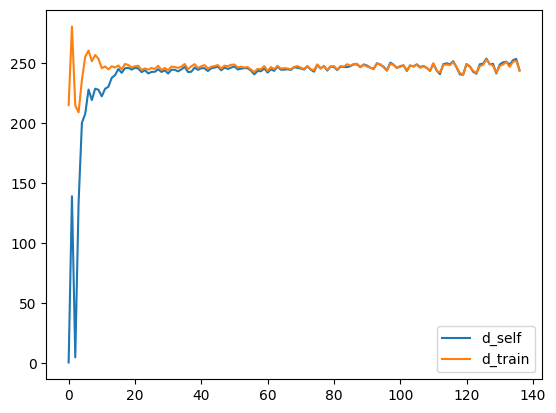

2023-12-30 15:34:42,833 - g4gan - INFO - Epoch: 138/200
INFO:g4gan:Epoch: 138/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:35:12,143 - g4gan - INFO - {'discriminator': [{'cost': -5.403146743774414,
                    'cost_validation': -5.516188621520996,
                    'wasserstein_cost': 6.229452133178711,
                    'wasserstein_cost_validation': 6.597162246704102},
                   {'cost': -4.404623031616211,
                    'cost_validation': -5.523066997528076,
                    'wasserstein_cost': 5.402015686035156,
                    'wasserstein_cost_validation': 6.217308044433594},
                   {'cost': -6.007407188415527,
                    'cost_validation': -6.50240421295166,
                    'wasserstein_cost': 7.020566940307617,
                    'wasser

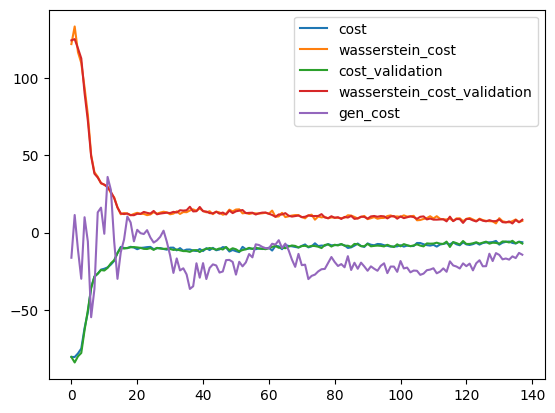

2023-12-30 15:35:12,588 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:35:16,582 - g4gan - INFO - D_self: 247.29
INFO:g4gan:D_self: 247.29
2023-12-30 15:35:16,586 - g4gan - INFO - D_train: 246.72
INFO:g4gan:D_train: 246.72


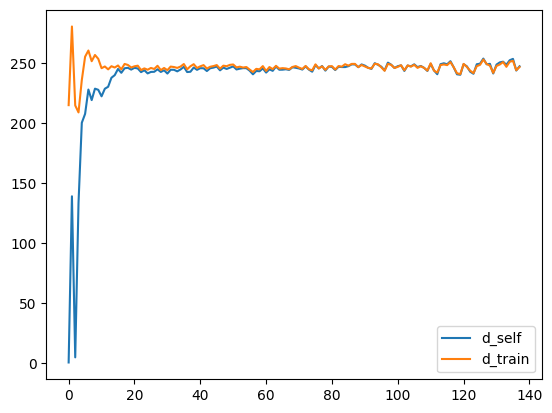

2023-12-30 15:35:16,895 - g4gan - INFO - Epoch: 139/200
INFO:g4gan:Epoch: 139/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:35:46,319 - g4gan - INFO - {'discriminator': [{'cost': -5.21409273147583,
                    'cost_validation': -4.95678186416626,
                    'wasserstein_cost': 6.059633255004883,
                    'wasserstein_cost_validation': 5.752013206481934},
                   {'cost': -5.515259742736816,
                    'cost_validation': -7.227775573730469,
                    'wasserstein_cost': 6.180582046508789,
                    'wasserstein_cost_validation': 8.721735000610352},
                   {'cost': -5.723031997680664,
                    'cost_validation': -6.301304817199707,
                    'wasserstein_cost': 7.018587112426758,
                    'wassers

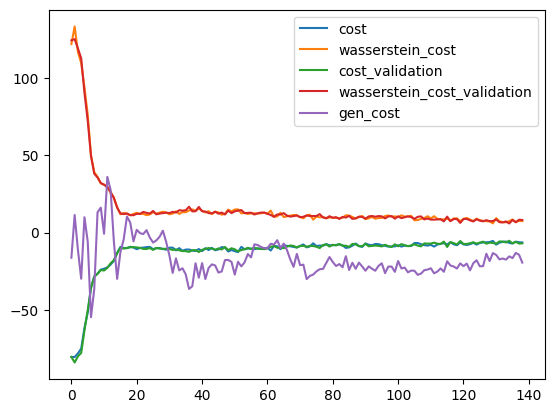

2023-12-30 15:35:46,669 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:35:49,073 - g4gan - INFO - D_self: 251.32
INFO:g4gan:D_self: 251.32
2023-12-30 15:35:49,079 - g4gan - INFO - D_train: 250.93
INFO:g4gan:D_train: 250.93


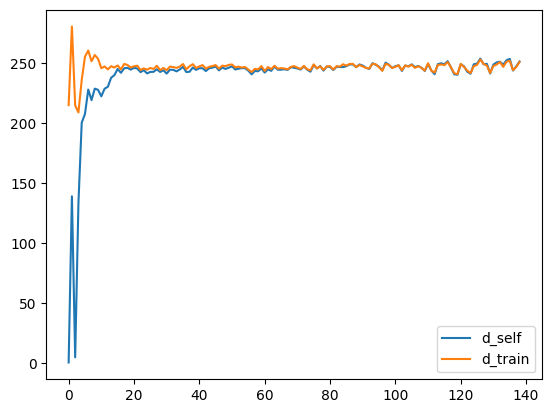

2023-12-30 15:35:49,401 - g4gan - INFO - Epoch: 140/200
INFO:g4gan:Epoch: 140/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:36:18,874 - g4gan - INFO - {'discriminator': [{'cost': -4.120123863220215,
                    'cost_validation': -5.440319061279297,
                    'wasserstein_cost': 4.932497024536133,
                    'wasserstein_cost_validation': 6.47877311706543},
                   {'cost': -4.879568099975586,
                    'cost_validation': -5.666787624359131,
                    'wasserstein_cost': 5.819606781005859,
                    'wasserstein_cost_validation': 6.801506042480469},
                   {'cost': -4.800618648529053,
                    'cost_validation': -5.111855506896973,
                    'wasserstein_cost': 5.862749099731445,
                    'wasser

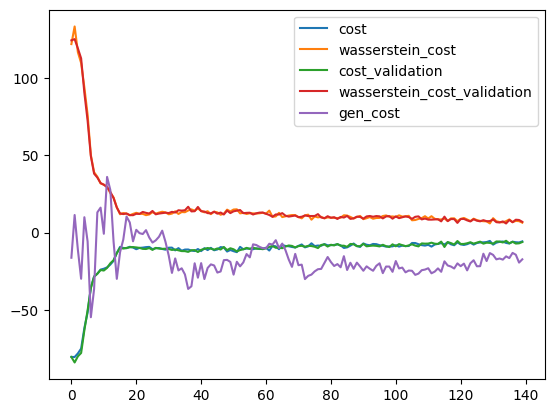

2023-12-30 15:36:19,220 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:36:21,583 - g4gan - INFO - D_self: 250.59
INFO:g4gan:D_self: 250.59
2023-12-30 15:36:21,588 - g4gan - INFO - D_train: 249.35
INFO:g4gan:D_train: 249.35


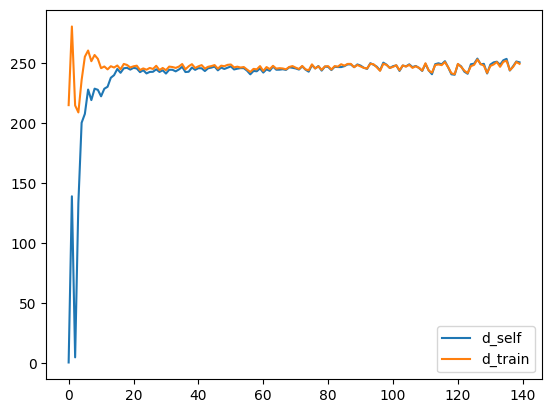

2023-12-30 15:36:21,855 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:36:21,864 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:36:21,959 - g4gan - INFO - Epoch: 141/200
INFO:g4gan:Epoch: 141/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   A   T   C   T   G   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   T   A   G   C   G   T   T   G  ...   C   A   C   G   C   T   C   
2    T   T   C   A   G   C   G   G   T   T  ...   A   A   G   G   A   C   T   
3    C   G   C   G   A   G   C   C   C   G  ...   A   C   C   C   A   G   T   
4    G   A   A   T   G   T   A   C   A   G  ...   A   A   C   T   C   G   T   
5    A   A   G   T   G   A   T   T   G   C  ...   C   T   C   C   C   G   T   
6    C   A   C   A   C   T   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   C   G   G   G   A   G   A   C  ...   G   G   G   G   C   A   C   
8    C   T   C   G   C   G   C   G   C   T  ...   T   C   T   C   A   T   A   
9    G   G   C   T   C   A   A   G   T   A  ...   A   G   A   T   T   A   G   
10   T   T   G   C   T   C   T   C   G   A  ...   T   T   C   C   T   C   C   
11   G   T   C   G   T   T   T   G   G   A  ...   A 

2023-12-30 15:36:51,478 - g4gan - INFO - {'discriminator': [{'cost': -4.927001476287842,
                    'cost_validation': -4.168699741363525,
                    'wasserstein_cost': 6.39973258972168,
                    'wasserstein_cost_validation': 5.347962379455566},
                   {'cost': -4.585827827453613,
                    'cost_validation': -4.7504119873046875,
                    'wasserstein_cost': 5.6773881912231445,
                    'wasserstein_cost_validation': 5.598507881164551},
                   {'cost': -5.5181803703308105,
                    'cost_validation': -5.532678127288818,
                    'wasserstein_cost': 6.5215606689453125,
                    'wasserstein_cost_validation': 6.248824119567871},
                   {'cost': -5.170485973358154,
                    'cost_validation': -4.631414890289307,
                    'wasserstein_cost': 5.914693832397461,
                    'wasserstein_cost_validation': 5.446565628051758},
        

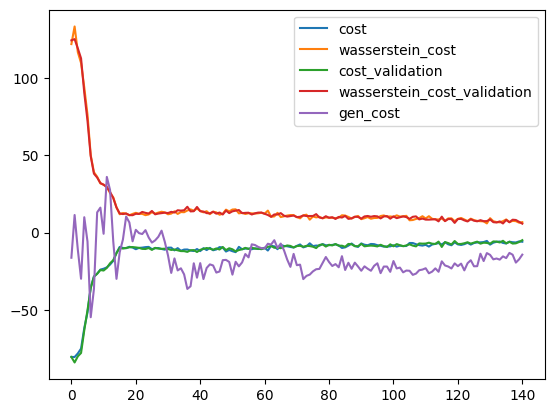

2023-12-30 15:36:51,821 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:36:54,195 - g4gan - INFO - D_self: 247.2
INFO:g4gan:D_self: 247.2
2023-12-30 15:36:54,200 - g4gan - INFO - D_train: 247.04
INFO:g4gan:D_train: 247.04


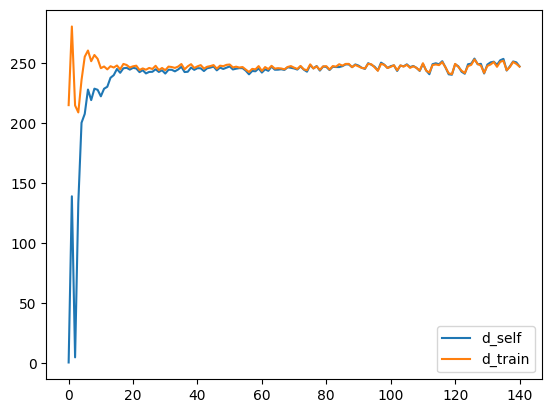

2023-12-30 15:36:54,506 - g4gan - INFO - Epoch: 142/200
INFO:g4gan:Epoch: 142/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:37:24,050 - g4gan - INFO - {'discriminator': [{'cost': -4.823634624481201,
                    'cost_validation': -6.979469299316406,
                    'wasserstein_cost': 6.055185317993164,
                    'wasserstein_cost_validation': 7.821380615234375},
                   {'cost': -4.1635284423828125,
                    'cost_validation': -5.80135440826416,
                    'wasserstein_cost': 5.146065711975098,
                    'wasserstein_cost_validation': 6.624673843383789},
                   {'cost': -5.5030694007873535,
                    'cost_validation': -4.294015884399414,
                    'wasserstein_cost': 6.214517593383789,
                    'wass

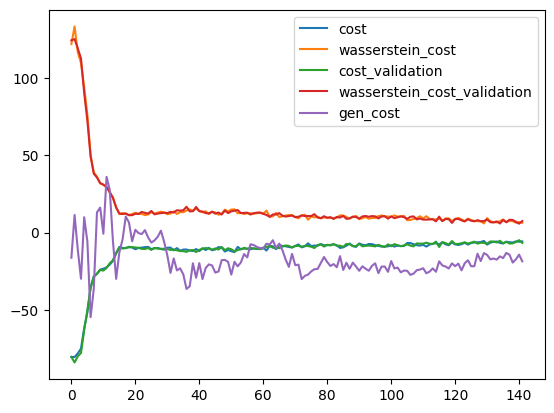

2023-12-30 15:37:24,355 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:37:28,281 - g4gan - INFO - D_self: 250.0
INFO:g4gan:D_self: 250.0
2023-12-30 15:37:28,285 - g4gan - INFO - D_train: 249.79
INFO:g4gan:D_train: 249.79


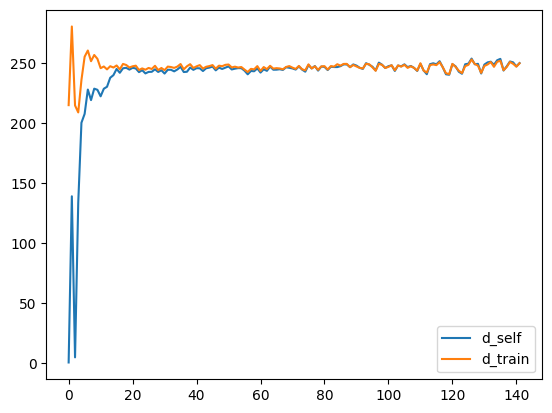

2023-12-30 15:37:28,581 - g4gan - INFO - Epoch: 143/200
INFO:g4gan:Epoch: 143/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:37:57,828 - g4gan - INFO - {'discriminator': [{'cost': -4.617035388946533,
                    'cost_validation': -4.482663631439209,
                    'wasserstein_cost': 5.601724624633789,
                    'wasserstein_cost_validation': 5.6107330322265625},
                   {'cost': -4.3043742179870605,
                    'cost_validation': -6.115386009216309,
                    'wasserstein_cost': 5.204547882080078,
                    'wasserstein_cost_validation': 6.881772994995117},
                   {'cost': -5.285453796386719,
                    'cost_validation': -5.330178260803223,
                    'wasserstein_cost': 6.423908233642578,
                    'was

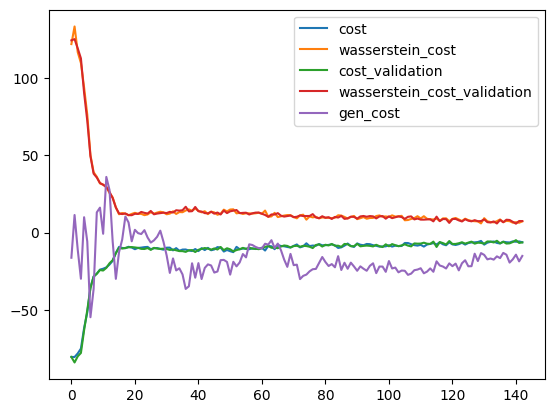

2023-12-30 15:37:58,258 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:38:02,339 - g4gan - INFO - D_self: 249.59
INFO:g4gan:D_self: 249.59
2023-12-30 15:38:02,343 - g4gan - INFO - D_train: 248.31
INFO:g4gan:D_train: 248.31


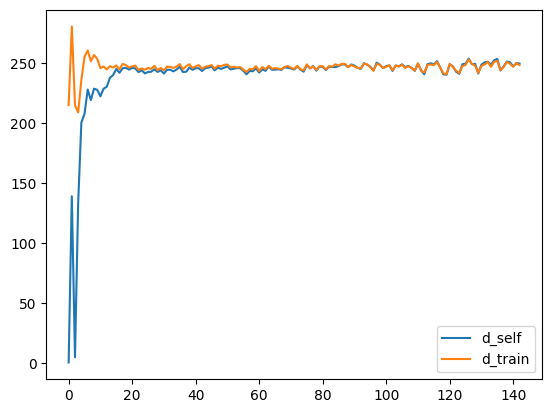

2023-12-30 15:38:02,663 - g4gan - INFO - Epoch: 144/200
INFO:g4gan:Epoch: 144/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:38:32,000 - g4gan - INFO - {'discriminator': [{'cost': -3.8469605445861816,
                    'cost_validation': -3.8718767166137695,
                    'wasserstein_cost': 5.085982322692871,
                    'wasserstein_cost_validation': 5.236096382141113},
                   {'cost': -4.4399003982543945,
                    'cost_validation': -4.223128318786621,
                    'wasserstein_cost': 5.774147987365723,
                    'wasserstein_cost_validation': 5.3598737716674805},
                   {'cost': -3.939945697784424,
                    'cost_validation': -4.8201494216918945,
                    'wasserstein_cost': 4.777583122253418,
                    '

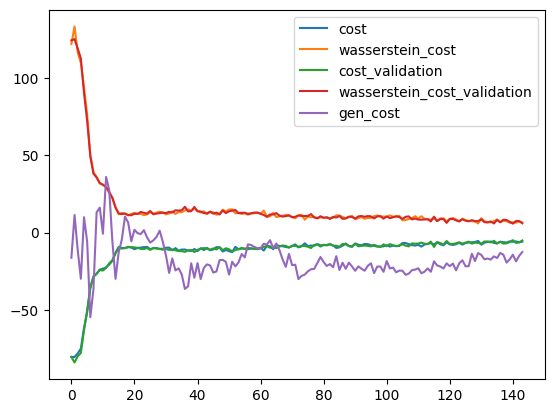

2023-12-30 15:38:32,339 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:38:34,768 - g4gan - INFO - D_self: 241.84
INFO:g4gan:D_self: 241.84
2023-12-30 15:38:34,772 - g4gan - INFO - D_train: 241.59
INFO:g4gan:D_train: 241.59


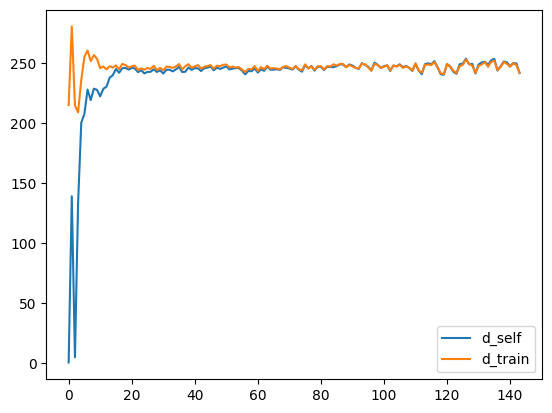

2023-12-30 15:38:35,446 - g4gan - INFO - Epoch: 145/200
INFO:g4gan:Epoch: 145/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:39:04,827 - g4gan - INFO - {'discriminator': [{'cost': -4.318747043609619,
                    'cost_validation': -5.349855422973633,
                    'wasserstein_cost': 5.483477592468262,
                    'wasserstein_cost_validation': 6.184149742126465},
                   {'cost': -4.360551834106445,
                    'cost_validation': -5.550577163696289,
                    'wasserstein_cost': 5.845186233520508,
                    'wasserstein_cost_validation': 6.409914016723633},
                   {'cost': -5.0698723793029785,
                    'cost_validation': -5.035608291625977,
                    'wasserstein_cost': 6.112297058105469,
                    'wass

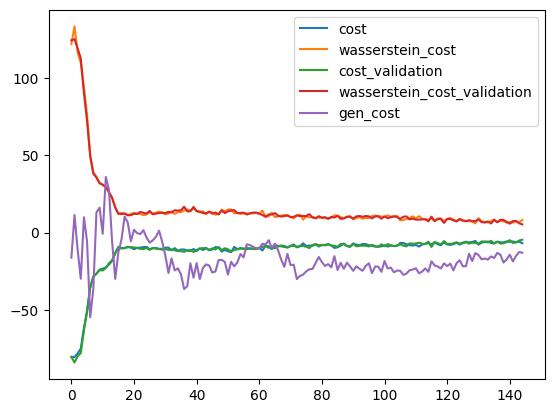

2023-12-30 15:39:05,139 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:39:07,584 - g4gan - INFO - D_self: 250.01
INFO:g4gan:D_self: 250.01
2023-12-30 15:39:07,589 - g4gan - INFO - D_train: 249.6
INFO:g4gan:D_train: 249.6


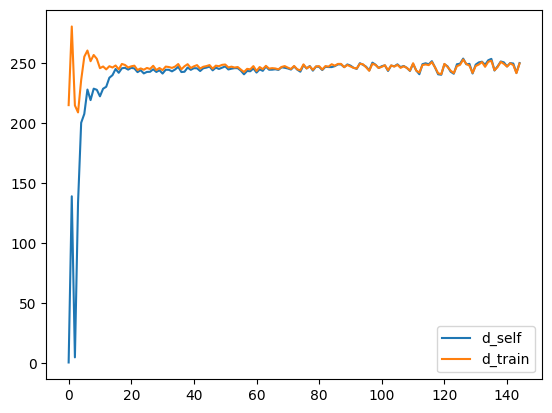

2023-12-30 15:39:07,915 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:39:07,923 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:39:08,010 - g4gan - INFO - Epoch: 146/200
INFO:g4gan:Epoch: 146/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   A   T   C   T   G   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   T   A   G   C   G   T   T   G  ...   C   A   C   T   G   T   C   
2    T   T   C   A   G   G   G   G   T   G  ...   A   A   G   G   A   C   T   
3    C   G   C   G   A   G   C   C   C   G  ...   A   C   C   C   A   G   T   
4    G   A   A   T   G   T   A   G   A   G  ...   T   A   C   T   G   G   T   
5    A   A   G   T   G   A   G   A   G   C  ...   C   T   C   C   C   G   A   
6    C   A   C   A   C   T   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   C   G   G   G   A   G   A   C  ...   G   G   G   G   C   A   C   
8    C   A   C   G   G   G   G   G   C   T  ...   T   C   T   C   A   A   A   
9    G   G   C   T   C   A   A   G   T   A  ...   A   G   A   T   T   A   G   
10   T   T   G   C   A   C   A   G   G   A  ...   T   T   C   C   A   C   C   
11   G   T   C   G   T   T   T   G   G   A  ...   A 

2023-12-30 15:39:37,449 - g4gan - INFO - {'discriminator': [{'cost': -4.675880432128906,
                    'cost_validation': -4.553071975708008,
                    'wasserstein_cost': 5.611528396606445,
                    'wasserstein_cost_validation': 5.390098571777344},
                   {'cost': -5.579560279846191,
                    'cost_validation': -5.801372528076172,
                    'wasserstein_cost': 6.745019912719727,
                    'wasserstein_cost_validation': 6.6864166259765625},
                   {'cost': -6.248707294464111,
                    'cost_validation': -6.163341522216797,
                    'wasserstein_cost': 6.932886123657227,
                    'wasserstein_cost_validation': 7.1736955642700195},
                   {'cost': -6.730584144592285,
                    'cost_validation': -6.991003036499023,
                    'wasserstein_cost': 7.770149230957031,
                    'wasserstein_cost_validation': 8.139331817626953},
         

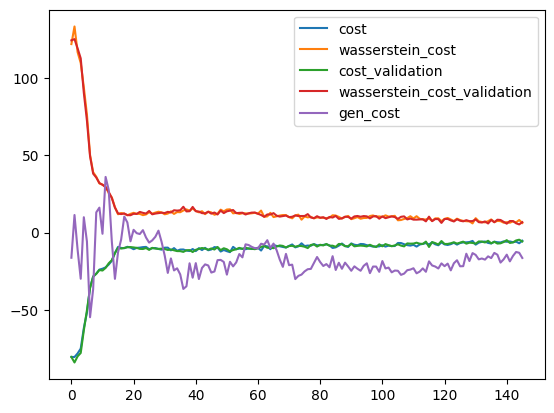

2023-12-30 15:39:37,731 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:39:40,211 - g4gan - INFO - D_self: 243.83
INFO:g4gan:D_self: 243.83
2023-12-30 15:39:40,215 - g4gan - INFO - D_train: 243.25
INFO:g4gan:D_train: 243.25


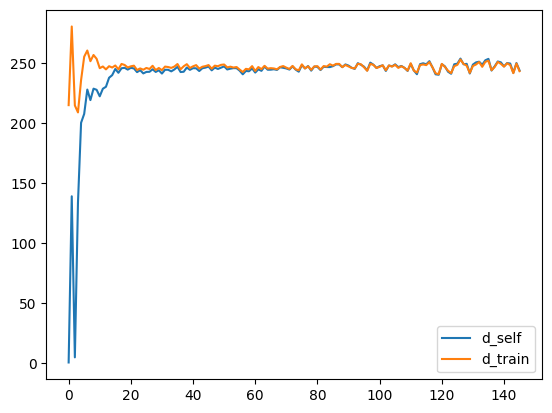

2023-12-30 15:39:40,605 - g4gan - INFO - Epoch: 147/200
INFO:g4gan:Epoch: 147/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:40:10,210 - g4gan - INFO - {'discriminator': [{'cost': -5.3607988357543945,
                    'cost_validation': -6.038218021392822,
                    'wasserstein_cost': 6.405078887939453,
                    'wasserstein_cost_validation': 7.201326370239258},
                   {'cost': -6.3352508544921875,
                    'cost_validation': -6.710949897766113,
                    'wasserstein_cost': 7.412818908691406,
                    'wasserstein_cost_validation': 7.87625789642334},
                   {'cost': -6.584136962890625,
                    'cost_validation': -5.7961649894714355,
                    'wasserstein_cost': 7.604299545288086,
                    'was

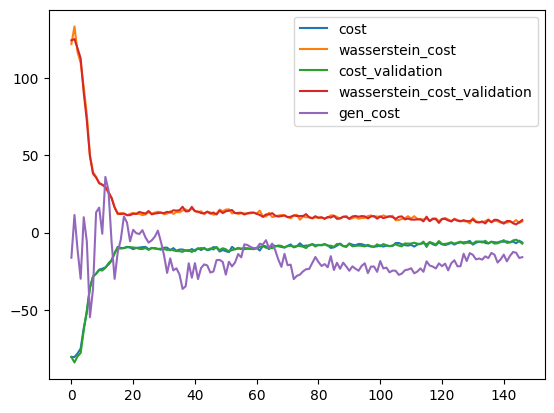

2023-12-30 15:40:10,562 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:40:14,533 - g4gan - INFO - D_self: 245.98
INFO:g4gan:D_self: 245.98
2023-12-30 15:40:14,540 - g4gan - INFO - D_train: 245.15
INFO:g4gan:D_train: 245.15


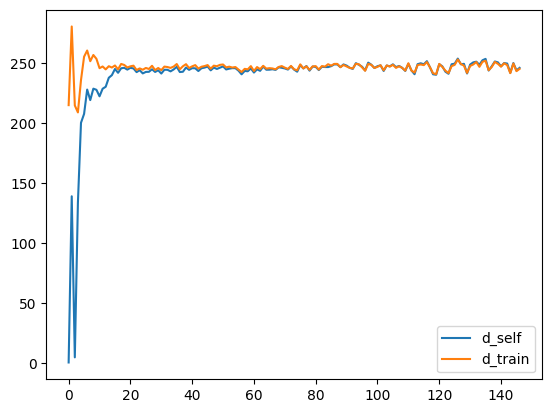

2023-12-30 15:40:14,894 - g4gan - INFO - Epoch: 148/200
INFO:g4gan:Epoch: 148/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:40:44,350 - g4gan - INFO - {'discriminator': [{'cost': -5.187031269073486,
                    'cost_validation': -5.944611549377441,
                    'wasserstein_cost': 6.503698348999023,
                    'wasserstein_cost_validation': 7.442766189575195},
                   {'cost': -6.082016944885254,
                    'cost_validation': -7.490809440612793,
                    'wasserstein_cost': 7.185817718505859,
                    'wasserstein_cost_validation': 8.938850402832031},
                   {'cost': -6.507287979125977,
                    'cost_validation': -6.750737190246582,
                    'wasserstein_cost': 7.842897415161133,
                    'wasse

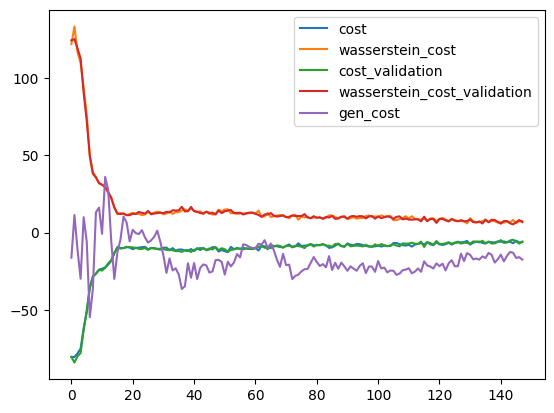

2023-12-30 15:40:44,722 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:40:48,362 - g4gan - INFO - D_self: 245.57
INFO:g4gan:D_self: 245.57
2023-12-30 15:40:48,366 - g4gan - INFO - D_train: 245.67
INFO:g4gan:D_train: 245.67


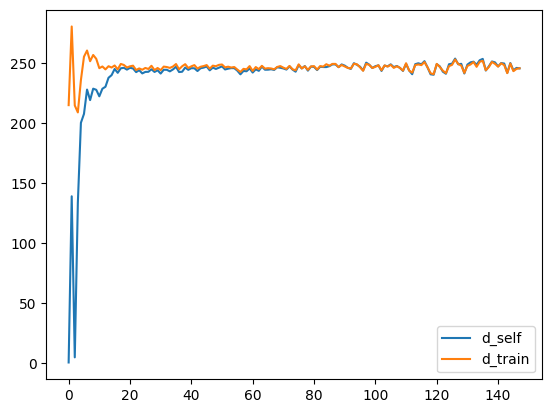

2023-12-30 15:40:48,680 - g4gan - INFO - Epoch: 149/200
INFO:g4gan:Epoch: 149/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:41:18,236 - g4gan - INFO - {'discriminator': [{'cost': -6.075414657592773,
                    'cost_validation': -6.11909294128418,
                    'wasserstein_cost': 7.587467193603516,
                    'wasserstein_cost_validation': 7.552855491638184},
                   {'cost': -5.600599765777588,
                    'cost_validation': -5.551218509674072,
                    'wasserstein_cost': 6.859773635864258,
                    'wasserstein_cost_validation': 7.120782852172852},
                   {'cost': -6.890871047973633,
                    'cost_validation': -5.167308807373047,
                    'wasserstein_cost': 7.9601287841796875,
                    'wasse

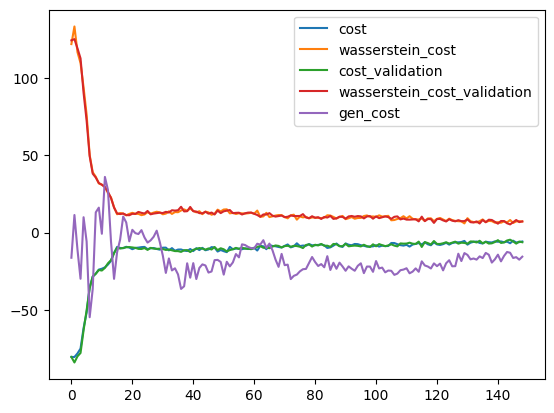

2023-12-30 15:41:18,577 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:41:21,003 - g4gan - INFO - D_self: 249.37
INFO:g4gan:D_self: 249.37
2023-12-30 15:41:21,008 - g4gan - INFO - D_train: 247.88
INFO:g4gan:D_train: 247.88


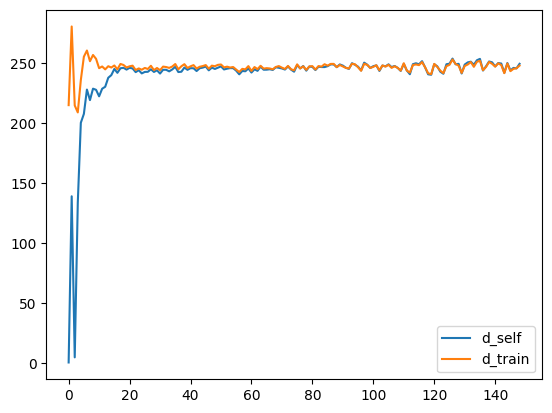

2023-12-30 15:41:21,326 - g4gan - INFO - Epoch: 150/200
INFO:g4gan:Epoch: 150/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:41:50,878 - g4gan - INFO - {'discriminator': [{'cost': -5.032618522644043,
                    'cost_validation': -4.997989654541016,
                    'wasserstein_cost': 6.270576477050781,
                    'wasserstein_cost_validation': 5.708707809448242},
                   {'cost': -5.91135311126709,
                    'cost_validation': -5.679858207702637,
                    'wasserstein_cost': 6.9067888259887695,
                    'wasserstein_cost_validation': 6.71042537689209},
                   {'cost': -4.879410743713379,
                    'cost_validation': -4.658713340759277,
                    'wasserstein_cost': 5.425388336181641,
                    'wasser

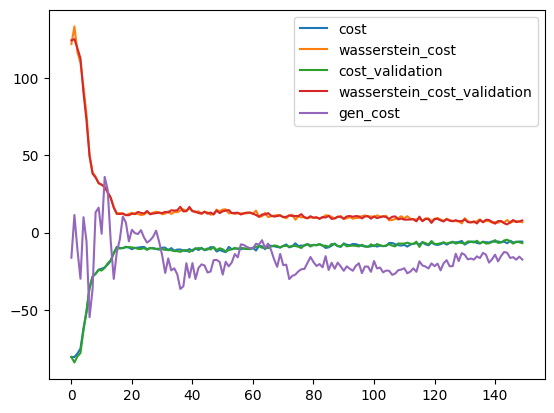

2023-12-30 15:41:51,204 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:41:53,687 - g4gan - INFO - D_self: 253.53
INFO:g4gan:D_self: 253.53
2023-12-30 15:41:53,692 - g4gan - INFO - D_train: 252.31
INFO:g4gan:D_train: 252.31


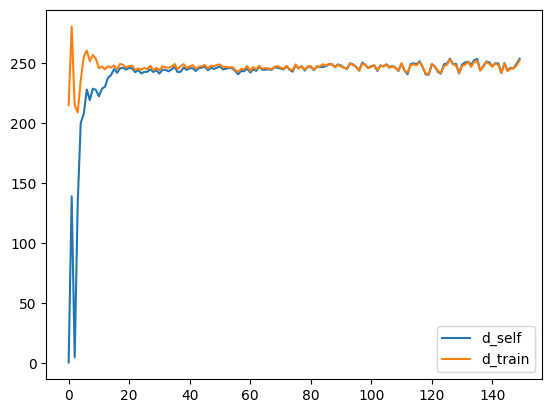

2023-12-30 15:41:54,002 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:41:54,013 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:41:54,114 - g4gan - INFO - Epoch: 151/200
INFO:g4gan:Epoch: 151/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   A   T   C   T   G   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   T   A   G   C   G   T   A   G  ...   C   A   C   T   G   T   C   
2    T   T   C   A   G   C   G   G   T   G  ...   A   A   G   G   A   C   T   
3    C   G   C   G   A   G   C   C   C   G  ...   T   C   C   C   A   G   T   
4    G   A   A   T   G   T   A   G   A   G  ...   T   A   C   A   G   G   T   
5    A   A   G   T   G   A   T   A   G   C  ...   C   T   C   C   C   G   T   
6    C   A   C   A   G   T   G   C   C   A  ...   G   C   C   G   G   G   T   
7    A   G   C   G   G   G   A   G   A   C  ...   G   G   G   G   C   A   C   
8    C   A   C   G   G   G   G   G   C   T  ...   T   C   T   C   A   A   A   
9    G   G   C   G   G   A   A   G   T   A  ...   A   G   A   T   T   A   G   
10   T   T   G   C   A   C   T   G   G   A  ...   T   T   C   C   A   C   C   
11   G   T   C   G   T   G   T   G   G   A  ...   A 

2023-12-30 15:42:23,732 - g4gan - INFO - {'discriminator': [{'cost': -5.043728828430176,
                    'cost_validation': -4.360981464385986,
                    'wasserstein_cost': 6.341257095336914,
                    'wasserstein_cost_validation': 5.363633155822754},
                   {'cost': -5.096424579620361,
                    'cost_validation': -5.9881062507629395,
                    'wasserstein_cost': 5.950565338134766,
                    'wasserstein_cost_validation': 7.056499481201172},
                   {'cost': -5.910825729370117,
                    'cost_validation': -4.6368088722229,
                    'wasserstein_cost': 6.769097328186035,
                    'wasserstein_cost_validation': 5.517478942871094},
                   {'cost': -5.9520978927612305,
                    'cost_validation': -5.493146896362305,
                    'wasserstein_cost': 6.887103080749512,
                    'wasserstein_cost_validation': 6.3705549240112305},
          

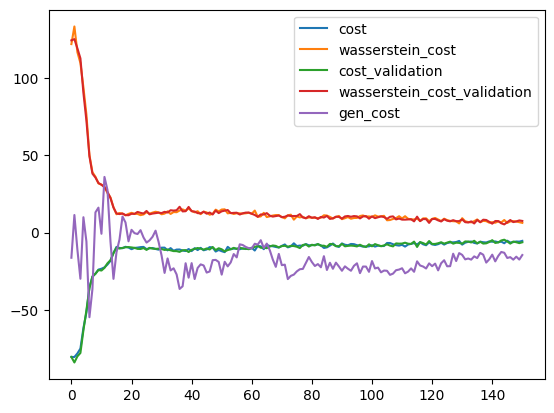

2023-12-30 15:42:24,081 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:42:27,065 - g4gan - INFO - D_self: 249.98
INFO:g4gan:D_self: 249.98
2023-12-30 15:42:27,069 - g4gan - INFO - D_train: 248.66
INFO:g4gan:D_train: 248.66


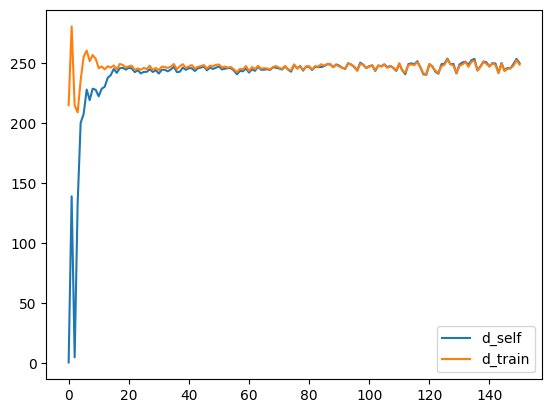

2023-12-30 15:42:27,432 - g4gan - INFO - Epoch: 152/200
INFO:g4gan:Epoch: 152/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:42:56,895 - g4gan - INFO - {'discriminator': [{'cost': -6.111976146697998,
                    'cost_validation': -6.065910816192627,
                    'wasserstein_cost': 6.805952072143555,
                    'wasserstein_cost_validation': 7.00022029876709},
                   {'cost': -5.816115856170654,
                    'cost_validation': -6.587700366973877,
                    'wasserstein_cost': 6.53497314453125,
                    'wasserstein_cost_validation': 8.118867874145508},
                   {'cost': -7.970058917999268,
                    'cost_validation': -5.052698612213135,
                    'wasserstein_cost': 9.185371398925781,
                    'wassers

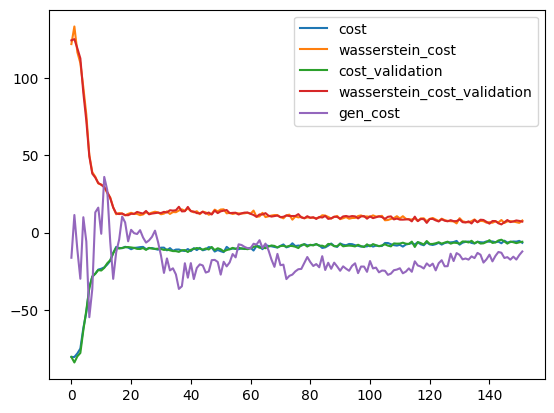

2023-12-30 15:42:57,273 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:43:01,315 - g4gan - INFO - D_self: 244.67
INFO:g4gan:D_self: 244.67
2023-12-30 15:43:01,322 - g4gan - INFO - D_train: 244.01
INFO:g4gan:D_train: 244.01


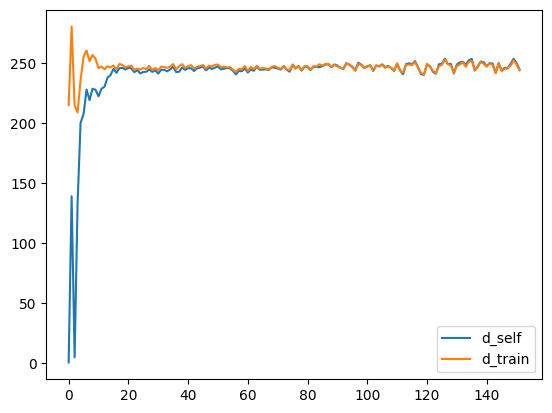

2023-12-30 15:43:01,643 - g4gan - INFO - Epoch: 153/200
INFO:g4gan:Epoch: 153/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:43:31,073 - g4gan - INFO - {'discriminator': [{'cost': -5.2126336097717285,
                    'cost_validation': -4.841270923614502,
                    'wasserstein_cost': 6.126825332641602,
                    'wasserstein_cost_validation': 5.780941963195801},
                   {'cost': -4.138906478881836,
                    'cost_validation': -5.436744213104248,
                    'wasserstein_cost': 4.849682807922363,
                    'wasserstein_cost_validation': 6.135122299194336},
                   {'cost': -4.849728584289551,
                    'cost_validation': -5.837766170501709,
                    'wasserstein_cost': 5.559954643249512,
                    'wass

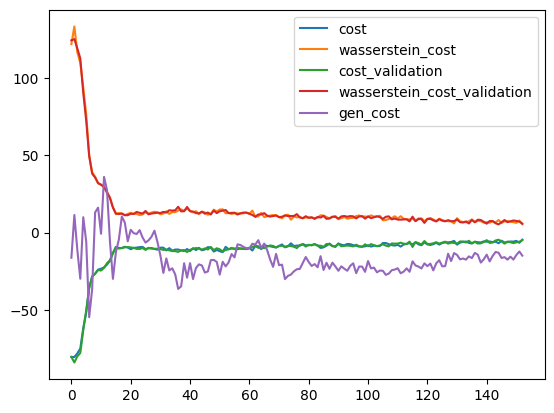

2023-12-30 15:43:31,456 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:43:34,751 - g4gan - INFO - D_self: 252.65
INFO:g4gan:D_self: 252.65
2023-12-30 15:43:34,757 - g4gan - INFO - D_train: 251.11
INFO:g4gan:D_train: 251.11


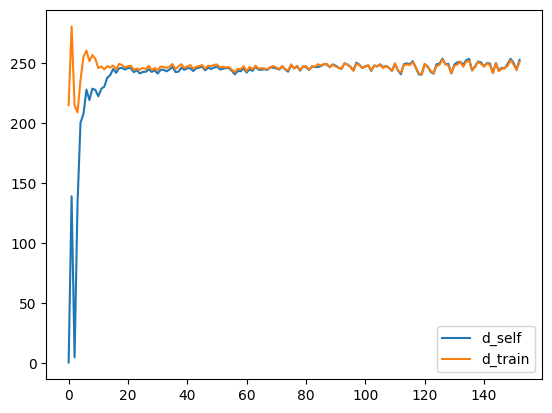

2023-12-30 15:43:35,079 - g4gan - INFO - Epoch: 154/200
INFO:g4gan:Epoch: 154/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:44:04,531 - g4gan - INFO - {'discriminator': [{'cost': -4.680136680603027,
                    'cost_validation': -5.656943321228027,
                    'wasserstein_cost': 6.125154495239258,
                    'wasserstein_cost_validation': 7.373354911804199},
                   {'cost': -5.605945587158203,
                    'cost_validation': -6.841767311096191,
                    'wasserstein_cost': 7.122959136962891,
                    'wasserstein_cost_validation': 8.711580276489258},
                   {'cost': -3.9190237522125244,
                    'cost_validation': -5.153680801391602,
                    'wasserstein_cost': 4.813455104827881,
                    'wass

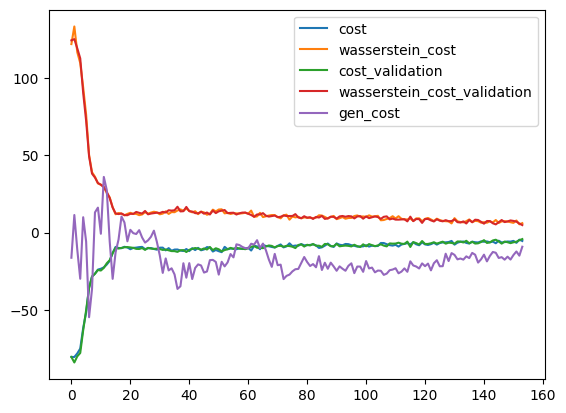

2023-12-30 15:44:04,821 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:44:07,331 - g4gan - INFO - D_self: 249.6
INFO:g4gan:D_self: 249.6
2023-12-30 15:44:07,335 - g4gan - INFO - D_train: 248.35
INFO:g4gan:D_train: 248.35


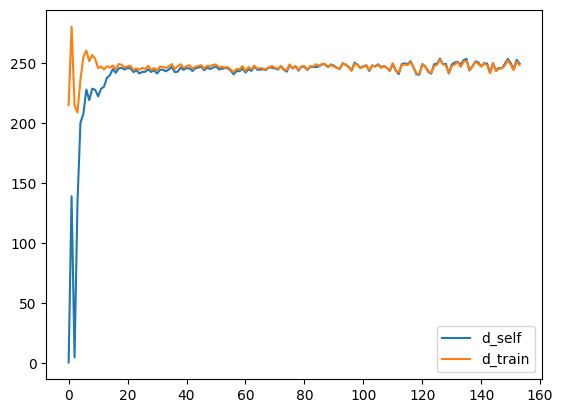

2023-12-30 15:44:07,625 - g4gan - INFO - Epoch: 155/200
INFO:g4gan:Epoch: 155/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:44:37,001 - g4gan - INFO - {'discriminator': [{'cost': -6.685043811798096,
                    'cost_validation': -5.306172847747803,
                    'wasserstein_cost': 7.753573417663574,
                    'wasserstein_cost_validation': 6.357767105102539},
                   {'cost': -5.120630264282227,
                    'cost_validation': -4.960994720458984,
                    'wasserstein_cost': 6.657182693481445,
                    'wasserstein_cost_validation': 6.404258728027344},
                   {'cost': -5.969416618347168,
                    'cost_validation': -5.496730804443359,
                    'wasserstein_cost': 7.4863739013671875,
                    'wass

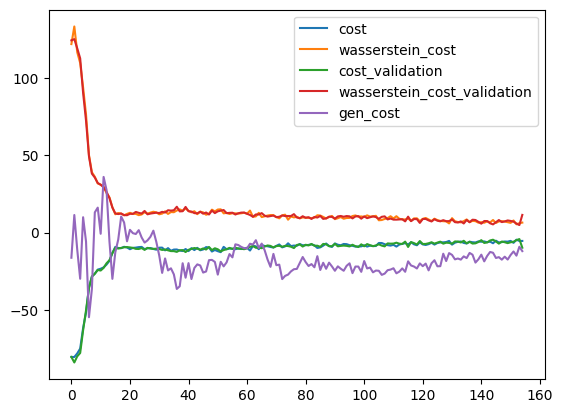

2023-12-30 15:44:37,359 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:44:39,776 - g4gan - INFO - D_self: 243.43
INFO:g4gan:D_self: 243.43
2023-12-30 15:44:39,781 - g4gan - INFO - D_train: 242.7
INFO:g4gan:D_train: 242.7


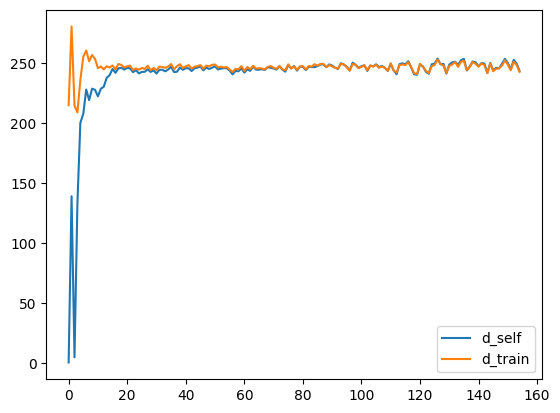

2023-12-30 15:44:40,096 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:44:40,106 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:44:40,193 - g4gan - INFO - Epoch: 156/200
INFO:g4gan:Epoch: 156/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   T   T   C   T   G   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   T   T   C   C   G   T   T   G  ...   C   A   C   T   C   T   C   
2    T   T   C   A   G   C   G   G   T   G  ...   A   A   G   G   T   C   T   
3    C   G   C   G   A   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   T   G   G   A   C   A   G  ...   G   A   C   T   C   G   T   
5    A   A   G   T   G   A   G   T   G   C  ...   C   T   C   C   C   G   T   
6    C   A   C   A   C   T   G   C   C   A  ...   G   C   C   G   C   G   G   
7    A   G   C   G   C   G   T   G   T   C  ...   G   G   G   G   C   T   C   
8    C   T   C   G   C   G   C   G   C   T  ...   T   C   T   C   T   T   A   
9    G   G   C   G   G   A   A   G   G   A  ...   A   G   A   T   G   A   G   
10   T   T   G   C   A   C   G   C   G   A  ...   T   T   C   C   A   C   C   
11   G   T   C   C   T   G   T   G   G   A  ...   A 

2023-12-30 15:45:10,613 - g4gan - INFO - {'discriminator': [{'cost': -5.961377143859863,
                    'cost_validation': -5.377439022064209,
                    'wasserstein_cost': 7.016813278198242,
                    'wasserstein_cost_validation': 6.508771896362305},
                   {'cost': -5.508689880371094,
                    'cost_validation': -6.028529644012451,
                    'wasserstein_cost': 6.576586723327637,
                    'wasserstein_cost_validation': 7.242147445678711},
                   {'cost': -5.69777250289917,
                    'cost_validation': -5.837477684020996,
                    'wasserstein_cost': 6.854372024536133,
                    'wasserstein_cost_validation': 6.807304382324219},
                   {'cost': -6.175048351287842,
                    'cost_validation': -6.105801582336426,
                    'wasserstein_cost': 7.170936584472656,
                    'wasserstein_cost_validation': 7.287041664123535},
            

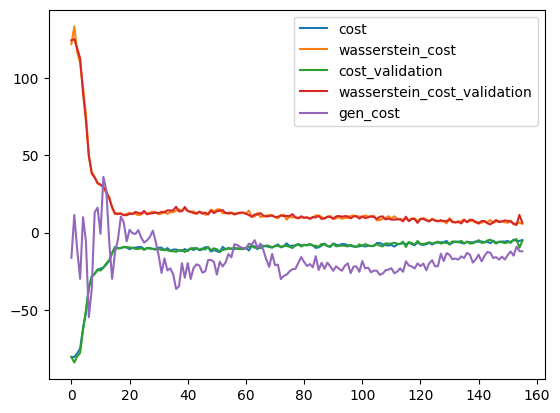

2023-12-30 15:45:10,917 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:45:13,767 - g4gan - INFO - D_self: 247.17
INFO:g4gan:D_self: 247.17
2023-12-30 15:45:13,771 - g4gan - INFO - D_train: 246.55
INFO:g4gan:D_train: 246.55


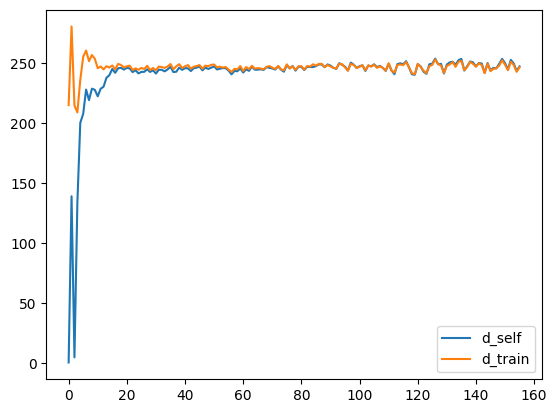

2023-12-30 15:45:14,097 - g4gan - INFO - Epoch: 157/200
INFO:g4gan:Epoch: 157/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:45:43,596 - g4gan - INFO - {'discriminator': [{'cost': -4.549875259399414,
                    'cost_validation': -4.487391948699951,
                    'wasserstein_cost': 5.844979286193848,
                    'wasserstein_cost_validation': 5.753359794616699},
                   {'cost': -4.230766296386719,
                    'cost_validation': -4.899825096130371,
                    'wasserstein_cost': 5.543584823608398,
                    'wasserstein_cost_validation': 5.915741920471191},
                   {'cost': -6.520928382873535,
                    'cost_validation': -6.491849899291992,
                    'wasserstein_cost': 7.677762031555176,
                    'wasse

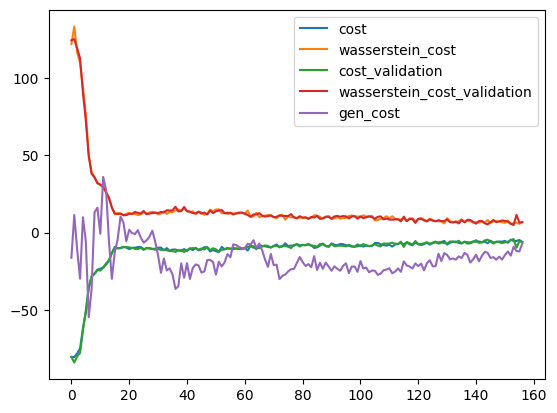

2023-12-30 15:45:43,993 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:45:47,958 - g4gan - INFO - D_self: 242.51
INFO:g4gan:D_self: 242.51
2023-12-30 15:45:47,961 - g4gan - INFO - D_train: 242.3
INFO:g4gan:D_train: 242.3


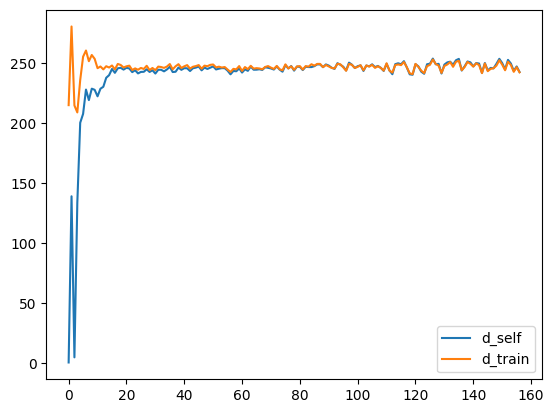

2023-12-30 15:45:48,339 - g4gan - INFO - Epoch: 158/200
INFO:g4gan:Epoch: 158/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:46:17,608 - g4gan - INFO - {'discriminator': [{'cost': -4.1096720695495605,
                    'cost_validation': -4.308517932891846,
                    'wasserstein_cost': 4.861871719360352,
                    'wasserstein_cost_validation': 4.961148738861084},
                   {'cost': -4.7544636726379395,
                    'cost_validation': -4.240519046783447,
                    'wasserstein_cost': 5.631361961364746,
                    'wasserstein_cost_validation': 4.812417984008789},
                   {'cost': -5.76780891418457,
                    'cost_validation': -5.852688789367676,
                    'wasserstein_cost': 6.539435386657715,
                    'wass

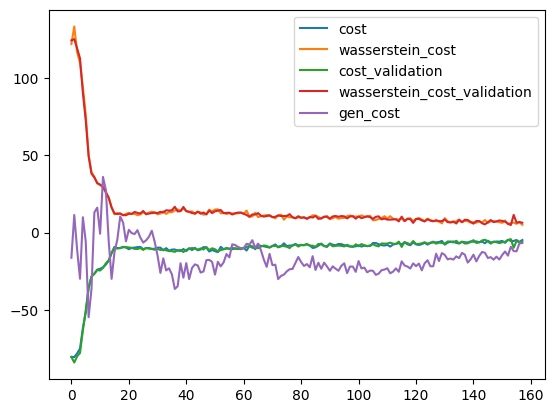

2023-12-30 15:46:17,956 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:46:21,817 - g4gan - INFO - D_self: 242.34
INFO:g4gan:D_self: 242.34
2023-12-30 15:46:21,826 - g4gan - INFO - D_train: 243.21
INFO:g4gan:D_train: 243.21


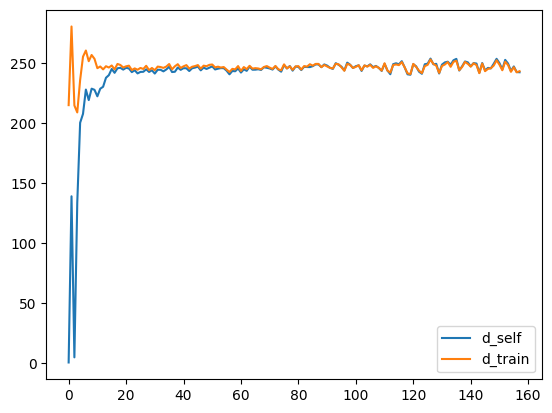

2023-12-30 15:46:22,159 - g4gan - INFO - Epoch: 159/200
INFO:g4gan:Epoch: 159/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:46:51,369 - g4gan - INFO - {'discriminator': [{'cost': -6.509542942047119,
                    'cost_validation': -6.063076019287109,
                    'wasserstein_cost': 8.382345199584961,
                    'wasserstein_cost_validation': 7.953122138977051},
                   {'cost': -5.642498016357422,
                    'cost_validation': -5.45094108581543,
                    'wasserstein_cost': 7.897871971130371,
                    'wasserstein_cost_validation': 7.042599678039551},
                   {'cost': -6.388065338134766,
                    'cost_validation': -5.736754894256592,
                    'wasserstein_cost': 8.275453567504883,
                    'wasser

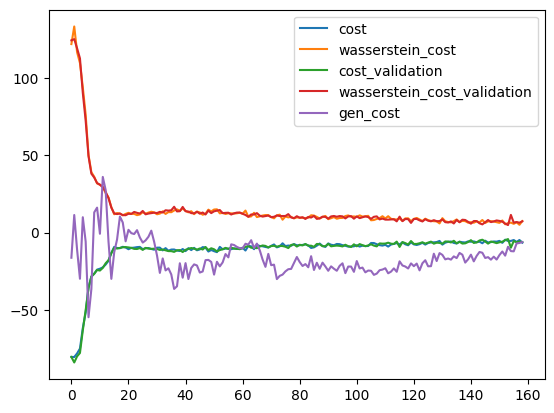

2023-12-30 15:46:51,683 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:46:54,176 - g4gan - INFO - D_self: 247.74
INFO:g4gan:D_self: 247.74
2023-12-30 15:46:54,180 - g4gan - INFO - D_train: 247.39
INFO:g4gan:D_train: 247.39


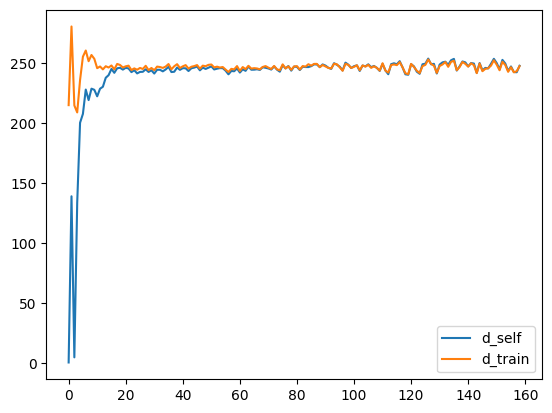

2023-12-30 15:46:54,456 - g4gan - INFO - Epoch: 160/200
INFO:g4gan:Epoch: 160/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:47:23,812 - g4gan - INFO - {'discriminator': [{'cost': -5.988218307495117,
                    'cost_validation': -5.69695520401001,
                    'wasserstein_cost': 7.224007606506348,
                    'wasserstein_cost_validation': 6.561502456665039},
                   {'cost': -6.636335372924805,
                    'cost_validation': -5.263469696044922,
                    'wasserstein_cost': 8.015703201293945,
                    'wasserstein_cost_validation': 6.045136451721191},
                   {'cost': -5.472358703613281,
                    'cost_validation': -5.3340630531311035,
                    'wasserstein_cost': 6.679923057556152,
                    'wasse

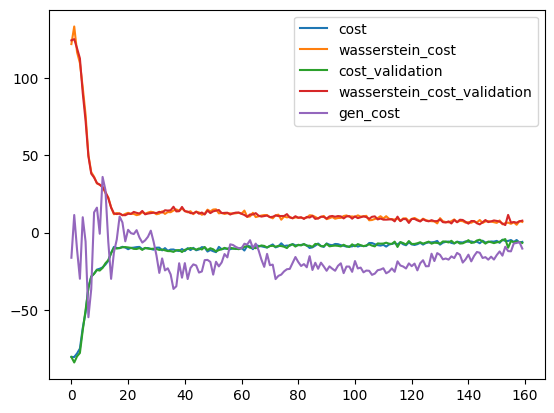

2023-12-30 15:47:24,156 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:47:26,602 - g4gan - INFO - D_self: 248.82
INFO:g4gan:D_self: 248.82
2023-12-30 15:47:26,610 - g4gan - INFO - D_train: 248.43
INFO:g4gan:D_train: 248.43


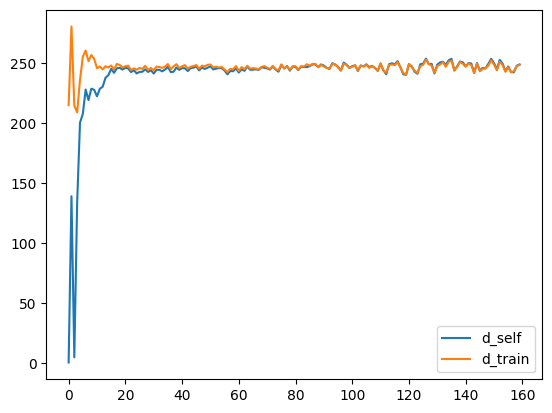

2023-12-30 15:47:26,937 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:47:26,945 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:47:27,033 - g4gan - INFO - Epoch: 161/200
INFO:g4gan:Epoch: 161/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   A   A   T   C   T   T   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   T   T   G   C   G   T   T   G  ...   C   A   C   A   G   A   C   
2    T   T   C   A   G   G   T   G   T   G  ...   A   A   G   G   T   C   T   
3    C   G   C   G   A   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   T   G   T   A   G   A   G  ...   G   A   C   A   G   G   T   
5    A   A   G   T   G   A   G   T   T   C  ...   C   T   G   C   C   G   T   
6    C   A   C   A   C   G   G   C   C   A  ...   G   C   C   G   C   G   G   
7    A   G   C   G   C   G   A   G   A   C  ...   G   G   G   G   C   T   C   
8    C   A   C   G   C   G   C   G   C   T  ...   T   C   T   C   A   A   A   
9    G   G   C   G   G   A   A   G   T   A  ...   A   G   A   T   G   A   G   
10   T   T   G   C   A   C   T   G   G   A  ...   T   T   C   C   A   C   C   
11   G   T   C   G   T   G   T   G   G   A  ...   A 

2023-12-30 15:47:56,448 - g4gan - INFO - {'discriminator': [{'cost': -6.002313613891602,
                    'cost_validation': -5.639143466949463,
                    'wasserstein_cost': 7.195984840393066,
                    'wasserstein_cost_validation': 7.075813293457031},
                   {'cost': -5.117586135864258,
                    'cost_validation': -5.8025102615356445,
                    'wasserstein_cost': 6.333889961242676,
                    'wasserstein_cost_validation': 6.895674705505371},
                   {'cost': -5.126616477966309,
                    'cost_validation': -7.068827152252197,
                    'wasserstein_cost': 6.4886980056762695,
                    'wasserstein_cost_validation': 8.255297660827637},
                   {'cost': -5.800445556640625,
                    'cost_validation': -6.348350524902344,
                    'wasserstein_cost': 7.08489990234375,
                    'wasserstein_cost_validation': 7.658398628234863},
          

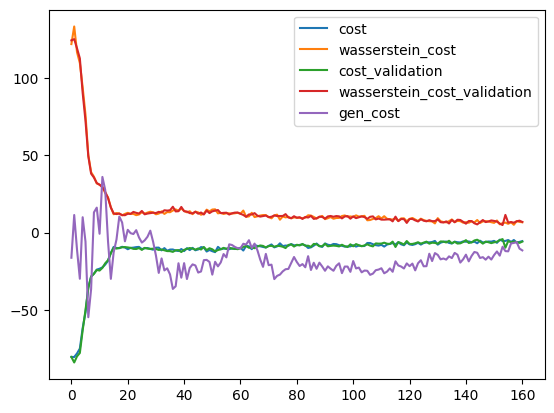

2023-12-30 15:47:56,799 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:47:59,244 - g4gan - INFO - D_self: 242.67
INFO:g4gan:D_self: 242.67
2023-12-30 15:47:59,248 - g4gan - INFO - D_train: 242.97
INFO:g4gan:D_train: 242.97


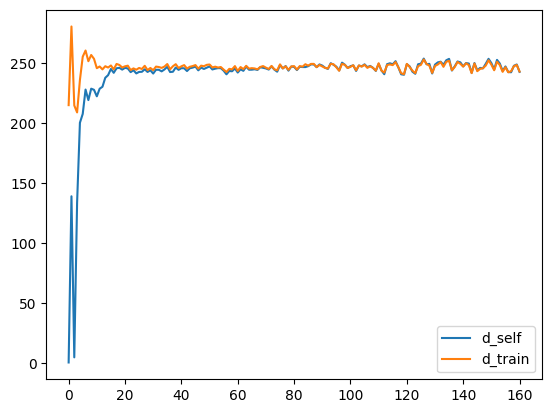

2023-12-30 15:47:59,517 - g4gan - INFO - Epoch: 162/200
INFO:g4gan:Epoch: 162/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:48:28,956 - g4gan - INFO - {'discriminator': [{'cost': -4.2418532371521,
                    'cost_validation': -4.1746015548706055,
                    'wasserstein_cost': 4.973642349243164,
                    'wasserstein_cost_validation': 4.776145935058594},
                   {'cost': -4.474494934082031,
                    'cost_validation': -5.428372383117676,
                    'wasserstein_cost': 5.242645263671875,
                    'wasserstein_cost_validation': 6.1219072341918945},
                   {'cost': -4.9708356857299805,
                    'cost_validation': -4.715909957885742,
                    'wasserstein_cost': 6.092608451843262,
                    'wass

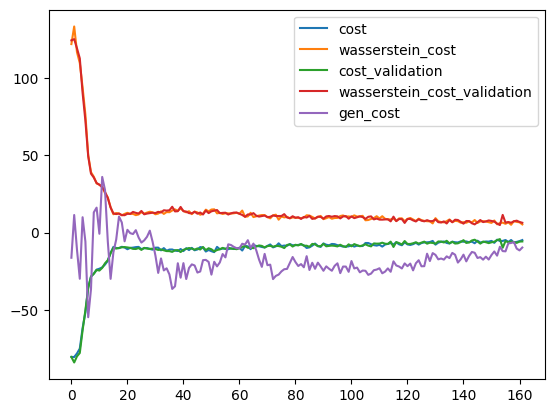

2023-12-30 15:48:29,250 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:48:33,045 - g4gan - INFO - D_self: 240.93
INFO:g4gan:D_self: 240.93
2023-12-30 15:48:33,052 - g4gan - INFO - D_train: 241.92
INFO:g4gan:D_train: 241.92


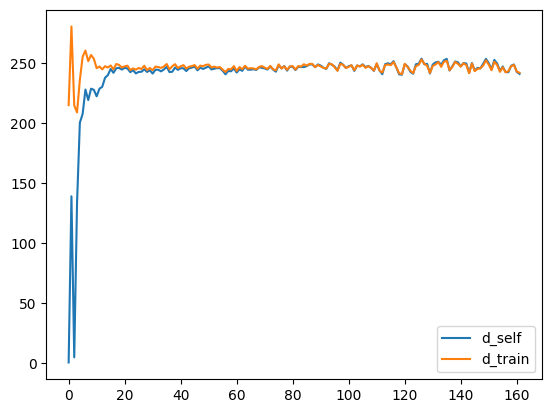

2023-12-30 15:48:33,455 - g4gan - INFO - Epoch: 163/200
INFO:g4gan:Epoch: 163/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:49:02,634 - g4gan - INFO - {'discriminator': [{'cost': -6.02985143661499,
                    'cost_validation': -5.782302379608154,
                    'wasserstein_cost': 7.53413200378418,
                    'wasserstein_cost_validation': 6.834753036499023},
                   {'cost': -5.825189590454102,
                    'cost_validation': -6.37393856048584,
                    'wasserstein_cost': 6.719901084899902,
                    'wasserstein_cost_validation': 7.4561309814453125},
                   {'cost': -5.992192268371582,
                    'cost_validation': -6.160541534423828,
                    'wasserstein_cost': 7.084650039672852,
                    'wassers

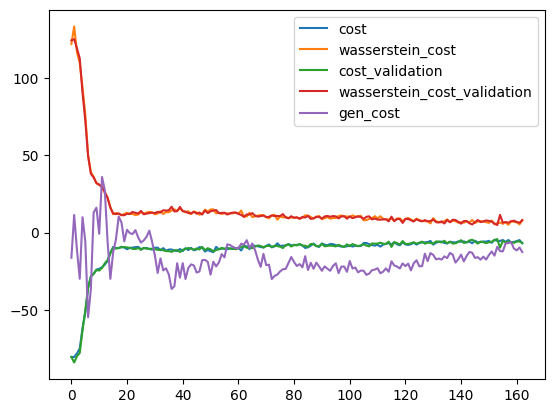

2023-12-30 15:49:02,994 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:49:06,885 - g4gan - INFO - D_self: 241.43
INFO:g4gan:D_self: 241.43
2023-12-30 15:49:06,889 - g4gan - INFO - D_train: 242.03
INFO:g4gan:D_train: 242.03


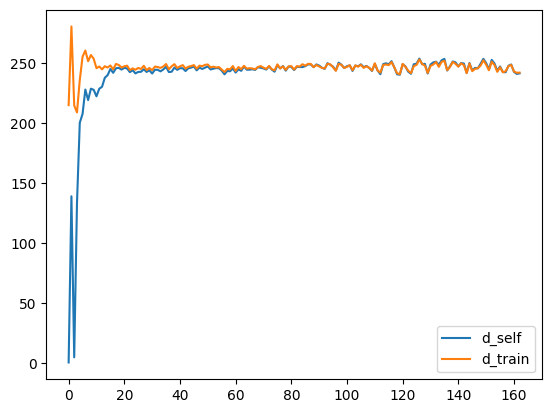

2023-12-30 15:49:07,256 - g4gan - INFO - Epoch: 164/200
INFO:g4gan:Epoch: 164/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:49:36,586 - g4gan - INFO - {'discriminator': [{'cost': -6.0717902183532715,
                    'cost_validation': -5.681954860687256,
                    'wasserstein_cost': 7.230681419372559,
                    'wasserstein_cost_validation': 6.958393096923828},
                   {'cost': -5.377869129180908,
                    'cost_validation': -4.868762969970703,
                    'wasserstein_cost': 6.4772491455078125,
                    'wasserstein_cost_validation': 6.18006706237793},
                   {'cost': -5.859888553619385,
                    'cost_validation': -6.680417537689209,
                    'wasserstein_cost': 7.099767684936523,
                    'wass

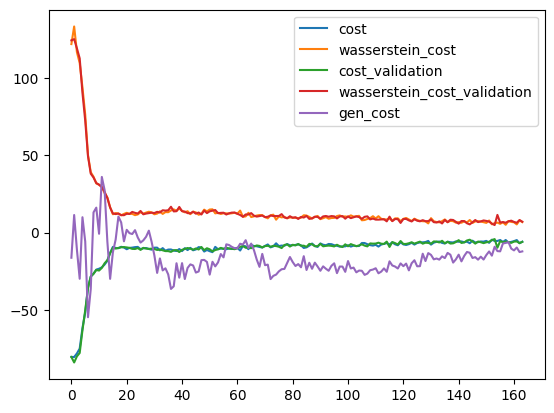

2023-12-30 15:49:36,948 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:49:39,951 - g4gan - INFO - D_self: 251.14
INFO:g4gan:D_self: 251.14
2023-12-30 15:49:39,957 - g4gan - INFO - D_train: 250.11
INFO:g4gan:D_train: 250.11


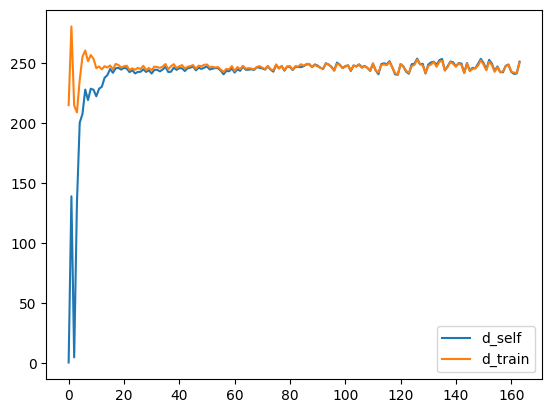

2023-12-30 15:49:40,303 - g4gan - INFO - Epoch: 165/200
INFO:g4gan:Epoch: 165/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:50:09,671 - g4gan - INFO - {'discriminator': [{'cost': -3.4856014251708984,
                    'cost_validation': -4.533908843994141,
                    'wasserstein_cost': 4.3769426345825195,
                    'wasserstein_cost_validation': 5.200300216674805},
                   {'cost': -4.945127487182617,
                    'cost_validation': -4.497414588928223,
                    'wasserstein_cost': 5.551929950714111,
                    'wasserstein_cost_validation': 5.581265449523926},
                   {'cost': -5.267727851867676,
                    'cost_validation': -5.046051025390625,
                    'wasserstein_cost': 6.107305526733398,
                    'was

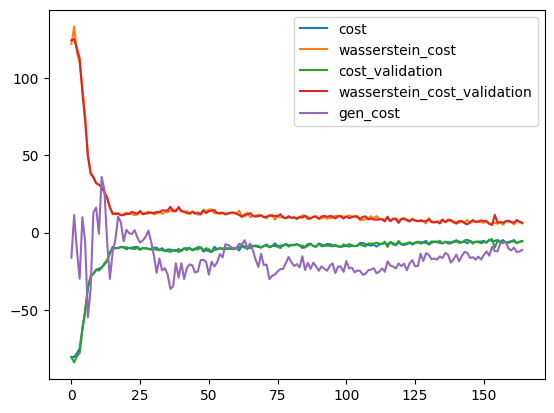

2023-12-30 15:50:10,006 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:50:12,473 - g4gan - INFO - D_self: 247.69
INFO:g4gan:D_self: 247.69
2023-12-30 15:50:12,477 - g4gan - INFO - D_train: 249.2
INFO:g4gan:D_train: 249.2


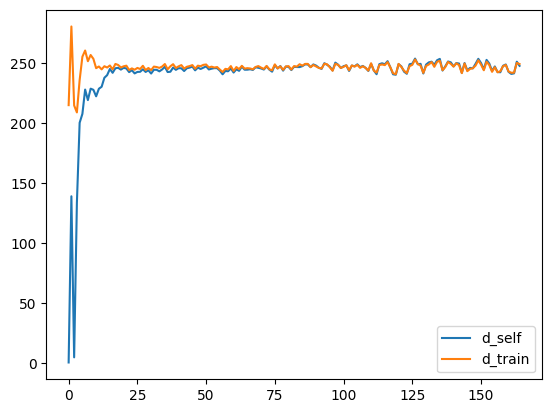

2023-12-30 15:50:13,162 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:50:13,175 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:50:13,273 - g4gan - INFO - Epoch: 166/200
INFO:g4gan:Epoch: 166/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   A   A   T   G   T   T   C   T   T  ...   A   A   G   G   G   C   T   
1    A   C   T   T   G   C   G   T   A   G  ...   C   A   C   A   C   A   C   
2    T   T   C   A   G   G   T   G   T   G  ...   A   A   G   G   T   C   T   
3    C   G   G   G   A   G   C   C   C   C  ...   A   C   C   C   A   G   T   
4    G   A   A   A   G   T   A   G   A   G  ...   G   A   C   A   G   G   T   
5    A   A   G   T   G   A   G   T   T   C  ...   C   T   G   C   C   G   A   
6    C   A   C   A   C   G   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   C   G   C   G   A   G   A   C  ...   G   G   G   G   C   T   C   
8    C   A   C   T   C   G   C   G   C   T  ...   T   C   T   C   A   A   A   
9    G   G   C   G   G   A   A   G   A   A  ...   A   G   A   A   G   A   G   
10   T   T   G   C   A   C   T   G   G   A  ...   T   T   C   C   A   C   C   
11   T   T   C   C   A   G   T   G   G   A  ...   A 

2023-12-30 15:50:42,737 - g4gan - INFO - {'discriminator': [{'cost': -5.305726051330566,
                    'cost_validation': -5.388428688049316,
                    'wasserstein_cost': 5.872026443481445,
                    'wasserstein_cost_validation': 6.371496200561523},
                   {'cost': -5.979506492614746,
                    'cost_validation': -5.228175640106201,
                    'wasserstein_cost': 6.736204147338867,
                    'wasserstein_cost_validation': 5.898065567016602},
                   {'cost': -4.999030590057373,
                    'cost_validation': -6.730571746826172,
                    'wasserstein_cost': 5.8563127517700195,
                    'wasserstein_cost_validation': 8.12104320526123},
                   {'cost': -4.774947643280029,
                    'cost_validation': -5.946877479553223,
                    'wasserstein_cost': 5.666217803955078,
                    'wasserstein_cost_validation': 7.233412742614746},
           

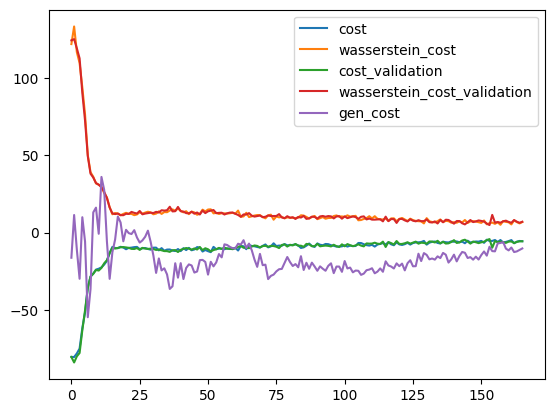

2023-12-30 15:50:43,031 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:50:45,517 - g4gan - INFO - D_self: 246.69
INFO:g4gan:D_self: 246.69
2023-12-30 15:50:45,524 - g4gan - INFO - D_train: 245.57
INFO:g4gan:D_train: 245.57


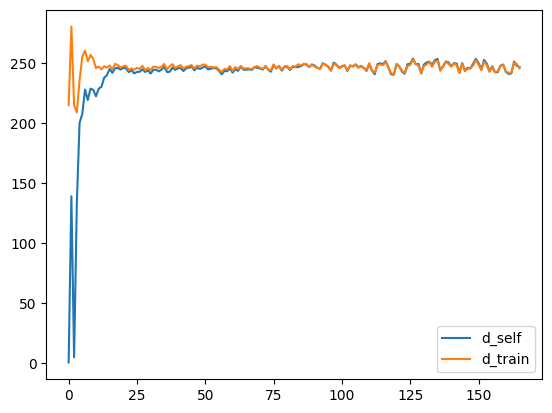

2023-12-30 15:50:45,831 - g4gan - INFO - Epoch: 167/200
INFO:g4gan:Epoch: 167/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:51:15,165 - g4gan - INFO - {'discriminator': [{'cost': -5.851933479309082,
                    'cost_validation': -6.1974568367004395,
                    'wasserstein_cost': 6.81486701965332,
                    'wasserstein_cost_validation': 7.193815231323242},
                   {'cost': -5.763617515563965,
                    'cost_validation': -6.616003036499023,
                    'wasserstein_cost': 6.666930198669434,
                    'wasserstein_cost_validation': 7.779594421386719},
                   {'cost': -6.717658996582031,
                    'cost_validation': -5.972667217254639,
                    'wasserstein_cost': 7.817417144775391,
                    'wasse

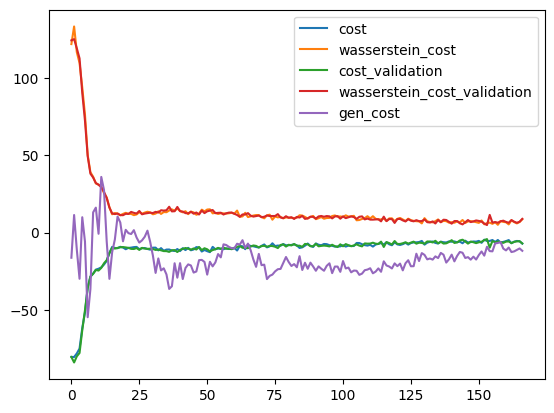

2023-12-30 15:51:15,467 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:51:19,097 - g4gan - INFO - D_self: 251.77
INFO:g4gan:D_self: 251.77
2023-12-30 15:51:19,101 - g4gan - INFO - D_train: 250.23
INFO:g4gan:D_train: 250.23


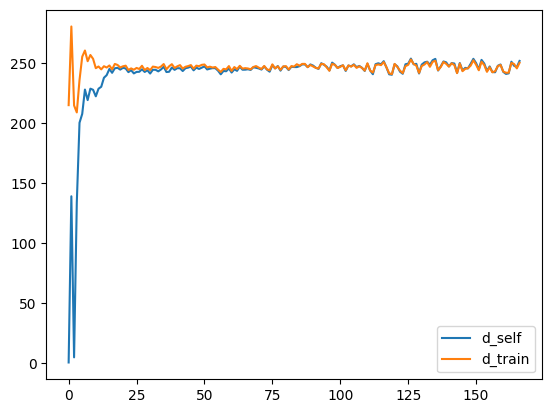

2023-12-30 15:51:19,409 - g4gan - INFO - Epoch: 168/200
INFO:g4gan:Epoch: 168/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:51:48,829 - g4gan - INFO - {'discriminator': [{'cost': -4.981967926025391,
                    'cost_validation': -5.217955589294434,
                    'wasserstein_cost': 5.914253234863281,
                    'wasserstein_cost_validation': 6.35308837890625},
                   {'cost': -4.934342861175537,
                    'cost_validation': -5.477831840515137,
                    'wasserstein_cost': 5.783843994140625,
                    'wasserstein_cost_validation': 6.412445068359375},
                   {'cost': -5.128521919250488,
                    'cost_validation': -4.378794193267822,
                    'wasserstein_cost': 6.117094039916992,
                    'wasser

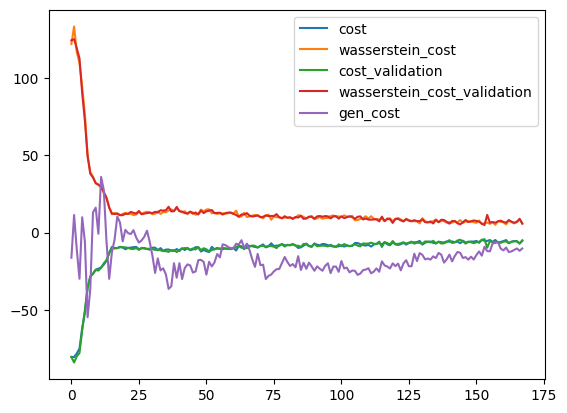

2023-12-30 15:51:49,264 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:51:53,336 - g4gan - INFO - D_self: 248.88
INFO:g4gan:D_self: 248.88
2023-12-30 15:51:53,340 - g4gan - INFO - D_train: 248.67
INFO:g4gan:D_train: 248.67


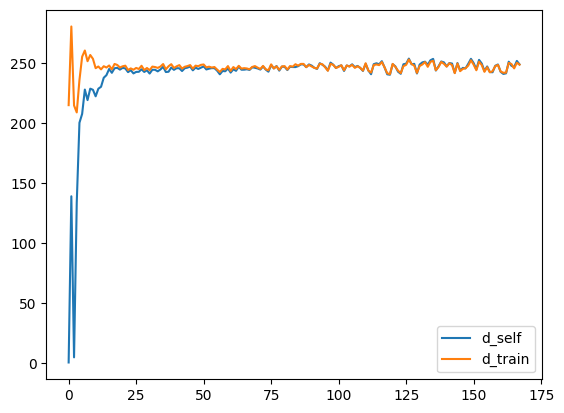

2023-12-30 15:51:53,679 - g4gan - INFO - Epoch: 169/200
INFO:g4gan:Epoch: 169/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:52:22,978 - g4gan - INFO - {'discriminator': [{'cost': -5.170751094818115,
                    'cost_validation': -5.798819541931152,
                    'wasserstein_cost': 6.234424114227295,
                    'wasserstein_cost_validation': 7.097454071044922},
                   {'cost': -5.206470966339111,
                    'cost_validation': -5.470623016357422,
                    'wasserstein_cost': 6.349148750305176,
                    'wasserstein_cost_validation': 6.764340400695801},
                   {'cost': -4.62185525894165,
                    'cost_validation': -6.066754341125488,
                    'wasserstein_cost': 5.899752616882324,
                    'wasser

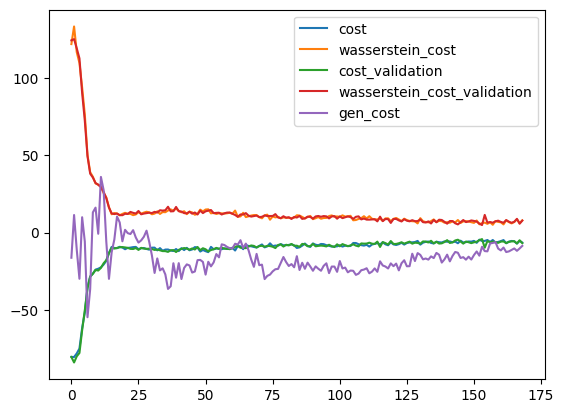

2023-12-30 15:52:23,363 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:52:26,183 - g4gan - INFO - D_self: 250.62
INFO:g4gan:D_self: 250.62
2023-12-30 15:52:26,188 - g4gan - INFO - D_train: 250.15
INFO:g4gan:D_train: 250.15


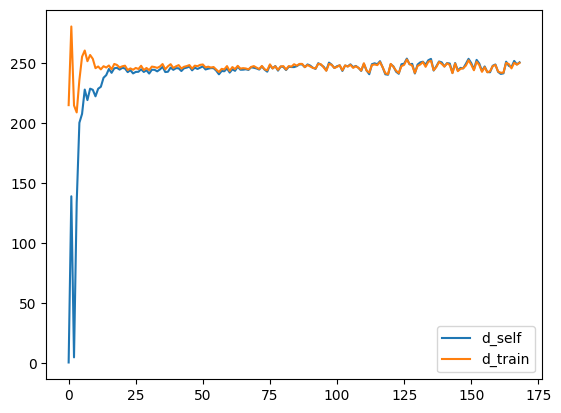

2023-12-30 15:52:26,442 - g4gan - INFO - Epoch: 170/200
INFO:g4gan:Epoch: 170/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:52:55,777 - g4gan - INFO - {'discriminator': [{'cost': -5.35102653503418,
                    'cost_validation': -6.154897212982178,
                    'wasserstein_cost': 6.475500106811523,
                    'wasserstein_cost_validation': 7.000091552734375},
                   {'cost': -5.836614608764648,
                    'cost_validation': -6.608615875244141,
                    'wasserstein_cost': 6.508550643920898,
                    'wasserstein_cost_validation': 7.965512275695801},
                   {'cost': -5.7138590812683105,
                    'cost_validation': -6.605254173278809,
                    'wasserstein_cost': 6.324481964111328,
                    'wasse

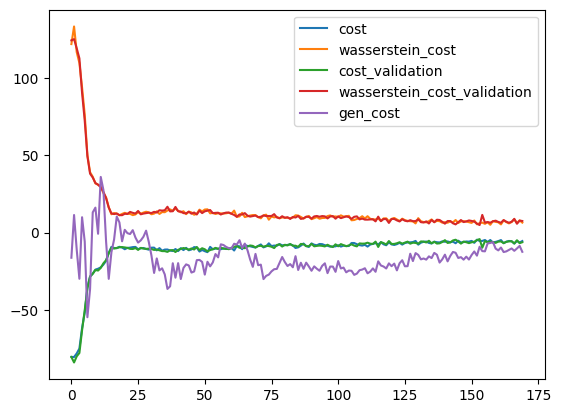

2023-12-30 15:52:56,127 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:52:58,573 - g4gan - INFO - D_self: 252.56
INFO:g4gan:D_self: 252.56
2023-12-30 15:52:58,577 - g4gan - INFO - D_train: 251.85
INFO:g4gan:D_train: 251.85


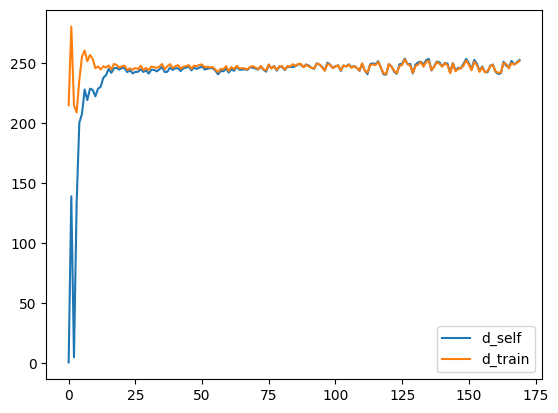

2023-12-30 15:52:58,894 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:52:58,903 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:52:58,988 - g4gan - INFO - Epoch: 171/200
INFO:g4gan:Epoch: 171/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   A   A   T   G   T   T   C   T   T  ...   A   A   G   T   G   C   T   
1    A   C   T   T   G   C   G   T   A   G  ...   C   A   C   A   C   A   C   
2    T   T   C   A   G   G   T   G   T   G  ...   A   A   G   T   T   C   T   
3    C   G   G   G   A   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   T   G   T   A   G   A   G  ...   T   A   C   A   C   G   T   
5    A   A   G   T   G   A   G   T   T   C  ...   C   T   G   C   C   G   T   
6    C   A   C   A   C   G   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   C   C   C   G   A   G   T   C  ...   G   G   G   G   C   T   C   
8    C   T   C   T   C   G   C   G   C   T  ...   T   C   T   C   T   A   A   
9    G   G   C   G   G   A   A   G   T   A  ...   A   C   A   T   T   A   G   
10   T   T   G   C   A   C   T   C   G   A  ...   A   T   C   C   A   C   C   
11   T   T   C   C   T   G   T   G   G   A  ...   A 

2023-12-30 15:53:28,537 - g4gan - INFO - {'discriminator': [{'cost': -5.694361686706543,
                    'cost_validation': -5.276908874511719,
                    'wasserstein_cost': 6.745113372802734,
                    'wasserstein_cost_validation': 5.992885589599609},
                   {'cost': -5.812281131744385,
                    'cost_validation': -5.471360683441162,
                    'wasserstein_cost': 6.867251396179199,
                    'wasserstein_cost_validation': 6.798429489135742},
                   {'cost': -5.2362380027771,
                    'cost_validation': -5.494083404541016,
                    'wasserstein_cost': 6.041707992553711,
                    'wasserstein_cost_validation': 6.477214813232422},
                   {'cost': -5.781725883483887,
                    'cost_validation': -5.8153886795043945,
                    'wasserstein_cost': 6.739452362060547,
                    'wasserstein_cost_validation': 6.64794921875},
                

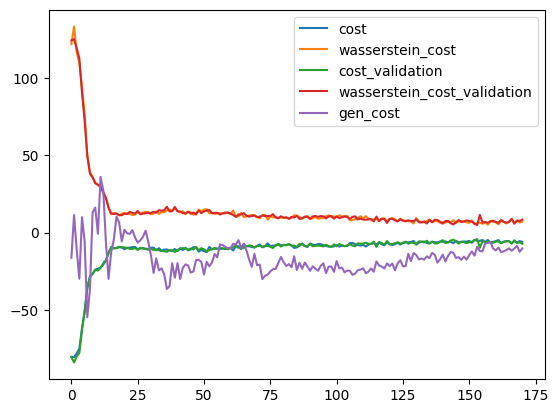

2023-12-30 15:53:28,873 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:53:31,388 - g4gan - INFO - D_self: 248.85
INFO:g4gan:D_self: 248.85
2023-12-30 15:53:31,392 - g4gan - INFO - D_train: 247.84
INFO:g4gan:D_train: 247.84


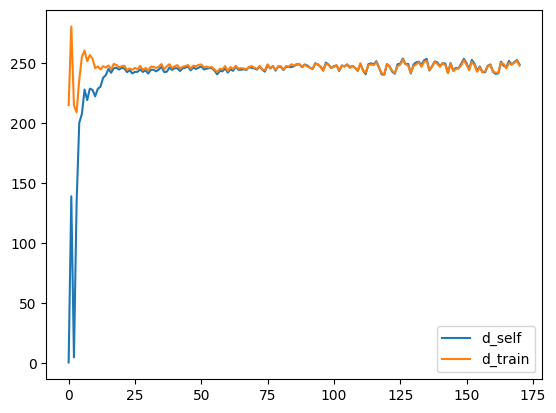

2023-12-30 15:53:31,642 - g4gan - INFO - Epoch: 172/200
INFO:g4gan:Epoch: 172/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:54:01,123 - g4gan - INFO - {'discriminator': [{'cost': -4.3304338455200195,
                    'cost_validation': -5.182610988616943,
                    'wasserstein_cost': 5.012386322021484,
                    'wasserstein_cost_validation': 6.0603485107421875},
                   {'cost': -4.7439446449279785,
                    'cost_validation': -5.592724800109863,
                    'wasserstein_cost': 5.619378089904785,
                    'wasserstein_cost_validation': 6.782414436340332},
                   {'cost': -4.806040287017822,
                    'cost_validation': -4.1150031089782715,
                    'wasserstein_cost': 5.719562530517578,
                    'w

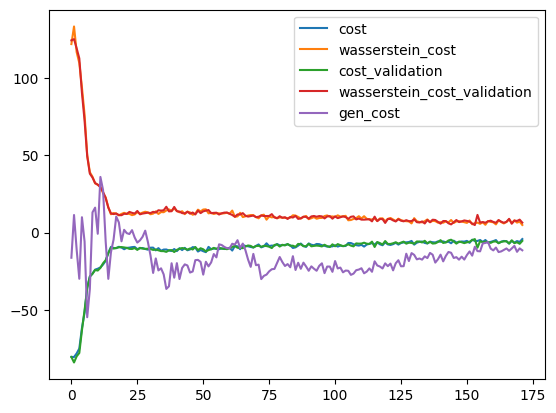

2023-12-30 15:54:01,466 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:54:05,255 - g4gan - INFO - D_self: 249.58
INFO:g4gan:D_self: 249.58
2023-12-30 15:54:05,260 - g4gan - INFO - D_train: 249.3
INFO:g4gan:D_train: 249.3


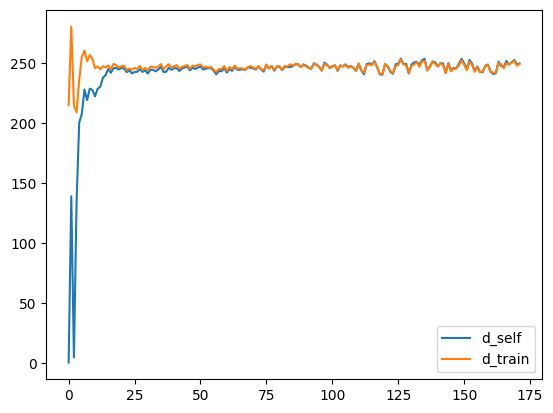

2023-12-30 15:54:05,643 - g4gan - INFO - Epoch: 173/200
INFO:g4gan:Epoch: 173/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:54:34,987 - g4gan - INFO - {'discriminator': [{'cost': -5.815382957458496,
                    'cost_validation': -4.31347131729126,
                    'wasserstein_cost': 7.075592994689941,
                    'wasserstein_cost_validation': 5.250958442687988},
                   {'cost': -5.459270000457764,
                    'cost_validation': -5.29087495803833,
                    'wasserstein_cost': 6.463369369506836,
                    'wasserstein_cost_validation': 6.209977149963379},
                   {'cost': -4.464888572692871,
                    'cost_validation': -5.115740776062012,
                    'wasserstein_cost': 5.444171905517578,
                    'wassers

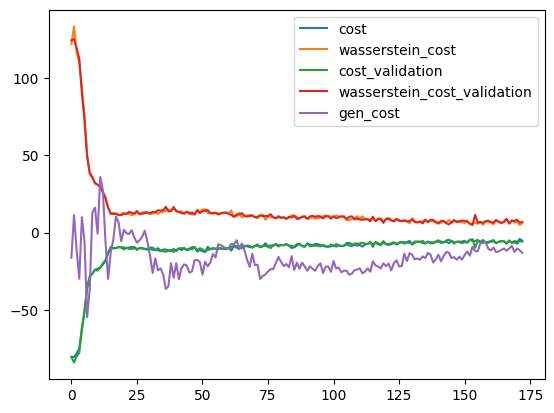

2023-12-30 15:54:35,371 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:54:39,367 - g4gan - INFO - D_self: 250.8
INFO:g4gan:D_self: 250.8
2023-12-30 15:54:39,371 - g4gan - INFO - D_train: 250.02
INFO:g4gan:D_train: 250.02


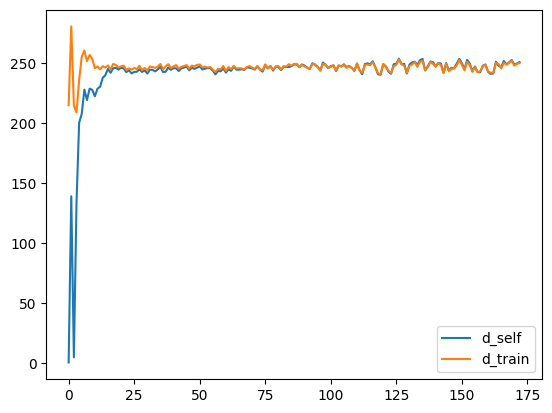

2023-12-30 15:54:39,742 - g4gan - INFO - Epoch: 174/200
INFO:g4gan:Epoch: 174/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:55:09,147 - g4gan - INFO - {'discriminator': [{'cost': -4.872633934020996,
                    'cost_validation': -4.8591742515563965,
                    'wasserstein_cost': 5.750811576843262,
                    'wasserstein_cost_validation': 6.419070243835449},
                   {'cost': -5.720256328582764,
                    'cost_validation': -5.265233993530273,
                    'wasserstein_cost': 6.791647911071777,
                    'wasserstein_cost_validation': 6.559490203857422},
                   {'cost': -5.059072494506836,
                    'cost_validation': -5.6960015296936035,
                    'wasserstein_cost': 6.061851501464844,
                    'was

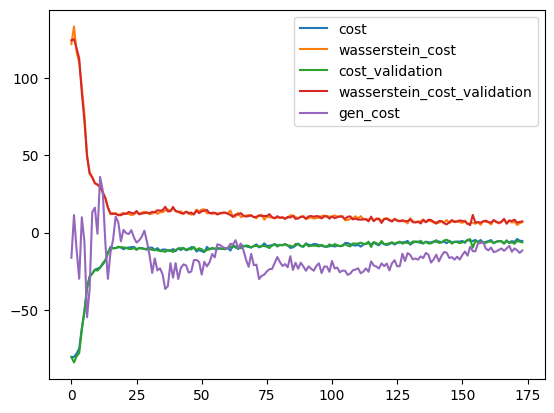

2023-12-30 15:55:09,531 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:55:12,068 - g4gan - INFO - D_self: 246.39
INFO:g4gan:D_self: 246.39
2023-12-30 15:55:12,074 - g4gan - INFO - D_train: 247.02
INFO:g4gan:D_train: 247.02


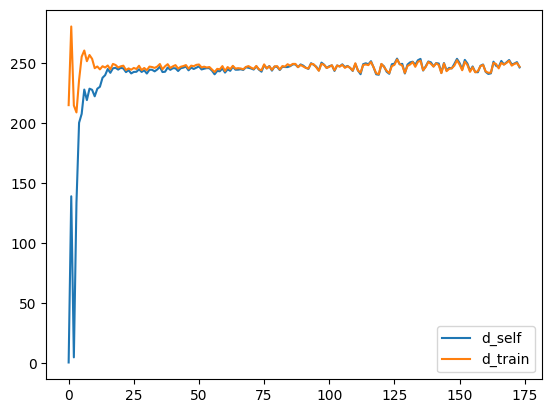

2023-12-30 15:55:12,360 - g4gan - INFO - Epoch: 175/200
INFO:g4gan:Epoch: 175/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:55:41,649 - g4gan - INFO - {'discriminator': [{'cost': -5.123848915100098,
                    'cost_validation': -4.664664268493652,
                    'wasserstein_cost': 6.244205474853516,
                    'wasserstein_cost_validation': 5.610300064086914},
                   {'cost': -5.3694353103637695,
                    'cost_validation': -5.717533111572266,
                    'wasserstein_cost': 6.35237979888916,
                    'wasserstein_cost_validation': 6.360567092895508},
                   {'cost': -4.907230854034424,
                    'cost_validation': -4.12076473236084,
                    'wasserstein_cost': 6.032756805419922,
                    'wasser

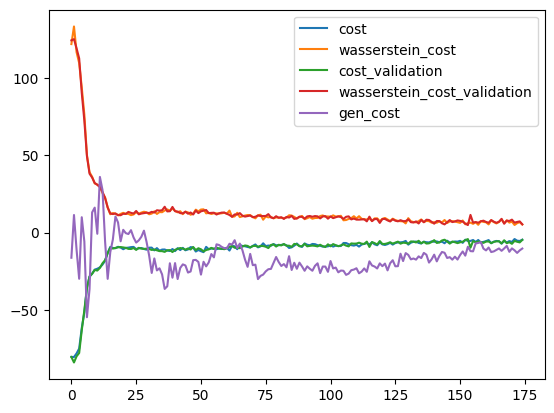

2023-12-30 15:55:41,926 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:55:44,490 - g4gan - INFO - D_self: 245.58
INFO:g4gan:D_self: 245.58
2023-12-30 15:55:44,494 - g4gan - INFO - D_train: 245.82
INFO:g4gan:D_train: 245.82


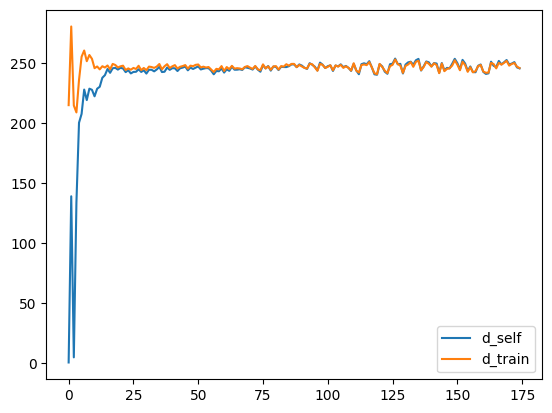

2023-12-30 15:55:44,803 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:55:44,814 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:55:44,906 - g4gan - INFO - Epoch: 176/200
INFO:g4gan:Epoch: 176/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   A   A   T   G   T   G   C   T   T  ...   A   A   G   G   G   C   G   
1    A   C   T   T   G   C   G   T   T   G  ...   C   A   C   T   C   A   C   
2    G   T   C   A   G   G   G   G   A   G  ...   A   A   G   T   T   C   T   
3    C   G   C   G   A   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   A   G   T   A   G   A   G  ...   G   A   C   A   C   G   A   
5    A   A   G   T   G   A   G   T   G   C  ...   C   T   G   C   C   G   T   
6    C   A   C   A   C   G   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   G   C   C   G   T   G   T   C  ...   G   G   G   G   C   T   C   
8    C   T   C   T   C   G   C   G   C   G  ...   T   C   T   C   A   A   A   
9    G   G   C   G   G   G   A   G   T   T  ...   A   C   A   T   T   A   G   
10   G   T   G   C   T   C   T   G   G   A  ...   A   T   C   C   A   C   C   
11   T   T   C   C   T   G   T   G   G   A  ...   A 

2023-12-30 15:56:14,580 - g4gan - INFO - {'discriminator': [{'cost': -5.23607873916626,
                    'cost_validation': -4.8770551681518555,
                    'wasserstein_cost': 6.453031539916992,
                    'wasserstein_cost_validation': 6.002346992492676},
                   {'cost': -4.7975544929504395,
                    'cost_validation': -3.640554904937744,
                    'wasserstein_cost': 5.99873161315918,
                    'wasserstein_cost_validation': 4.8067626953125},
                   {'cost': -4.313591003417969,
                    'cost_validation': -5.771979331970215,
                    'wasserstein_cost': 5.426342964172363,
                    'wasserstein_cost_validation': 6.641851425170898},
                   {'cost': -4.874514579772949,
                    'cost_validation': -5.102634429931641,
                    'wasserstein_cost': 6.032533645629883,
                    'wasserstein_cost_validation': 5.919604301452637},
             

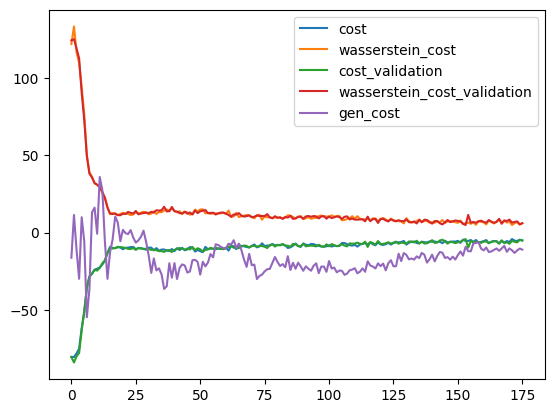

2023-12-30 15:56:14,914 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:56:17,446 - g4gan - INFO - D_self: 244.93
INFO:g4gan:D_self: 244.93
2023-12-30 15:56:17,451 - g4gan - INFO - D_train: 245.25
INFO:g4gan:D_train: 245.25


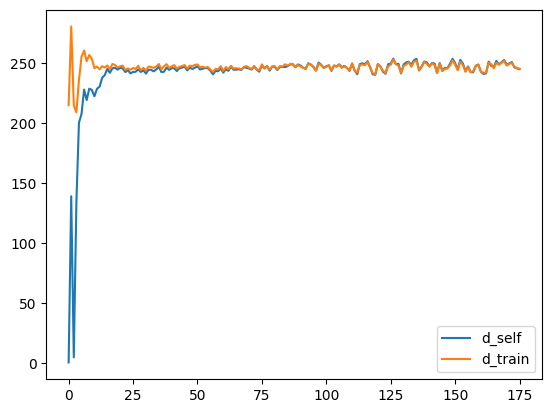

2023-12-30 15:56:17,779 - g4gan - INFO - Epoch: 177/200
INFO:g4gan:Epoch: 177/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:56:47,322 - g4gan - INFO - {'discriminator': [{'cost': -4.672106742858887,
                    'cost_validation': -4.9923882484436035,
                    'wasserstein_cost': 5.547723770141602,
                    'wasserstein_cost_validation': 6.707843780517578},
                   {'cost': -4.754377365112305,
                    'cost_validation': -5.970847129821777,
                    'wasserstein_cost': 5.653254508972168,
                    'wasserstein_cost_validation': 7.0349273681640625},
                   {'cost': -5.0563154220581055,
                    'cost_validation': -6.1035871505737305,
                    'wasserstein_cost': 6.182553291320801,
                    'w

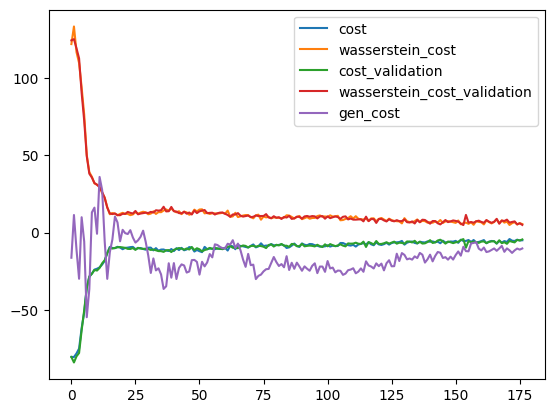

2023-12-30 15:56:47,673 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:56:51,550 - g4gan - INFO - D_self: 243.02
INFO:g4gan:D_self: 243.02
2023-12-30 15:56:51,557 - g4gan - INFO - D_train: 243.67
INFO:g4gan:D_train: 243.67


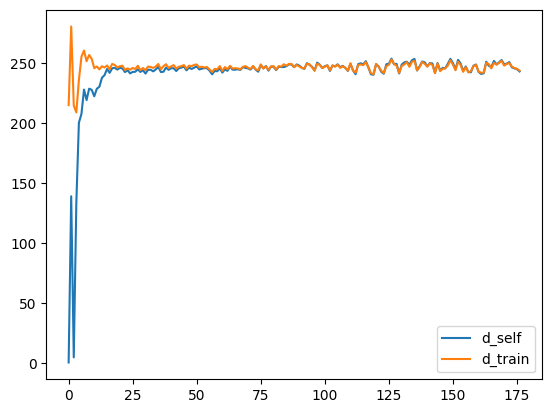

2023-12-30 15:56:51,910 - g4gan - INFO - Epoch: 178/200
INFO:g4gan:Epoch: 178/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:57:21,120 - g4gan - INFO - {'discriminator': [{'cost': -5.444221496582031,
                    'cost_validation': -5.1635589599609375,
                    'wasserstein_cost': 6.073711395263672,
                    'wasserstein_cost_validation': 6.025310516357422},
                   {'cost': -5.482867240905762,
                    'cost_validation': -5.805441379547119,
                    'wasserstein_cost': 6.398516654968262,
                    'wasserstein_cost_validation': 6.991904258728027},
                   {'cost': -4.662774085998535,
                    'cost_validation': -5.379148483276367,
                    'wasserstein_cost': 5.491437911987305,
                    'wass

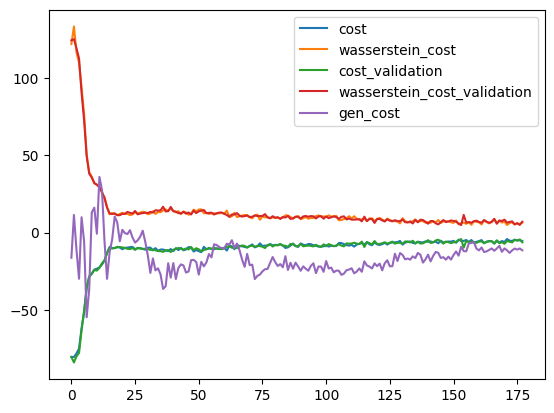

2023-12-30 15:57:21,504 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:57:25,570 - g4gan - INFO - D_self: 246.61
INFO:g4gan:D_self: 246.61
2023-12-30 15:57:25,574 - g4gan - INFO - D_train: 246.02
INFO:g4gan:D_train: 246.02


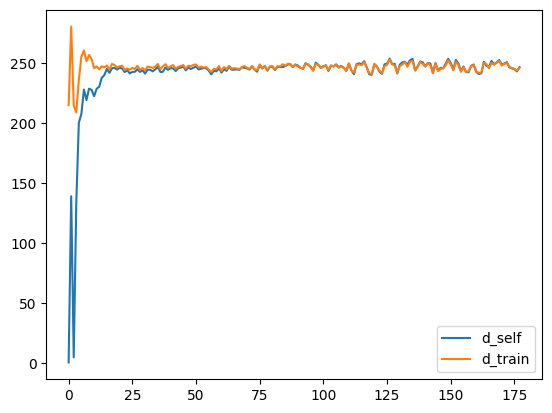

2023-12-30 15:57:25,902 - g4gan - INFO - Epoch: 179/200
INFO:g4gan:Epoch: 179/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:57:56,219 - g4gan - INFO - {'discriminator': [{'cost': -3.66352915763855,
                    'cost_validation': -2.5606558322906494,
                    'wasserstein_cost': 5.775617599487305,
                    'wasserstein_cost_validation': 3.5429306030273438},
                   {'cost': -3.312729597091675,
                    'cost_validation': -3.2987473011016846,
                    'wasserstein_cost': 4.327027320861816,
                    'wasserstein_cost_validation': 4.164710998535156},
                   {'cost': -4.023706912994385,
                    'cost_validation': -4.317901134490967,
                    'wasserstein_cost': 4.892332077026367,
                    'was

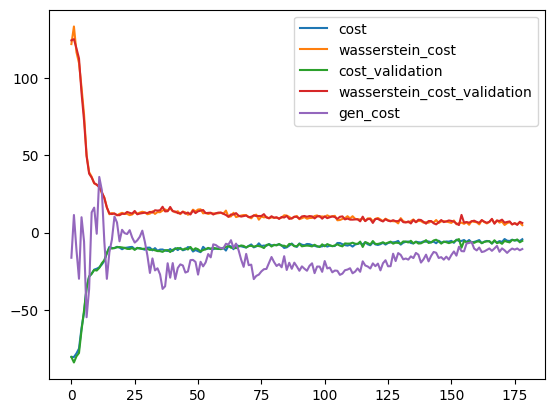

2023-12-30 15:57:56,568 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:57:59,064 - g4gan - INFO - D_self: 249.32
INFO:g4gan:D_self: 249.32
2023-12-30 15:57:59,072 - g4gan - INFO - D_train: 248.1
INFO:g4gan:D_train: 248.1


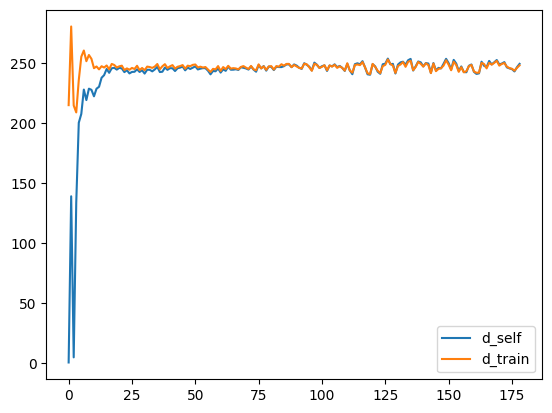

2023-12-30 15:57:59,372 - g4gan - INFO - Epoch: 180/200
INFO:g4gan:Epoch: 180/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:58:28,822 - g4gan - INFO - {'discriminator': [{'cost': -3.8672115802764893,
                    'cost_validation': -4.9943132400512695,
                    'wasserstein_cost': 4.854961395263672,
                    'wasserstein_cost_validation': 5.738903045654297},
                   {'cost': -4.717182636260986,
                    'cost_validation': -6.050210952758789,
                    'wasserstein_cost': 5.931607246398926,
                    'wasserstein_cost_validation': 6.971147537231445},
                   {'cost': -4.0713911056518555,
                    'cost_validation': -4.4698944091796875,
                    'wasserstein_cost': 4.806467056274414,
                    'w

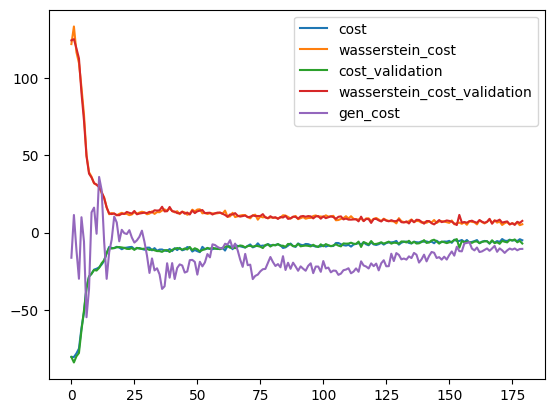

2023-12-30 15:58:29,148 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:58:31,712 - g4gan - INFO - D_self: 247.22
INFO:g4gan:D_self: 247.22
2023-12-30 15:58:31,716 - g4gan - INFO - D_train: 246.67
INFO:g4gan:D_train: 246.67


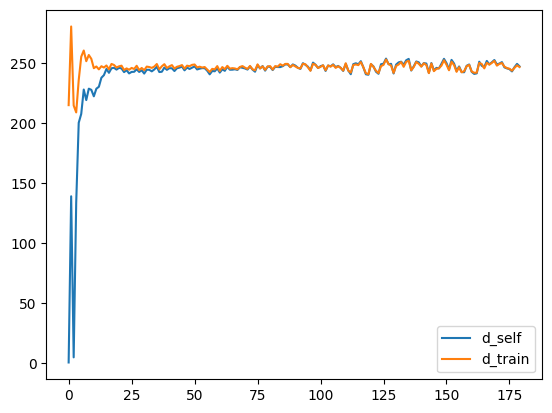

2023-12-30 15:58:32,032 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 15:58:32,039 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 15:58:32,129 - g4gan - INFO - Epoch: 181/200
INFO:g4gan:Epoch: 181/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   A   T   G   T   G   C   C   T  ...   A   A   G   T   G   C   G   
1    A   C   T   T   G   C   G   T   T   G  ...   C   A   C   T   C   A   C   
2    G   T   C   A   G   G   G   G   T   G  ...   A   A   G   T   T   C   T   
3    C   G   C   G   A   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   T   G   T   A   C   A   G  ...   G   A   C   A   C   G   A   
5    A   A   G   T   G   T   G   T   T   C  ...   C   T   G   C   C   G   T   
6    C   T   C   A   C   G   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   G   C   C   G   T   G   T   C  ...   G   G   G   G   C   T   C   
8    C   T   C   T   C   G   C   G   C   T  ...   T   C   T   C   A   A   A   
9    G   G   C   G   G   T   A   G   T   T  ...   A   C   T   T   T   T   G   
10   T   T   G   C   A   C   T   C   G   A  ...   A   T   C   C   A   C   C   
11   T   T   C   C   T   G   T   G   G   A  ...   A 

2023-12-30 15:59:01,634 - g4gan - INFO - {'discriminator': [{'cost': -4.14705753326416,
                    'cost_validation': -4.127322196960449,
                    'wasserstein_cost': 4.869189262390137,
                    'wasserstein_cost_validation': 4.63531494140625},
                   {'cost': -4.934988021850586,
                    'cost_validation': -4.796205520629883,
                    'wasserstein_cost': 5.598259449005127,
                    'wasserstein_cost_validation': 5.412327766418457},
                   {'cost': -5.524320125579834,
                    'cost_validation': -5.671250343322754,
                    'wasserstein_cost': 6.1976447105407715,
                    'wasserstein_cost_validation': 6.64163875579834},
                   {'cost': -5.50169563293457,
                    'cost_validation': -5.405490875244141,
                    'wasserstein_cost': 6.380414962768555,
                    'wasserstein_cost_validation': 6.414868354797363},
              

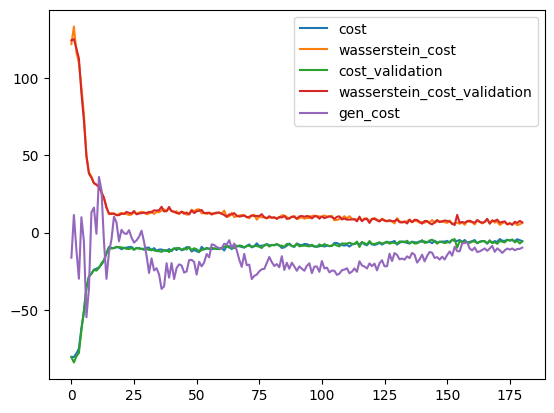

2023-12-30 15:59:01,974 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:59:04,972 - g4gan - INFO - D_self: 250.26
INFO:g4gan:D_self: 250.26
2023-12-30 15:59:04,978 - g4gan - INFO - D_train: 249.66
INFO:g4gan:D_train: 249.66


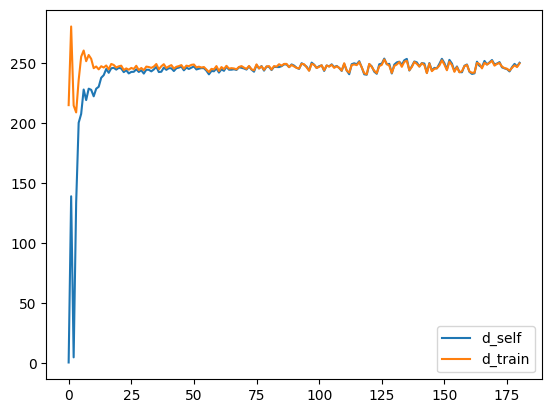

2023-12-30 15:59:05,345 - g4gan - INFO - Epoch: 182/200
INFO:g4gan:Epoch: 182/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 15:59:34,664 - g4gan - INFO - {'discriminator': [{'cost': -4.328962326049805,
                    'cost_validation': -4.658316612243652,
                    'wasserstein_cost': 5.4487762451171875,
                    'wasserstein_cost_validation': 5.216955184936523},
                   {'cost': -4.045668601989746,
                    'cost_validation': -5.117431163787842,
                    'wasserstein_cost': 4.451638221740723,
                    'wasserstein_cost_validation': 5.6794586181640625},
                   {'cost': -6.070484161376953,
                    'cost_validation': -5.833932876586914,
                    'wasserstein_cost': 6.666097640991211,
                    'was

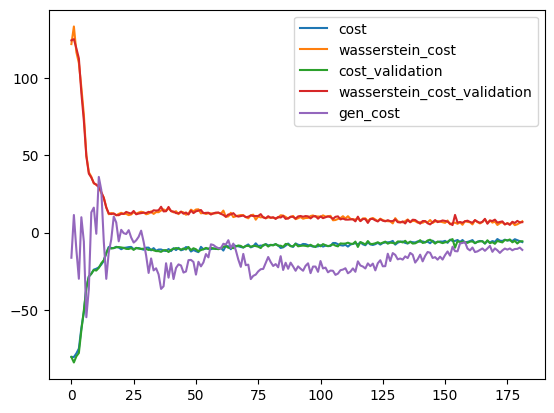

2023-12-30 15:59:34,992 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 15:59:38,983 - g4gan - INFO - D_self: 247.21
INFO:g4gan:D_self: 247.21
2023-12-30 15:59:38,992 - g4gan - INFO - D_train: 246.57
INFO:g4gan:D_train: 246.57


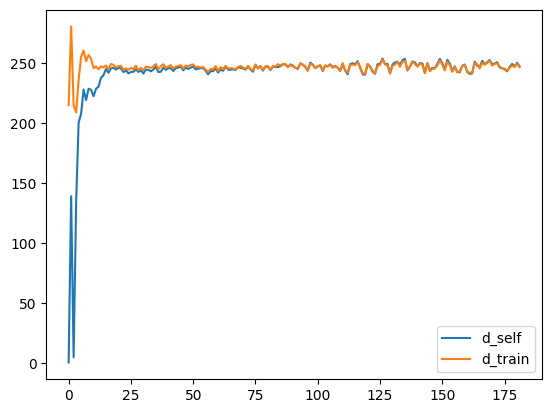

2023-12-30 15:59:39,348 - g4gan - INFO - Epoch: 183/200
INFO:g4gan:Epoch: 183/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:00:08,895 - g4gan - INFO - {'discriminator': [{'cost': -5.437098503112793,
                    'cost_validation': -6.8663649559021,
                    'wasserstein_cost': 6.03571081161499,
                    'wasserstein_cost_validation': 7.8223676681518555},
                   {'cost': -5.31316614151001,
                    'cost_validation': -5.822332382202148,
                    'wasserstein_cost': 6.003501892089844,
                    'wasserstein_cost_validation': 6.836073398590088},
                   {'cost': -6.139429092407227,
                    'cost_validation': -5.946518898010254,
                    'wasserstein_cost': 7.460091590881348,
                    'wasserst

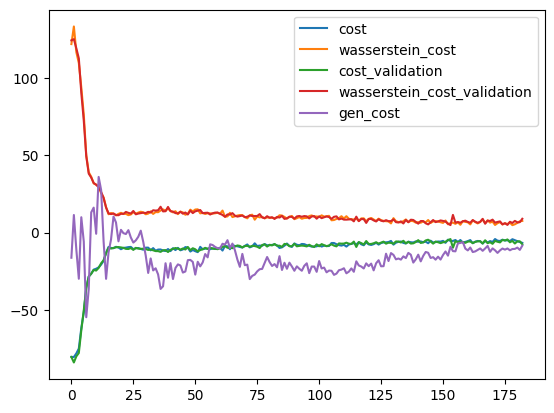

2023-12-30 16:00:09,307 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:00:13,031 - g4gan - INFO - D_self: 249.69
INFO:g4gan:D_self: 249.69
2023-12-30 16:00:13,035 - g4gan - INFO - D_train: 248.61
INFO:g4gan:D_train: 248.61


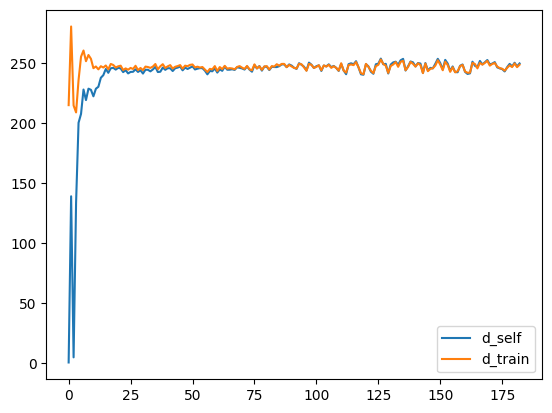

2023-12-30 16:00:13,348 - g4gan - INFO - Epoch: 184/200
INFO:g4gan:Epoch: 184/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:00:42,702 - g4gan - INFO - {'discriminator': [{'cost': -3.6421618461608887,
                    'cost_validation': -4.488500118255615,
                    'wasserstein_cost': 4.345227241516113,
                    'wasserstein_cost_validation': 5.2018280029296875},
                   {'cost': -3.806079149246216,
                    'cost_validation': -4.263347625732422,
                    'wasserstein_cost': 4.494959831237793,
                    'wasserstein_cost_validation': 4.717081069946289},
                   {'cost': -5.090874671936035,
                    'cost_validation': -3.860480308532715,
                    'wasserstein_cost': 5.953859329223633,
                    'was

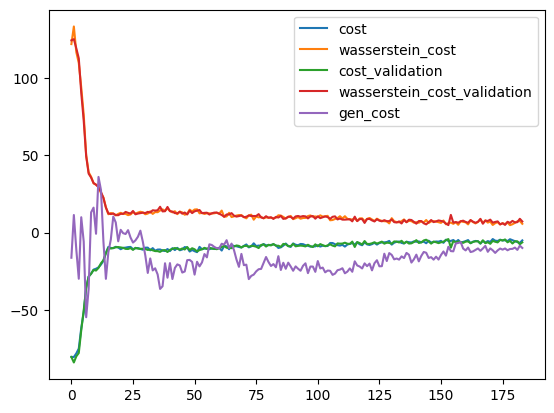

2023-12-30 16:00:42,988 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:00:45,558 - g4gan - INFO - D_self: 241.82
INFO:g4gan:D_self: 241.82
2023-12-30 16:00:45,563 - g4gan - INFO - D_train: 242.05
INFO:g4gan:D_train: 242.05


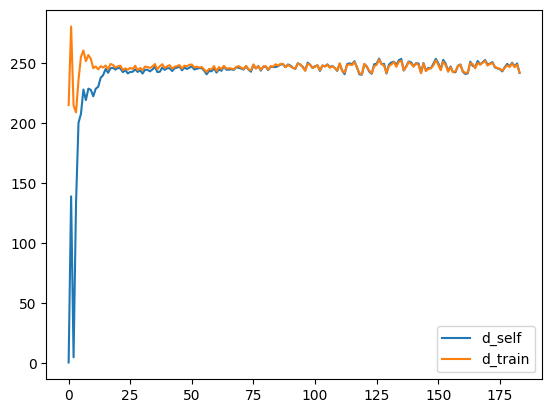

2023-12-30 16:00:45,881 - g4gan - INFO - Epoch: 185/200
INFO:g4gan:Epoch: 185/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:01:15,237 - g4gan - INFO - {'discriminator': [{'cost': -3.8901190757751465,
                    'cost_validation': -4.869494438171387,
                    'wasserstein_cost': 4.620275497436523,
                    'wasserstein_cost_validation': 5.882913589477539},
                   {'cost': -4.428022384643555,
                    'cost_validation': -4.514269828796387,
                    'wasserstein_cost': 5.17692756652832,
                    'wasserstein_cost_validation': 5.3361358642578125},
                   {'cost': -4.161041259765625,
                    'cost_validation': -4.9733123779296875,
                    'wasserstein_cost': 5.03324031829834,
                    'wass

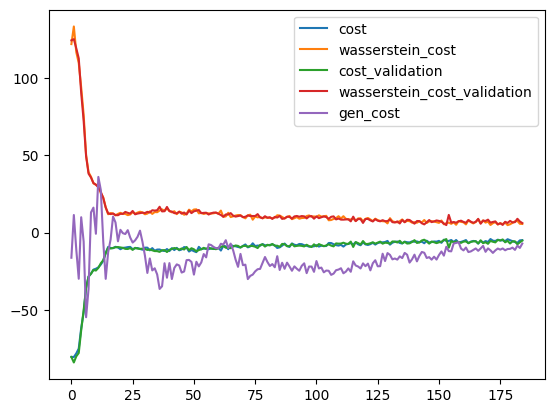

2023-12-30 16:01:15,513 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:01:18,082 - g4gan - INFO - D_self: 249.87
INFO:g4gan:D_self: 249.87
2023-12-30 16:01:18,087 - g4gan - INFO - D_train: 248.91
INFO:g4gan:D_train: 248.91


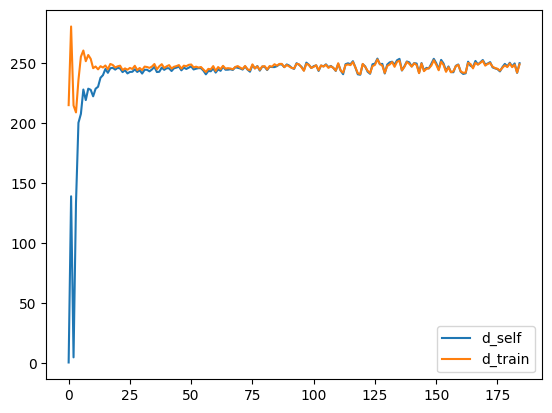

2023-12-30 16:01:18,820 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 16:01:18,827 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 16:01:18,930 - g4gan - INFO - Epoch: 186/200
INFO:g4gan:Epoch: 186/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   A   T   G   T   G   C   C   T  ...   A   A   G   T   G   C   G   
1    A   C   T   T   G   C   G   T   A   G  ...   C   A   C   T   C   A   C   
2    G   T   C   A   G   C   G   G   T   G  ...   A   A   G   T   T   C   T   
3    C   G   C   G   A   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   T   C   T   A   C   A   G  ...   G   A   C   A   G   G   A   
5    A   A   G   T   G   A   G   A   T   C  ...   C   T   G   C   C   G   T   
6    C   T   C   A   C   G   G   C   C   A  ...   G   C   C   G   G   G   G   
7    A   G   G   G   C   G   T   G   T   C  ...   G   G   G   G   C   A   C   
8    C   T   C   T   C   G   C   G   C   T  ...   T   C   T   C   A   A   A   
9    G   G   C   G   G   G   A   G   T   T  ...   A   C   T   T   T   T   G   
10   G   T   G   C   A   C   T   C   G   A  ...   A   T   C   C   A   C   C   
11   T   T   C   C   T   G   T   G   G   A  ...   T 

2023-12-30 16:01:48,396 - g4gan - INFO - {'discriminator': [{'cost': -4.297275066375732,
                    'cost_validation': -5.058324337005615,
                    'wasserstein_cost': 4.890948295593262,
                    'wasserstein_cost_validation': 6.099645614624023},
                   {'cost': -4.7851386070251465,
                    'cost_validation': -5.163488388061523,
                    'wasserstein_cost': 5.482283592224121,
                    'wasserstein_cost_validation': 5.7844133377075195},
                   {'cost': -6.307797908782959,
                    'cost_validation': -5.0672430992126465,
                    'wasserstein_cost': 6.992785453796387,
                    'wasserstein_cost_validation': 6.052104949951172},
                   {'cost': -4.457652568817139,
                    'cost_validation': -5.29570198059082,
                    'wasserstein_cost': 4.984281539916992,
                    'wasserstein_cost_validation': 6.038105010986328},
         

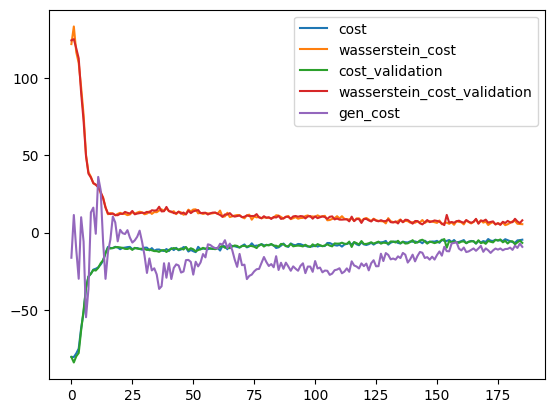

2023-12-30 16:01:48,671 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:01:51,856 - g4gan - INFO - D_self: 244.9
INFO:g4gan:D_self: 244.9
2023-12-30 16:01:51,865 - g4gan - INFO - D_train: 244.8
INFO:g4gan:D_train: 244.8


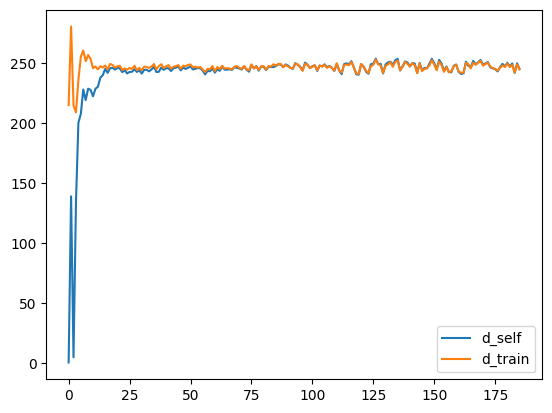

2023-12-30 16:01:52,240 - g4gan - INFO - Epoch: 187/200
INFO:g4gan:Epoch: 187/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:02:21,793 - g4gan - INFO - {'discriminator': [{'cost': -4.566549301147461,
                    'cost_validation': -3.442662239074707,
                    'wasserstein_cost': 5.885837554931641,
                    'wasserstein_cost_validation': 4.227667808532715},
                   {'cost': -3.5829944610595703,
                    'cost_validation': -4.883795261383057,
                    'wasserstein_cost': 4.3822784423828125,
                    'wasserstein_cost_validation': 5.771874904632568},
                   {'cost': -6.03928279876709,
                    'cost_validation': -4.996366500854492,
                    'wasserstein_cost': 6.837754249572754,
                    'wass

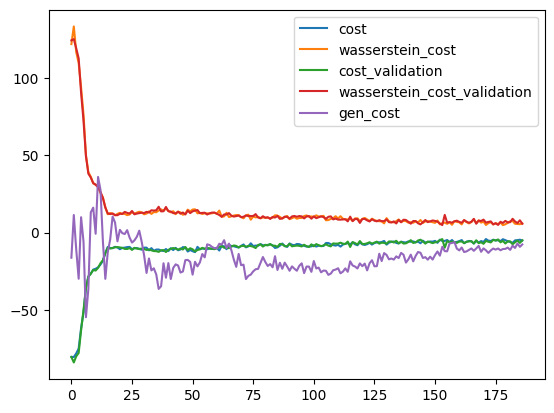

2023-12-30 16:02:22,182 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:02:26,074 - g4gan - INFO - D_self: 247.9
INFO:g4gan:D_self: 247.9
2023-12-30 16:02:26,079 - g4gan - INFO - D_train: 246.59
INFO:g4gan:D_train: 246.59


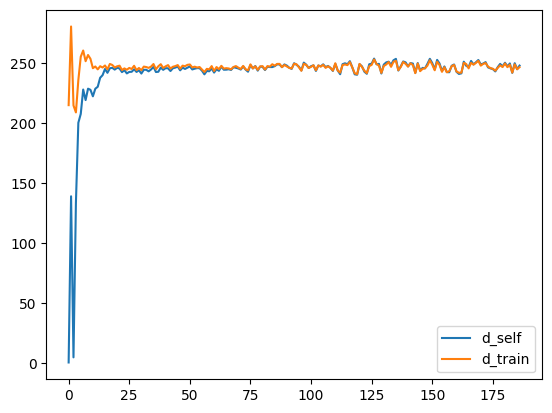

2023-12-30 16:02:26,425 - g4gan - INFO - Epoch: 188/200
INFO:g4gan:Epoch: 188/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:02:55,900 - g4gan - INFO - {'discriminator': [{'cost': -3.5229055881500244,
                    'cost_validation': -3.843111753463745,
                    'wasserstein_cost': 4.5897932052612305,
                    'wasserstein_cost_validation': 4.847807884216309},
                   {'cost': -4.780274391174316,
                    'cost_validation': -5.193687438964844,
                    'wasserstein_cost': 5.6185078620910645,
                    'wasserstein_cost_validation': 6.080883026123047},
                   {'cost': -4.773641109466553,
                    'cost_validation': -4.61050271987915,
                    'wasserstein_cost': 5.562085151672363,
                    'was

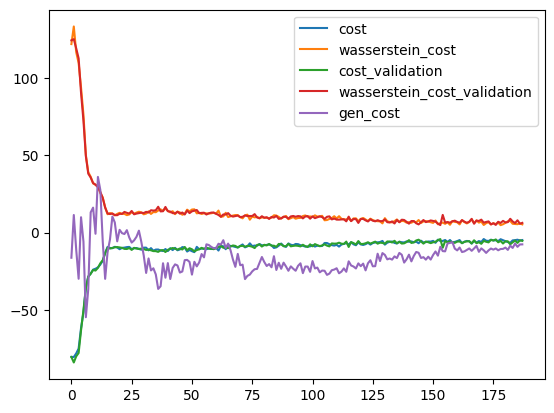

2023-12-30 16:02:56,313 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:03:00,012 - g4gan - INFO - D_self: 247.11
INFO:g4gan:D_self: 247.11
2023-12-30 16:03:00,016 - g4gan - INFO - D_train: 245.9
INFO:g4gan:D_train: 245.9


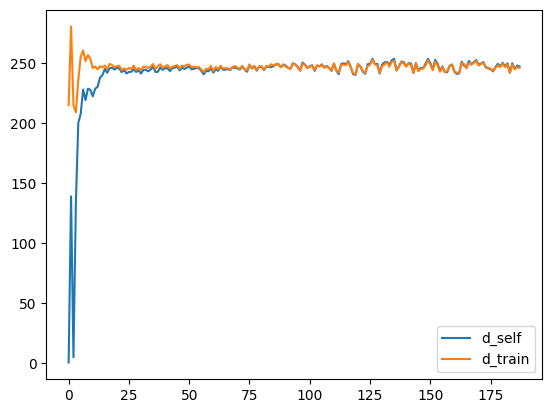

2023-12-30 16:03:00,332 - g4gan - INFO - Epoch: 189/200
INFO:g4gan:Epoch: 189/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:03:29,782 - g4gan - INFO - {'discriminator': [{'cost': -7.099954605102539,
                    'cost_validation': -5.266068458557129,
                    'wasserstein_cost': 7.815495491027832,
                    'wasserstein_cost_validation': 6.2281622886657715},
                   {'cost': -4.577784538269043,
                    'cost_validation': -4.501309394836426,
                    'wasserstein_cost': 5.6482133865356445,
                    'wasserstein_cost_validation': 5.299674987792969},
                   {'cost': -5.490211486816406,
                    'cost_validation': -4.398683071136475,
                    'wasserstein_cost': 6.303951263427734,
                    'was

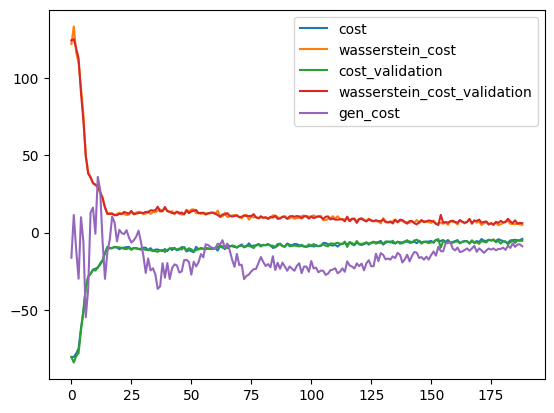

2023-12-30 16:03:30,081 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:03:32,670 - g4gan - INFO - D_self: 247.47
INFO:g4gan:D_self: 247.47
2023-12-30 16:03:32,674 - g4gan - INFO - D_train: 246.45
INFO:g4gan:D_train: 246.45


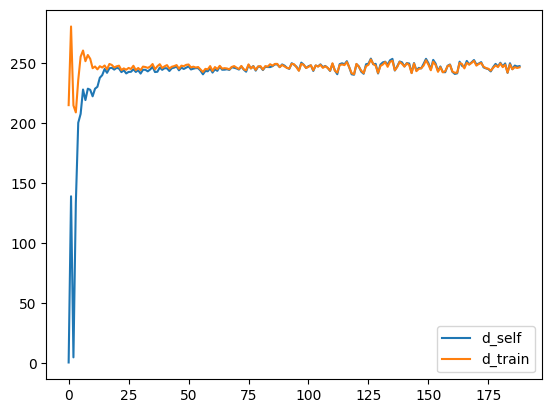

2023-12-30 16:03:32,967 - g4gan - INFO - Epoch: 190/200
INFO:g4gan:Epoch: 190/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:04:02,552 - g4gan - INFO - {'discriminator': [{'cost': -4.500746726989746,
                    'cost_validation': -5.080842018127441,
                    'wasserstein_cost': 5.506067276000977,
                    'wasserstein_cost_validation': 5.924234390258789},
                   {'cost': -4.172123908996582,
                    'cost_validation': -4.895814895629883,
                    'wasserstein_cost': 4.893052101135254,
                    'wasserstein_cost_validation': 5.895962715148926},
                   {'cost': -4.411509990692139,
                    'cost_validation': -6.039667129516602,
                    'wasserstein_cost': 5.161165237426758,
                    'wasse

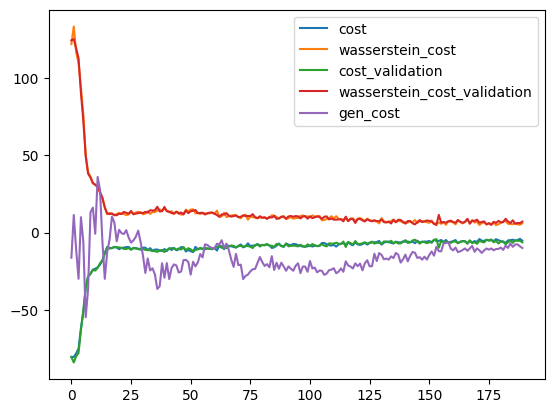

2023-12-30 16:04:02,839 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:04:05,482 - g4gan - INFO - D_self: 246.87
INFO:g4gan:D_self: 246.87
2023-12-30 16:04:05,486 - g4gan - INFO - D_train: 245.22
INFO:g4gan:D_train: 245.22


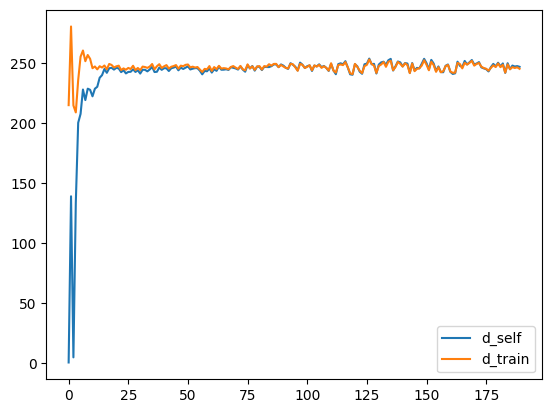

2023-12-30 16:04:05,794 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 16:04:05,803 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 16:04:05,890 - g4gan - INFO - Epoch: 191/200
INFO:g4gan:Epoch: 191/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   T   A   T   G   T   G   C   C   T  ...   A   A   G   T   G   C   G   
1    A   C   T   T   G   C   G   T   A   G  ...   C   A   C   A   C   A   C   
2    G   T   C   A   G   C   G   C   A   C  ...   A   A   G   T   T   C   T   
3    C   G   G   G   A   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   A   G   A   A   C   A   G  ...   G   A   C   A   C   G   A   
5    A   A   G   T   G   A   G   T   G   C  ...   C   T   G   C   C   G   T   
6    C   T   C   A   C   G   G   C   C   A  ...   G   C   C   G   C   C   G   
7    A   G   G   G   C   G   T   G   T   C  ...   G   G   G   G   C   A   C   
8    C   T   C   T   C   G   C   G   C   G  ...   T   C   T   C   T   A   A   
9    G   G   C   G   G   G   A   G   T   T  ...   A   C   T   T   G   A   G   
10   G   T   G   C   T   C   T   C   G   A  ...   A   T   C   C   A   C   C   
11   G   T   C   C   T   G   T   G   G   A  ...   T 

2023-12-30 16:04:35,623 - g4gan - INFO - {'discriminator': [{'cost': -4.490206241607666,
                    'cost_validation': -5.222886562347412,
                    'wasserstein_cost': 5.142082214355469,
                    'wasserstein_cost_validation': 6.332223892211914},
                   {'cost': -5.324342727661133,
                    'cost_validation': -4.65569543838501,
                    'wasserstein_cost': 6.293735504150391,
                    'wasserstein_cost_validation': 5.75784969329834},
                   {'cost': -4.142333507537842,
                    'cost_validation': -3.6792829036712646,
                    'wasserstein_cost': 5.146546363830566,
                    'wasserstein_cost_validation': 4.327775955200195},
                   {'cost': -4.885831832885742,
                    'cost_validation': -5.006528854370117,
                    'wasserstein_cost': 5.916961669921875,
                    'wasserstein_cost_validation': 5.866486549377441},
            

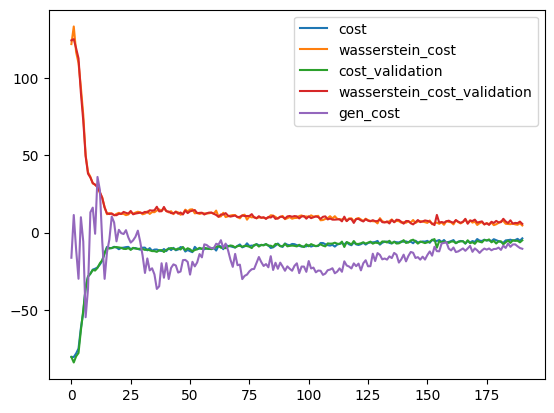

2023-12-30 16:04:35,964 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:04:38,954 - g4gan - INFO - D_self: 247.86
INFO:g4gan:D_self: 247.86
2023-12-30 16:04:38,958 - g4gan - INFO - D_train: 246.37
INFO:g4gan:D_train: 246.37


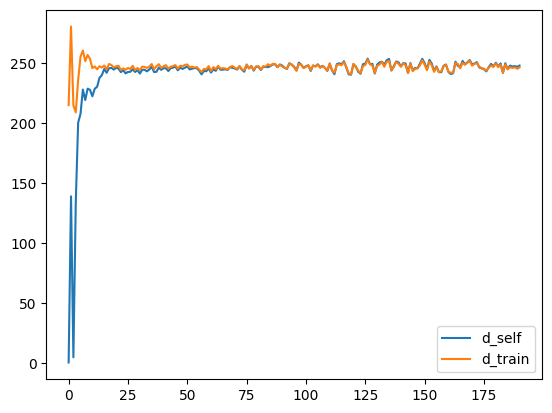

2023-12-30 16:04:39,338 - g4gan - INFO - Epoch: 192/200
INFO:g4gan:Epoch: 192/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:05:09,219 - g4gan - INFO - {'discriminator': [{'cost': -4.222059726715088,
                    'cost_validation': -4.456693649291992,
                    'wasserstein_cost': 5.053494453430176,
                    'wasserstein_cost_validation': 5.334237098693848},
                   {'cost': -4.719179630279541,
                    'cost_validation': -5.08935546875,
                    'wasserstein_cost': 5.515810012817383,
                    'wasserstein_cost_validation': 5.997817039489746},
                   {'cost': -6.716702938079834,
                    'cost_validation': -4.857544898986816,
                    'wasserstein_cost': 8.131939888000488,
                    'wasserste

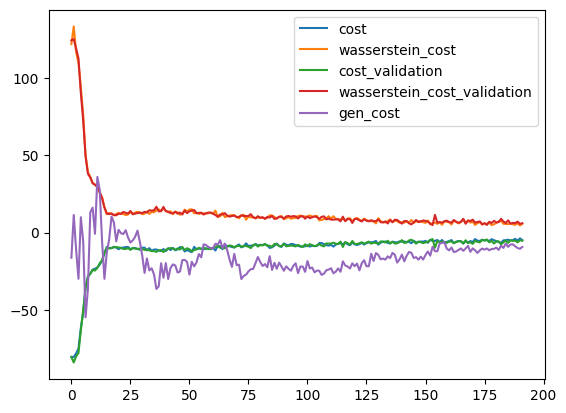

2023-12-30 16:05:09,600 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:05:13,763 - g4gan - INFO - D_self: 246.13
INFO:g4gan:D_self: 246.13
2023-12-30 16:05:13,768 - g4gan - INFO - D_train: 245.44
INFO:g4gan:D_train: 245.44


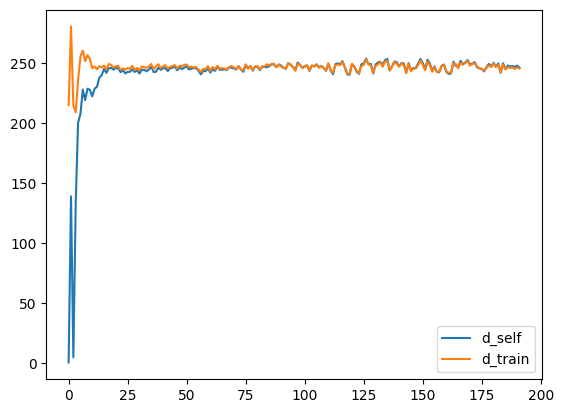

2023-12-30 16:05:14,124 - g4gan - INFO - Epoch: 193/200
INFO:g4gan:Epoch: 193/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:05:44,393 - g4gan - INFO - {'discriminator': [{'cost': -4.214598655700684,
                    'cost_validation': -4.580137729644775,
                    'wasserstein_cost': 5.046104431152344,
                    'wasserstein_cost_validation': 5.334507942199707},
                   {'cost': -4.439801216125488,
                    'cost_validation': -3.8728275299072266,
                    'wasserstein_cost': 5.378147125244141,
                    'wasserstein_cost_validation': 4.414482116699219},
                   {'cost': -5.721378326416016,
                    'cost_validation': -5.038219451904297,
                    'wasserstein_cost': 7.063375473022461,
                    'wass

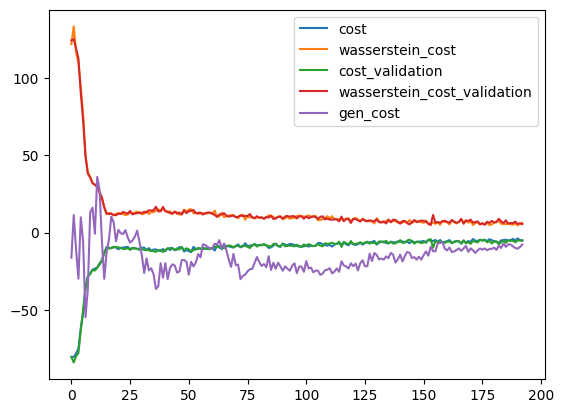

2023-12-30 16:05:44,816 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:05:48,929 - g4gan - INFO - D_self: 246.07
INFO:g4gan:D_self: 246.07
2023-12-30 16:05:48,933 - g4gan - INFO - D_train: 245.52
INFO:g4gan:D_train: 245.52


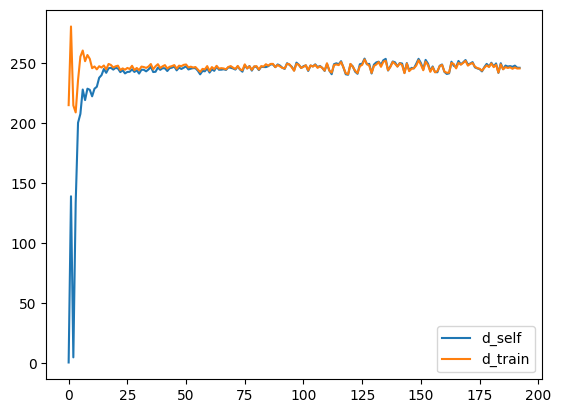

2023-12-30 16:05:49,313 - g4gan - INFO - Epoch: 194/200
INFO:g4gan:Epoch: 194/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:06:19,048 - g4gan - INFO - {'discriminator': [{'cost': -3.9675846099853516,
                    'cost_validation': -4.405725955963135,
                    'wasserstein_cost': 4.680666923522949,
                    'wasserstein_cost_validation': 5.362462997436523},
                   {'cost': -4.322915554046631,
                    'cost_validation': -4.709458351135254,
                    'wasserstein_cost': 5.0752410888671875,
                    'wasserstein_cost_validation': 5.859775543212891},
                   {'cost': -4.711251735687256,
                    'cost_validation': -4.7569427490234375,
                    'wasserstein_cost': 5.821952819824219,
                    'wa

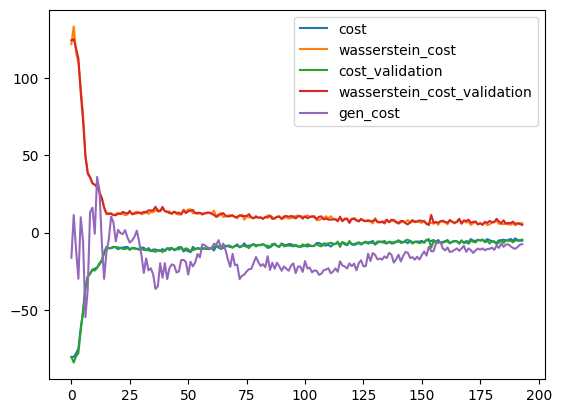

2023-12-30 16:06:19,403 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:06:22,012 - g4gan - INFO - D_self: 246.49
INFO:g4gan:D_self: 246.49
2023-12-30 16:06:22,016 - g4gan - INFO - D_train: 246.01
INFO:g4gan:D_train: 246.01


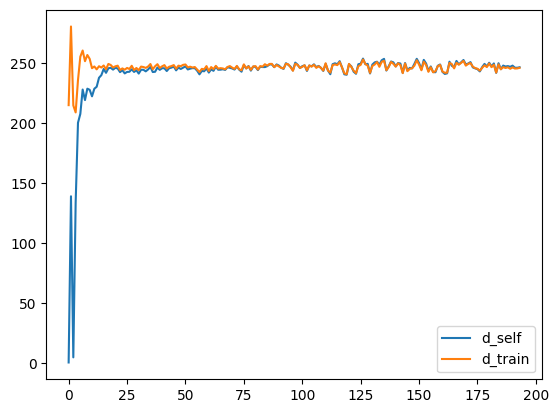

2023-12-30 16:06:22,281 - g4gan - INFO - Epoch: 195/200
INFO:g4gan:Epoch: 195/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:06:51,953 - g4gan - INFO - {'discriminator': [{'cost': -4.450074672698975,
                    'cost_validation': -3.7519171237945557,
                    'wasserstein_cost': 5.657724380493164,
                    'wasserstein_cost_validation': 4.734851837158203},
                   {'cost': -3.872993230819702,
                    'cost_validation': -5.057178974151611,
                    'wasserstein_cost': 4.757282257080078,
                    'wasserstein_cost_validation': 6.011492729187012},
                   {'cost': -5.20378303527832,
                    'cost_validation': -5.208690166473389,
                    'wasserstein_cost': 6.313993453979492,
                    'wasse

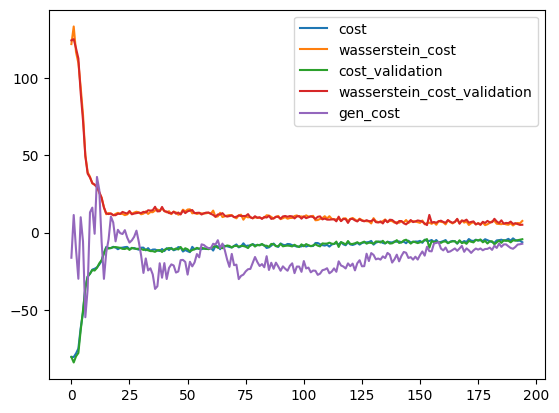

2023-12-30 16:06:52,302 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:06:54,936 - g4gan - INFO - D_self: 247.76
INFO:g4gan:D_self: 247.76
2023-12-30 16:06:54,940 - g4gan - INFO - D_train: 247.9
INFO:g4gan:D_train: 247.9


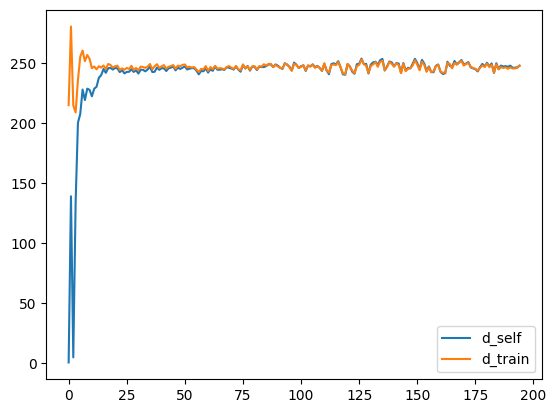

2023-12-30 16:06:55,229 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 16:06:55,239 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
2023-12-30 16:06:55,329 - g4gan - INFO - Epoch: 196/200
INFO:g4gan:Epoch: 196/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen


   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   A   A   T   T   T   G   C   C   T  ...   A   A   G   T   G   C   G   
1    A   C   T   A   G   C   G   A   A   G  ...   C   A   C   A   C   A   C   
2    G   T   C   A   G   G   G   G   A   G  ...   A   A   G   T   T   C   T   
3    C   G   G   G   A   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   A   G   A   A   C   A   G  ...   G   A   C   A   C   G   A   
5    A   A   G   T   G   A   G   A   T   C  ...   C   T   G   C   C   G   T   
6    C   T   C   A   C   G   G   C   C   A  ...   G   C   C   G   C   G   G   
7    A   G   G   G   C   G   A   G   T   C  ...   G   G   G   G   C   A   C   
8    C   T   C   T   C   G   G   G   C   G  ...   A   C   T   C   A   A   A   
9    G   G   C   G   G   A   A   G   A   T  ...   A   C   T   G   T   A   G   
10   G   A   G   C   A   C   A   G   G   A  ...   A   T   C   C   A   G   C   
11   G   T   C   C   T   G   T   G   G   A  ...   A 

2023-12-30 16:07:25,174 - g4gan - INFO - {'discriminator': [{'cost': -4.609992027282715,
                    'cost_validation': -3.344853401184082,
                    'wasserstein_cost': 5.394980430603027,
                    'wasserstein_cost_validation': 3.9032058715820312},
                   {'cost': -4.1428117752075195,
                    'cost_validation': -4.804556846618652,
                    'wasserstein_cost': 4.683768272399902,
                    'wasserstein_cost_validation': 5.722292423248291},
                   {'cost': -4.518368721008301,
                    'cost_validation': -5.2390265464782715,
                    'wasserstein_cost': 5.153475761413574,
                    'wasserstein_cost_validation': 6.100523948669434},
                   {'cost': -4.709603786468506,
                    'cost_validation': -4.766057968139648,
                    'wasserstein_cost': 5.441922187805176,
                    'wasserstein_cost_validation': 5.524140357971191},
        

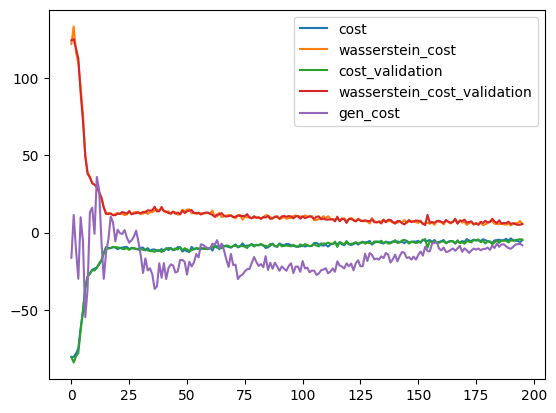

2023-12-30 16:07:25,502 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:07:28,171 - g4gan - INFO - D_self: 246.21
INFO:g4gan:D_self: 246.21
2023-12-30 16:07:28,179 - g4gan - INFO - D_train: 245.15
INFO:g4gan:D_train: 245.15


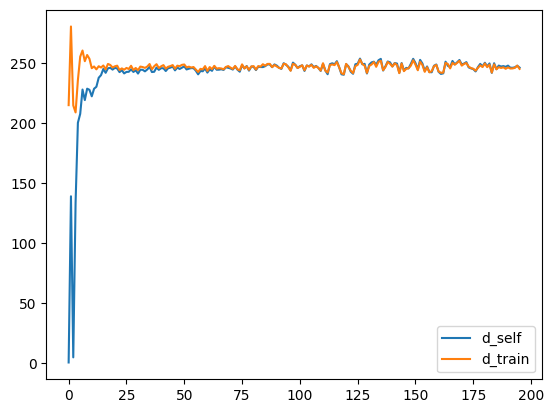

2023-12-30 16:07:28,527 - g4gan - INFO - Epoch: 197/200
INFO:g4gan:Epoch: 197/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:07:58,327 - g4gan - INFO - {'discriminator': [{'cost': -4.428452014923096,
                    'cost_validation': -3.685676097869873,
                    'wasserstein_cost': 5.697365760803223,
                    'wasserstein_cost_validation': 4.506747245788574},
                   {'cost': -4.467780113220215,
                    'cost_validation': -4.715647220611572,
                    'wasserstein_cost': 5.265748977661133,
                    'wasserstein_cost_validation': 5.4564337730407715},
                   {'cost': -3.9894628524780273,
                    'cost_validation': -5.209750652313232,
                    'wasserstein_cost': 4.892856597900391,
                    'was

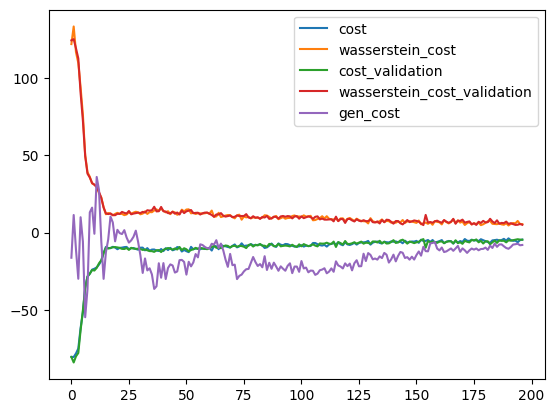

2023-12-30 16:07:58,656 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:08:02,698 - g4gan - INFO - D_self: 250.97
INFO:g4gan:D_self: 250.97
2023-12-30 16:08:02,706 - g4gan - INFO - D_train: 250.09
INFO:g4gan:D_train: 250.09


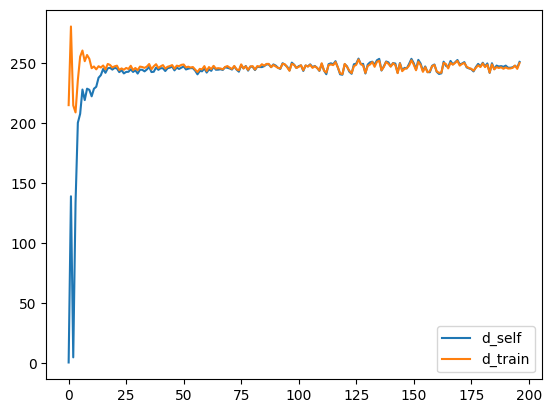

2023-12-30 16:08:03,070 - g4gan - INFO - Epoch: 198/200
INFO:g4gan:Epoch: 198/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:08:32,674 - g4gan - INFO - {'discriminator': [{'cost': -5.429357528686523,
                    'cost_validation': -4.7931647300720215,
                    'wasserstein_cost': 6.578740119934082,
                    'wasserstein_cost_validation': 5.51364803314209},
                   {'cost': -4.392724514007568,
                    'cost_validation': -4.734805107116699,
                    'wasserstein_cost': 5.381448745727539,
                    'wasserstein_cost_validation': 5.614047050476074},
                   {'cost': -4.547692775726318,
                    'cost_validation': -5.000462532043457,
                    'wasserstein_cost': 5.506483554840088,
                    'wasse

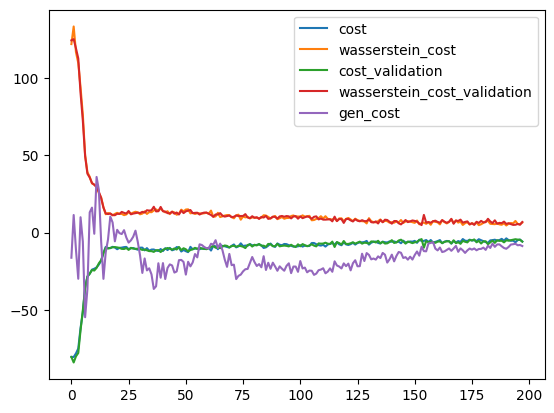

2023-12-30 16:08:32,994 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:08:37,135 - g4gan - INFO - D_self: 247.97
INFO:g4gan:D_self: 247.97
2023-12-30 16:08:37,145 - g4gan - INFO - D_train: 247.34
INFO:g4gan:D_train: 247.34


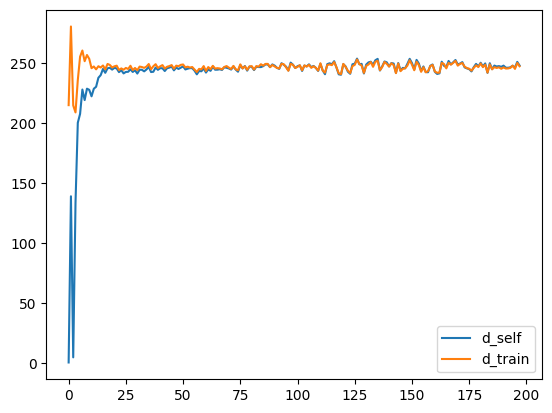

2023-12-30 16:08:37,509 - g4gan - INFO - Epoch: 199/200
INFO:g4gan:Epoch: 199/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:09:07,138 - g4gan - INFO - {'discriminator': [{'cost': -4.4967780113220215,
                    'cost_validation': -3.986095905303955,
                    'wasserstein_cost': 6.019529342651367,
                    'wasserstein_cost_validation': 5.632944107055664},
                   {'cost': -4.588934898376465,
                    'cost_validation': -3.8637943267822266,
                    'wasserstein_cost': 5.649598121643066,
                    'wasserstein_cost_validation': 4.731754302978516},
                   {'cost': -5.090348243713379,
                    'cost_validation': -5.212465286254883,
                    'wasserstein_cost': 5.9997711181640625,
                    'wa

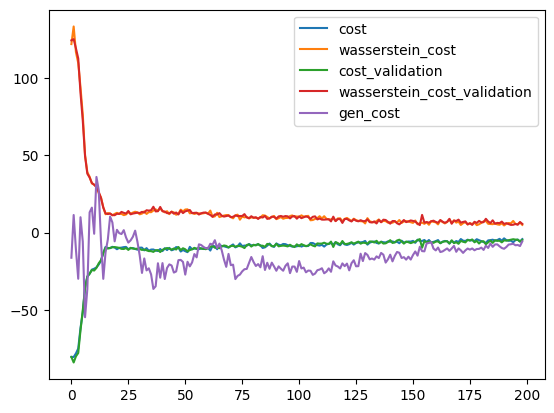

2023-12-30 16:09:07,533 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:09:10,670 - g4gan - INFO - D_self: 246.54
INFO:g4gan:D_self: 246.54
2023-12-30 16:09:10,674 - g4gan - INFO - D_train: 246.87
INFO:g4gan:D_train: 246.87


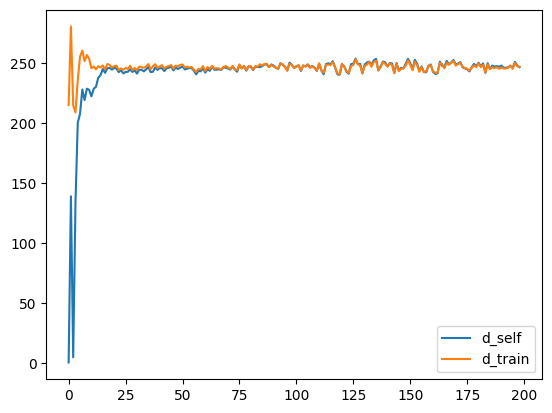

2023-12-30 16:09:11,003 - g4gan - INFO - Epoch: 200/200
INFO:g4gan:Epoch: 200/200
<ipython-input-10-6010aca23463>:114: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze model_gen
2023-12-30 16:09:40,683 - g4gan - INFO - {'discriminator': [{'cost': -4.801748275756836,
                    'cost_validation': -5.442550182342529,
                    'wasserstein_cost': 5.56031608581543,
                    'wasserstein_cost_validation': 6.493001937866211},
                   {'cost': -5.359455585479736,
                    'cost_validation': -5.304512023925781,
                    'wasserstein_cost': 6.2326250076293945,
                    'wasserstein_cost_validation': 6.310386657714844},
                   {'cost': -5.4893879890441895,
                    'cost_validation': -6.639255523681641,
                    'wasserstein_cost': 6.4423933029174805,
                    'was

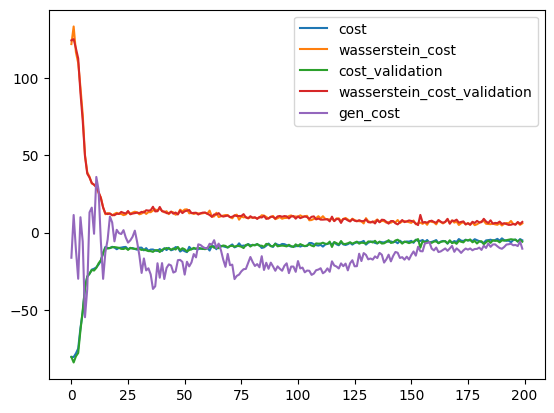

2023-12-30 16:09:41,057 - g4gan - INFO - Calculate KNN score...
INFO:g4gan:Calculate KNN score...
2023-12-30 16:09:43,674 - g4gan - INFO - D_self: 248.19
INFO:g4gan:D_self: 248.19
2023-12-30 16:09:43,678 - g4gan - INFO - D_train: 247.18
INFO:g4gan:D_train: 247.18


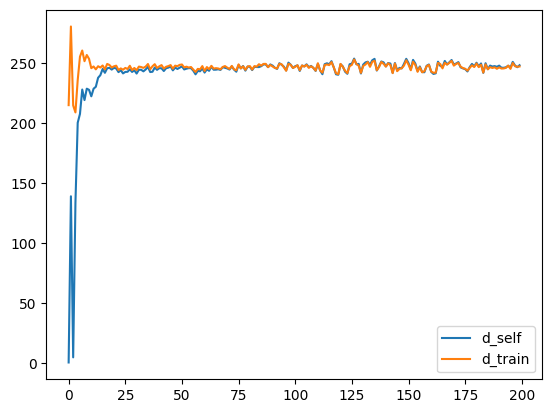

2023-12-30 16:09:43,978 - g4gan - INFO - Generating samples...
INFO:g4gan:Generating samples...
2023-12-30 16:09:43,986 - g4gan - INFO - Saving samples...
INFO:g4gan:Saving samples...
<ipython-input-10-6010aca23463>:283: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise_v = autograd.Variable(noise, volatile=True)  # totally freeze generator
2023-12-30 16:09:44,075 - g4gan - INFO - Finished training.
INFO:g4gan:Finished training.
2023-12-30 16:09:44,079 - g4gan - INFO - Final discriminator loss on validation and test:
INFO:g4gan:Final discriminator loss on validation and test:
2023-12-30 16:09:44,083 - g4gan - INFO - {'cost_test': 0,
 'cost_validation': 0,
 'wasserstein_cost_test': 0,
 'wasserstein_cost_validation': 0}
INFO:g4gan:{'cost_test': 0,
 'cost_validation': 0,
 'wasserstein_cost_test': 0,
 'wasserstein_cost_validation': 0}
2023-12-30 16:09:44,092 - g4gan - INFO - Saving models...
INFO:g4gan:Saving models...
2023-12-30 16:09:44

   0   1   2   3   4   5   6   7   8   9    ... 502 503 504 505 506 507 508  \
0    C   A   A   T   T   T   T   C   C   T  ...   A   A   G   T   G   C   G   
1    A   C   G   A   G   C   G   T   A   G  ...   C   A   C   A   C   T   C   
2    G   T   C   A   G   C   G   C   T   C  ...   A   A   G   T   T   C   T   
3    C   G   C   G   A   G   C   C   C   C  ...   T   C   C   C   A   G   T   
4    G   A   A   T   C   T   A   C   A   G  ...   G   A   C   T   C   G   A   
5    A   A   G   T   G   A   G   T   T   C  ...   C   T   G   C   C   G   T   
6    C   T   C   A   C   G   G   C   C   A  ...   G   C   C   G   C   G   G   
7    A   G   G   G   C   G   T   G   T   C  ...   G   G   G   G   C   A   C   
8    C   T   C   T   C   G   G   G   C   T  ...   A   C   T   C   A   A   A   
9    G   G   C   G   G   A   A   G   A   T  ...   A   C   T   T   T   A   G   
10   G   A   G   C   A   C   A   C   G   A  ...   A   T   C   C   A   C   C   
11   T   T   C   C   T   G   T   G   G   A  ...   T 

2023-12-30 16:09:44,315 - g4gan - INFO - Done!
INFO:g4gan:Done!


In [ ]:
# # Train
# path = 'G4_Chip_seq_quadruplex_norm_quad_labeled.npy'
# channels = 6
# last_channel_is_prob = True
path = "/content/WuKou_zdna2016_filter-norm_to_512.npy"
channels = 5
last_channel_is_prob = False
args = {}
args['verbose'] = True
args['batches_per_epoch'] = 109
args['batch_size'] = 64
args['latent_dim'] = 128
args['ngpus'] = 1
args['model_size'] = 32
args['output_dir'] = 'models/'
args['g4_np_data_path'] = path
args['valid_ratio'] = 0.1
args['test_ratio'] = 0.1
args['shuffle_train_each_epoch'] = True
args['post_proc_filt_len'] = None
args['alpha'] = 0.2
args['shift_factor'] = 2
args['batch_shuffle'] = False
args['num_epochs'] = 200
args['learning_rate'] = 1e-4
args['beta1'] = 0.5
args['beta2'] = 0.9
args['lmbda'] = 10.0
args['discriminator_updates'] = 5
args['epochs_per_sample'] = 5
args['sample_size'] = 20
args['num_channels'] = channels
args['use_knn_score'] = True
args['knn_score_sample_size'] = 100
args['use_binary_mask'] = False
args['start_p_mask'] = 0.3
args['mask_end_epoch'] = 90
args['last_channel_is_prob'] = last_channel_is_prob
init_console_logger(LOGGER, args['verbose'])
LOGGER.info('Initialized logger.')
batch_size = args['batch_size']
latent_dim = args['latent_dim']
ngpus = args['ngpus']
model_size = args['model_size']
model_dir = os.path.join(args['output_dir'],
                         datetime.datetime.now().strftime('%Y%m%d%H%M%S'
                                                          ))
args['model_dir'] = model_dir
if not args['use_knn_score']:
    args['knn_score_sample_size'] = 0
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
LOGGER.info('Saving configurations...')
config_path = os.path.join(model_dir, 'config.json')
with open(config_path, 'w') as f:
    json.dump(args, f)
LOGGER.info('Loading G4 data...')
g4_np_data_path = args['g4_np_data_path']
(train_gen, valid_gen, test_data, train_subset) = create_data_split(
    g4_np_data_path,
    args['valid_ratio'],
    args['test_ratio'],
    batch_size,
    args['shuffle_train_each_epoch'],
    args['knn_score_sample_size'],
)
LOGGER.info('Creating models...')
model_gen = WGANGenerator(args['model_size'], 512, args['num_channels'
],
                           last_channel_is_prob=args['last_channel_is_prob'
                           ])
model_dis = WGANDiscriminator(args['model_size'], 512,
                               args['num_channels'])
LOGGER.info(model_gen)
LOGGER.info(model_dis)
LOGGER.info('Starting training...')
(model_gen, model_dis, history, final_discr_metrics, samples) = \
    train_wgan(
        model_gen=model_gen,
        model_dis=model_dis,
        train_gen=train_gen,
        valid_gen=valid_gen,
        test_data=test_data,
        num_epochs=args['num_epochs'],
        batches_per_epoch=args['batches_per_epoch'],
        batch_size=batch_size,
        output_dir=model_dir,
        lr=args['learning_rate'],
        beta_1=args['beta1'],
        beta_2=args['beta2'],
        lmbda=args['lmbda'],
        use_cuda=ngpus >= 1,
        discriminator_updates=args['discriminator_updates'],
        latent_dim=latent_dim,
        epochs_per_sample=args['epochs_per_sample'],
        sample_size=args['sample_size'],

        use_knn_score=args['use_knn_score'],
        knn_score_sample_size=args['knn_score_sample_size'],
        knn_score_real_data=train_subset,
        use_binary_mask=args['use_binary_mask'],
        start_p_mask=args['start_p_mask'],
        mask_end_epoch=args['mask_end_epoch'],
        last_channel_is_prob=args['last_channel_is_prob'],
    )
LOGGER.info('Finished training.')
LOGGER.info('Final discriminator loss on validation and test:')
LOGGER.info(pprint.pformat(final_discr_metrics))
LOGGER.info('Saving models...')
model_gen_output_path = os.path.join(model_dir, 'model_gen.pkl')
model_dis_output_path = os.path.join(model_dir, 'model_dis.pkl')
torch.save(model_gen.state_dict(), model_gen_output_path,
           pickle_protocol=pk.HIGHEST_PROTOCOL)
torch.save(model_dis.state_dict(), model_dis_output_path,
           pickle_protocol=pk.HIGHEST_PROTOCOL)
LOGGER.info('Saving metrics...')
history_output_path = os.path.join(model_dir, 'history.pkl')
final_discr_metrics_output_path = os.path.join(model_dir,
                                               'final_discr_metrics.pkl')
with open(history_output_path, 'wb') as f:
    pk.dump(history, f)
with open(final_discr_metrics_output_path, 'wb') as f:
    pk.dump(final_discr_metrics, f)
LOGGER.info('Done!')

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.parallel
from torch.utils import data
import numpy as np
import torch.optim as optim
import sklearn.metrics as metrics
import matplotlib.pyplot as plt

In [ ]:
codes = {
 'A': [1., 0., 0., 0., 0.],
 'T': [0., 1., 0., 0., 0.],
 'G': [0., 0., 1., 0., 0.],
 'C': [0., 0., 0., 1., 0.],
 'N': [0., 0., 0., 0., 1.],
 }

quad_len = 100

In [ ]:
one_hot_quads = []
line_num = 0
with open("/content/drive/My Drive/data_for_gans/preprocessed_fastas/mmHDNA_filter-norm_to_500.fasta", 'r') as f:
  for line in f:
    if line[0] != '>':
      one_hot = []
      for s in line.upper():
        if s != '\n':
          one_hot.append(codes[s])
      one_hot_quads.append(one_hot)
      line_num += 1
one_hot_quads_np = np.array(one_hot_quads)
np.save('mmHDNA_filter-norm_to_500.npy', one_hot_quads_np)

In [ ]:
one_hot_quads = []
line_num = 0
with open("/content/drive/My Drive/data_for_gans/preprocessed_fastas/mmQuad_filter-norm_to_500.fasta", 'r') as f:
  for line in f:
    if line[0] != '>':
      one_hot = []
      for s in line.upper():
        if s != '\n':
          one_hot.append(codes[s])
      one_hot_quads.append(one_hot)
      line_num += 1
one_hot_quads_np = np.array(one_hot_quads)
np.save('mmQuad_filter-norm_to_500.npy', one_hot_quads_np)

In [ ]:
# one_hot_quads = []
# line_num = 0
# with open('/content/drive/My Drive/data_for_gans/preprocessed_fastas/WuKou2016_filter-norm_to_512.fasta', 'r') as f:
#   for line in f:
#     if line[0] != '>':
#       one_hot = []
#       for s in line.upper():
#         if s != '\n':
#           one_hot.append(codes[s])
#       one_hot_quads.append(one_hot)
#       line_num += 1
# one_hot_quads_np = np.array(one_hot_quads)
# np.save('WuKou2016_filter-norm_to_500.npy', one_hot_quads_np)

In [ ]:
# one_hot_quads = []
# line_num = 0
# with open('/content/drive/My Drive/data_for_gans/preprocessed_fastas/zdna2016_filter-norm_to_512.fasta', 'r') as f:
#   for line in f:
#     if line[0] != '>':
#       one_hot = []
#       for s in line.upper():
#         if s != '\n':
#           one_hot.append(codes[s])
#       one_hot_quads.append(one_hot)
#       line_num += 1
# one_hot_quads_np = np.array(one_hot_quads)
# np.save('zdna2016_filter-norm_to_500.npy', one_hot_quads_np)

In [ ]:
data1 = np.load("/content/mmHDNA_filter-norm_to_500.npy")
data2 = np.load("/content/mmQuad_filter-norm_to_500.npy")
data = np.concatenate((data1, data2), axis=0)
# dataq = np.load("/content/G4_filter-norm_to_500.npy")
# data = np.concatenate((data, dataq), axis=0)
# dataq = np.load("/content/zdna2016_filter-norm_to_500.npy")
# data = np.concatenate((data, dataq), axis=0)

In [ ]:
# saved_state_dict = torch.load('./models/20231002120536/model_gen_last.pkl')

# # Initialize a new model with the current architecture
# model_gen = G4GANGenerator(model_size, seq_len, onehot_len)
# model_gen.eval()

# # Copy the weights from the saved model to the new model
# model_gen.conv1.weight.data.copy_(saved_state_dict['conv1.weight'])
# model_gen.conv1.bias.data.copy_(saved_state_dict['conv1.bias'])

In [ ]:
weights_path = 'wgan_zdna.pkl'
model_size = 32
seq_len = 5
onehot_len = 65
hidden_state_len = 128
g4gan = load_wgan_generator(weights_path, model_size, seq_len,
                             onehot_len)
g4gan.eval()

In [ ]:
input = data

In [ ]:
input.shape[0]

1177297

In [ ]:
def sample_fake_data(generator, batch_size, hidden_state_len):
    fake_data = []
    with torch.no_grad():
        for _ in range(0, input.shape[0], batch_size):
            noise = torch.Tensor(batch_size, hidden_state_len).uniform_(-1, 1)
            fake = generator(noise)
            (values, indices_hot) = fake.max(2)
            fake[:, :, :] = 0
            indices_hot = indices_hot.view(indices_hot.shape[0], indices_hot.shape[1], 1)
            fake = fake.scatter_(2, indices_hot, 1)
            fake_data.append(fake.detach().numpy())
    return np.concatenate(fake_data, axis=0)

In [ ]:
batch_size = 1000

fake_samples = sample_fake_data(g4gan, batch_size, hidden_state_len)

In [ ]:
with torch.no_grad():
    noise = torch.Tensor(input.shape[0], hidden_state_len).uniform_(-1, 1)
    fake = g4gan(noise)
    (values, indices_hot) = fake.max(2)
    fake[:, :, :] = 0
    indices_hot = indices_hot.view(indices_hot.shape[0], indices_hot.shape[1], 1)
    fake = fake.scatter_(2, indices_hot, 1)
    input_fake = fake.detach().numpy()

# num_g4 = input.shape[0]
# num_test = int(np.ceil(num_g4 * test_ratio))
# num_train = num_g4 - num_test
# indices = np.arange(num_g4)
# np.random.shuffle(indices)
# train_data_indices = indices[:num_train]
# test_data_indices = indices[num_train:]

In [ ]:
fake_samples.shape

(1178000, 512, 5)

In [ ]:
new_data = fake_samples[:, :100, :5]

# Extract the cut values
cut_values = fake_samples[:, :, 5:]

In [ ]:
cut_values.reshape(-1, 1)

array([], shape=(0, 1), dtype=float32)

In [ ]:
new_data[1].shape

(100, 5)

In [ ]:
new_data.shape

(1178000, 100, 5)

In [ ]:
reverse_codes = {
    'A': [1., 0., 0., 0., 0.],
    'T': [0., 1., 0., 0., 0.],
    'G': [0., 0., 1., 0., 0.],
    'C': [0., 0., 0., 1., 0.],
    'N': [0., 0., 0., 0., 1.],
}

def decode_data(encoded_sequences):
    decoded_sequences = []

    for sequence in encoded_sequences:
        decoded_sequence = ''
        for encoding in sequence:
            for char, code in reverse_codes.items():
                if torch.equal(encoding, torch.tensor(code, dtype=torch.float64)):
                    decoded_sequence += char
                    break
        decoded_sequences.append(decoded_sequence)

    return decoded_sequences

decoded_seqs = decode_data([torch.tensor(seq, dtype=torch.float64) for seq in new_data])

decoded_seqs_np = np.array(decoded_seqs)

with open('generated_sequences.txt', 'w') as f:
    for seq in decoded_seqs:
        f.write(seq + '\n')

In [ ]:
bedWK_df = pd.read_csv('/content/drive/My Drive/data_for_gans/data/hg19_zdna/raw/WuKou16_filter_norm_to_512.bed', sep='\t', comment='t', header=None)
bed16_df = pd.read_csv('/content/drive/My Drive/data_for_gans/data/hg19_zdna/raw/zdna2016_filter_norm_to_512.bed', sep='\t', comment='t', header=None)
bedG_df = pd.read_csv('/content/drive/My Drive/data_for_gans/G4_Chip_seq_filter_norm_to_500.bed', sep='\t', comment='t', header=None)
bed = pd.read_csv('/content/HDNA_norm_to_500.bed', sep='\t', comment='t', header=None)

In [ ]:
bed1 = pd.read_csv('/content/mmHDNA_norm_to_500.bed', sep='\t', comment='t', header=None)
bed2 = pd.read_csv('/content/Quadruplex_norm_to_500.bed', sep='\t', comment='t', header=None)

In [ ]:
# un_bed_dataset = pd.concat([bedWK_df, bed16_df]).reset_index(drop=True)
# un_bed_dataset = pd.concat([un_bed_dataset, bedG_df]).reset_index(drop=True)
# un_bed_dataset = pd.concat([un_bed_dataset, bed]).reset_index(drop=True)
un_bed_dataset = pd.concat([bed1, bed2]).reset_index(drop=True)

In [ ]:
bed1.columns = ['chrom', 'chromStart', 'chromEnd']
bed2.columns = ['chrom', 'chromStart', 'chromEnd']

In [ ]:
# bed = pd.read_csv('/content/HDNA_norm_to_500.bed', sep='\t', comment='t', header=None)

In [ ]:
un_bed_dataset.columns = ['chrom', 'chromStart', 'chromEnd']

In [ ]:
un_bed_dataset.shape

(1211161, 3)

In [ ]:
df_gen_sequences = pd.DataFrame({"chrom": un_bed_dataset[:len(decoded_seqs_np)].chrom, "raw_sequence": decoded_seqs_np})

In [ ]:
df_gen_sequences_to_fasta = df_gen_sequences

In [ ]:
fasta_lines = []

for index, row in df_gen_sequences_to_fasta.iterrows():
    chrom = row['chrom']
    sequence = row['raw_sequence']

    fasta_lines.append(f'>{chrom}\n{sequence}\n')

fasta_file_path = '/content/mm_Quad+H_wgan.fasta'
with open(fasta_file_path, 'w') as fasta_file:
    fasta_file.writelines(fasta_lines)